In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import cv2
import datetime

### 데이터 로드

In [2]:
data = pd.read_csv("/home/ubuntu/drive/SAM/merged_final.csv", encoding="UTF-8")

In [3]:
cdata = data.copy()
cdata.head(3)

,Unnamed: 0,check_datetime,측정일자,구역명,farm_code,내부온도,내부습도,내부CO2,근권온도,내부순간일사량,...,bbox_image_path,before_img_name,before_img_id,mask_num,mask_id,point_x,point_y,size,color,output_image_path
0,58758,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,...,/opt/dlami/nvme/SAM_result/F0016/C101/F0016-C1...,F0016-C101-20210910-075908,283f919417b3c53b4089683ba1cf7ca2,F0016-C101-20210910-125907_0,065e7a9bdd5065fe01976ff3f4f49f03,1132.451172,554.744629,535,"[[121, 123, 112], [123, 125, 114], [118, 120, ...",image_mask_0.png
1,58758,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,...,/opt/dlami/nvme/SAM_result/F0016/C101/F0016-C1...,F0016-C101-20210910-075908,283f919417b3c53b4089683ba1cf7ca2,F0016-C101-20210910-125907_1,c8f4ef001e5f686be96b1cb1bb68f68d,880.826233,100.000298,37040,"[[54, 63, 44], [88, 97, 76], [82, 91, 70], [85...",image_mask_1.png
2,58782,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,...,/opt/dlami/nvme/SAM_result/F0016/C101/F0016-C1...,F0016-C101-20210910-125907,d45f2f28bf7fb63dda831452e8442386,F0016-C101-20210910-165907_0,065e7a9bdd5065fe01976ff3f4f49f03,1136.085205,556.137573,576,"[[70, 71, 65], [68, 69, 63], [63, 64, 58], [49...",image_mask_0.png


In [4]:
cdata.drop(["Unnamed: 0"], axis=1, inplace=True)

In [5]:
cdata.columns

Index(['check_datetime', '측정일자', '구역명', 'farm_code', '내부온도', '내부습도', '내부CO2',
       '근권온도', '내부순간일사량', '측정년도', '측정월', 'input_image_name',
       'input_image_path', 'img_id', 'area_code', 'shot_datetime',
       'count_masks', 'bbox_image_path', 'before_img_name', 'before_img_id',
       'mask_num', 'mask_id', 'point_x', 'point_y', 'size', 'color',
       'output_image_path'],
      dtype='object')

### 전처리

In [6]:
import re  
# 정규표현식 패턴
pattern = re.compile(r'\d+$')
### mask_num 전처리
for idx, mask in enumerate(cdata["mask_num"]):
  # 숫자 추출
  match = re.search(pattern, mask)
  if match:
    number = int(match.group()) + 1
    cdata.iloc[idx, 20] = re.sub(pattern, str(number), mask)

print(cdata["mask_num"])

0          F0016-C101-20210910-125907_1
1          F0016-C101-20210910-125907_2
2          F0016-C101-20210910-165907_1
3          F0016-C101-20210910-165907_2
4          F0016-C101-20210910-165907_3
                      ...              
134325    F0017-C101-20240403-084305_33
134326    F0017-C101-20240403-084305_34
134327    F0017-C101-20240403-084305_35
134328    F0017-C101-20240403-084305_36
134329    F0017-C101-20240403-084305_37
Name: mask_num, Length: 134330, dtype: object


In [7]:
### output_image_path 전처리
### 정규표현식 패턴
pattern = re.compile(r'(\d+)(?=\.\w+$)')
for idx, path in enumerate(cdata["output_image_path"]):
  # 숫자 추출
  match = re.search(pattern, path)
  if match:
    number = int(match.group()) + 1
    cdata.iloc[idx, -1] = re.sub(pattern, str(number), path)

print(cdata["output_image_path"])

0          image_mask_1.png
1          image_mask_2.png
2          image_mask_1.png
3          image_mask_2.png
4          image_mask_3.png
                ...        
134325    image_mask_33.png
134326    image_mask_34.png
134327    image_mask_35.png
134328    image_mask_36.png
134329    image_mask_37.png
Name: output_image_path, Length: 134330, dtype: object


### EDA

In [8]:
f0016 = cdata[cdata['farm_code'] == 'F0016'].reset_index()
f0016.drop(["index"], axis=1, inplace=True)

In [9]:
f0016.head(5)

,check_datetime,측정일자,구역명,farm_code,내부온도,내부습도,내부CO2,근권온도,내부순간일사량,측정년도,...,bbox_image_path,before_img_name,before_img_id,mask_num,mask_id,point_x,point_y,size,color,output_image_path
0,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,2021.0,...,/opt/dlami/nvme/SAM_result/F0016/C101/F0016-C1...,F0016-C101-20210910-075908,283f919417b3c53b4089683ba1cf7ca2,F0016-C101-20210910-125907_1,065e7a9bdd5065fe01976ff3f4f49f03,1132.451172,554.744629,535,"[[121, 123, 112], [123, 125, 114], [118, 120, ...",image_mask_1.png
1,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,2021.0,...,/opt/dlami/nvme/SAM_result/F0016/C101/F0016-C1...,F0016-C101-20210910-075908,283f919417b3c53b4089683ba1cf7ca2,F0016-C101-20210910-125907_2,c8f4ef001e5f686be96b1cb1bb68f68d,880.826233,100.000298,37040,"[[54, 63, 44], [88, 97, 76], [82, 91, 70], [85...",image_mask_2.png
2,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,/opt/dlami/nvme/SAM_result/F0016/C101/F0016-C1...,F0016-C101-20210910-125907,d45f2f28bf7fb63dda831452e8442386,F0016-C101-20210910-165907_1,065e7a9bdd5065fe01976ff3f4f49f03,1136.085205,556.137573,576,"[[70, 71, 65], [68, 69, 63], [63, 64, 58], [49...",image_mask_1.png
3,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,/opt/dlami/nvme/SAM_result/F0016/C101/F0016-C1...,F0016-C101-20210910-125907,d45f2f28bf7fb63dda831452e8442386,F0016-C101-20210910-165907_2,3cf79ada342fb0b16364c9ea6d703f9f,771.131104,102.249115,20098,"[[22, 24, 10], [27, 30, 11], [42, 45, 24], [35...",image_mask_2.png
4,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,/opt/dlami/nvme/SAM_result/F0016/C101/F0016-C1...,F0016-C101-20210910-125907,d45f2f28bf7fb63dda831452e8442386,F0016-C101-20210910-165907_3,fd48e0393a4d25876b5fb82e9571361e,902.543579,109.905945,22199,"[[97, 93, 92], [80, 79, 77], [85, 84, 80], [83...",image_mask_3.png


In [10]:
f0016.loc[:5, ["check_datetime", "input_image_name", "before_img_name"]]

,check_datetime,input_image_name,before_img_name
0,2021-09-10 13:00:00,F0016-C101-20210910-125907,F0016-C101-20210910-075908
1,2021-09-10 13:00:00,F0016-C101-20210910-125907,F0016-C101-20210910-075908
2,2021-09-10 17:00:00,F0016-C101-20210910-165907,F0016-C101-20210910-125907
3,2021-09-10 17:00:00,F0016-C101-20210910-165907,F0016-C101-20210910-125907
4,2021-09-10 17:00:00,F0016-C101-20210910-165907,F0016-C101-20210910-125907
5,2021-09-10 17:00:00,F0016-C101-20210910-165907,F0016-C101-20210910-125907


### 2022년 8월

In [16]:
### 2021년 9월에 해당하는 이미지 필터링
aug_2022 = f0016[(f0016["측정년도"] == 2022) & (f0016["측정월"] == 8)]

# 측정 일자를 datetime으로 변환
aug_2022["측정일자"] = pd.to_datetime(aug_2022["측정일자"])

# 날짜 필터링
# aug_2022 = aug_2022[(aug_2022["측정일자"].dt.weekday == 0) | (aug_2022["측정일자"].dt.weekday == 1)]

aug_2022['before_img_name'].unique()

/tmp/ipykernel_266549/586897714.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aug_2022["측정일자"] = pd.to_datetime(aug_2022["측정일자"])


array(['F0016-C101-20220826-164211', 'F0016-C101-20220827-084809',
       'F0016-C101-20220827-124713', 'F0016-C101-20220827-164758',
       'F0016-C101-20220829-084556'], dtype=object)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20220829-124522
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20220829-084556
mask_num_x                                  F0016-C101-20220829-124522_1
mask_id                                 698ef0c1d268bf4a8603f59f40148a00
point_x_x                                                     580.303894
point_y_x                                                      57.405792
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20220828-084716
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

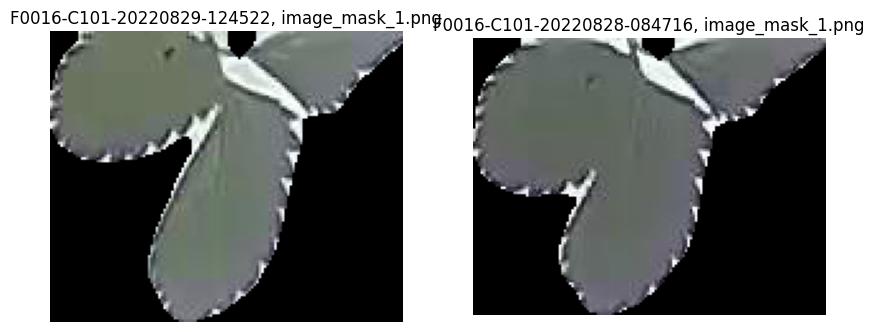

In [19]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = aug_2022[aug_2022["before_img_name"] == "F0016-C101-20220829-084556"]
aug2 = aug_2022[aug_2022["before_img_name"] == "F0016-C101-20220827-164758"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2022년 9월

In [21]:
### 2022년 9월에 해당하는 이미지 필터링
sep_2022 = f0016[(f0016["측정년도"] == 2022) & (f0016["측정월"] == 9)]

# 측정 일자를 datetime으로 변환
sep_2022["측정일자"] = pd.to_datetime(sep_2022["측정일자"])

# 날짜 필터링
sep_2022 = sep_2022[(sep_2022["측정일자"].dt.weekday == 0) | (sep_2022["측정일자"].dt.weekday == 1)]

sep_2022['before_img_name'].unique()

/tmp/ipykernel_266549/367475257.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sep_2022["측정일자"] = pd.to_datetime(sep_2022["측정일자"])


array(['F0016-C101-20220906-084248', 'F0016-C101-20220906-124347',
       'F0016-C101-20220911-164023', 'F0016-C101-20220912-084049',
       'F0016-C101-20220912-124253', 'F0016-C101-20220912-164314',
       'F0016-C101-20220913-084402', 'F0016-C101-20220913-124501',
       'F0016-C101-20220926-163827'], dtype=object)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20220913-124501
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20220913-084402
mask_num_x                                  F0016-C101-20220913-124501_2
mask_id                                 626d432a9ce347fae736971bc10669c7
point_x_x                                                     425.373108
point_y_x                                                     132.155045
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20220913-164449
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

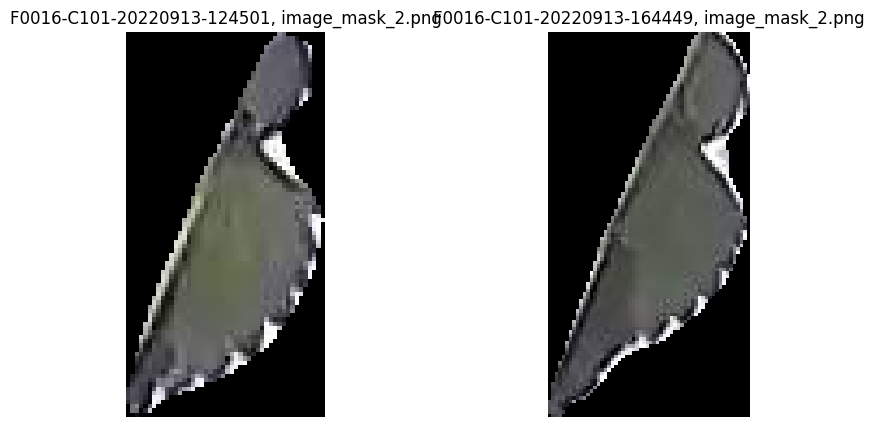

In [25]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = sep_2022[sep_2022["before_img_name"] == "F0016-C101-20220913-084402"]
aug2 = sep_2022[sep_2022["before_img_name"] == "F0016-C101-20220913-124501"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20220912-164314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20220912-124253
mask_num_x                                  F0016-C101-20220912-164314_3
mask_id                                 42a267e861f209daecb0d94faf32c1b6
point_x_x                                                      383.57074
point_y_x                                                        242.375
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20220913-084402
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

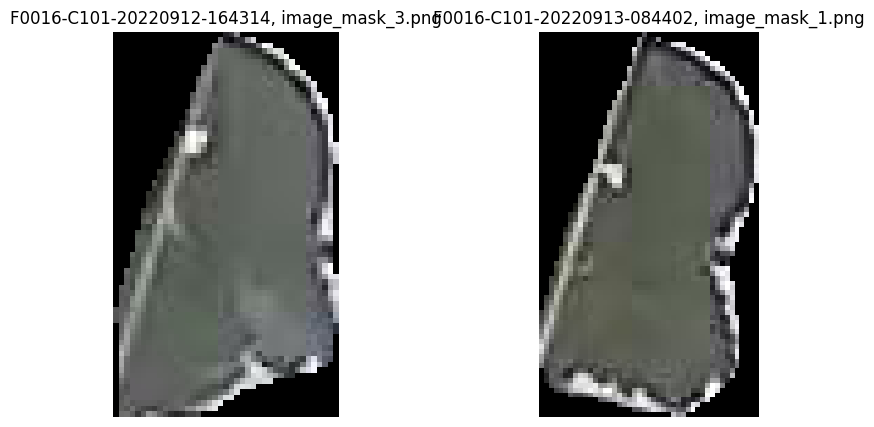

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20220912-164314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20220912-124253
mask_num_x                                  F0016-C101-20220912-164314_2
mask_id                                 710f5d17cc5f14b0e0f14f897396c40e
point_x_x                                                      575.61145
point_y_x                                                      54.398304
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20220913-084402
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

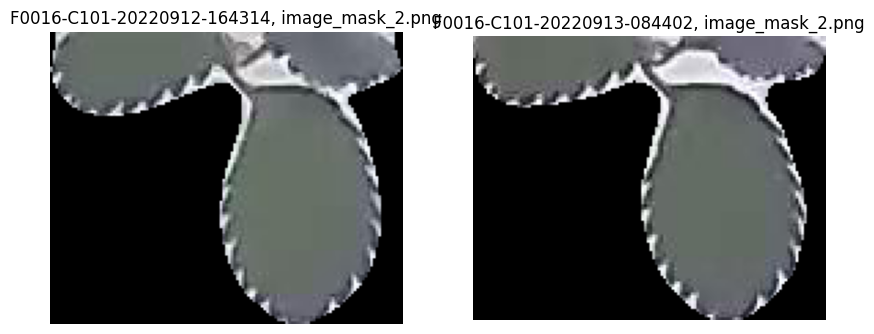

In [27]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = sep_2022[sep_2022["before_img_name"] == "F0016-C101-20220912-124253"]
aug2 = sep_2022[sep_2022["before_img_name"] == "F0016-C101-20220912-164314"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2022년 10월

In [34]:
### 2021년 9월에 해당하는 이미지 필터링
oct_2022 = f0016[(f0016["측정년도"] == 2022) & (f0016["측정월"] == 10)]

# 측정 일자를 datetime으로 변환
oct_2022["측정일자"] = pd.to_datetime(oct_2022["측정일자"])

# 날짜 필터링
oct_2022 = oct_2022[(oct_2022["측정일자"].dt.weekday == 0) | (oct_2022["측정일자"].dt.weekday == 1)]

oct_2022['before_img_name'].unique()

/tmp/ipykernel_266549/1912987842.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  oct_2022["측정일자"] = pd.to_datetime(oct_2022["측정일자"])


array(['F0016-C101-20221010-164001', 'F0016-C101-20221020-163738',
       'F0016-C101-20221024-123741', 'F0016-C101-20221024-163754',
       'F0016-C101-20221025-084012', 'F0016-C101-20221025-123922',
       'F0016-C101-20221030-163843', 'F0016-C101-20221031-083714',
       'F0016-C101-20221031-123611'], dtype=object)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221024-163754
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221024-123741
mask_num_x                                  F0016-C101-20221024-163754_1
mask_id                                 2bfa6e354738cfc22656e6518778fd49
point_x_x                                                    1639.512695
point_y_x                                                      85.362846
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221025-084012
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

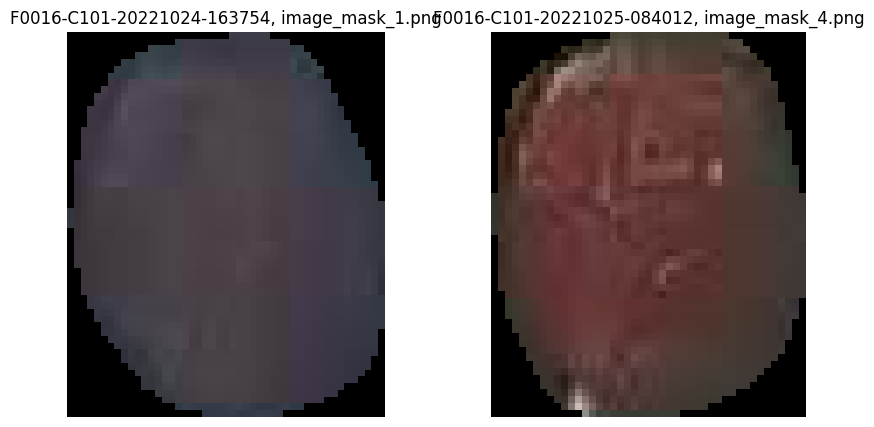

In [46]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = oct_2022[oct_2022["before_img_name"] == "F0016-C101-20221024-123741"]
aug2 = oct_2022[oct_2022["before_img_name"] == "F0016-C101-20221024-163754"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221031-083714
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221030-163843
mask_num_x                                  F0016-C101-20221031-083714_4
mask_id                                 6abb44349ccb4476a54b8efc76cc14fe
point_x_x                                                    1188.779785
point_y_x                                                     273.695557
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221031-123611
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

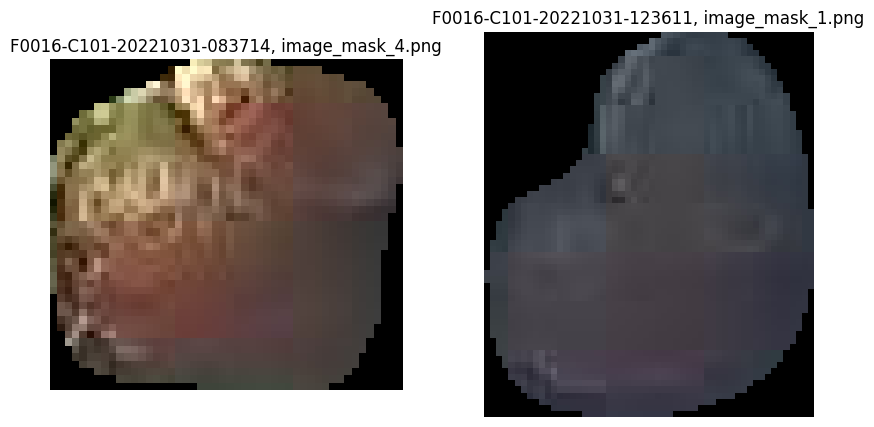

In [49]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = oct_2022[oct_2022["before_img_name"] == "F0016-C101-20221030-163843"]
aug2 = oct_2022[oct_2022["before_img_name"] == "F0016-C101-20221031-083714"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2022년 11월

In [43]:
### 2021년 9월에 해당하는 이미지 필터링
nov_2022 = f0016[(f0016["측정년도"] == 2022) & (f0016["측정월"] == 11)]

# 측정 일자를 datetime으로 변환
nov_2022["측정일자"] = pd.to_datetime(nov_2022["측정일자"])

# 날짜 필터링
nov_2022 = nov_2022[(nov_2022["측정일자"].dt.weekday == 0) | (nov_2022["측정일자"].dt.weekday == 1)]

nov_2022['before_img_name'].unique()

/tmp/ipykernel_266549/66450287.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nov_2022["측정일자"] = pd.to_datetime(nov_2022["측정일자"])


array(['F0016-C101-20221031-163737', 'F0016-C101-20221101-083913',
       'F0016-C101-20221101-123926', 'F0016-C101-20221106-163604',
       'F0016-C101-20221107-083623', 'F0016-C101-20221107-123649',
       'F0016-C101-20221107-163724', 'F0016-C101-20221108-083916',
       'F0016-C101-20221108-124027', 'F0016-C101-20221113-163946',
       'F0016-C101-20221114-084022', 'F0016-C101-20221114-123948',
       'F0016-C101-20221114-164105', 'F0016-C101-20221115-083913',
       'F0016-C101-20221115-123519', 'F0016-C101-20221120-163520',
       'F0016-C101-20221121-083606', 'F0016-C101-20221121-123644',
       'F0016-C101-20221121-163648', 'F0016-C101-20221122-083500',
       'F0016-C101-20221122-123629', 'F0016-C101-20221129-124142'],
      dtype=object)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221101-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221031-163737
mask_num_x                                  F0016-C101-20221101-083913_6
mask_id                                 067a480b75ed924d81d916362997bbfa
point_x_x                                                    1591.458252
point_y_x                                                     130.996063
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221101-123926
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

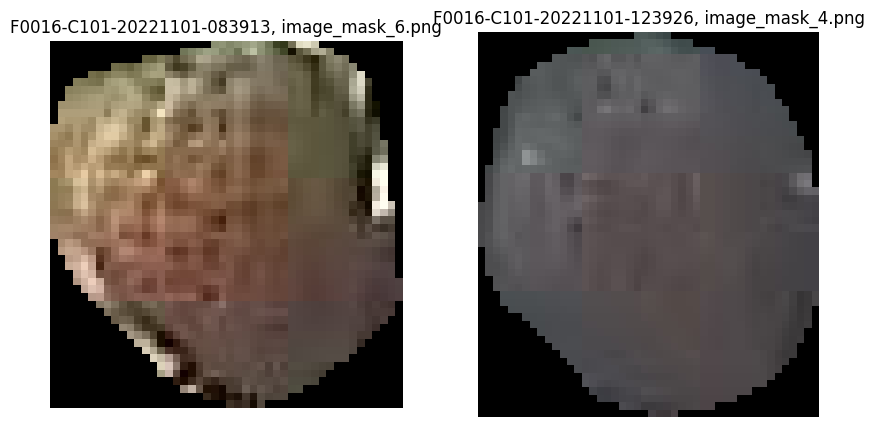

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221101-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221031-163737
mask_num_x                                  F0016-C101-20221101-083913_7
mask_id                                 91fe67bd5b5de8e8aadc8e1680493cf8
point_x_x                                                     1612.46875
point_y_x                                                     166.906021
output_image_path_x                                     image_mask_7.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221101-123926
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

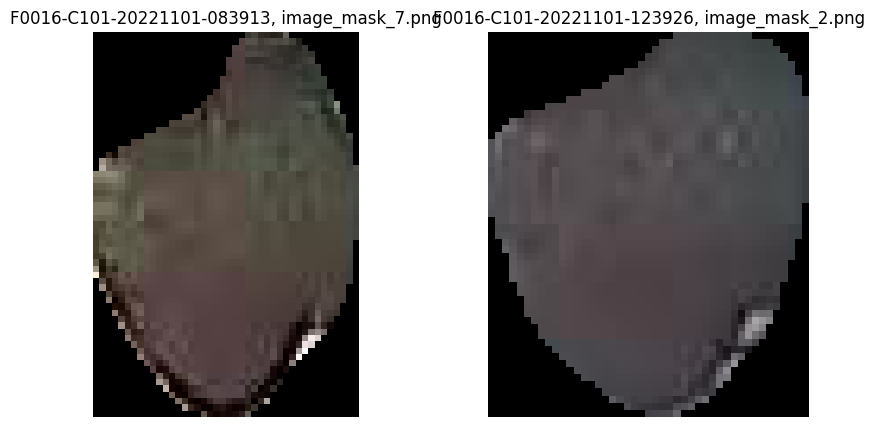

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221101-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221031-163737
mask_num_x                                  F0016-C101-20221101-083913_1
mask_id                                 f3aa3a898151acb30952974a1896fbd5
point_x_x                                                    1193.431396
point_y_x                                                     264.655701
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221101-123926
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

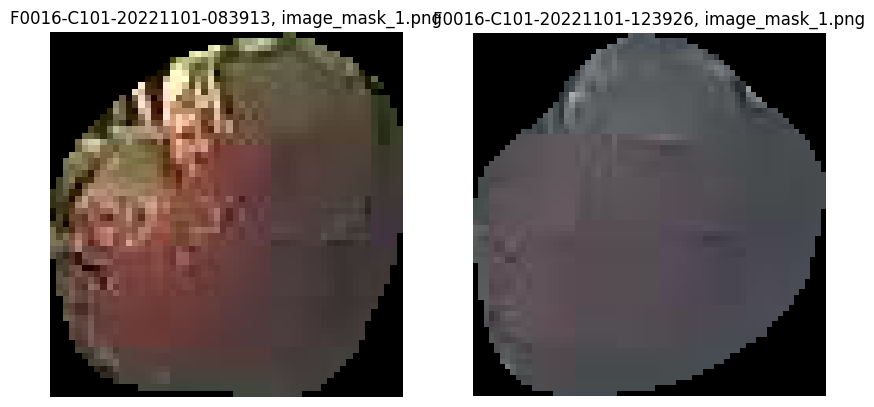

In [50]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221031-163737"]
aug2 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221101-083913"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                  F0016-C101-20221107-123649_6
mask_id                                 03d71fdc5030cb0833f679847b5d228f
point_x_x                                                    1158.502319
point_y_x                                                     303.700775
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

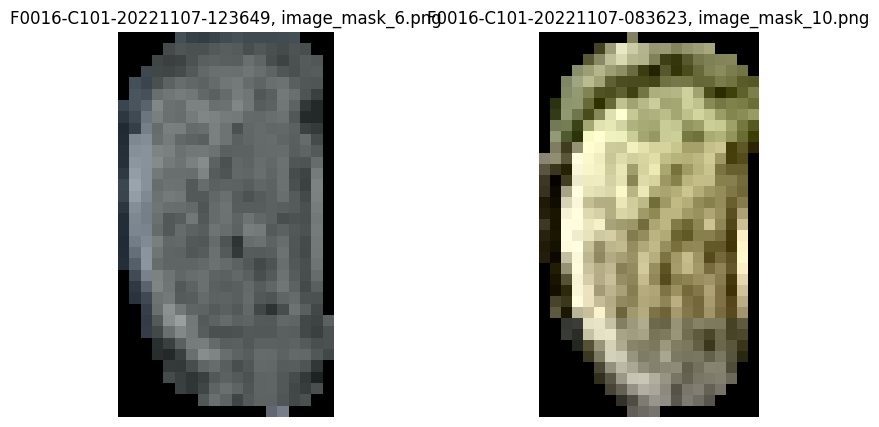

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                  F0016-C101-20221107-123649_9
mask_id                                 1b97772156a151b10e0b0e54b37048e2
point_x_x                                                    1397.249756
point_y_x                                                     188.784119
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

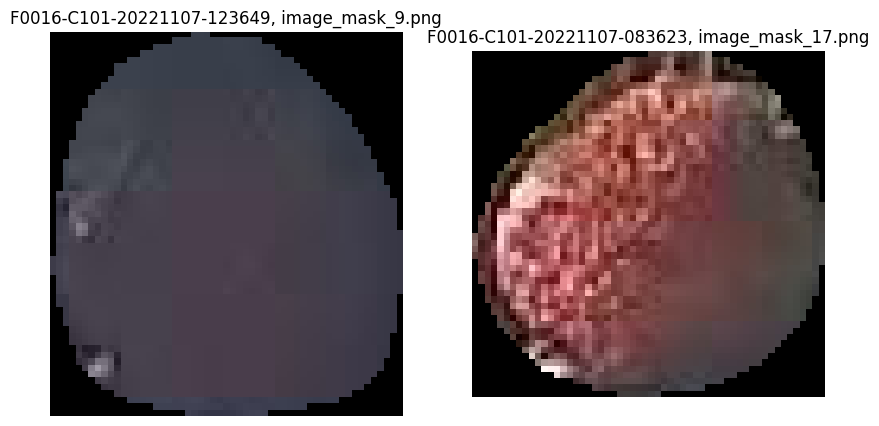

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                  F0016-C101-20221107-123649_8
mask_id                                 20ebeb7d599f9be31d6a441337da6f70
point_x_x                                                    1304.285156
point_y_x                                                     290.285645
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

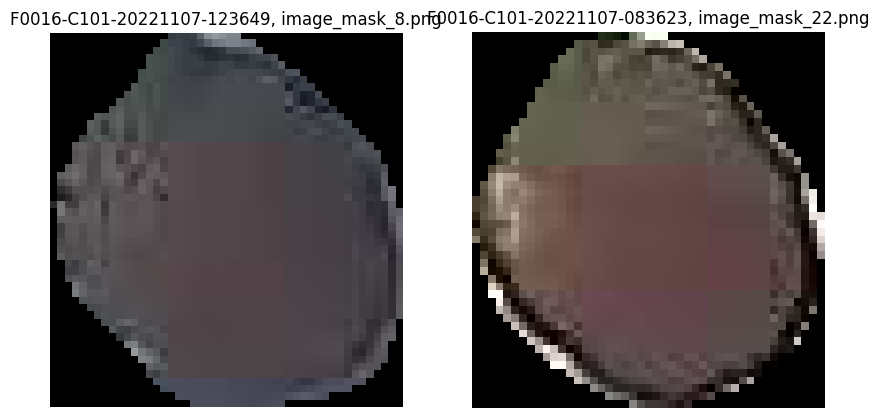

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                  F0016-C101-20221107-123649_7
mask_id                                 30235607a5b30c45fe3bf7bb90549aba
point_x_x                                                    1539.397461
point_y_x                                                     147.392776
output_image_path_x                                     image_mask_7.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

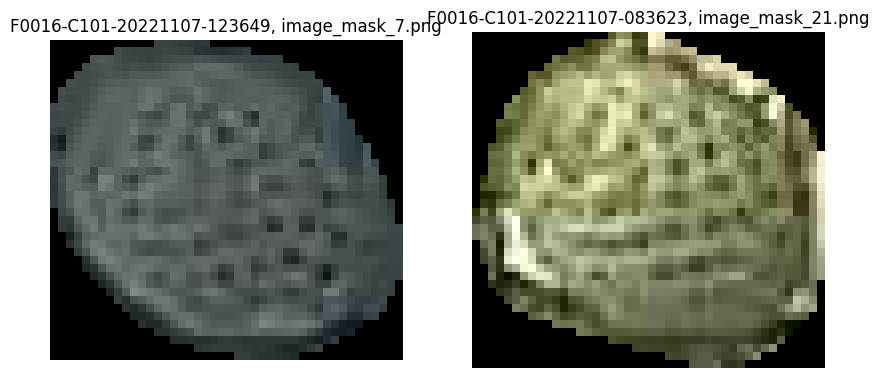

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                  F0016-C101-20221107-123649_3
mask_id                                 39368a7316ef34fca71ad161fdf1f902
point_x_x                                                     866.092224
point_y_x                                                     428.108643
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

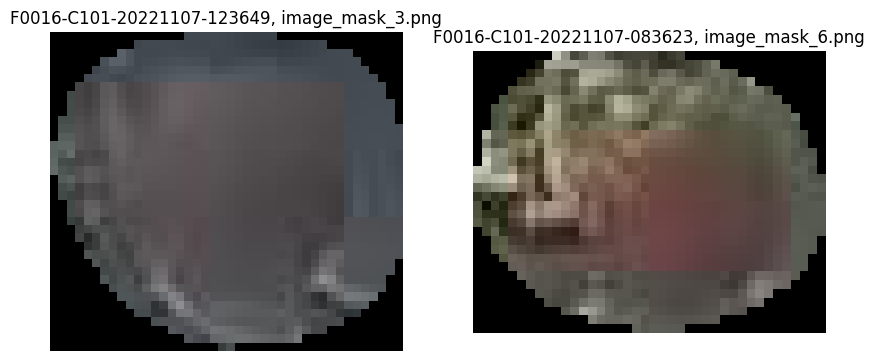

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                  F0016-C101-20221107-123649_1
mask_id                                 54072daef6b361477ff1ca3860027b20
point_x_x                                                    1090.146606
point_y_x                                                     325.842102
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

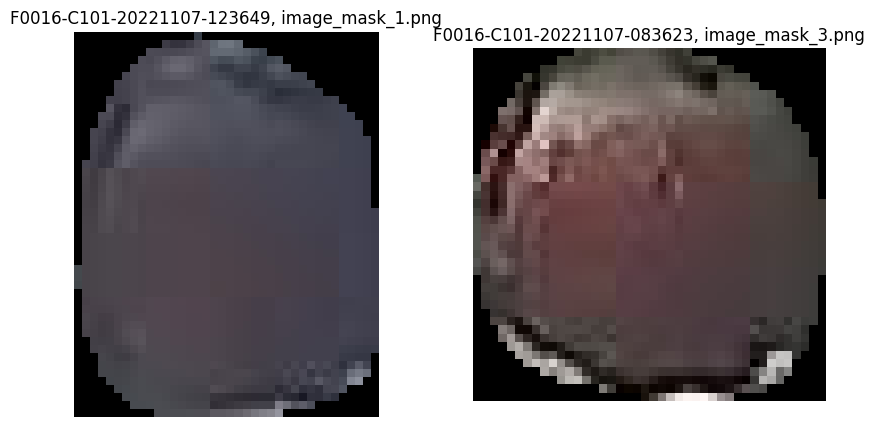

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                 F0016-C101-20221107-123649_12
mask_id                                 6400b3a003f4d1472dbdaa6cda2be964
point_x_x                                                    2346.167969
point_y_x                                                      16.254253
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

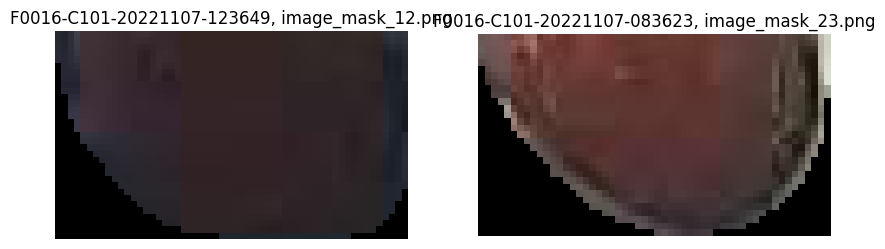

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                 F0016-C101-20221107-123649_11
mask_id                                 8758d30e86cdbedacdda86b2d93f5ca2
point_x_x                                                    1570.847778
point_y_x                                                     213.007019
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

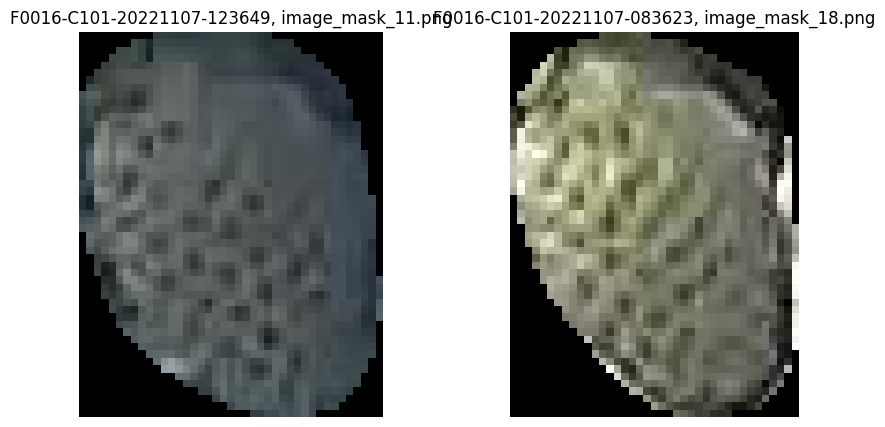

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                  F0016-C101-20221107-123649_2
mask_id                                 d75809be6c32da4f30b703206ce7c744
point_x_x                                                    1267.961548
point_y_x                                                     274.813416
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

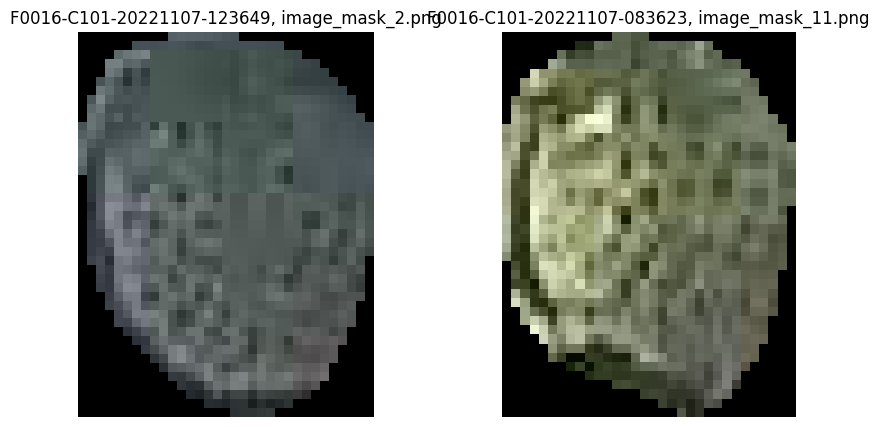

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221107-123649
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221107-083623
mask_num_x                                  F0016-C101-20221107-123649_4
mask_id                                 feff9a1c81164dd5328765974036ff10
point_x_x                                                    1005.471069
point_y_x                                                     354.019226
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221107-083623
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

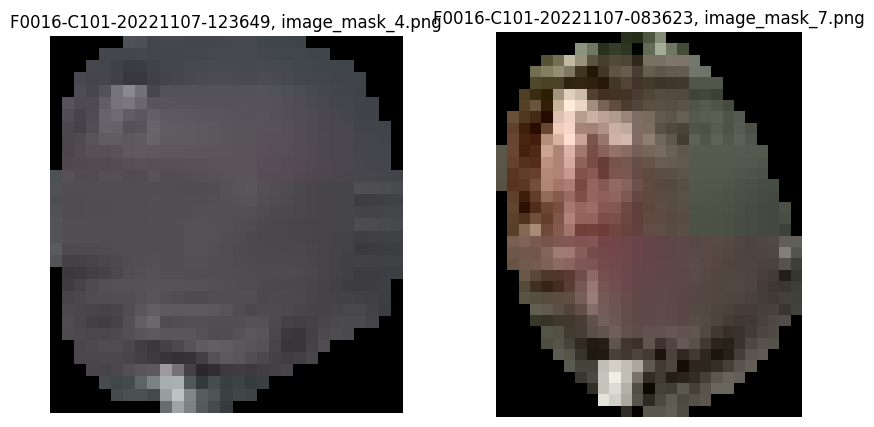

In [52]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221107-083623"]
aug2 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221106-163604"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_26
mask_id                                 1dc4882c54c29d07b818e6b3058707e3
point_x_x                                                    1294.642578
point_y_x                                                     320.203735
output_image_path_x                                    image_mask_26.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

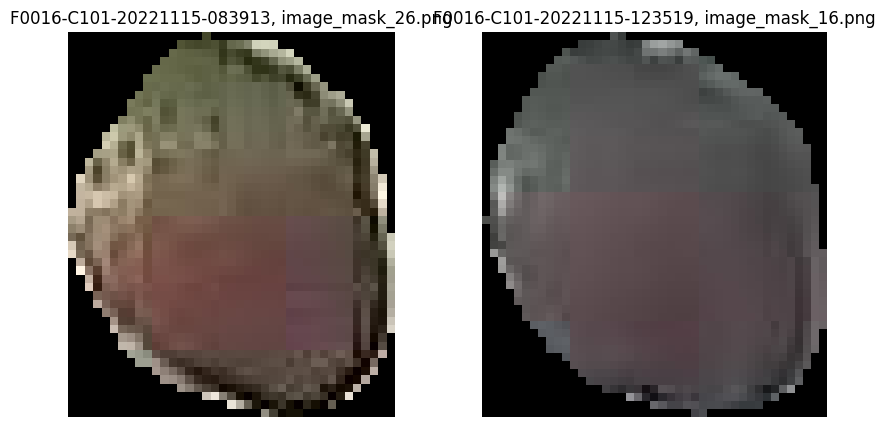

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_14
mask_id                                 37fb6c08d76eab562605d924f5e257f1
point_x_x                                                     856.208374
point_y_x                                                     442.774902
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

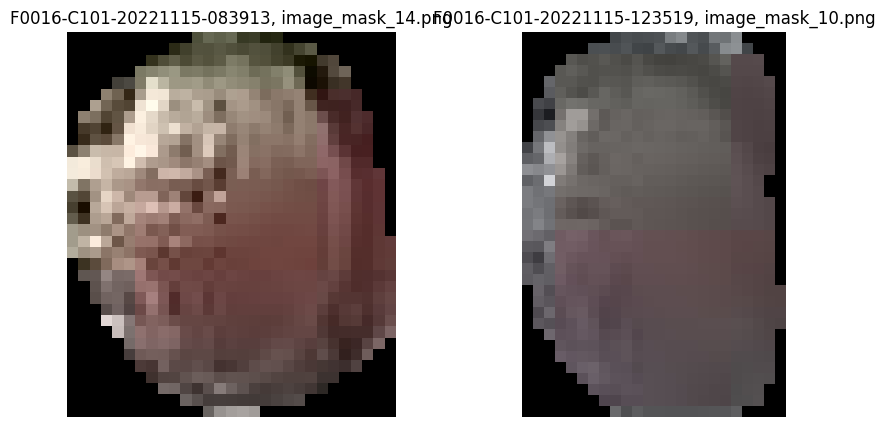

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_28
mask_id                                 4e06c5a157540a05bcdac96725fe36d6
point_x_x                                                    2137.480469
point_y_x                                                     433.824432
output_image_path_x                                    image_mask_28.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

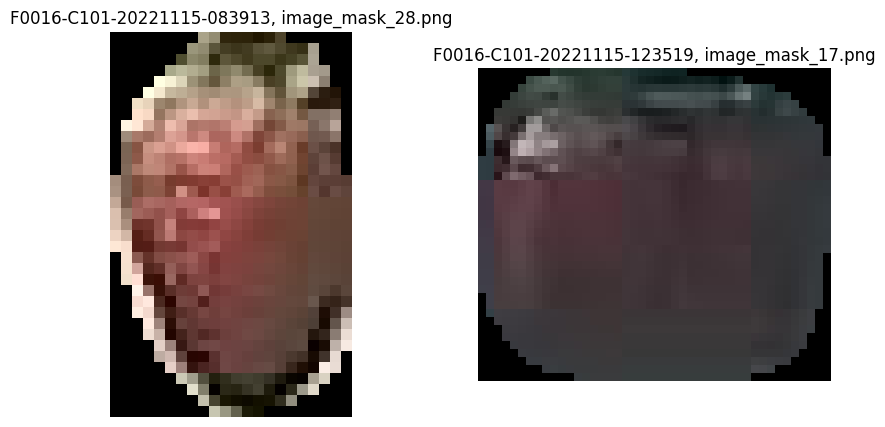

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_30
mask_id                                 4e06c5a157540a05bcdac96725fe36d6
point_x_x                                                    2146.585938
point_y_x                                                     431.909912
output_image_path_x                                    image_mask_30.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

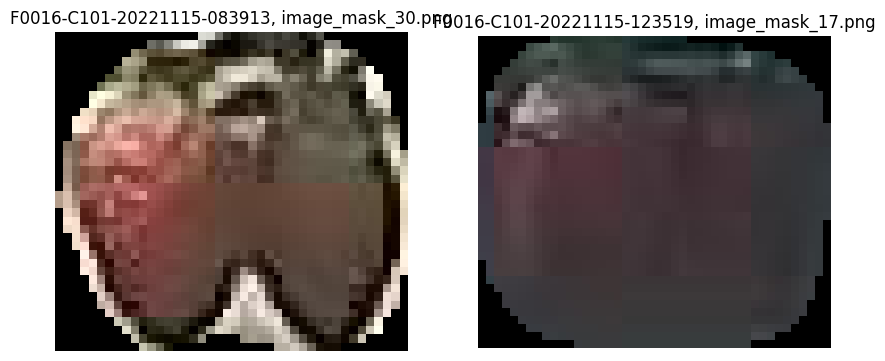

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_24
mask_id                                 506ead219f43ab8e5d30094038a48a46
point_x_x                                                    1543.650513
point_y_x                                                     176.345108
output_image_path_x                                    image_mask_24.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

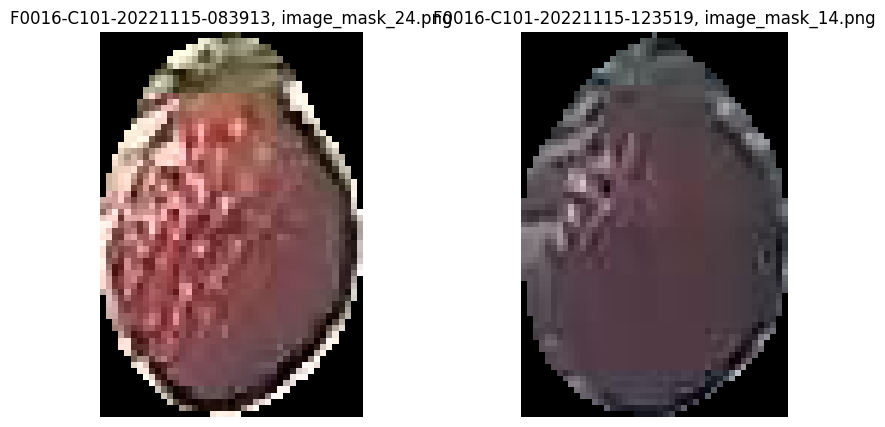

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_27
mask_id                                 6eee8c999a39f8900dced0ad24ca6f29
point_x_x                                                    1314.091309
point_y_x                                                     241.351624
output_image_path_x                                    image_mask_27.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

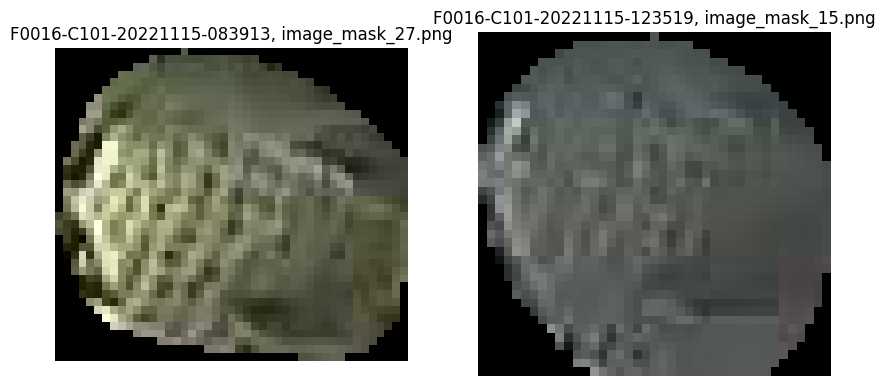

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                  F0016-C101-20221115-083913_2
mask_id                                 986a2ae4ea238a945548e0a7801c8aeb
point_x_x                                                     454.666107
point_y_x                                                     206.527634
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

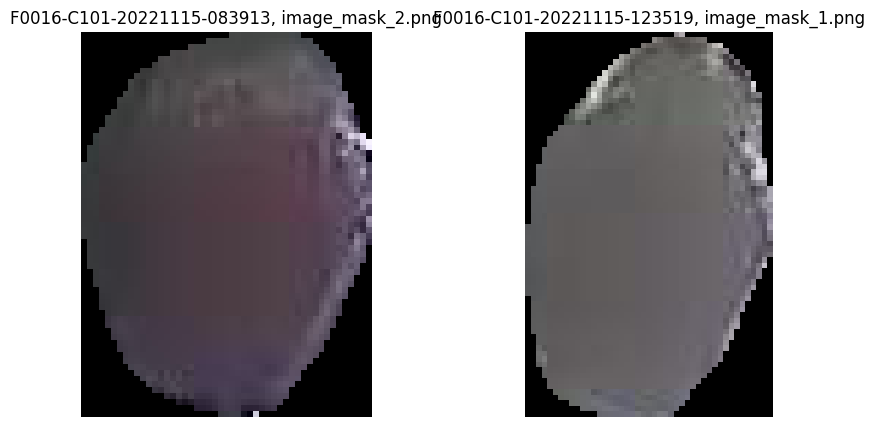

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_15
mask_id                                 ba902b068d9a351df6bad4ed98a1f68f
point_x_x                                                     815.547363
point_y_x                                                     447.249146
output_image_path_x                                    image_mask_15.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

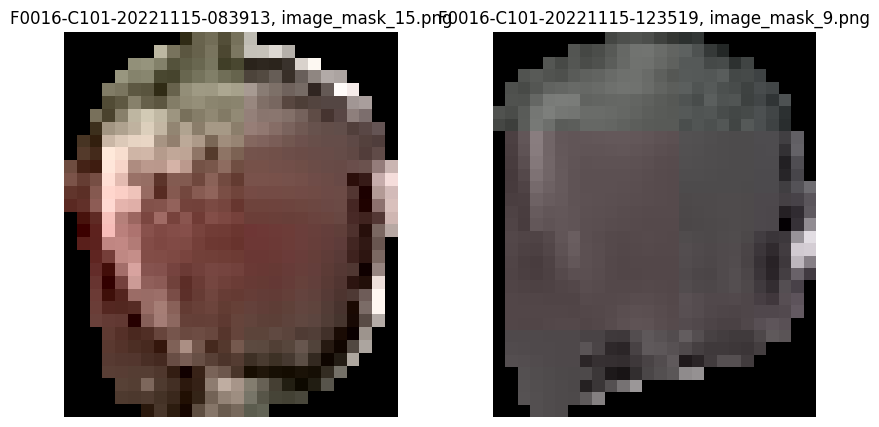

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_11
mask_id                                 d27614e8909898499e87692ba0a694ce
point_x_x                                                     982.276489
point_y_x                                                     376.538147
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

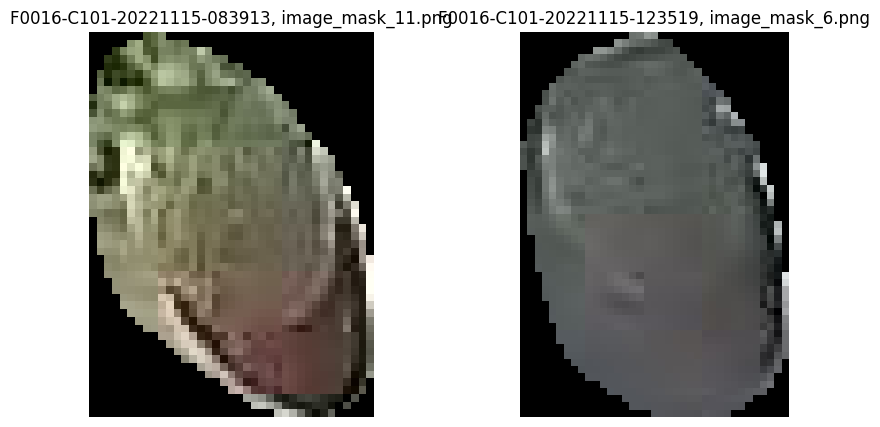

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221115-083913
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221114-164105
mask_num_x                                 F0016-C101-20221115-083913_25
mask_id                                 d2a6382c444048398c61298d589d518e
point_x_x                                                    1360.758057
point_y_x                                                     262.185547
output_image_path_x                                    image_mask_25.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221115-123519
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

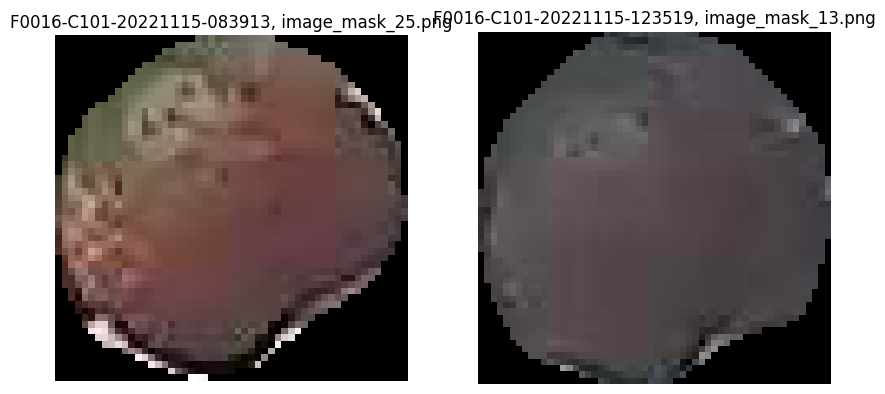

In [55]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221114-164105"]
aug2 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221115-083913"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221121-083606
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221120-163520
mask_num_x                                  F0016-C101-20221121-083606_5
mask_id                                 18f2a7924fffdea99934d8889ad0c463
point_x_x                                                    1246.667725
point_y_x                                                     272.376129
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221121-123644
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

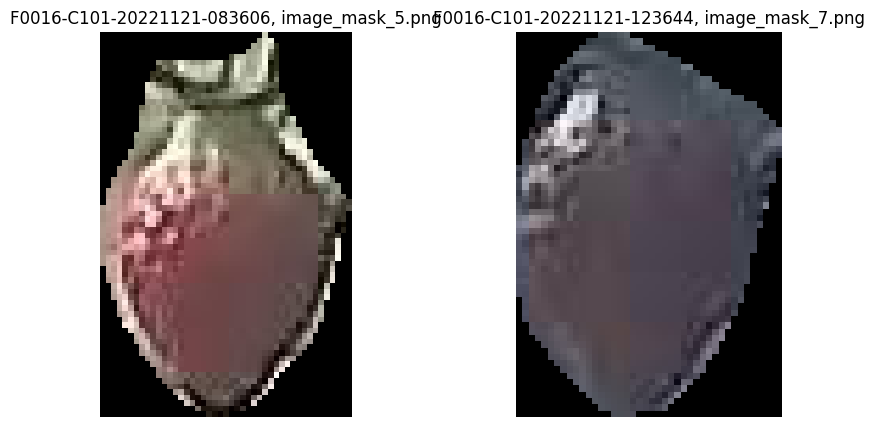

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221121-083606
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221120-163520
mask_num_x                                  F0016-C101-20221121-083606_6
mask_id                                 543eb12c0168a80dc8a8e867bd562679
point_x_x                                                    1323.165283
point_y_x                                                     266.059143
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221121-123644
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

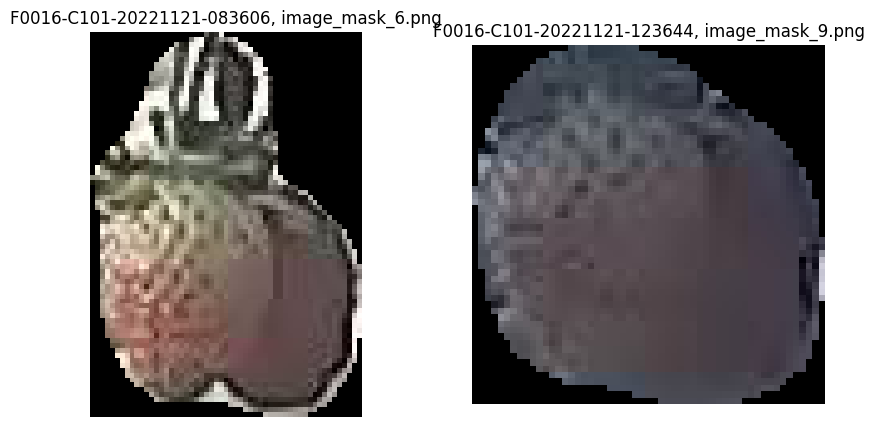

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221121-083606
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221120-163520
mask_num_x                                  F0016-C101-20221121-083606_4
mask_id                                 98d91ec11953c14a10804f5c3127502c
point_x_x                                                    1043.675293
point_y_x                                                     352.494263
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221121-123644
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

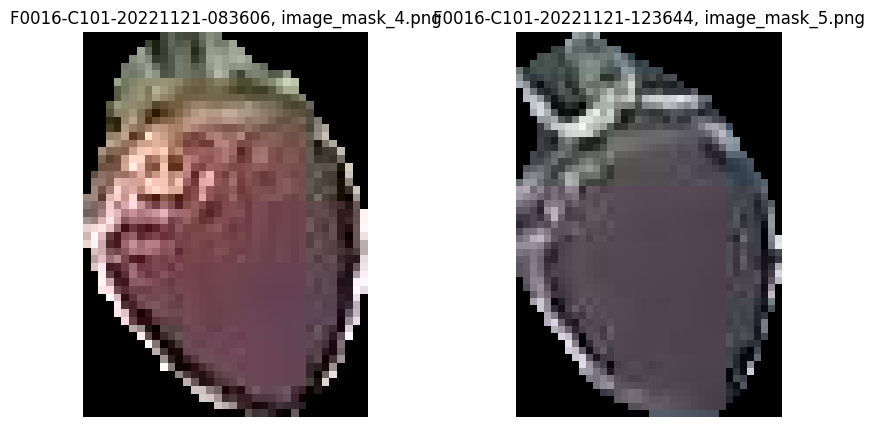

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221121-083606
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221120-163520
mask_num_x                                  F0016-C101-20221121-083606_1
mask_id                                 f4cf8bb1c64e885e332830d19f51c0af
point_x_x                                                     456.433167
point_y_x                                                     185.258789
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221121-123644
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

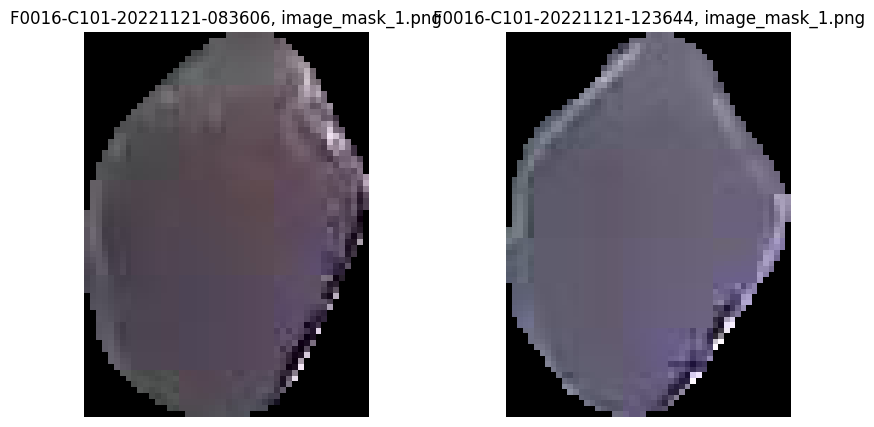

In [56]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221120-163520"]
aug2 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221121-083606"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221122-083500
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221121-163648
mask_num_x                                  F0016-C101-20221122-083500_1
mask_id                                 41a8f91f1272668db471bb1b0954e314
point_x_x                                                    1325.441895
point_y_x                                                      273.49704
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221122-123629
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

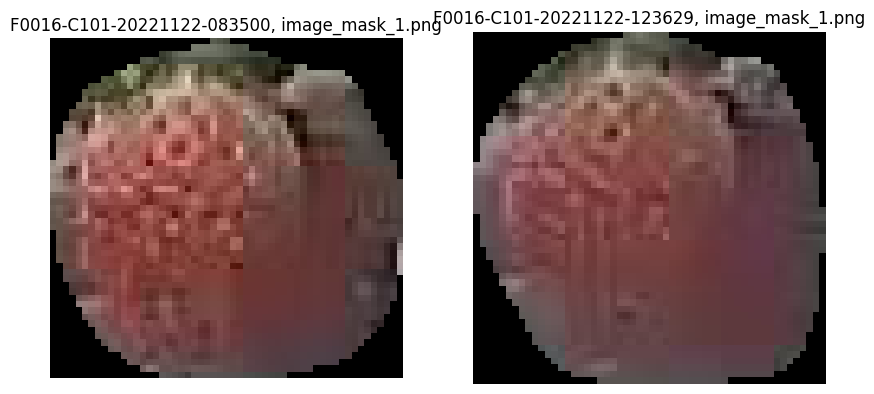

In [57]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221121-163648"]
aug2 = nov_2022[nov_2022["before_img_name"] == "F0016-C101-20221122-083500"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2022년 12월

In [61]:
### 2022년 12월에 해당하는 이미지 필터링
dec_2022 = f0016[(f0016["측정년도"] == 2022) & (f0016["측정월"] == 12)]

# 측정 일자를 datetime으로 변환
dec_2022["측정일자"] = pd.to_datetime(dec_2022["측정일자"])

# 날짜 필터링
dec_2022 = dec_2022[(dec_2022["측정일자"].dt.weekday == 0) | (dec_2022["측정일자"].dt.weekday == 1) | (dec_2022["측정일자"].dt.weekday == 2)]

dec_2022['before_img_name'].unique()

/tmp/ipykernel_266549/972974890.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dec_2022["측정일자"] = pd.to_datetime(dec_2022["측정일자"])


array(['F0016-C101-20221206-084141', 'F0016-C101-20221207-083855',
       'F0016-C101-20221211-163756', 'F0016-C101-20221212-083817',
       'F0016-C101-20221212-123926', 'F0016-C101-20221212-164045',
       'F0016-C101-20221213-084302', 'F0016-C101-20221213-124314',
       'F0016-C101-20221213-164530', 'F0016-C101-20221214-084219',
       'F0016-C101-20221214-124214', 'F0016-C101-20221218-163833',
       'F0016-C101-20221219-083753', 'F0016-C101-20221219-123930',
       'F0016-C101-20221219-163923', 'F0016-C101-20221220-083858',
       'F0016-C101-20221220-123930', 'F0016-C101-20221220-164122',
       'F0016-C101-20221221-084134', 'F0016-C101-20221221-124145',
       'F0016-C101-20221225-164302', 'F0016-C101-20221226-084234',
       'F0016-C101-20221226-124040', 'F0016-C101-20221226-164000',
       'F0016-C101-20221227-083831', 'F0016-C101-20221227-123833',
       'F0016-C101-20221228-083813'], dtype=object)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20221228-123856
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20221228-083813
mask_num_x                                  F0016-C101-20221228-123856_3
mask_id                                 fbd5a41a368754cd076f200ccaacf644
point_x_x                                                     841.924194
point_y_x                                                     433.477783
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20221227-123833
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

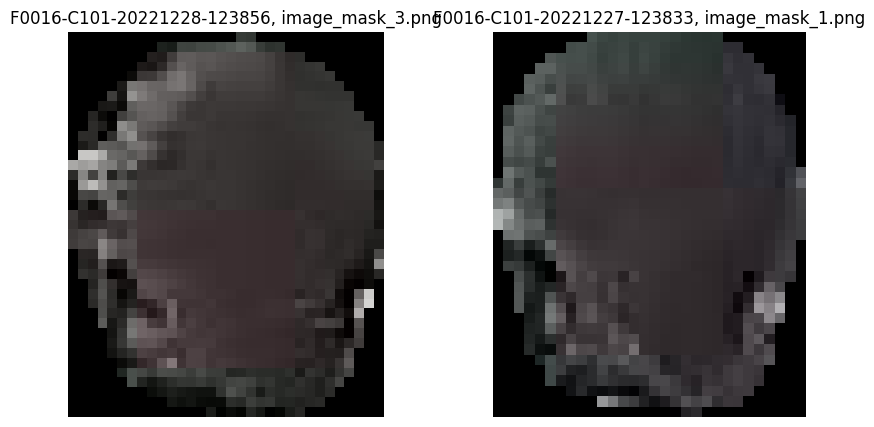

In [71]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = dec_2022[dec_2022["before_img_name"] == "F0016-C101-20221228-083813"]
aug2 = dec_2022[dec_2022["before_img_name"] == "F0016-C101-20221227-083831"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2023년 1월

In [73]:
### 2023년 1월에 해당하는 이미지 필터링
jan_2023 = f0016[(f0016["측정년도"] == 2023) & (f0016["측정월"] == 1)]

# 측정 일자를 datetime으로 변환
jan_2023["측정일자"] = pd.to_datetime(jan_2023["측정일자"])

# 날짜 필터링
jan_2023 = jan_2023[(jan_2023["측정일자"].dt.weekday == 0) | (jan_2023["측정일자"].dt.weekday == 1) | (jan_2023["측정일자"].dt.weekday == 2)]

jan_2023['before_img_name'].unique()

/tmp/ipykernel_266549/565722835.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jan_2023["측정일자"] = pd.to_datetime(jan_2023["측정일자"])


array(['F0016-C101-20221228-123856', 'F0016-C101-20230103-123901',
       'F0016-C101-20230103-163809', 'F0016-C101-20230104-083734',
       'F0016-C101-20230104-123736', 'F0016-C101-20230108-163807',
       'F0016-C101-20230109-083624', 'F0016-C101-20230109-123646',
       'F0016-C101-20230109-163642', 'F0016-C101-20230110-083659',
       'F0016-C101-20230110-123754', 'F0016-C101-20230110-163805',
       'F0016-C101-20230111-083718', 'F0016-C101-20230111-123728',
       'F0016-C101-20230115-163758', 'F0016-C101-20230116-083635',
       'F0016-C101-20230116-123636', 'F0016-C101-20230116-163819',
       'F0016-C101-20230117-083900', 'F0016-C101-20230117-123837',
       'F0016-C101-20230117-163845', 'F0016-C101-20230118-084040',
       'F0016-C101-20230118-124047', 'F0016-C101-20230122-164107',
       'F0016-C101-20230123-083950', 'F0016-C101-20230123-123934',
       'F0016-C101-20230123-163954', 'F0016-C101-20230124-084136',
       'F0016-C101-20230124-124144', 'F0016-C101-20230124-1641

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                  F0016-C101-20230109-083624_8
mask_id                                 0ddd00cfaa1217fc755d8016c3be51c6
point_x_x                                                    1831.489258
point_y_x                                                      66.931038
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

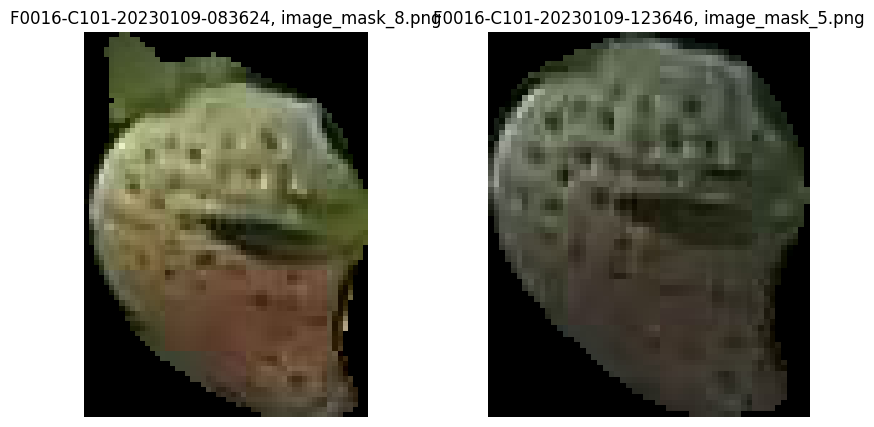

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                 F0016-C101-20230109-083624_15
mask_id                                 0ddd00cfaa1217fc755d8016c3be51c6
point_x_x                                                    1837.332764
point_y_x                                                      75.560555
output_image_path_x                                    image_mask_15.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

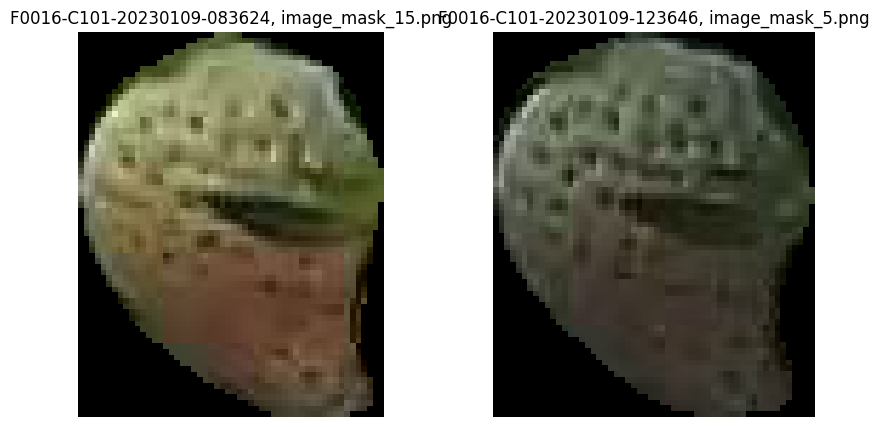

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                 F0016-C101-20230109-083624_10
mask_id                                 0f67b37e5d309d0076e2699eedd10892
point_x_x                                                    1367.620605
point_y_x                                                      290.97821
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

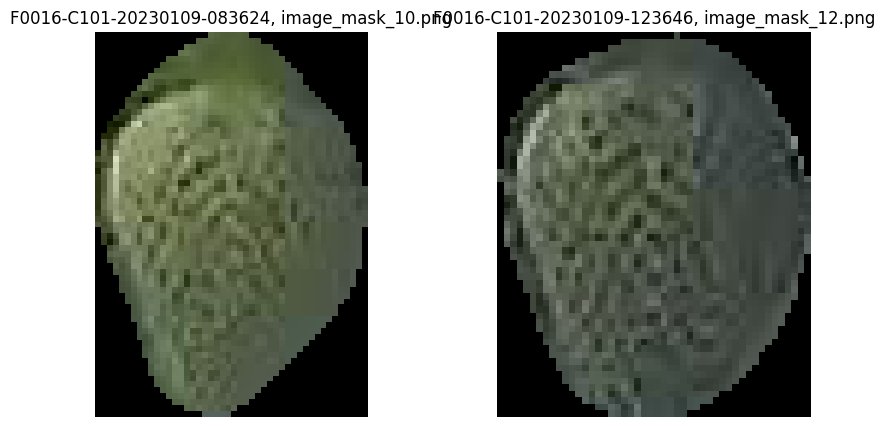

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                 F0016-C101-20230109-083624_14
mask_id                                 14bcfc7b0c5eb8b36e1a707ec55fbfdb
point_x_x                                                    1752.526123
point_y_x                                                     193.996246
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

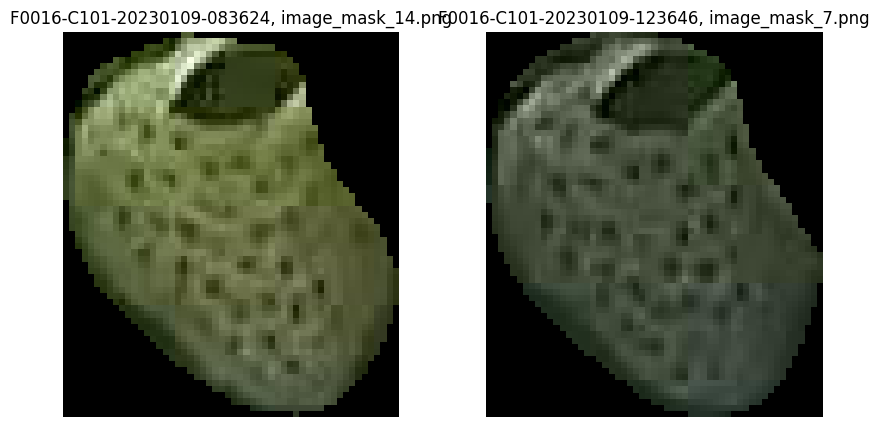

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                 F0016-C101-20230109-083624_16
mask_id                                 1a950149d239046590ca8abc888fb2a9
point_x_x                                                    2045.404541
point_y_x                                                      58.223221
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

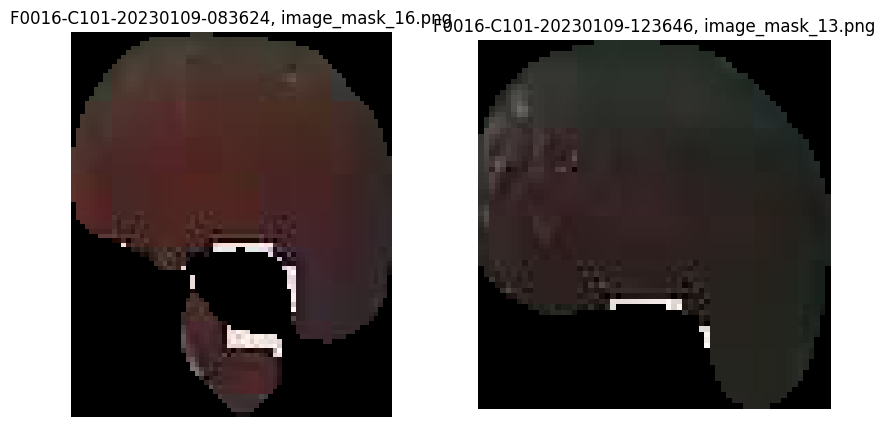

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                 F0016-C101-20230109-083624_18
mask_id                                 269b20b24fd6b78fedf3421859f09cb2
point_x_x                                                    1984.931885
point_y_x                                                      57.229637
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

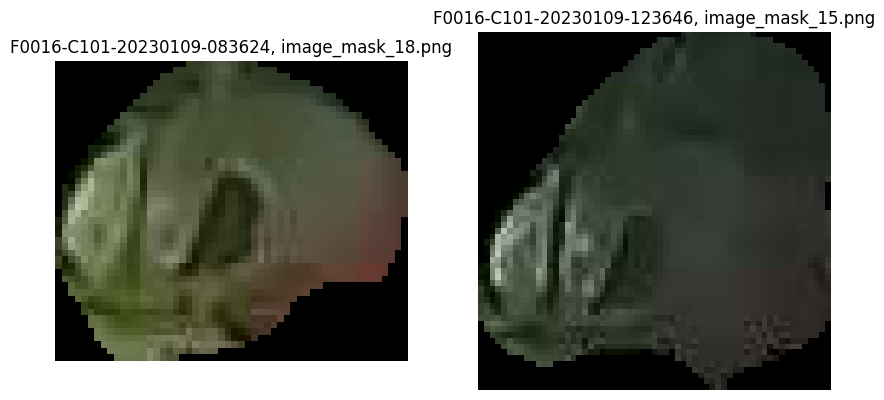

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                  F0016-C101-20230109-083624_7
mask_id                                 7e14f9e2cb86cf9ae45486e65143970c
point_x_x                                                    1095.890137
point_y_x                                                     481.266296
output_image_path_x                                     image_mask_7.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

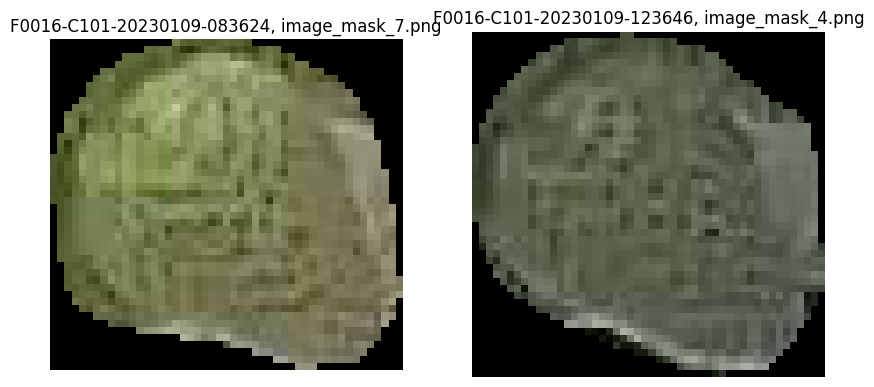

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                  F0016-C101-20230109-083624_6
mask_id                                 8dc004a0512712405b12c1034650ce1d
point_x_x                                                    1105.074707
point_y_x                                                     446.974121
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

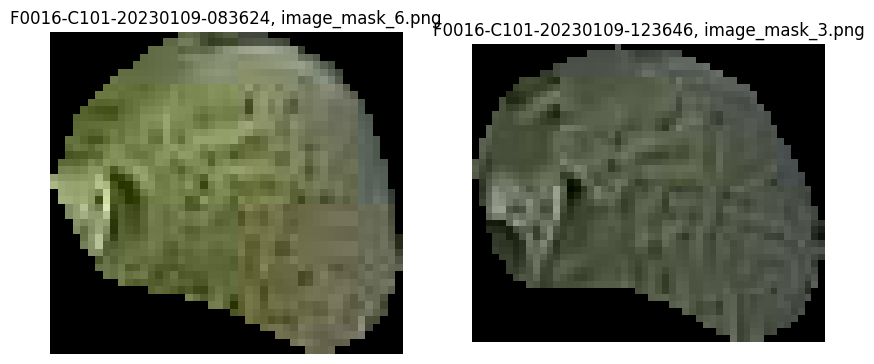

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                 F0016-C101-20230109-083624_12
mask_id                                 b33d2724d2951af3bb160b6f77623b0a
point_x_x                                                    1907.166992
point_y_x                                                      91.026108
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

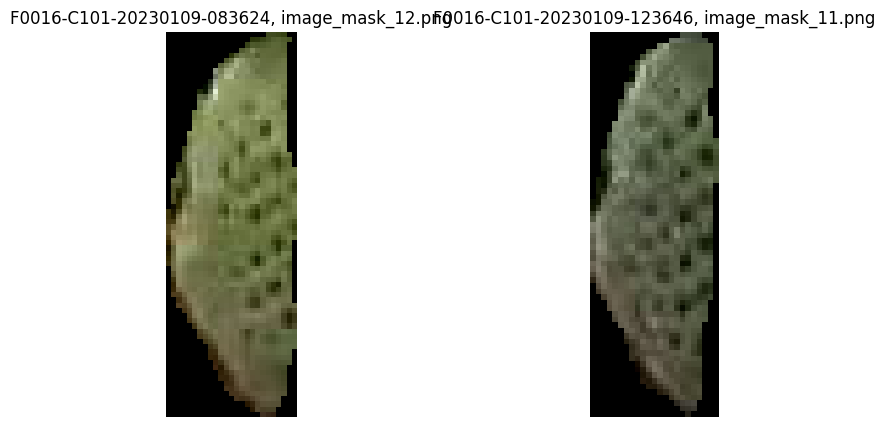

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                 F0016-C101-20230109-083624_11
mask_id                                 b9f032cc07bd24936bc61e37d64d2e2a
point_x_x                                                    1794.789795
point_y_x                                                     183.417236
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

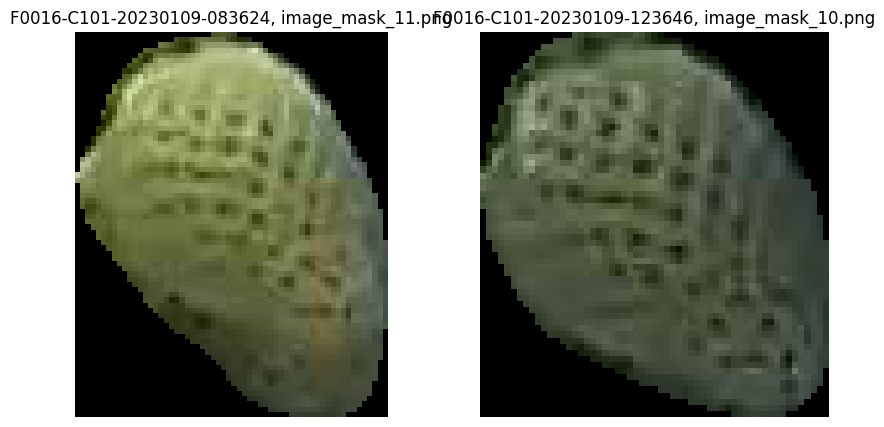

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230109-083624
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230108-163807
mask_num_x                                  F0016-C101-20230109-083624_9
mask_id                                 c071d540f5eebf363f3f4f494838eb31
point_x_x                                                    1888.749268
point_y_x                                                      97.400276
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230109-123646
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

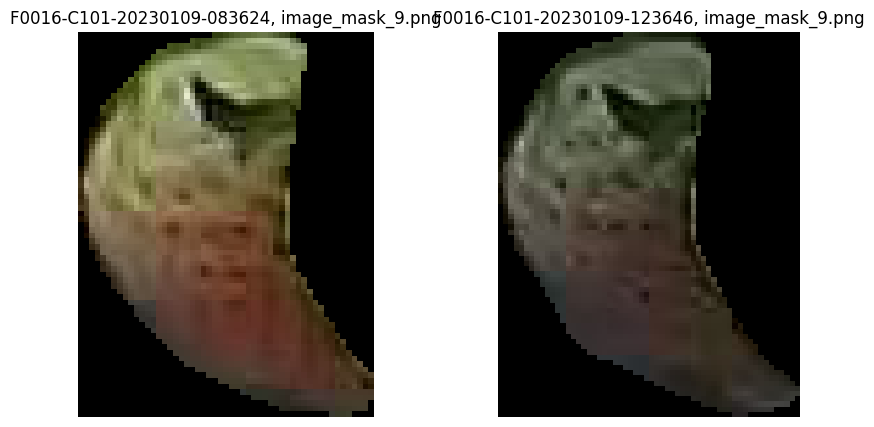

In [75]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = jan_2023[jan_2023["before_img_name"] == "F0016-C101-20230108-163807"]
aug2 = jan_2023[jan_2023["before_img_name"] == "F0016-C101-20230109-083624"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_43
mask_id                                 0f2b841798ba9065e2e4f9a77800877b
point_x_x                                                    2094.245117
point_y_x                                                     464.447021
output_image_path_x                                    image_mask_43.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

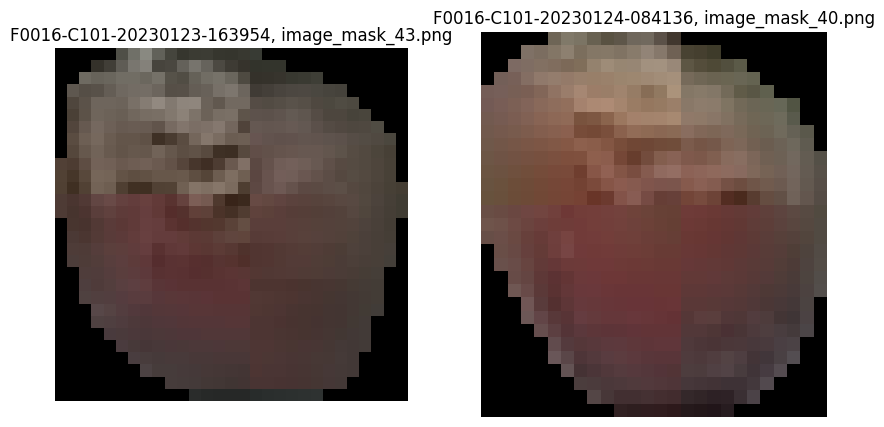

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_10
mask_id                                 140c4230d21582d0eb4b99ff80b38985
point_x_x                                                     452.030487
point_y_x                                                     374.783447
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

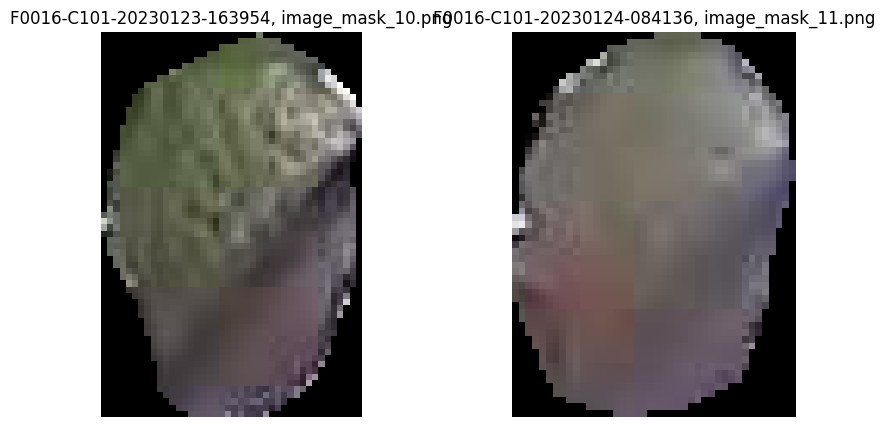

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                  F0016-C101-20230123-163954_5
mask_id                                 182b8e7dfcdf01b985db7d220140056d
point_x_x                                                     518.176392
point_y_x                                                     272.632935
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

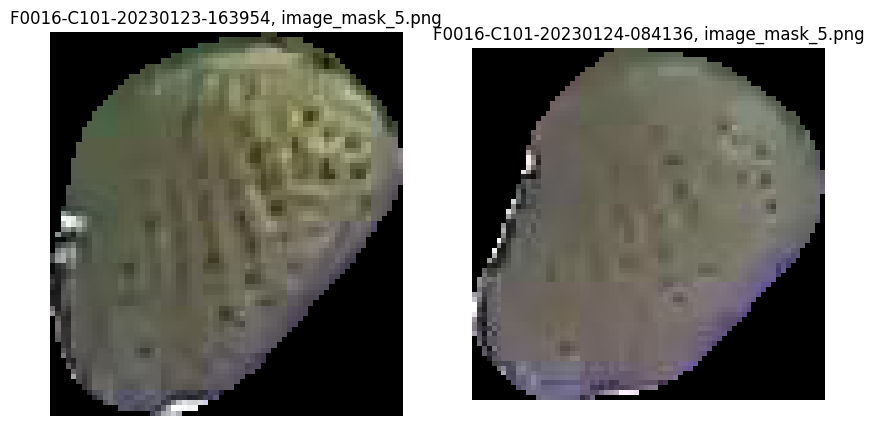

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_32
mask_id                                 37f449494e95ed5d844efd4e9d6a589e
point_x_x                                                    1582.817871
point_y_x                                                     492.778442
output_image_path_x                                    image_mask_32.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

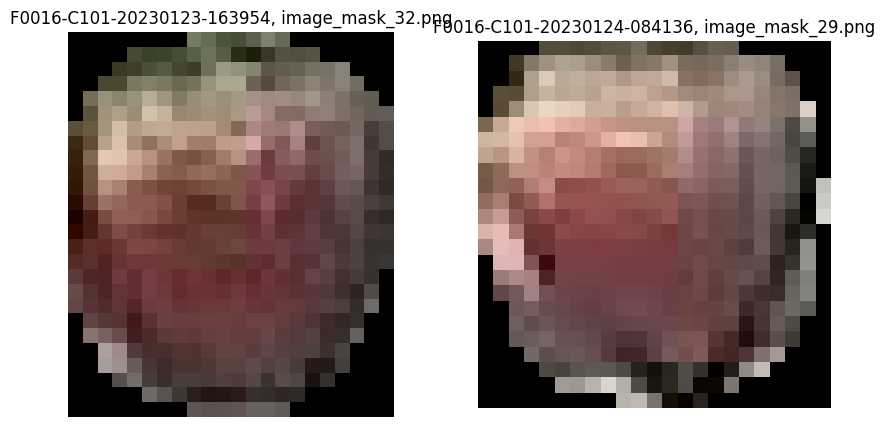

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_36
mask_id                                 4fefcdc3b4b2a36e60f7bfd5db7f662c
point_x_x                                                    1437.595947
point_y_x                                                     378.172272
output_image_path_x                                    image_mask_36.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

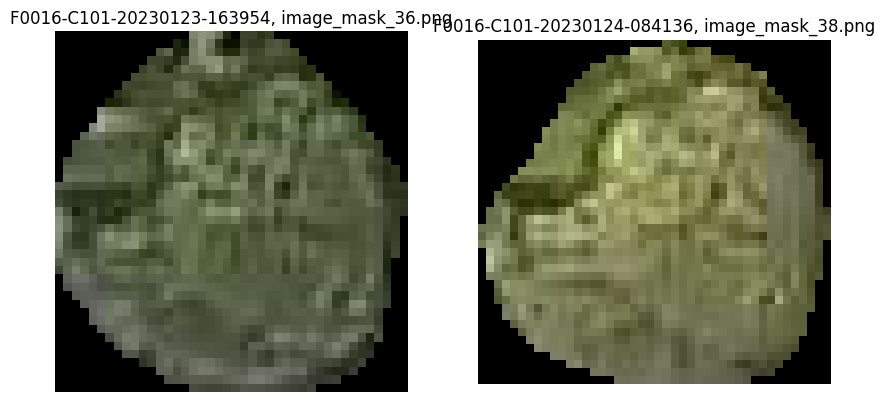

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_29
mask_id                                 60dda1794b389dc392643621fb939691
point_x_x                                                    1510.344971
point_y_x                                                     378.799622
output_image_path_x                                    image_mask_29.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

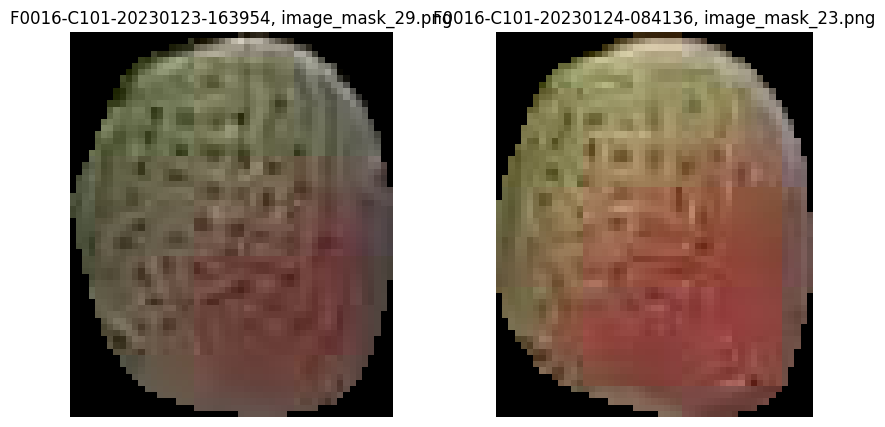

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_45
mask_id                                 67bd27ad5647b2699b51f6da2d5039f0
point_x_x                                                    2476.852539
point_y_x                                                     439.695923
output_image_path_x                                    image_mask_45.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

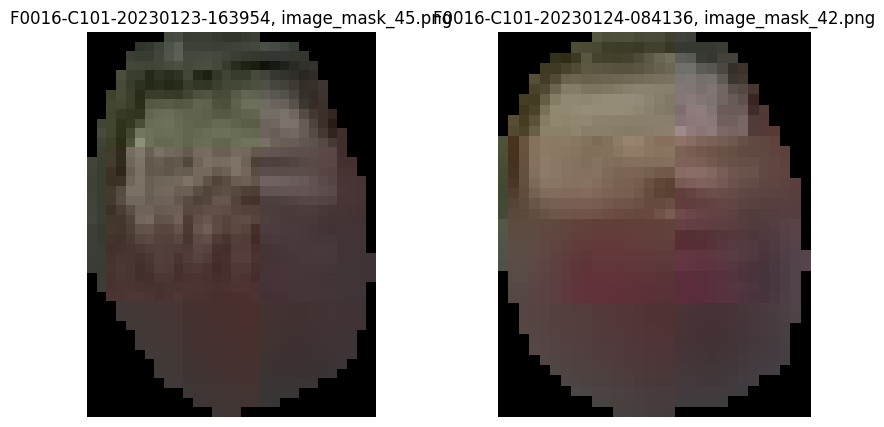

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_34
mask_id                                 67e28ce6ca7326614cce9a44ed487872
point_x_x                                                    1724.500122
point_y_x                                                     170.619507
output_image_path_x                                    image_mask_34.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

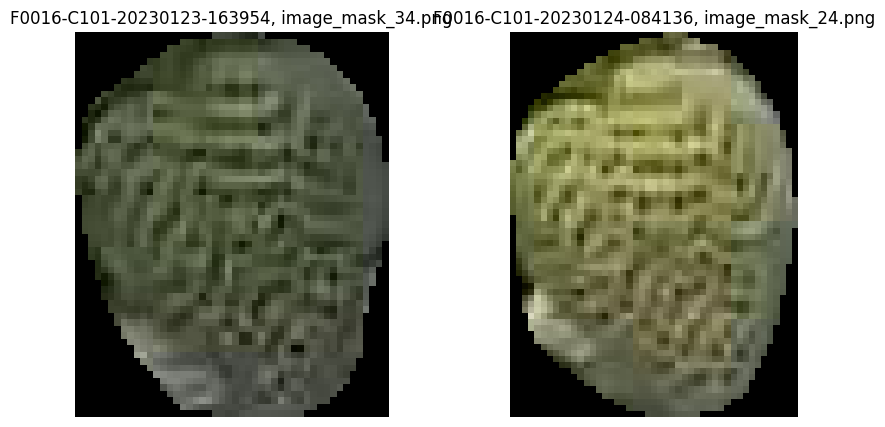

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_30
mask_id                                 7dd2d33276a3a285411c7fa5640d2a00
point_x_x                                                    1401.441528
point_y_x                                                     223.531555
output_image_path_x                                    image_mask_30.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

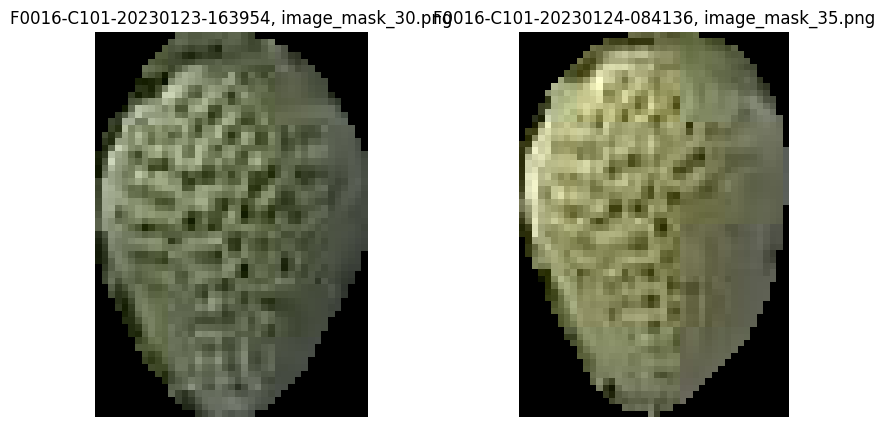

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_21
mask_id                                 82c15aa447f11cd28358c7f51fbfa0a6
point_x_x                                                     982.283569
point_y_x                                                     396.202576
output_image_path_x                                    image_mask_21.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

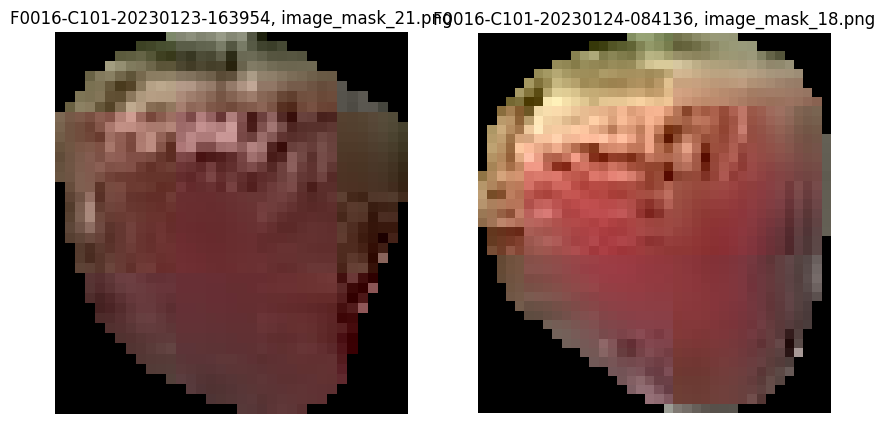

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_22
mask_id                                 82e8d0df32558fd7ed5c5f2e0863f231
point_x_x                                                     656.865845
point_y_x                                                      37.670464
output_image_path_x                                    image_mask_22.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

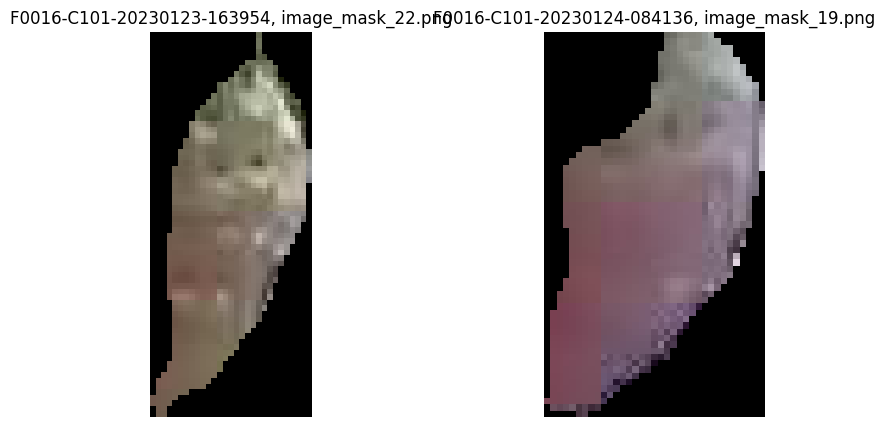

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_33
mask_id                                 85cfd9b0db36889d2176b4a3c2c2a35a
point_x_x                                                    1342.623047
point_y_x                                                     338.576599
output_image_path_x                                    image_mask_33.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

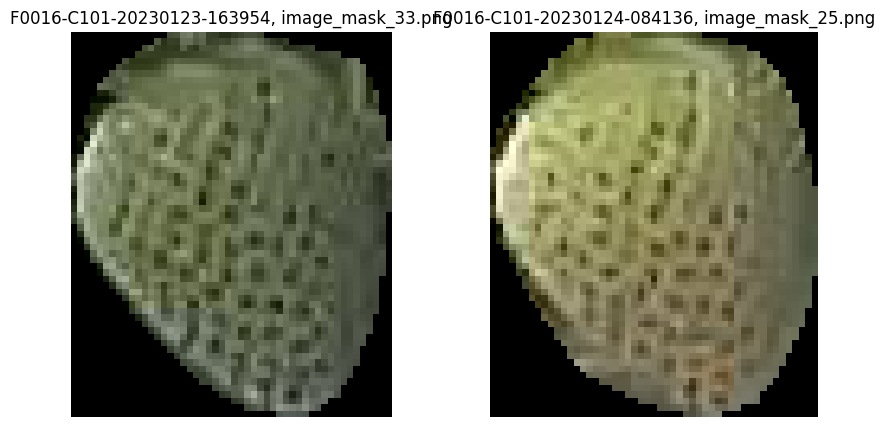

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_31
mask_id                                 94fd9998ab609b4631e66d603c52b2f0
point_x_x                                                    1509.328613
point_y_x                                                     321.040833
output_image_path_x                                    image_mask_31.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

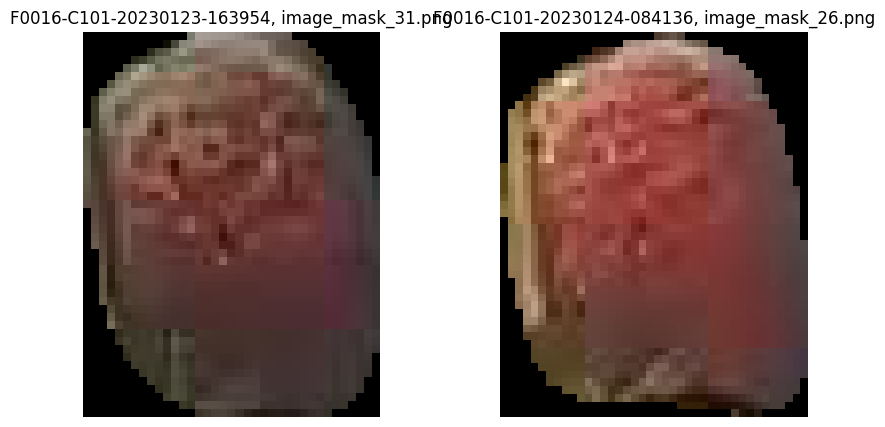

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                  F0016-C101-20230123-163954_9
mask_id                                 9790c5ada129349e5bf9f3228e4eaae9
point_x_x                                                     416.737061
point_y_x                                                     612.096436
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

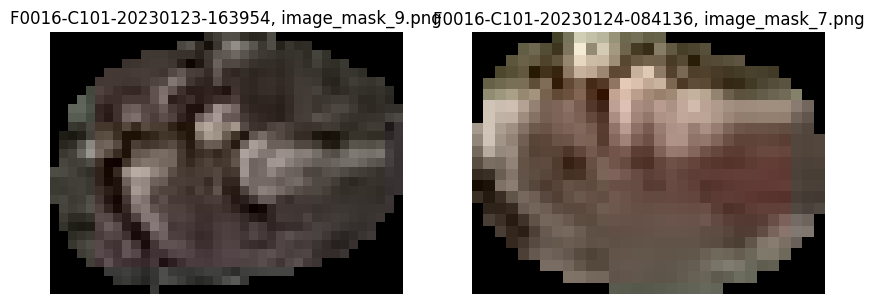

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_27
mask_id                                 a7b90bc811e3f12e64e6ae06e1c26ff4
point_x_x                                                    1087.991211
point_y_x                                                     496.323486
output_image_path_x                                    image_mask_27.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

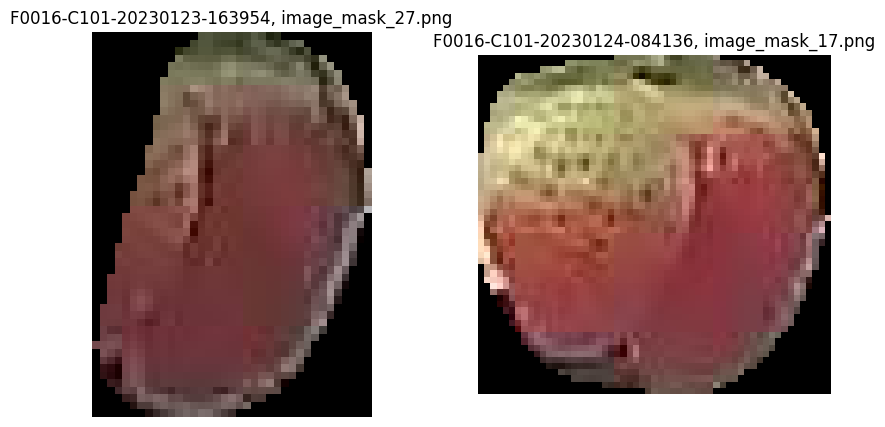

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_25
mask_id                                 af30f66917336fcd66f0aad8448a8c0b
point_x_x                                                     793.108276
point_y_x                                                     538.488159
output_image_path_x                                    image_mask_25.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

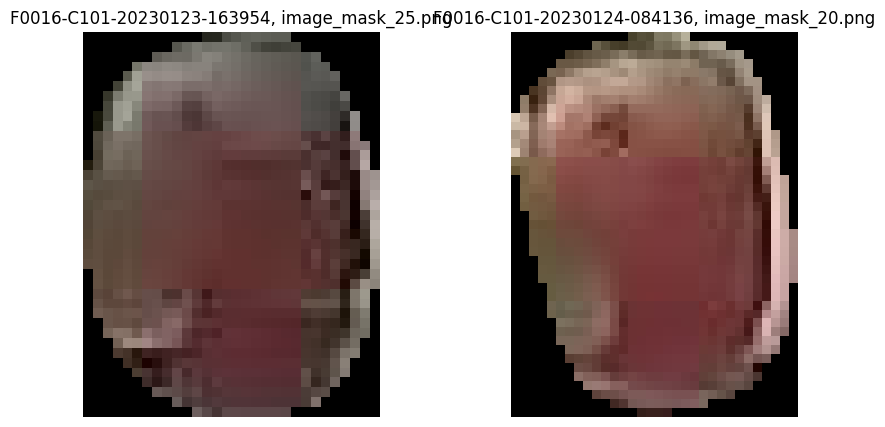

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_35
mask_id                                 bddec4852b3a128735a02f6e4bb6ab41
point_x_x                                                    1465.414551
point_y_x                                                     345.284424
output_image_path_x                                    image_mask_35.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

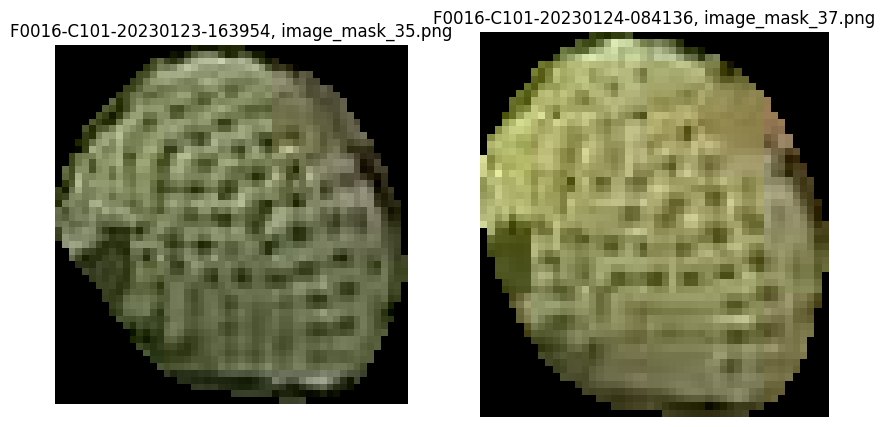

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_16
mask_id                                 c27ef3f8ccfe5c64c972e10af0a111a5
point_x_x                                                     439.248718
point_y_x                                                     288.638367
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

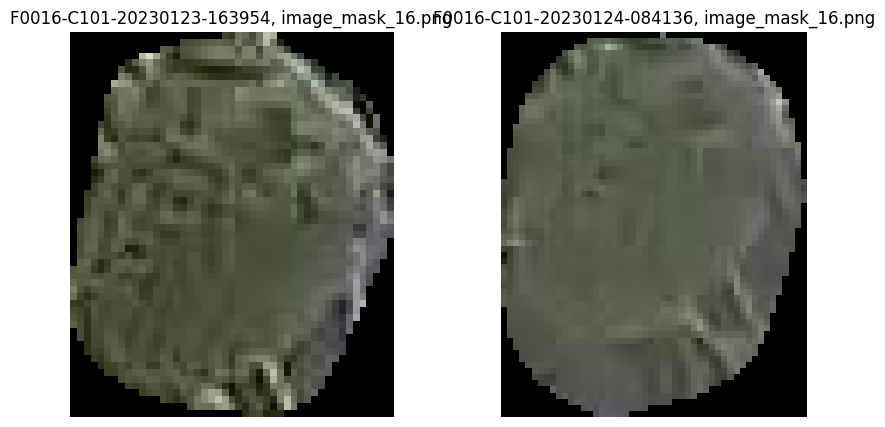

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                  F0016-C101-20230123-163954_2
mask_id                                 c9f4fc6c97b43ff3396124a17a0f9ad6
point_x_x                                                     351.720642
point_y_x                                                     328.812683
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

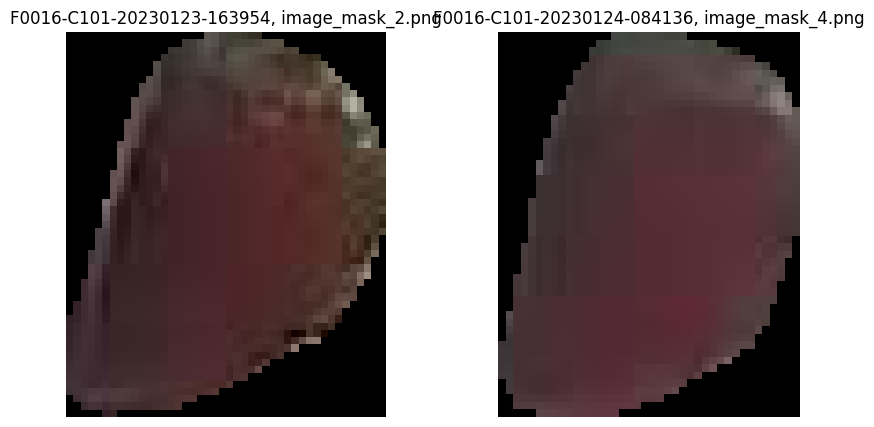

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                  F0016-C101-20230123-163954_6
mask_id                                 d0b7e5c4874ad9bb6c67420634339b2e
point_x_x                                                     338.446838
point_y_x                                                     464.162323
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

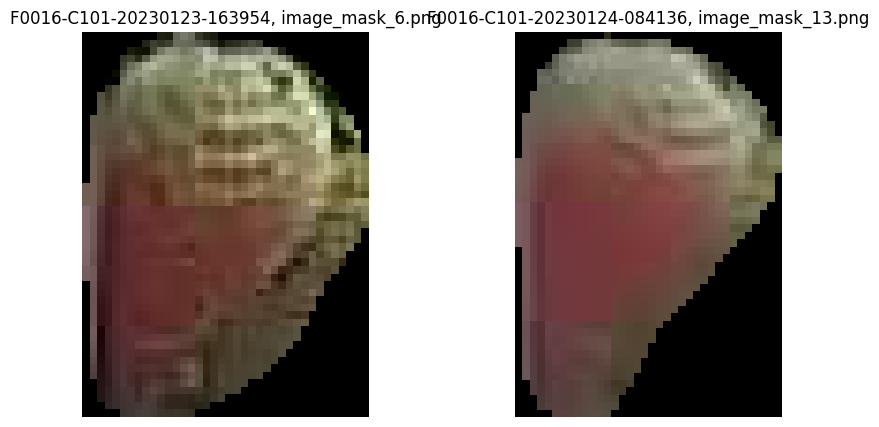

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_12
mask_id                                 dade7dd70597d7c1a73e70099c9eda42
point_x_x                                                     536.273193
point_y_x                                                     196.505463
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

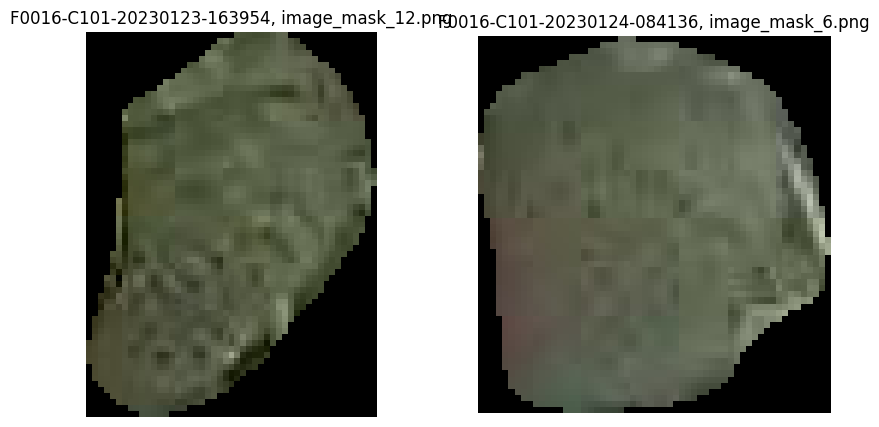

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                  F0016-C101-20230123-163954_4
mask_id                                 e8ce74b1770ee0485bb23f9d2fc5b652
point_x_x                                                     565.075684
point_y_x                                                      96.119301
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

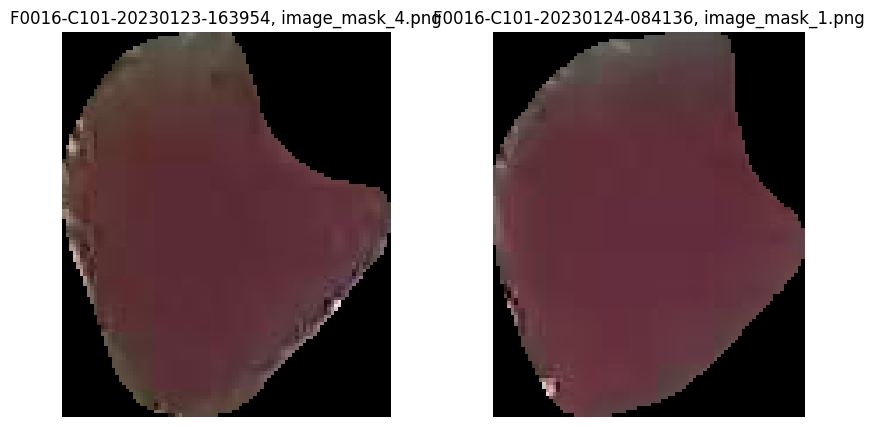

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                  F0016-C101-20230123-163954_3
mask_id                                 f25b6657b3b1464d877b11ab3f16cdfe
point_x_x                                                     400.849762
point_y_x                                                     221.974899
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

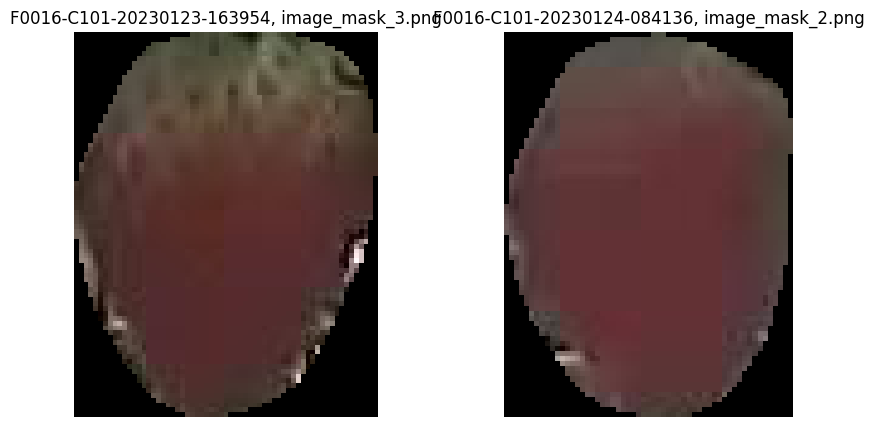

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                 F0016-C101-20230123-163954_47
mask_id                                 f477efcc4b1ad12196cbc60d46b48b47
point_x_x                                                    2504.292969
point_y_x                                                     430.730164
output_image_path_x                                    image_mask_47.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

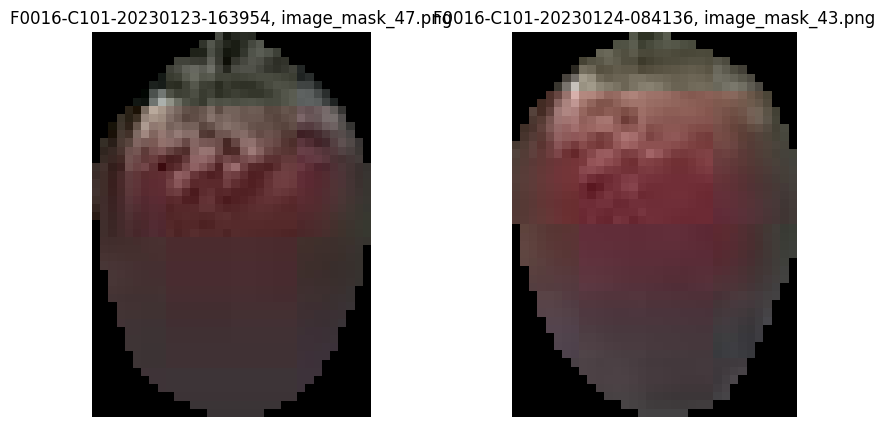

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230123-163954
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230123-123934
mask_num_x                                  F0016-C101-20230123-163954_1
mask_id                                 f4a0c6e25664af6ed0f03228fb2c9bf3
point_x_x                                                     365.840088
point_y_x                                                     376.550568
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230124-084136
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

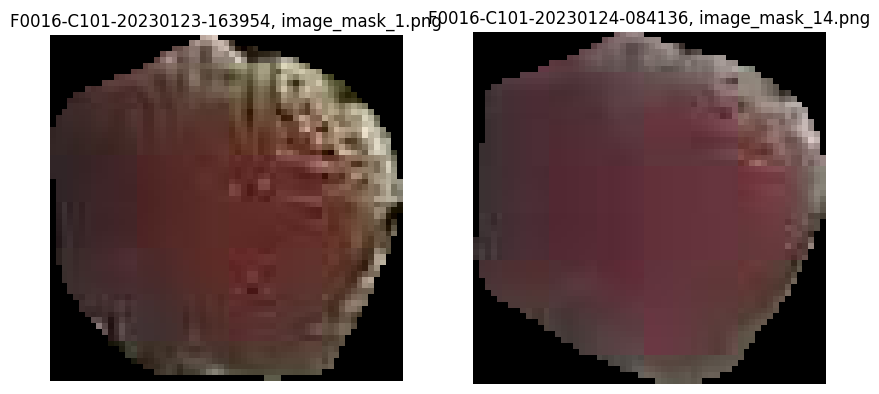

In [82]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = jan_2023[jan_2023["before_img_name"] == "F0016-C101-20230123-123934"]
aug2 = jan_2023[jan_2023["before_img_name"] == "F0016-C101-20230123-163954"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_20
mask_id                                 27cf3a191bcdcd4fcb2d36b0e40436b1
point_x_x                                                    1441.693237
point_y_x                                                     331.290466
output_image_path_x                                    image_mask_20.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

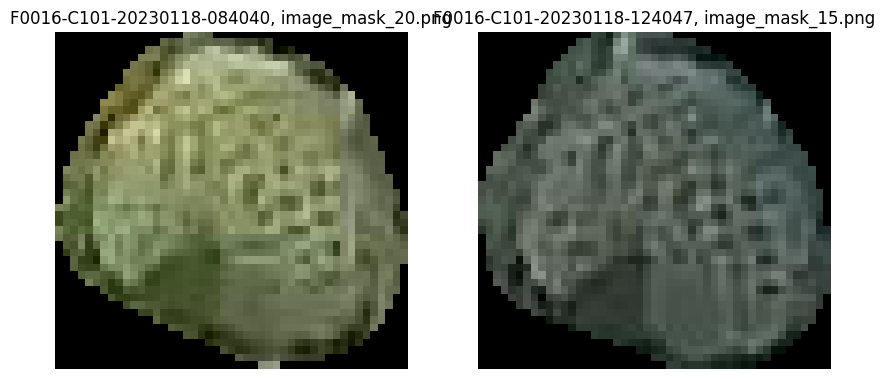

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_22
mask_id                                 30802cf28412a1c79a6b74407f66d3a0
point_x_x                                                    1755.744141
point_y_x                                                     225.704086
output_image_path_x                                    image_mask_22.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

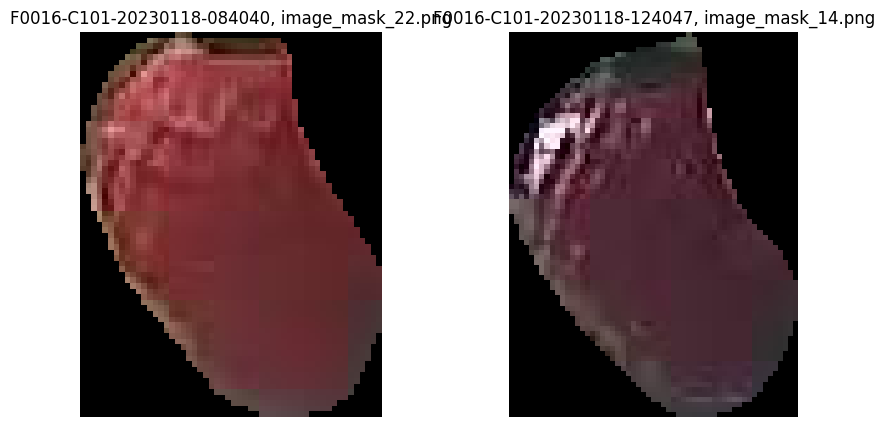

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_16
mask_id                                 42b755924f8868c54a81e7c84e22166a
point_x_x                                                    1808.157959
point_y_x                                                     224.208069
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

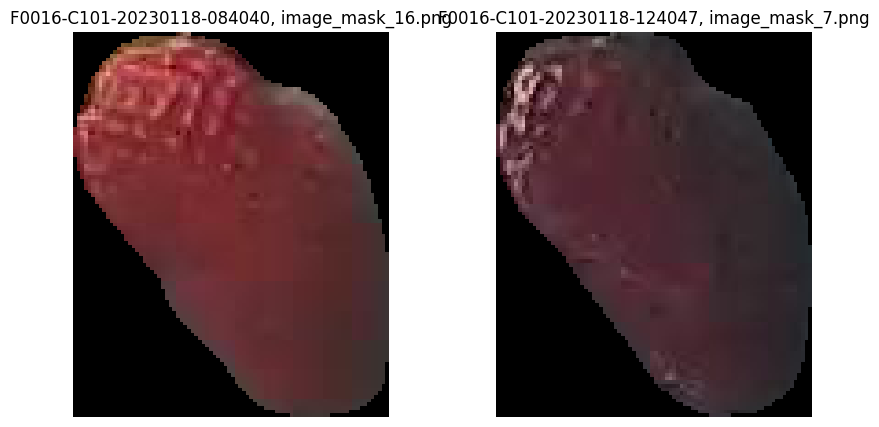

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_18
mask_id                                 60dda1794b389dc392643621fb939691
point_x_x                                                     1495.67041
point_y_x                                                      366.17337
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

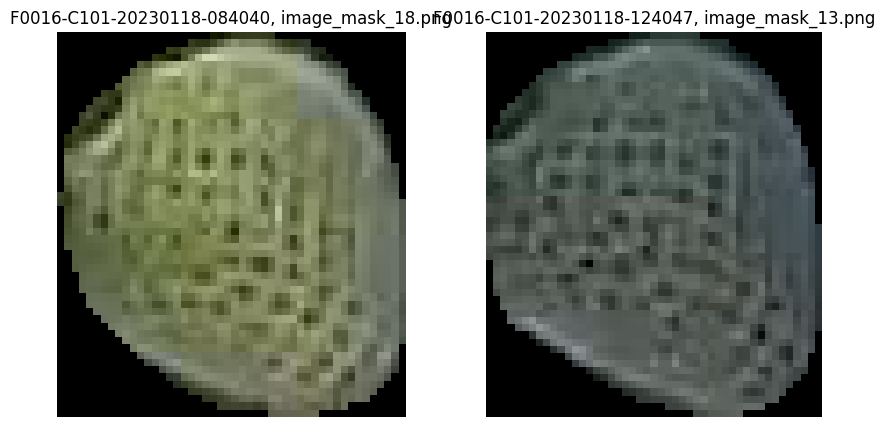

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_33
mask_id                                 69fe7dfd0e39d2e785c88f09c13d0c17
point_x_x                                                    2487.336426
point_y_x                                                     425.349243
output_image_path_x                                    image_mask_33.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

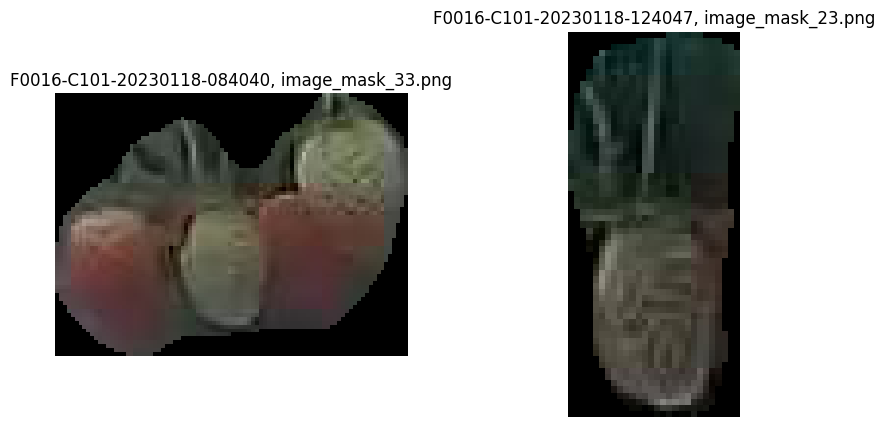

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_29
mask_id                                 6e7c1f9f70cb3c5ac656bf5ab12293f4
point_x_x                                                    2521.656006
point_y_x                                                     134.805099
output_image_path_x                                    image_mask_29.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

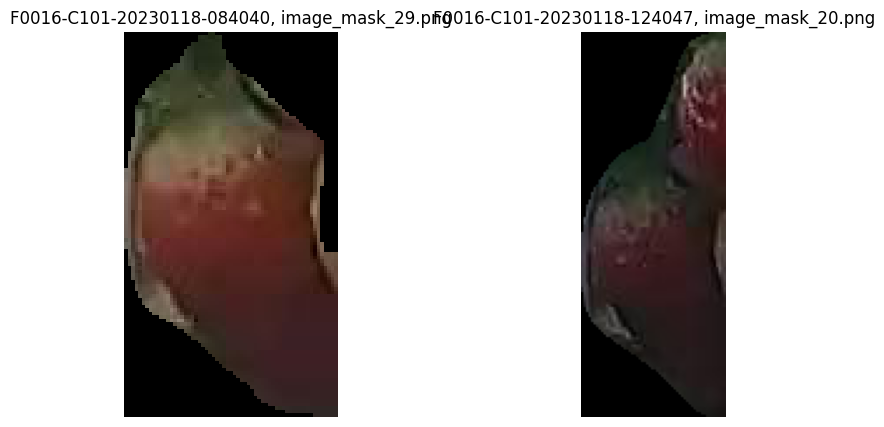

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_32
mask_id                                 78d4fc53208dbd26c310a2b88e041948
point_x_x                                                    2457.650391
point_y_x                                                     434.410767
output_image_path_x                                    image_mask_32.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

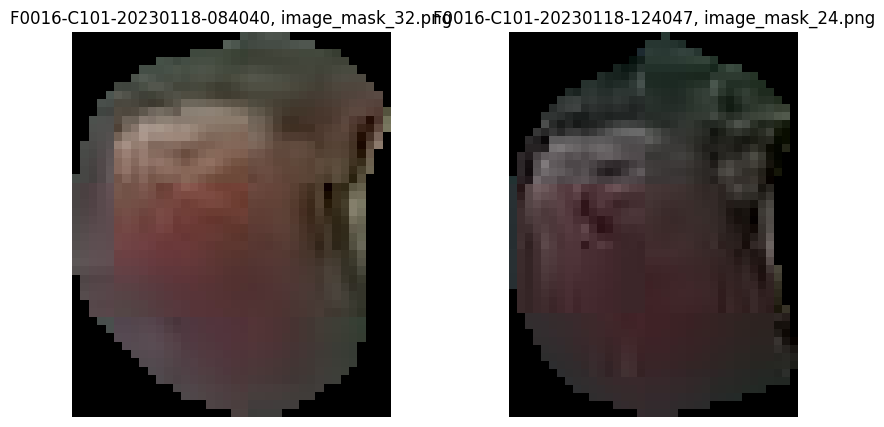

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                  F0016-C101-20230118-084040_7
mask_id                                 7e14f9e2cb86cf9ae45486e65143970c
point_x_x                                                     1120.20874
point_y_x                                                     493.171967
output_image_path_x                                     image_mask_7.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

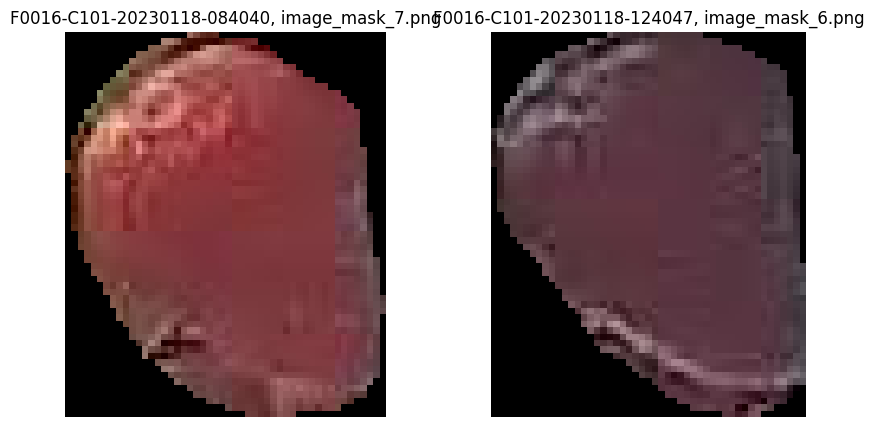

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_28
mask_id                                 7fd0d343e2afa220cf6170347e2e4b82
point_x_x                                                    2254.889893
point_y_x                                                     155.340271
output_image_path_x                                    image_mask_28.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

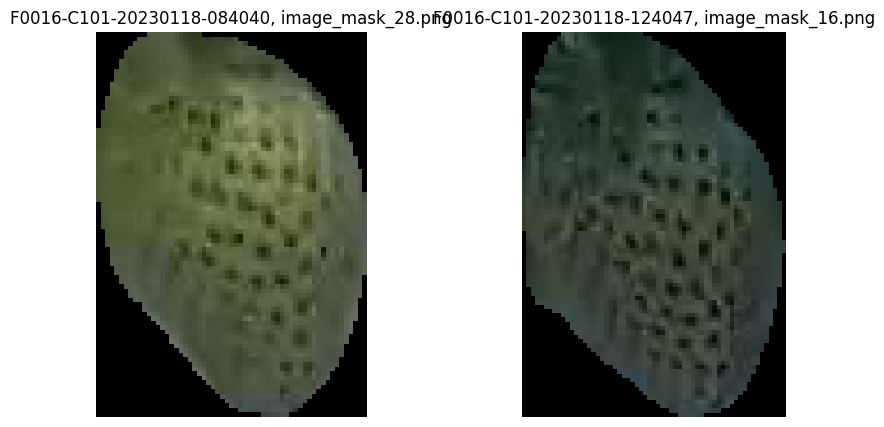

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_23
mask_id                                 85cfd9b0db36889d2176b4a3c2c2a35a
point_x_x                                                     1334.49707
point_y_x                                                     330.121735
output_image_path_x                                    image_mask_23.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

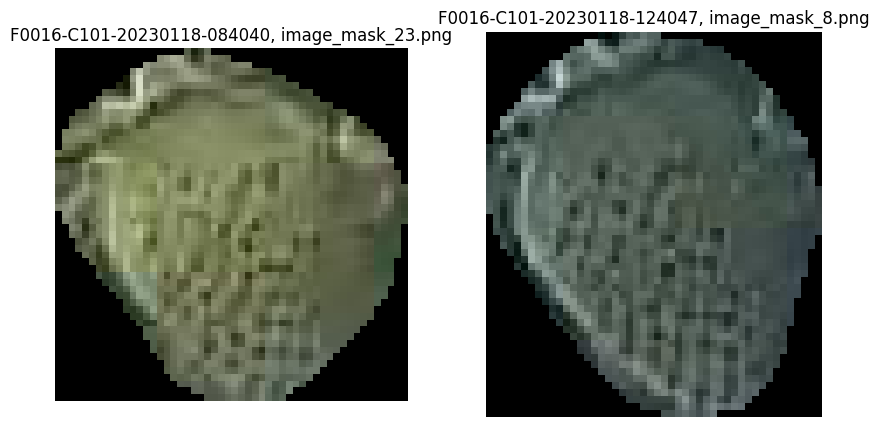

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_14
mask_id                                 901e1081a396e429da80ac36cebb4989
point_x_x                                                    1396.137695
point_y_x                                                      322.88562
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

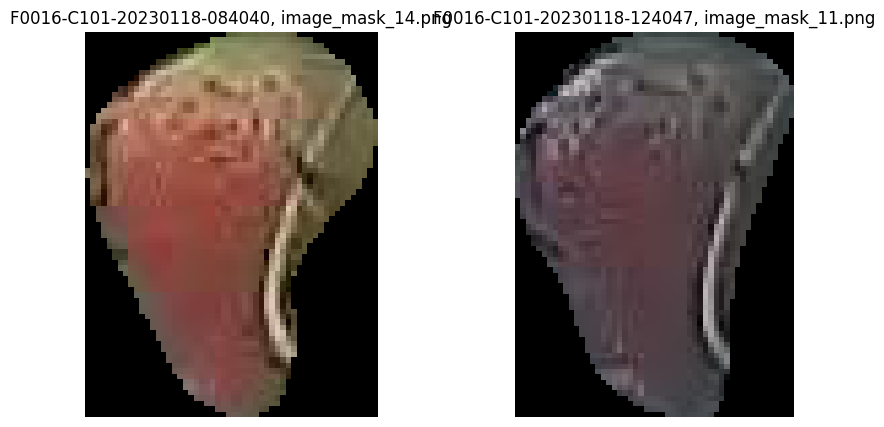

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_25
mask_id                                 a2b5782950f40d8e40a00eaf8f2408ce
point_x_x                                                    1982.687622
point_y_x                                                     112.248917
output_image_path_x                                    image_mask_25.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

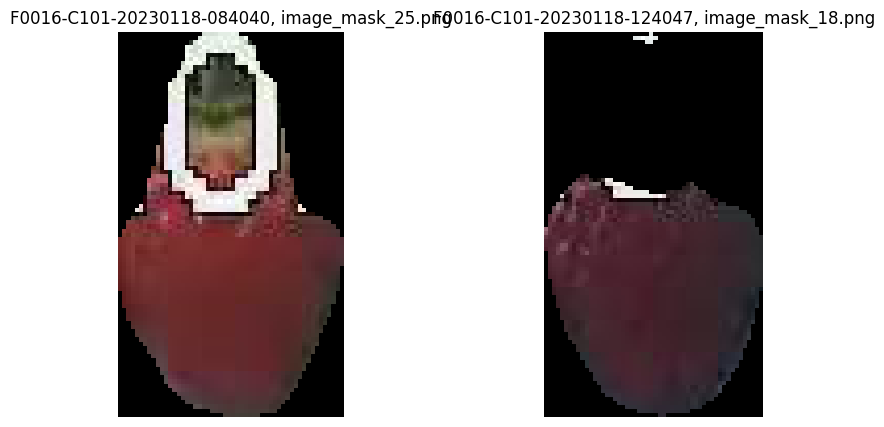

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_26
mask_id                                 adb2946398496b21b1e6377288318bdf
point_x_x                                                     1938.85083
point_y_x                                                     107.828857
output_image_path_x                                    image_mask_26.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

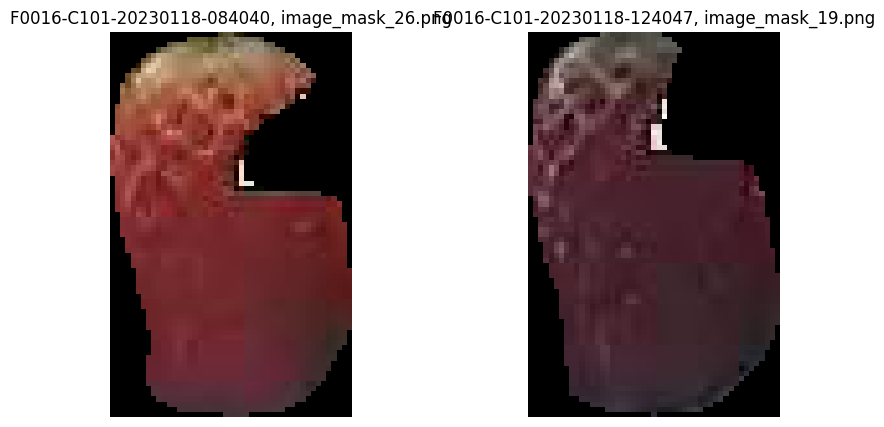

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_13
mask_id                                 b33d2724d2951af3bb160b6f77623b0a
point_x_x                                                    1898.912476
point_y_x                                                     108.832886
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

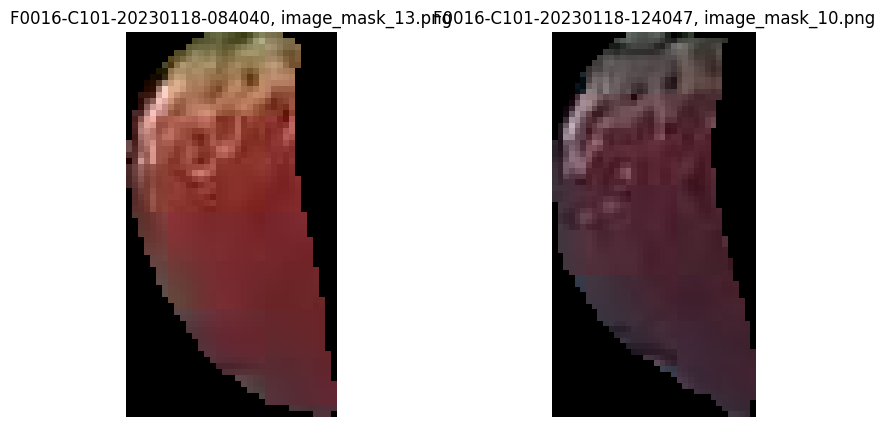

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230118-084040
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230117-163845
mask_num_x                                 F0016-C101-20230118-084040_17
mask_id                                 ecd330d0997cd7ec3decfd6936f8a661
point_x_x                                                    1648.552979
point_y_x                                                     173.146362
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230118-124047
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

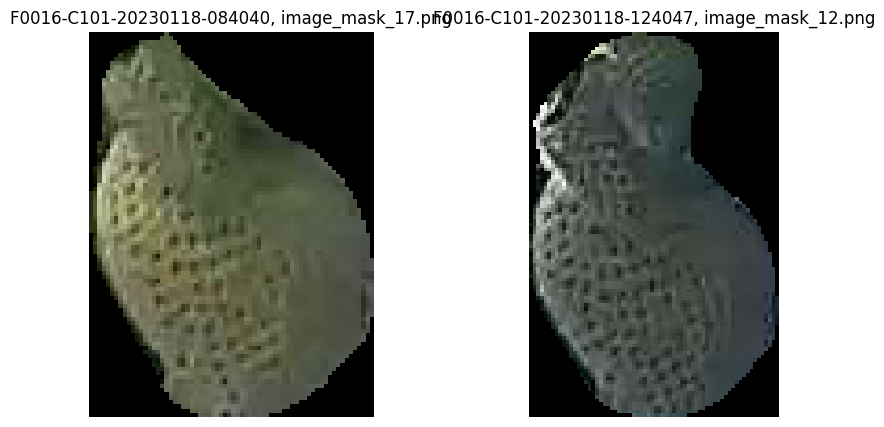

In [80]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = jan_2023[jan_2023["before_img_name"] == "F0016-C101-20230117-163845"]
aug2 = jan_2023[jan_2023["before_img_name"] == "F0016-C101-20230118-084040"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230130-163932
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230130-123956
mask_num_x                                 F0016-C101-20230130-163932_11
mask_id                                 30802cf28412a1c79a6b74407f66d3a0
point_x_x                                                    1821.864868
point_y_x                                                     261.811249
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230131-083954
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

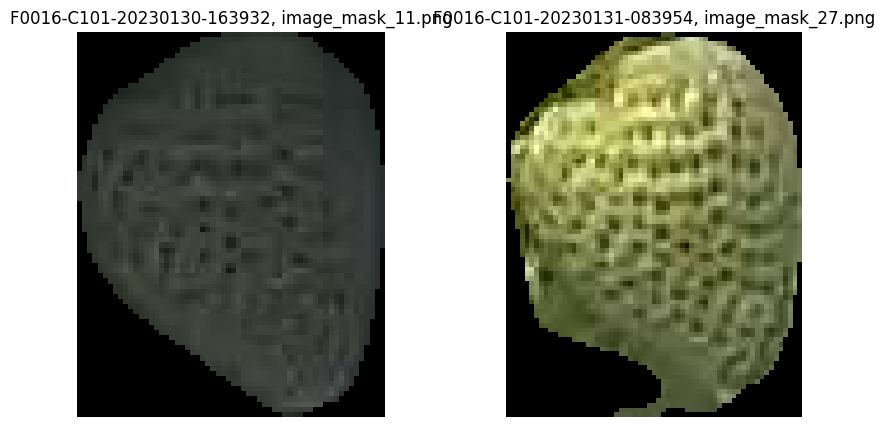

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230130-163932
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230130-123956
mask_num_x                                  F0016-C101-20230130-163932_3
mask_id                                 4db8f8ef97f1451c18499fb53364fc76
point_x_x                                                     465.747192
point_y_x                                                     305.896912
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230131-083954
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

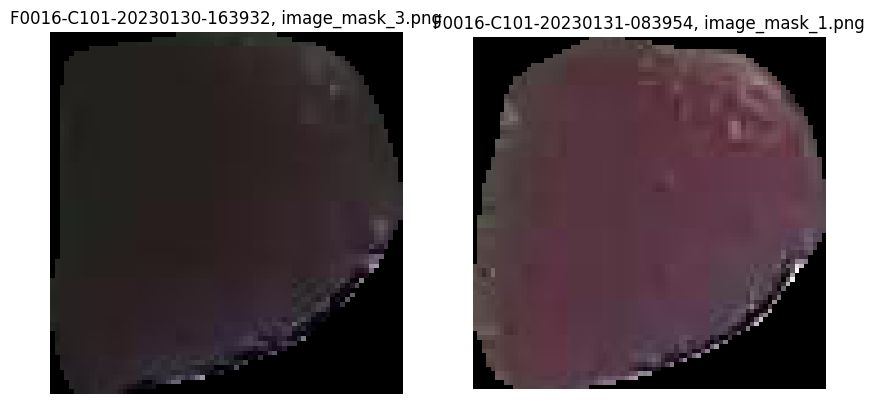

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230130-163932
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230130-123956
mask_num_x                                  F0016-C101-20230130-163932_8
mask_id                                 4fefcdc3b4b2a36e60f7bfd5db7f662c
point_x_x                                                    1455.617432
point_y_x                                                     369.550171
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230131-083954
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

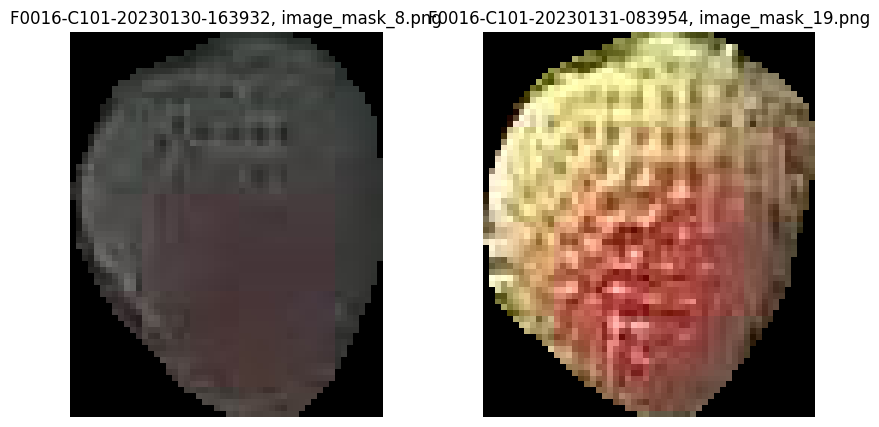

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230130-163932
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230130-123956
mask_num_x                                  F0016-C101-20230130-163932_5
mask_id                                 8613674b73a54d808dd5bb5521ad3f43
point_x_x                                                    1445.411255
point_y_x                                                     282.708374
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230131-083954
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

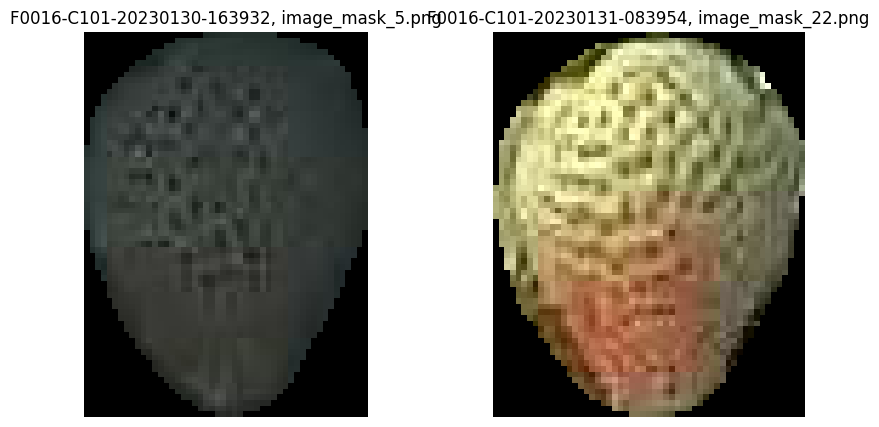

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230130-163932
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230130-123956
mask_num_x                                 F0016-C101-20230130-163932_12
mask_id                                 b9e06928e3c63ecd5ffe1ff8ff1fcf3c
point_x_x                                                    2484.792725
point_y_x                                                     130.776443
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230131-083954
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

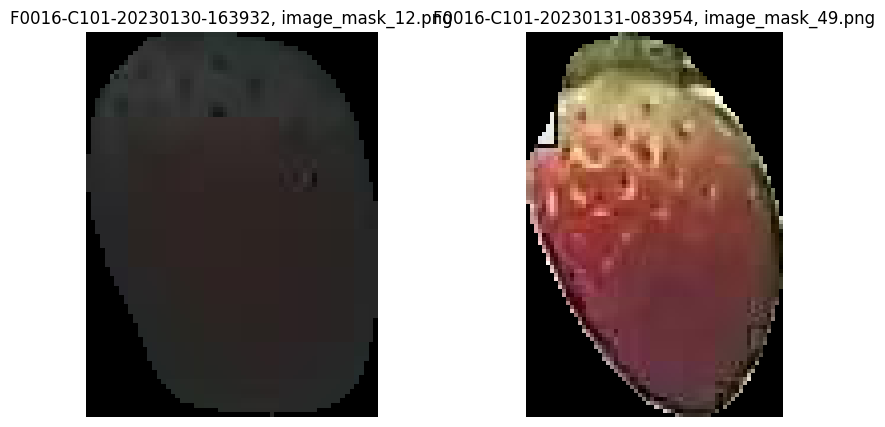

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230130-163932
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230130-123956
mask_num_x                                  F0016-C101-20230130-163932_9
mask_id                                 d225c6fd5c5c3d8a79542cb15aa574fe
point_x_x                                                     1596.14209
point_y_x                                                      94.049103
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230131-083954
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

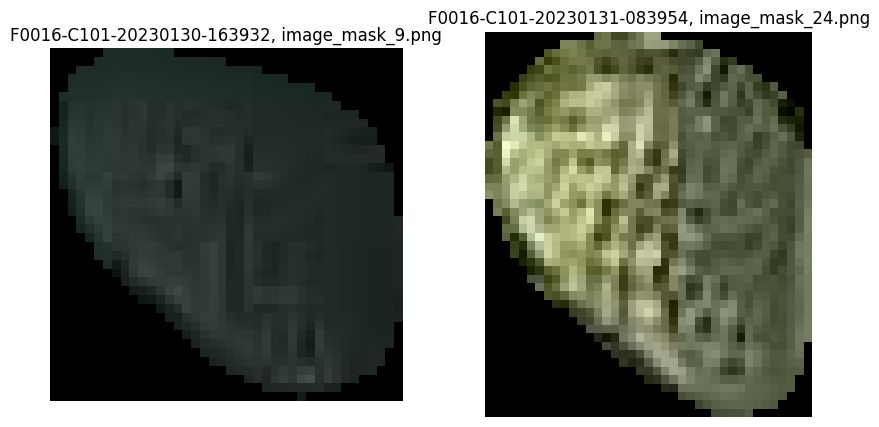

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230130-163932
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230130-123956
mask_num_x                                 F0016-C101-20230130-163932_10
mask_id                                 d87cb52584477983904acf622cf43392
point_x_x                                                    1503.744019
point_y_x                                                     380.102722
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230131-083954
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

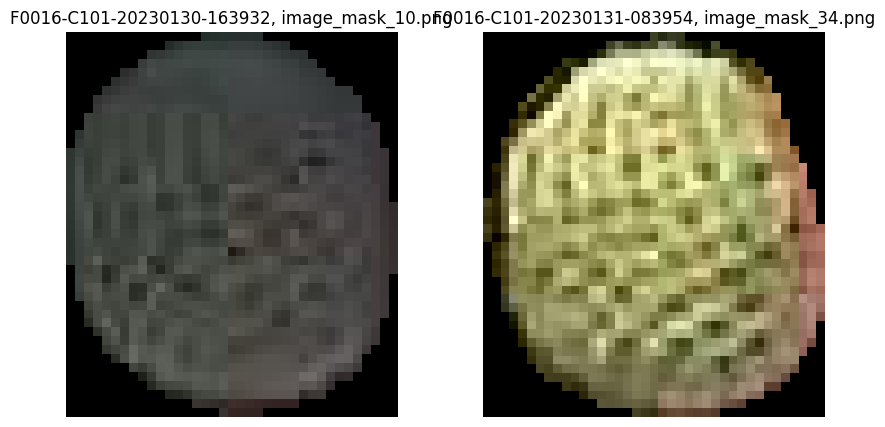

In [83]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = jan_2023[jan_2023["before_img_name"] == "F0016-C101-20230130-123956"]
aug2 = jan_2023[jan_2023["before_img_name"] == "F0016-C101-20230130-163932"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2023년 2월

In [84]:
### 2023년 2월에 해당하는 이미지 필터링
fab_2023 = f0016[(f0016["측정년도"] == 2023) & (f0016["측정월"] == 2)]

# 측정 일자를 datetime으로 변환
fab_2023["측정일자"] = pd.to_datetime(fab_2023["측정일자"])

# 날짜 필터링
fab_2023 = fab_2023[(fab_2023["측정일자"].dt.weekday == 0) | (fab_2023["측정일자"].dt.weekday == 1) | (fab_2023["측정일자"].dt.weekday == 2)]

fab_2023['before_img_name'].unique()

/tmp/ipykernel_266549/4279706989.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fab_2023["측정일자"] = pd.to_datetime(fab_2023["측정일자"])


array(['F0016-C101-20230131-163729', 'F0016-C101-20230201-083946',
       'F0016-C101-20230205-164138', 'F0016-C101-20230206-084210',
       'F0016-C101-20230206-124311', 'F0016-C101-20230206-164144',
       'F0016-C101-20230207-084137', 'F0016-C101-20230207-163832',
       'F0016-C101-20230208-083849', 'F0016-C101-20230212-163538',
       'F0016-C101-20230213-083319', 'F0016-C101-20230213-123255',
       'F0016-C101-20230214-123510', 'F0016-C101-20230214-163330',
       'F0016-C101-20230215-083324', 'F0016-C101-20230215-123444',
       'F0016-C101-20230219-163141', 'F0016-C101-20230220-083300',
       'F0016-C101-20230220-123300', 'F0016-C101-20230220-163314',
       'F0016-C101-20230221-083434', 'F0016-C101-20230221-123300',
       'F0016-C101-20230221-163544', 'F0016-C101-20230222-083501',
       'F0016-C101-20230222-123334', 'F0016-C101-20230226-163338',
       'F0016-C101-20230227-083259', 'F0016-C101-20230227-123332',
       'F0016-C101-20230227-163522', 'F0016-C101-20230228-0835

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                  F0016-C101-20230206-164144_5
mask_id                                 00284dd9c5f1670f89303af343dcdc6c
point_x_x                                                     579.726868
point_y_x                                                     576.218628
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

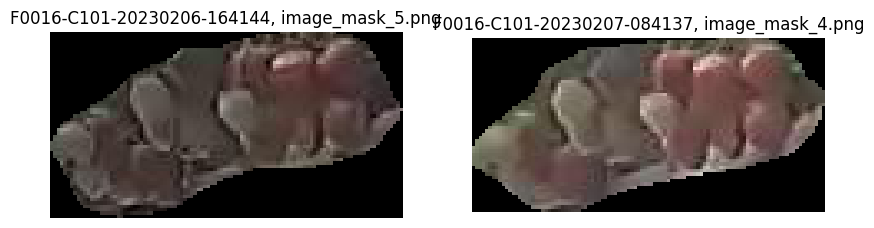

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_52
mask_id                                 03fff0e0c699f2b3280a271a9286dba3
point_x_x                                                    2235.929199
point_y_x                                                     463.585388
output_image_path_x                                    image_mask_52.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

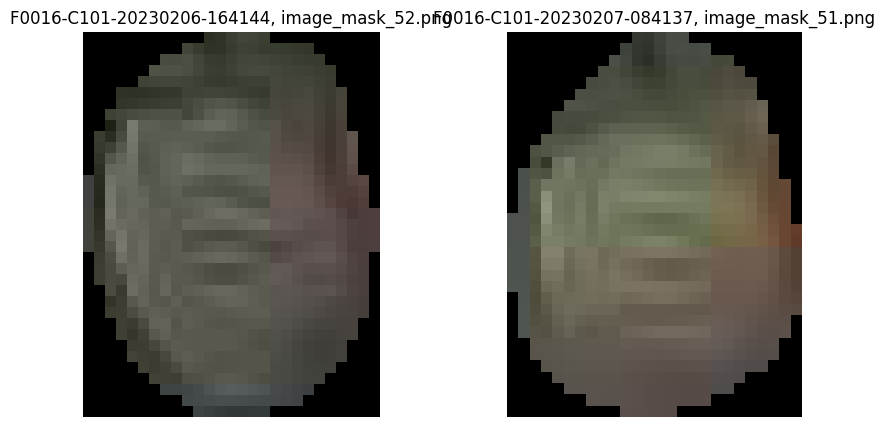

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_48
mask_id                                 1a2c3955017dc7d08c83c02f06c8e82f
point_x_x                                                    2272.760742
point_y_x                                                     245.410248
output_image_path_x                                    image_mask_48.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

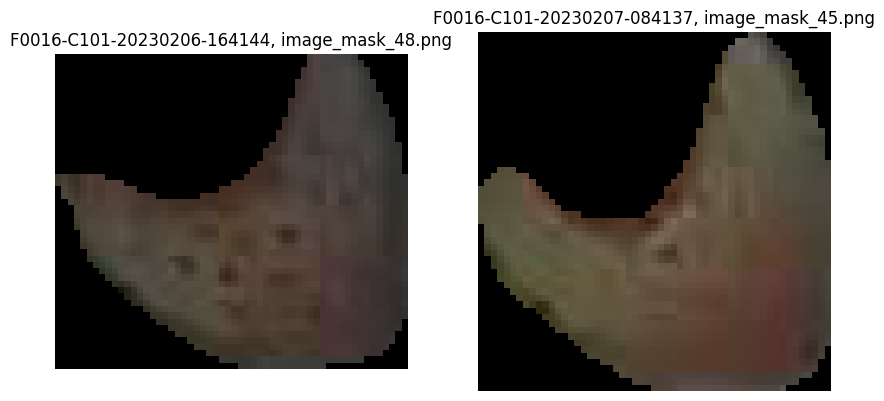

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_14
mask_id                                 2123082eb0b24d05ff2fa620bd20ee40
point_x_x                                                    1183.029541
point_y_x                                                     417.776764
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

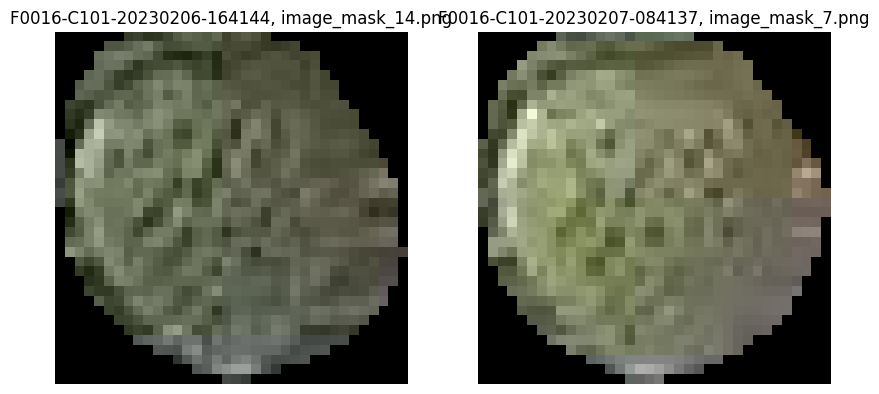

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_11
mask_id                                 251edb01a8cc4656aad650b6bde49e5d
point_x_x                                                       1248.875
point_y_x                                                     549.598389
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

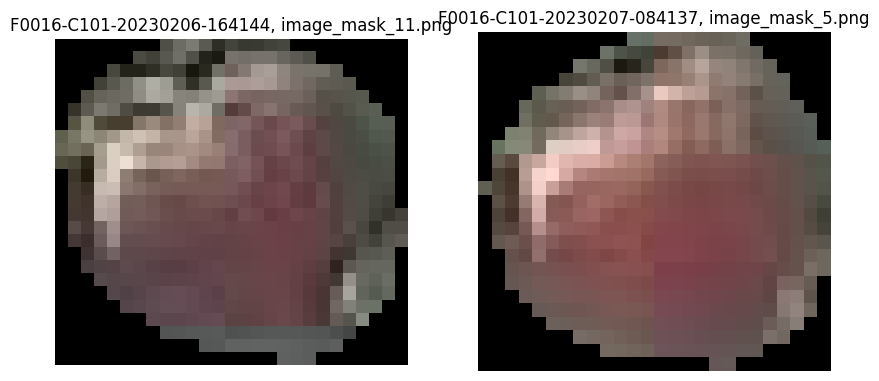

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_51
mask_id                                 2932cd628f5a04106c6d7843d7648cb2
point_x_x                                                    2276.437988
point_y_x                                                     434.526855
output_image_path_x                                    image_mask_51.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

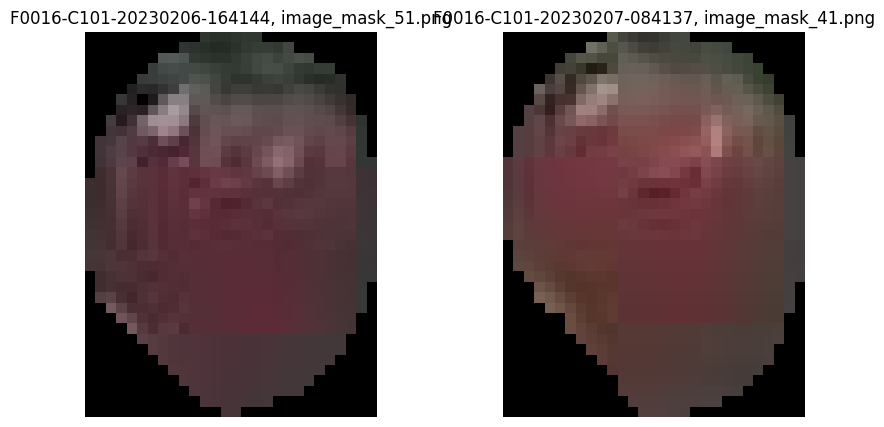

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_25
mask_id                                 3ab310abc640d30588a729645081c6e2
point_x_x                                                    1571.721191
point_y_x                                                     484.533203
output_image_path_x                                    image_mask_25.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

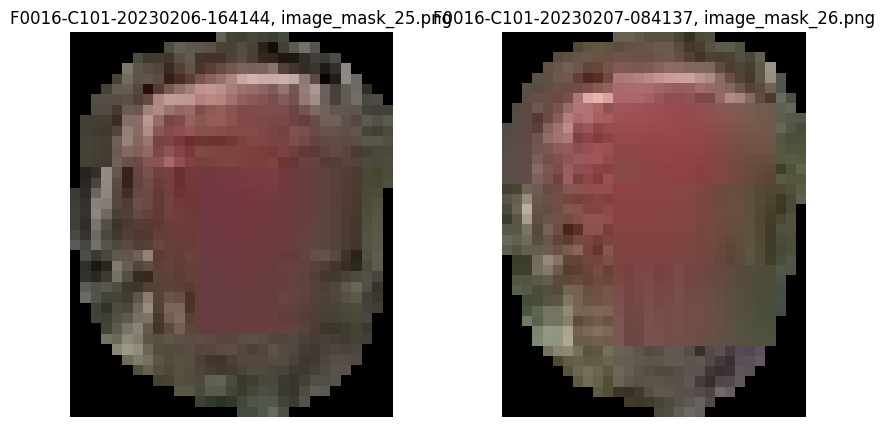

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_30
mask_id                                 3bf9367d622a84ddbfe3e95ddd0b83dc
point_x_x                                                    1861.518433
point_y_x                                                     263.889648
output_image_path_x                                    image_mask_30.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

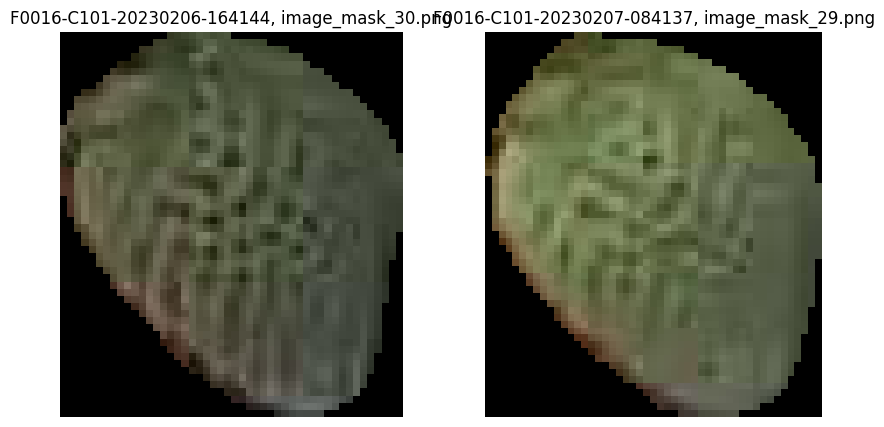

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_50
mask_id                                 4242c9fa7869558424f1efd7dc349701
point_x_x                                                    2259.936523
point_y_x                                                     461.289276
output_image_path_x                                    image_mask_50.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

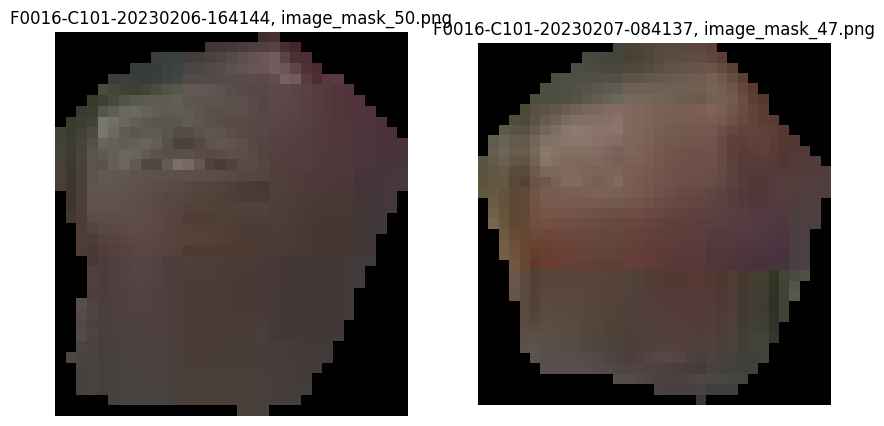

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_27
mask_id                                 46d610709b10a86edee0a78541673e20
point_x_x                                                    1334.641968
point_y_x                                                     344.049072
output_image_path_x                                    image_mask_27.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

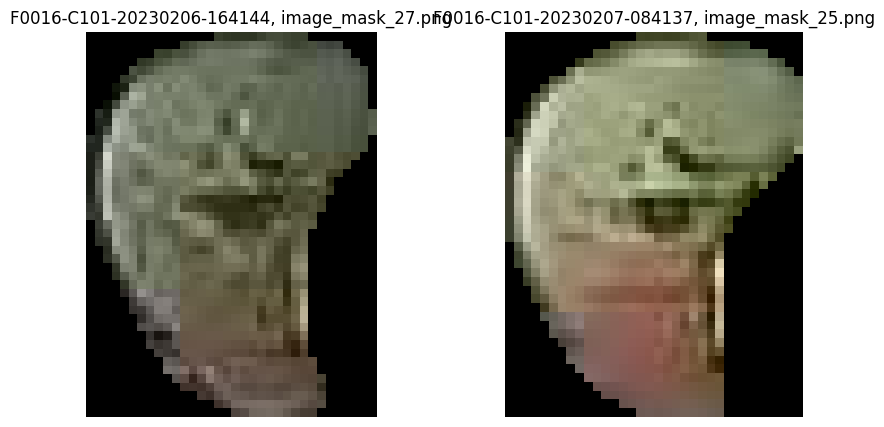

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                  F0016-C101-20230206-164144_1
mask_id                                 489b35d10d75cbf385e597c3dade4527
point_x_x                                                     484.132568
point_y_x                                                     221.363419
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

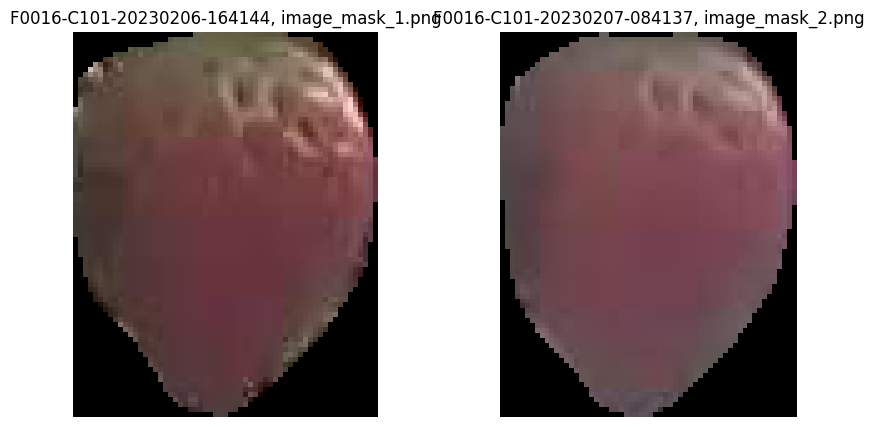

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_22
mask_id                                 48f798ff642c6ded02b208776a409414
point_x_x                                                     1647.08667
point_y_x                                                     110.915009
output_image_path_x                                    image_mask_22.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

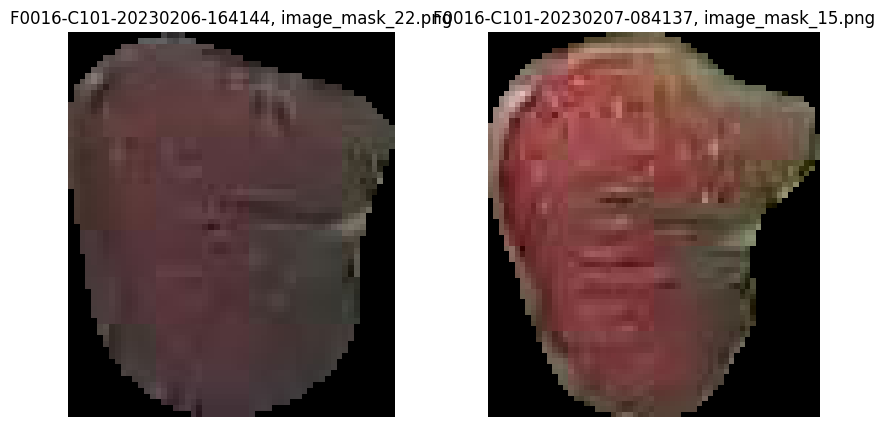

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_23
mask_id                                 49ee47e25787b60c23fb867c2201b8ea
point_x_x                                                    1420.348389
point_y_x                                                     320.528015
output_image_path_x                                    image_mask_23.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

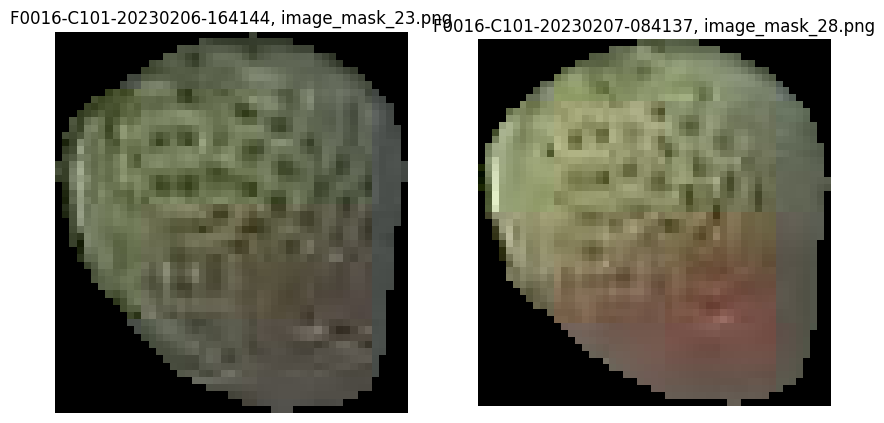

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                  F0016-C101-20230206-164144_2
mask_id                                 50398c67658de31585564db8871709ac
point_x_x                                                     521.010071
point_y_x                                                     200.196808
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

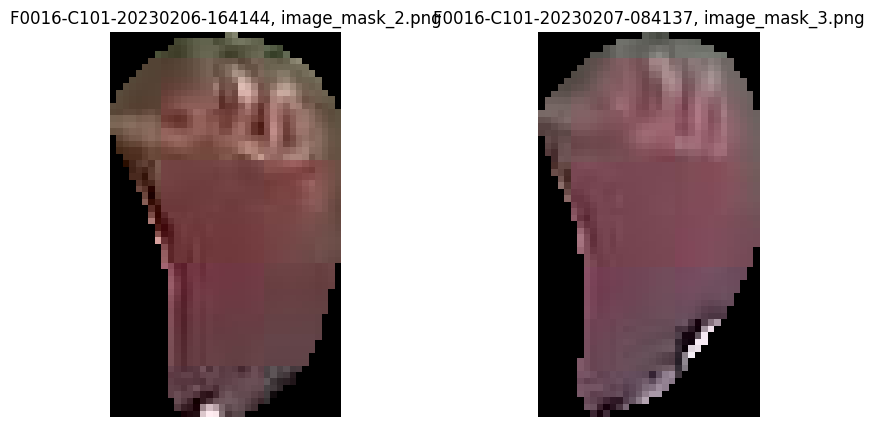

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_18
mask_id                                 525902faf379799c622c21b51a060999
point_x_x                                                    1525.230835
point_y_x                                                     406.567047
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

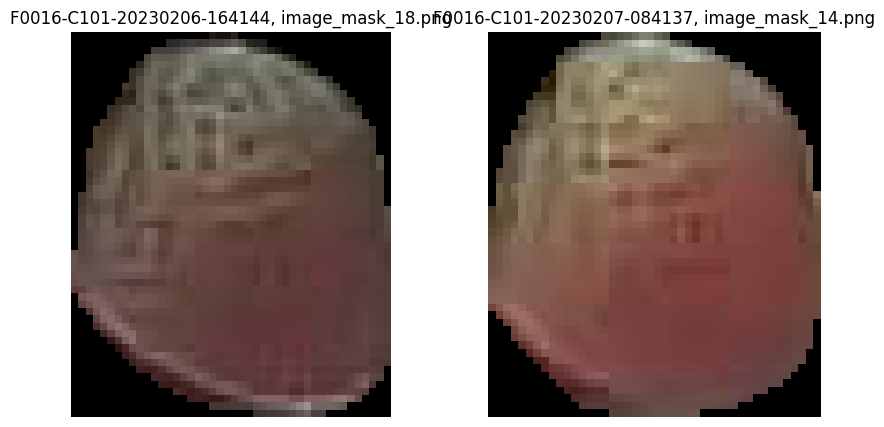

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_38
mask_id                                 52ae2e3acc0151a3569416fcb33c054b
point_x_x                                                    1490.481812
point_y_x                                                     369.985596
output_image_path_x                                    image_mask_38.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

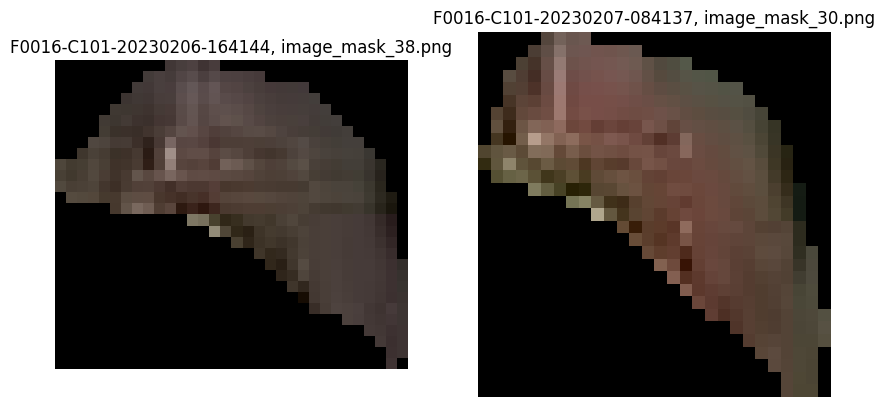

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_24
mask_id                                 54d3a82a27503b529dc629507880234c
point_x_x                                                    1879.698975
point_y_x                                                     223.399155
output_image_path_x                                    image_mask_24.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

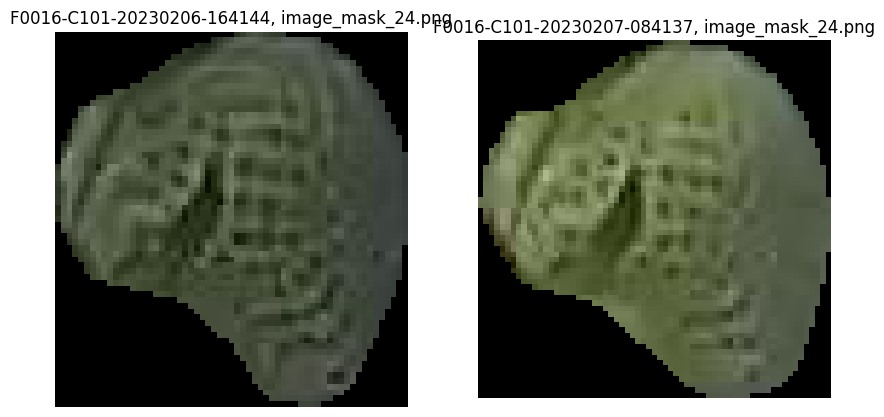

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_56
mask_id                                 5fd79f21c0f05b4cdf7513fc49886480
point_x_x                                                    2176.757324
point_y_x                                                     226.821899
output_image_path_x                                    image_mask_56.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

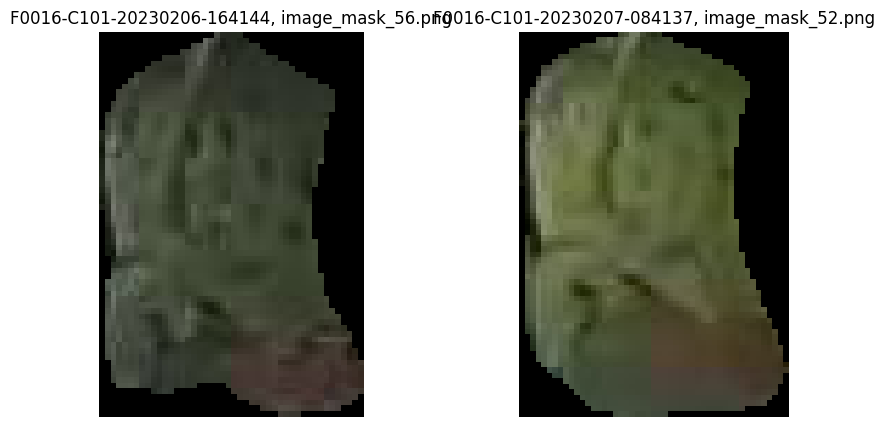

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_28
mask_id                                 6822a54c78c4cce7de096aeec6c9c4b2
point_x_x                                                    1639.748779
point_y_x                                                     288.842957
output_image_path_x                                    image_mask_28.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

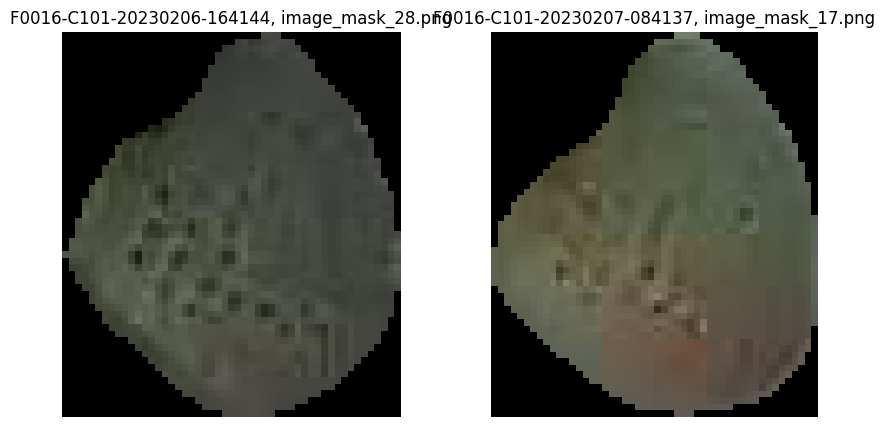

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_54
mask_id                                 7a360c4d724152efa141043c6f343f71
point_x_x                                                     2215.10791
point_y_x                                                     235.741043
output_image_path_x                                    image_mask_54.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

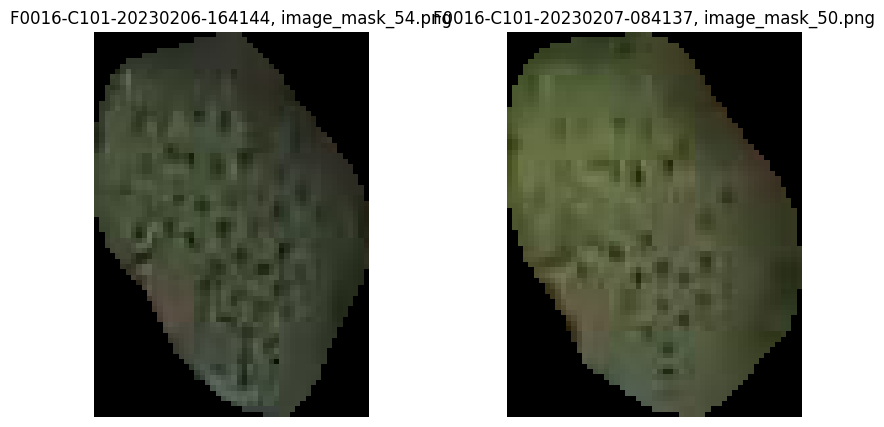

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_17
mask_id                                 7d0c8f159a31618dbfc14d4df1a77c76
point_x_x                                                    1650.857422
point_y_x                                                     209.926605
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

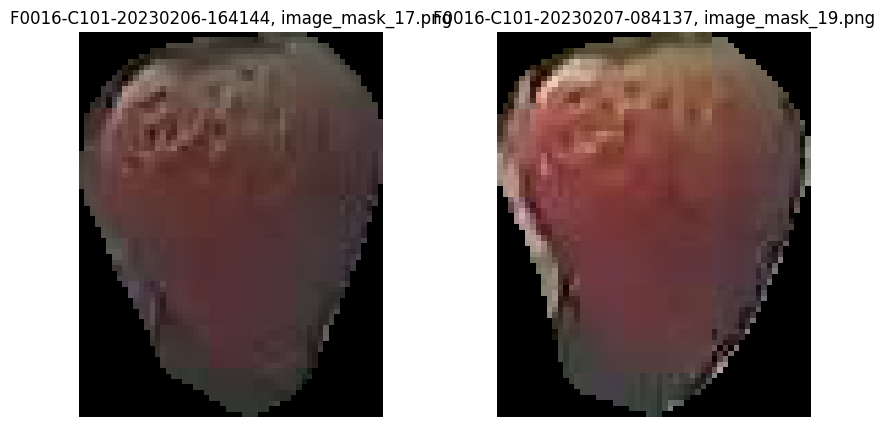

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_16
mask_id                                 80dc11e984b277a9adc332e26c169d66
point_x_x                                                    1263.508789
point_y_x                                                     401.284241
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

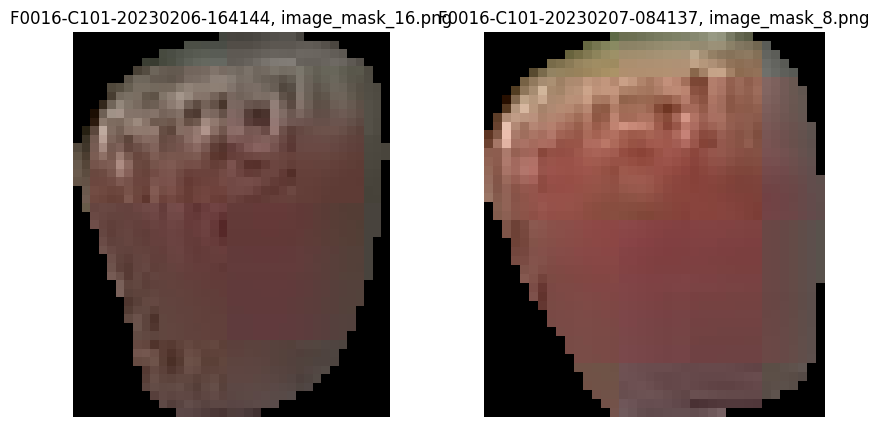

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_47
mask_id                                 811b1c08dbd1f1c54601305a981528bb
point_x_x                                                    2113.665527
point_y_x                                                     443.761993
output_image_path_x                                    image_mask_47.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

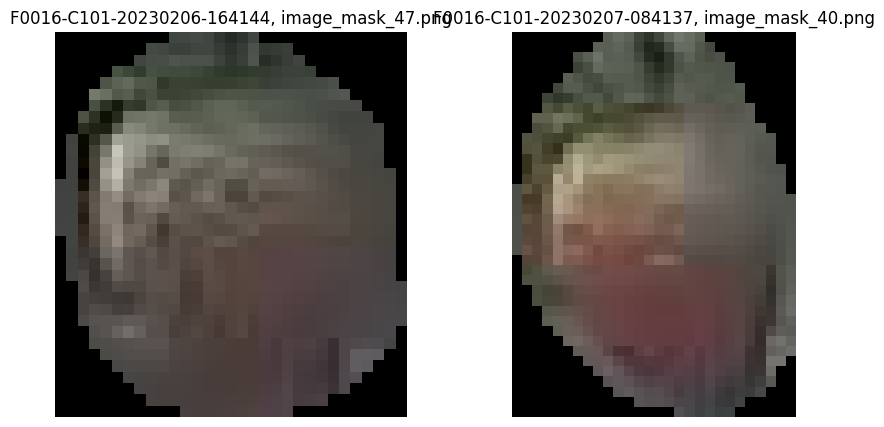

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_26
mask_id                                 85cfd9b0db36889d2176b4a3c2c2a35a
point_x_x                                                    1361.768799
point_y_x                                                     354.392487
output_image_path_x                                    image_mask_26.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

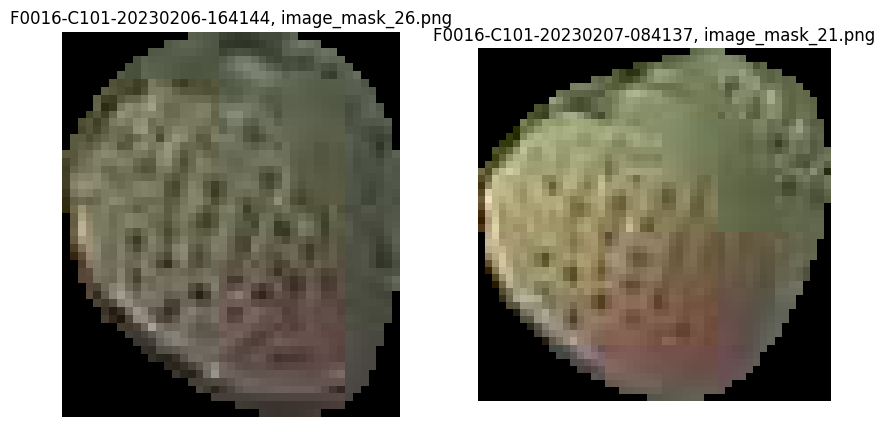

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_21
mask_id                                 8698590f78ab7e4a5a370bc342c943ec
point_x_x                                                    1437.417236
point_y_x                                                     407.572449
output_image_path_x                                    image_mask_21.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

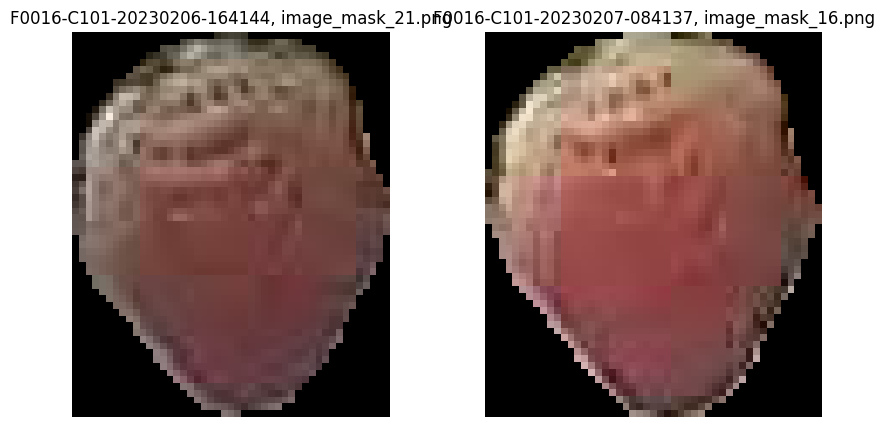

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_12
mask_id                                 96c13a4b82d00b03bab75ae71863c221
point_x_x                                                    1214.799683
point_y_x                                                     402.346069
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

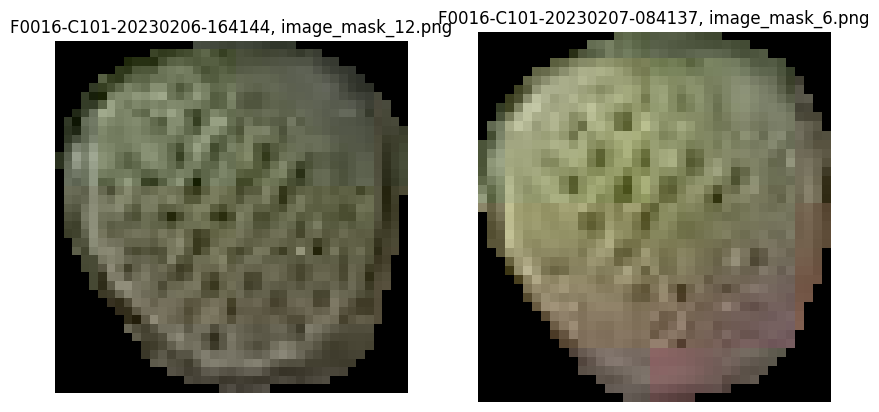

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                  F0016-C101-20230206-164144_3
mask_id                                 a7efc2930e74cfc761490ffb381ba379
point_x_x                                                     560.516724
point_y_x                                                     207.908783
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

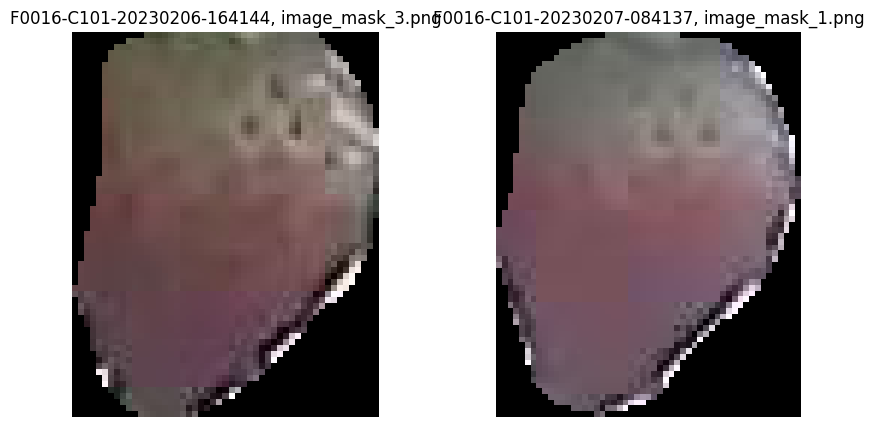

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_29
mask_id                                 ab8176b2eebfd0efa8b1cf198579caf6
point_x_x                                                    1818.206177
point_y_x                                                     368.255463
output_image_path_x                                    image_mask_29.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

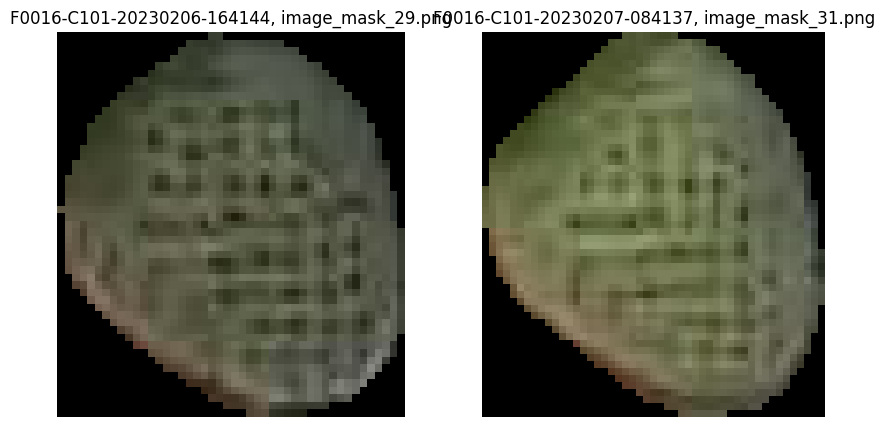

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_57
mask_id                                 b4517f8118446f0d1817435f65cd139f
point_x_x                                                    2015.044434
point_y_x                                                     285.206543
output_image_path_x                                    image_mask_57.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

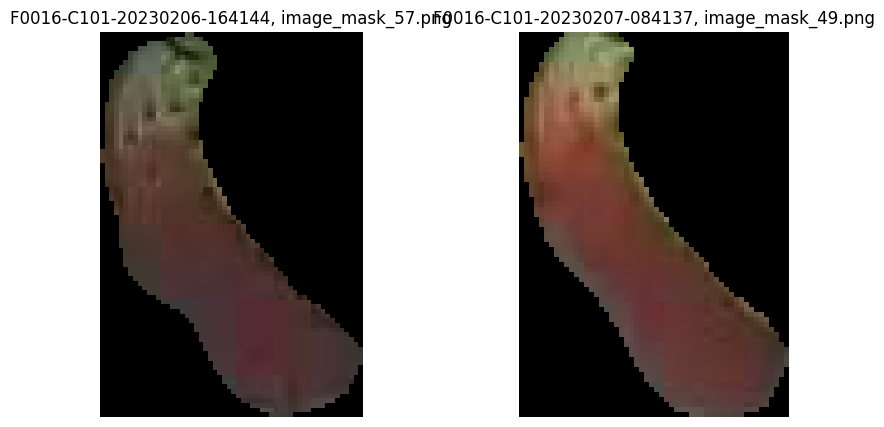

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_46
mask_id                                 b65f5744e34a90a9570d745cbff994bd
point_x_x                                                    2249.962891
point_y_x                                                     284.543152
output_image_path_x                                    image_mask_46.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

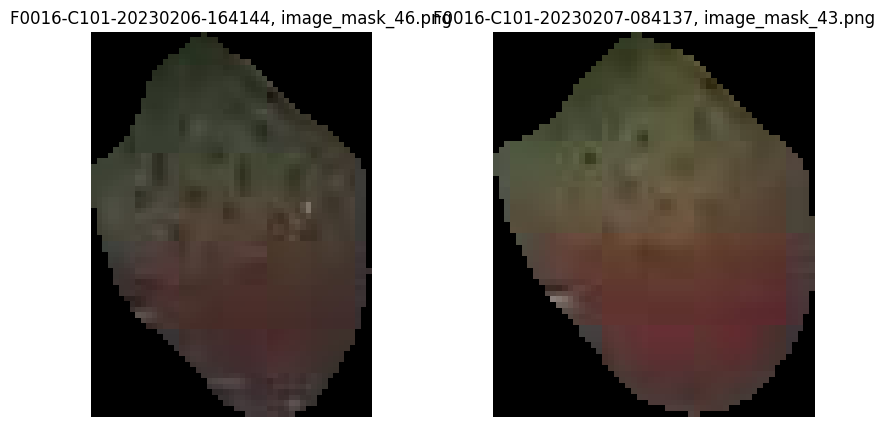

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_45
mask_id                                 baf27134c7ce1ce6081b5fb48ca97597
point_x_x                                                    1966.163086
point_y_x                                                     279.493408
output_image_path_x                                    image_mask_45.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

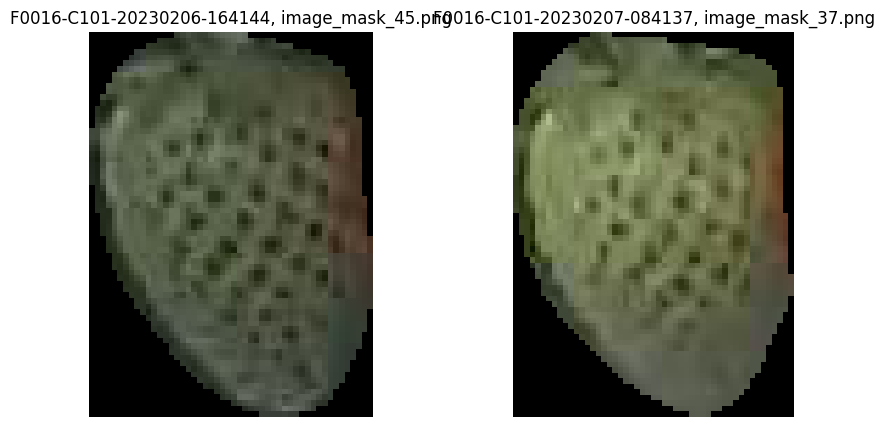

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_44
mask_id                                 d1efe92e026a4d1086981ff2e8373a92
point_x_x                                                     2255.83667
point_y_x                                                     200.173157
output_image_path_x                                    image_mask_44.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

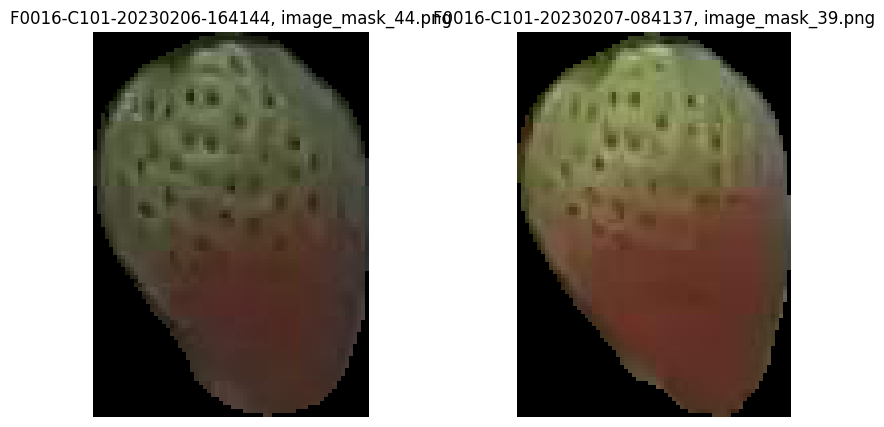

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_19
mask_id                                 d225c6fd5c5c3d8a79542cb15aa574fe
point_x_x                                                    1599.851807
point_y_x                                                     110.322716
output_image_path_x                                    image_mask_19.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

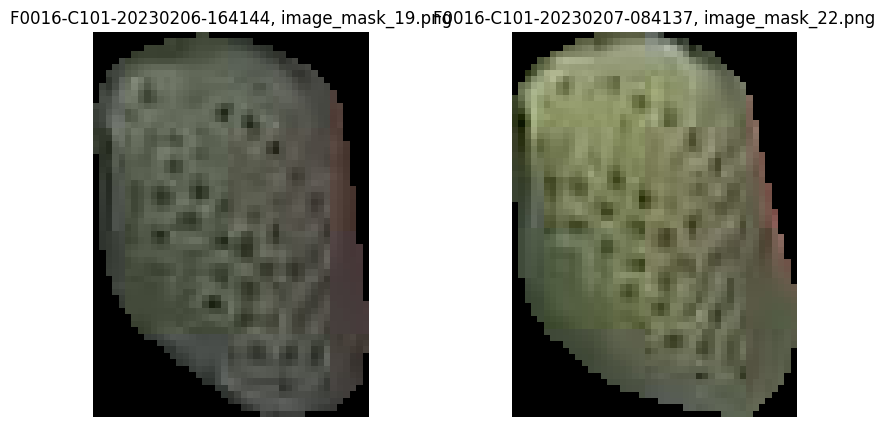

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_13
mask_id                                 e41b0c7de02a18234a7014c7a233ed55
point_x_x                                                     698.299438
point_y_x                                                     524.491943
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

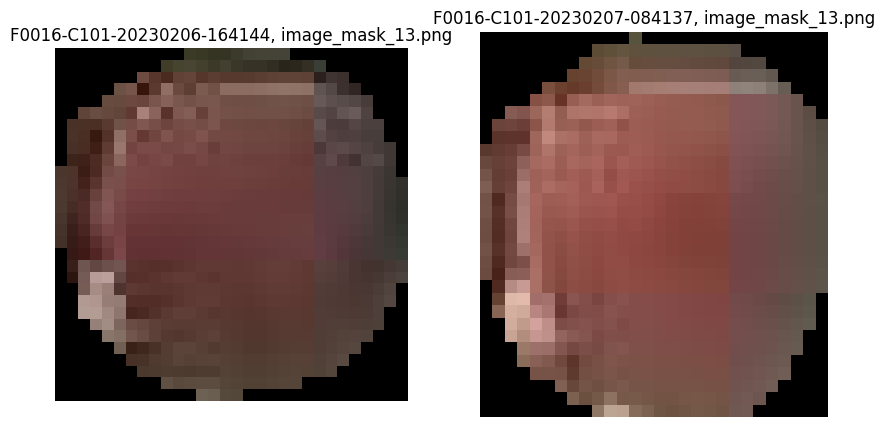

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_43
mask_id                                 f1cb753a4b2746b2401426ca5cde4e42
point_x_x                                                    2199.787598
point_y_x                                                     429.029755
output_image_path_x                                    image_mask_43.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

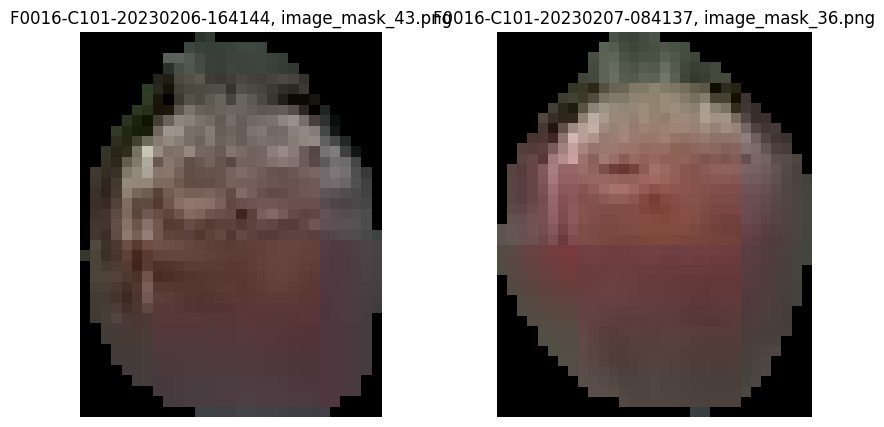

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_20
mask_id                                 f4ad7fdb1f185738b1855bd39736999b
point_x_x                                                    1607.865234
point_y_x                                                     256.099884
output_image_path_x                                    image_mask_20.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

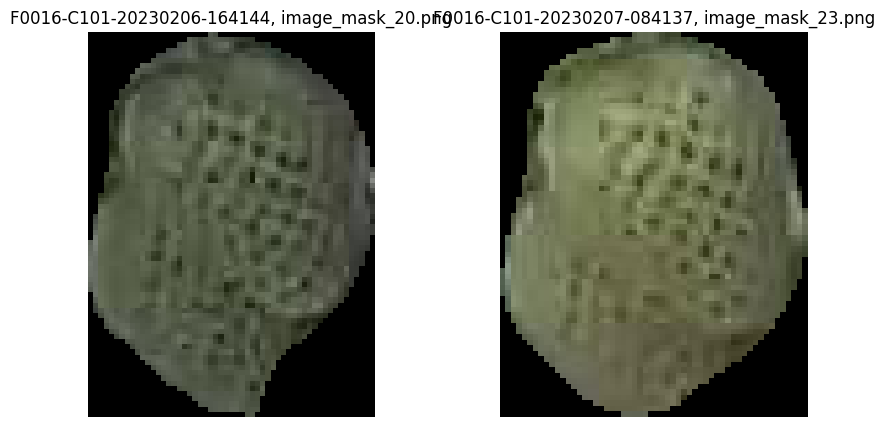

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_32
mask_id                                 f6b894d72c28b11f236cae17763404ed
point_x_x                                                    1482.027832
point_y_x                                                     397.930725
output_image_path_x                                    image_mask_32.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

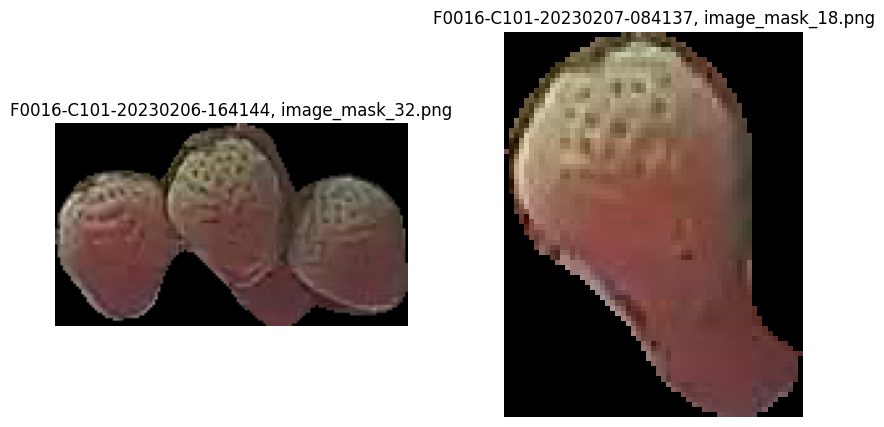

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_32
mask_id                                 f6b894d72c28b11f236cae17763404ed
point_x_x                                                    1482.027832
point_y_x                                                     397.930725
output_image_path_x                                    image_mask_32.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

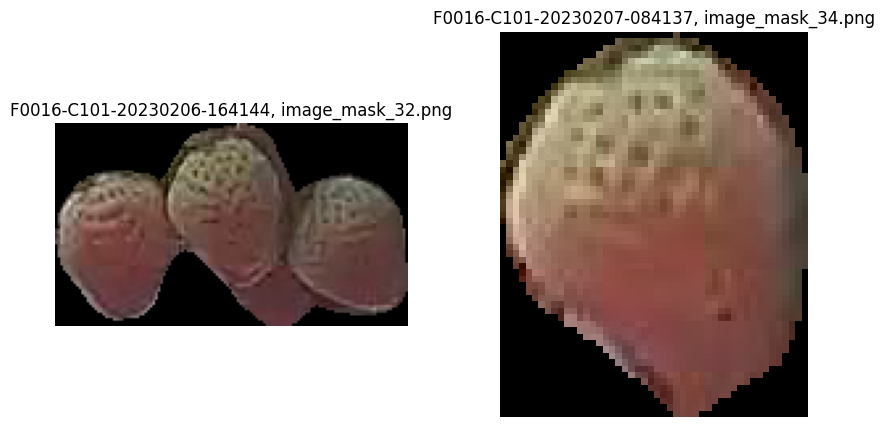

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_36
mask_id                                 f6b894d72c28b11f236cae17763404ed
point_x_x                                                    1479.209473
point_y_x                                                     395.404724
output_image_path_x                                    image_mask_36.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

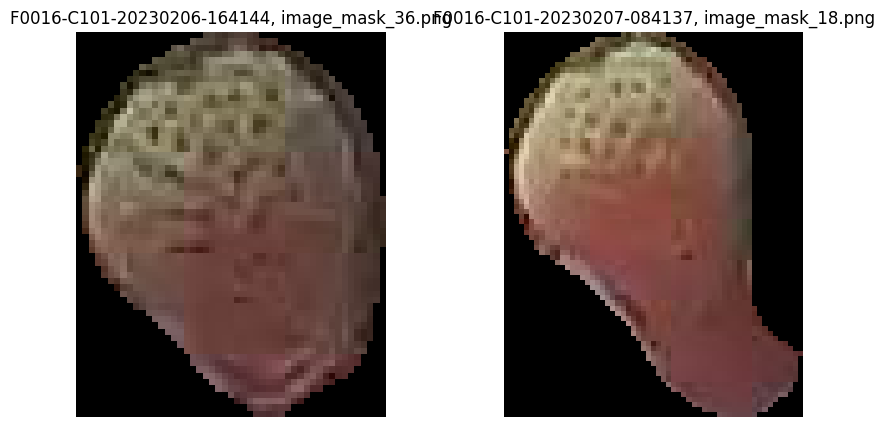

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_36
mask_id                                 f6b894d72c28b11f236cae17763404ed
point_x_x                                                    1479.209473
point_y_x                                                     395.404724
output_image_path_x                                    image_mask_36.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

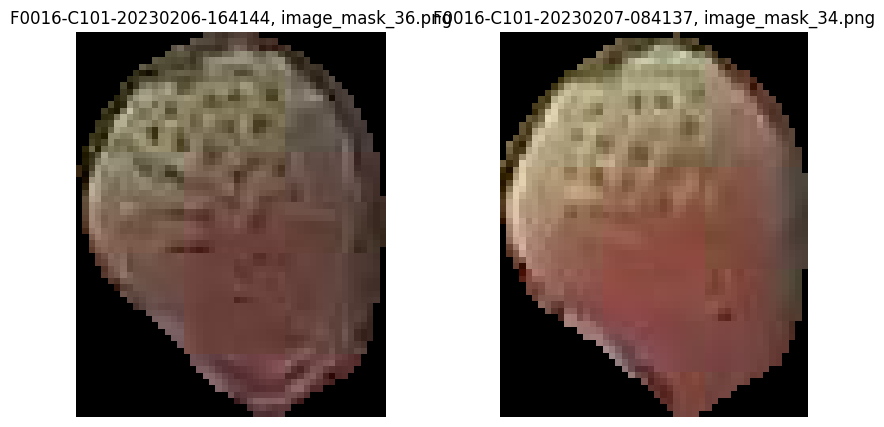

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_33
mask_id                                 f6c76c8a2477f724a8533236bff08fa2
point_x_x                                                     1788.36377
point_y_x                                                     341.006165
output_image_path_x                                    image_mask_33.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

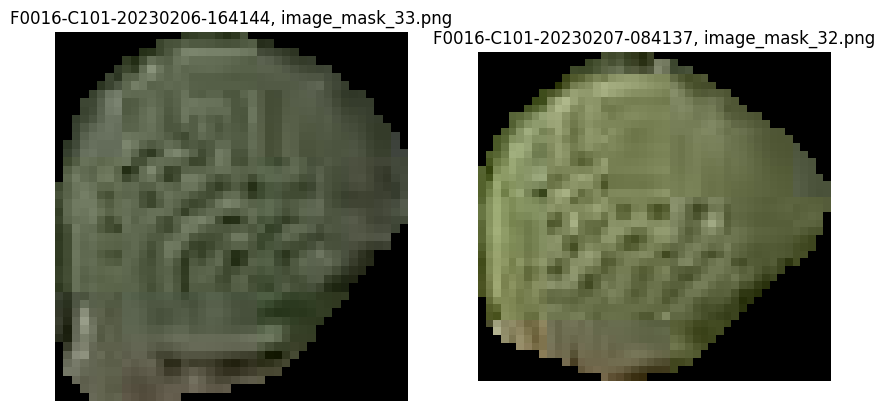

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230206-164144
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230206-124311
mask_num_x                                 F0016-C101-20230206-164144_42
mask_id                                 fd6d0b528b853417dcb2b215e5e315b5
point_x_x                                                    2075.550293
point_y_x                                                     242.973007
output_image_path_x                                    image_mask_42.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230207-084137
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

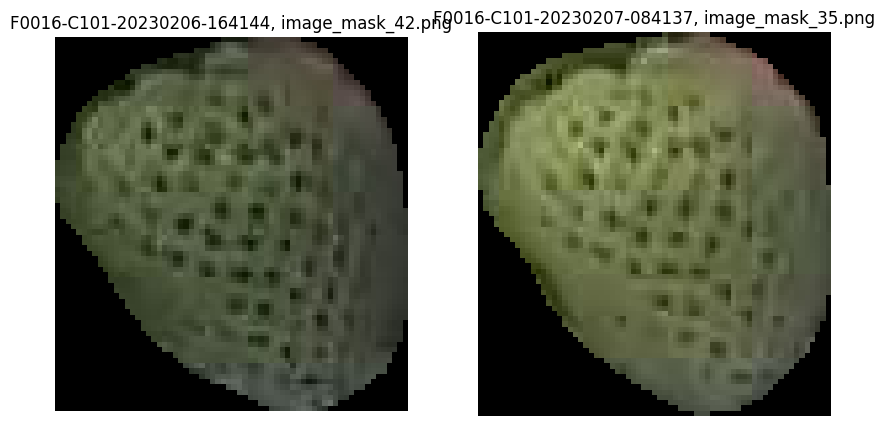

In [85]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = fab_2023[fab_2023["before_img_name"] == "F0016-C101-20230206-124311"]
aug2 = fab_2023[fab_2023["before_img_name"] == "F0016-C101-20230206-164144"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                  F0016-C101-20230220-163314_6
mask_id                                 0a0f827fed36640ab639e76be7e4e472
point_x_x                                                     395.109558
point_y_x                                                     364.469116
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

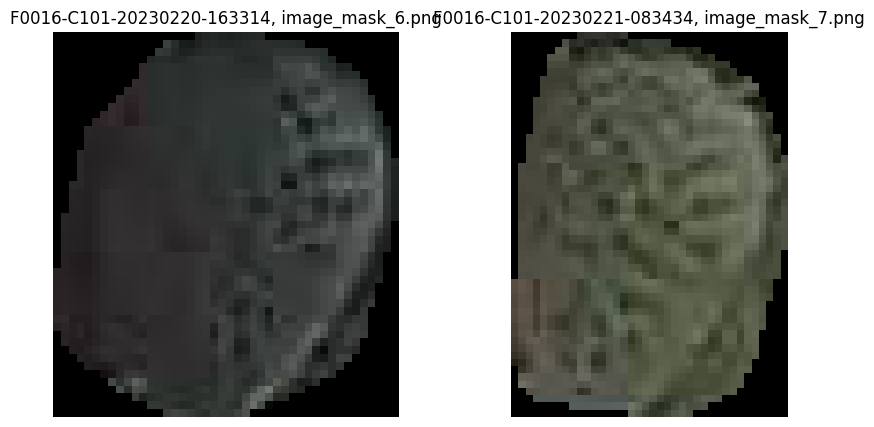

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_30
mask_id                                 0b5e8de6f57340618cb6b68322a7c5aa
point_x_x                                                    2124.432861
point_y_x                                                     191.123337
output_image_path_x                                    image_mask_30.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

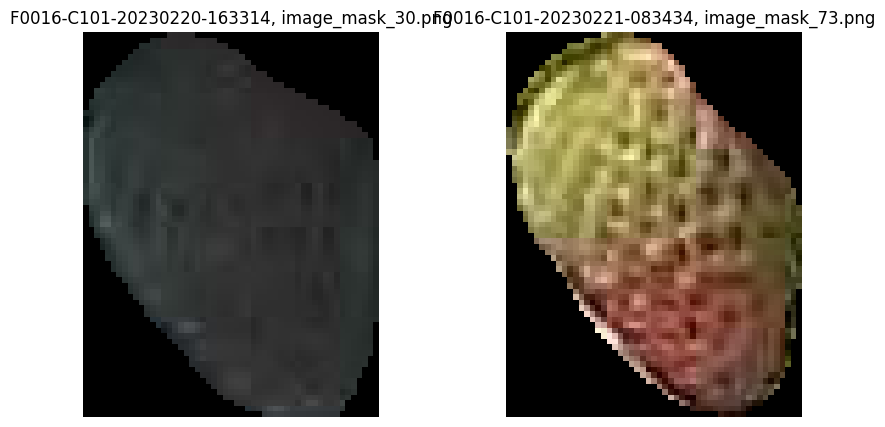

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_23
mask_id                                 16960418505c4cffa11fc24c40f64507
point_x_x                                                    1485.668213
point_y_x                                                      310.70932
output_image_path_x                                    image_mask_23.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

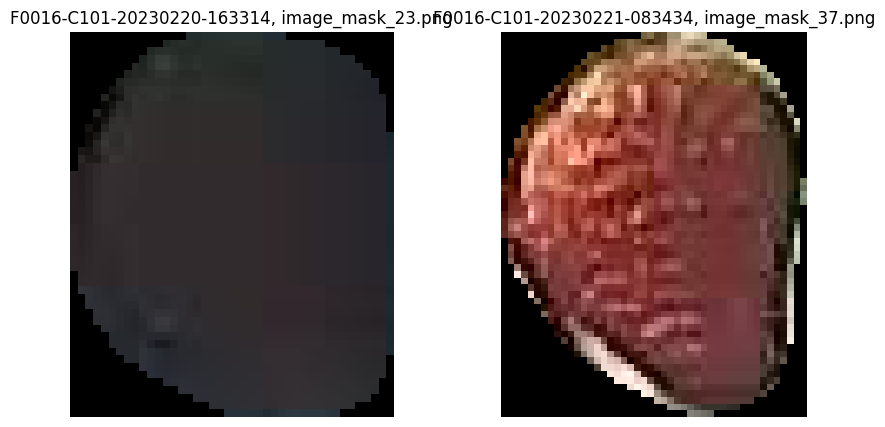

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                  F0016-C101-20230220-163314_5
mask_id                                 21a875415a2e43a0fad9d060c4a76b61
point_x_x                                                     426.601196
point_y_x                                                     361.150269
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

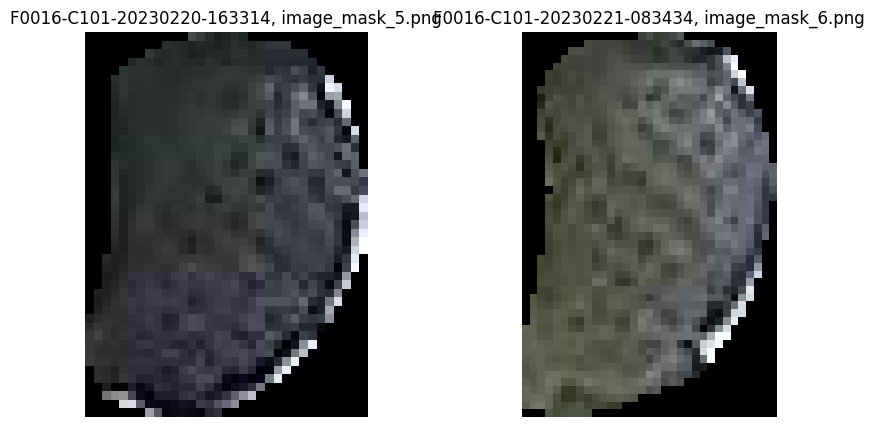

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                  F0016-C101-20230220-163314_4
mask_id                                 23009ae8ad48e62140105297cf267171
point_x_x                                                     526.339905
point_y_x                                                      66.596817
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

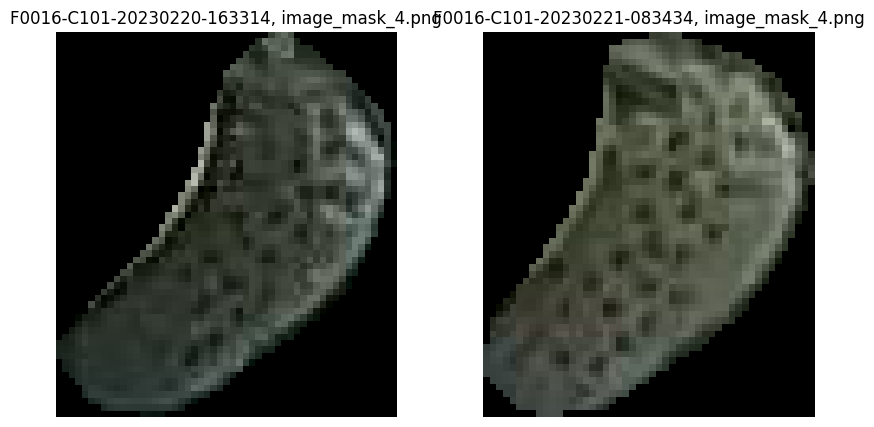

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_21
mask_id                                 277310af2ecf050d8a91a18d4fb448d2
point_x_x                                                    1434.065186
point_y_x                                                     216.300842
output_image_path_x                                    image_mask_21.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

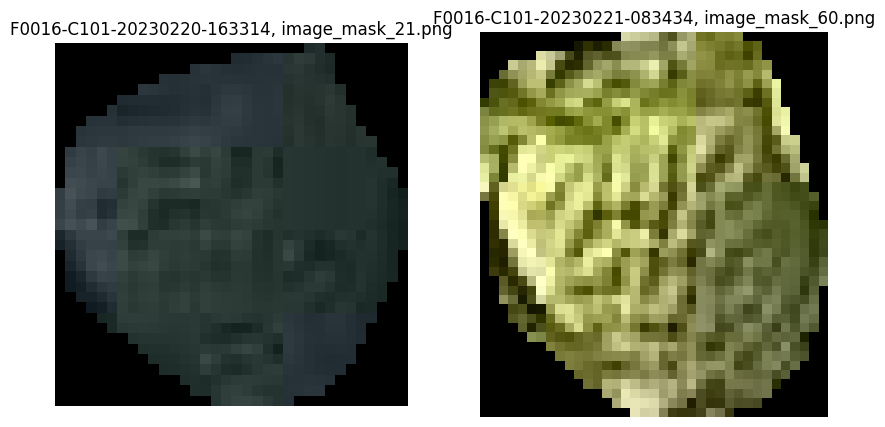

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_28
mask_id                                 2cfee62864a9b39961b5b69091ea096a
point_x_x                                                    2138.397217
point_y_x                                                      139.64653
output_image_path_x                                    image_mask_28.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

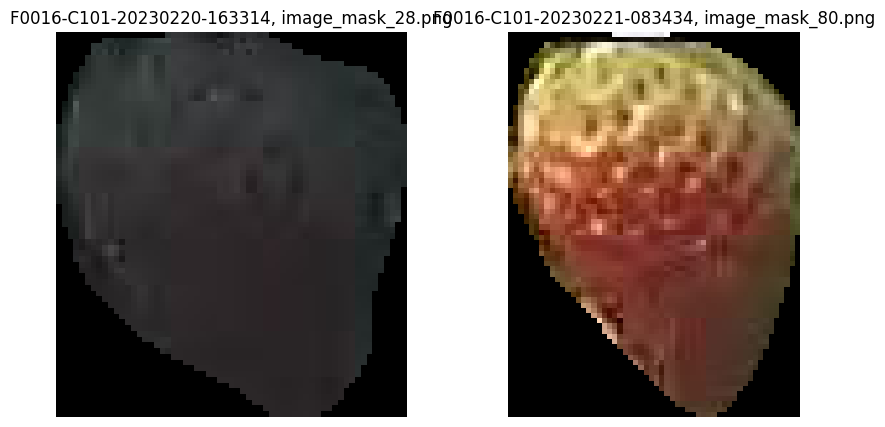

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_27
mask_id                                 30802cf28412a1c79a6b74407f66d3a0
point_x_x                                                    1847.872559
point_y_x                                                     294.995056
output_image_path_x                                    image_mask_27.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

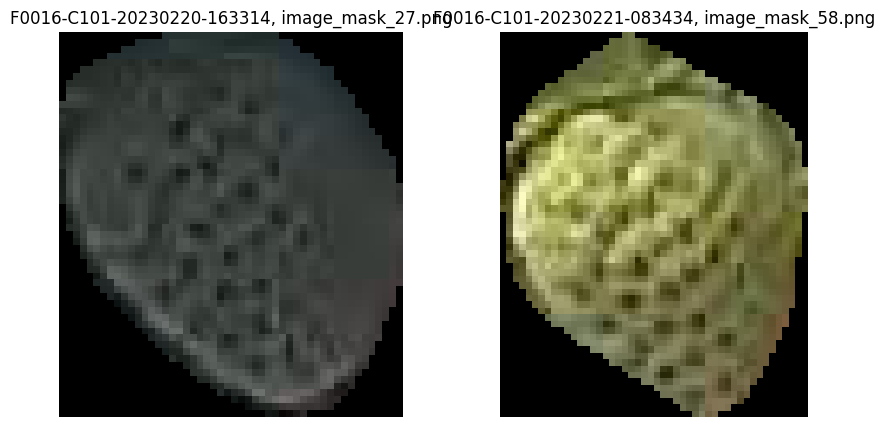

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_16
mask_id                                 3f6f815e14655e80d521791aa2086401
point_x_x                                                    1409.749512
point_y_x                                                     299.601593
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

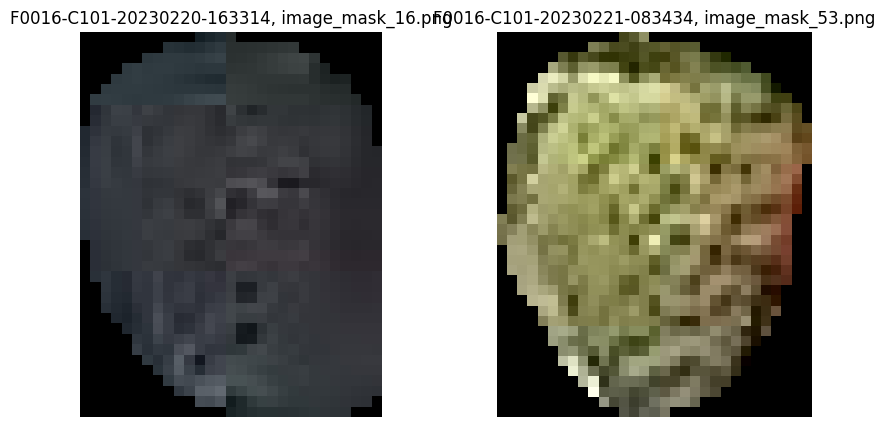

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_25
mask_id                                 4fefcdc3b4b2a36e60f7bfd5db7f662c
point_x_x                                                    1456.218506
point_y_x                                                     392.636719
output_image_path_x                                    image_mask_25.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

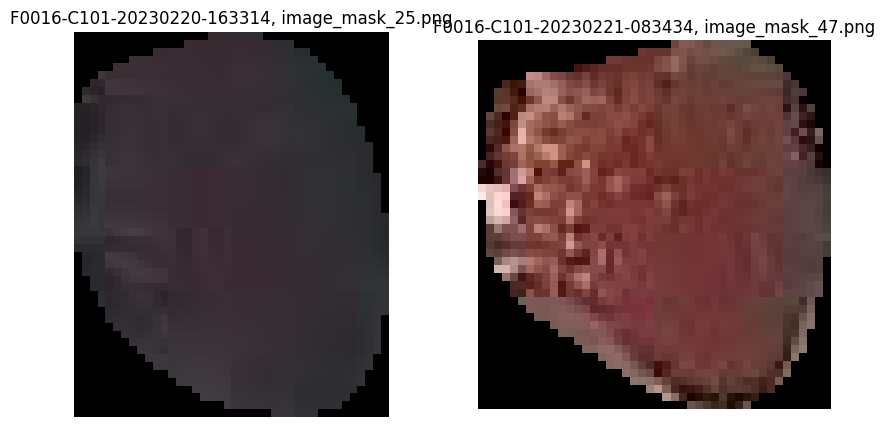

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                  F0016-C101-20230220-163314_1
mask_id                                 808a02f46624e43a3760fba421911ac9
point_x_x                                                     511.976746
point_y_x                                                     143.633331
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

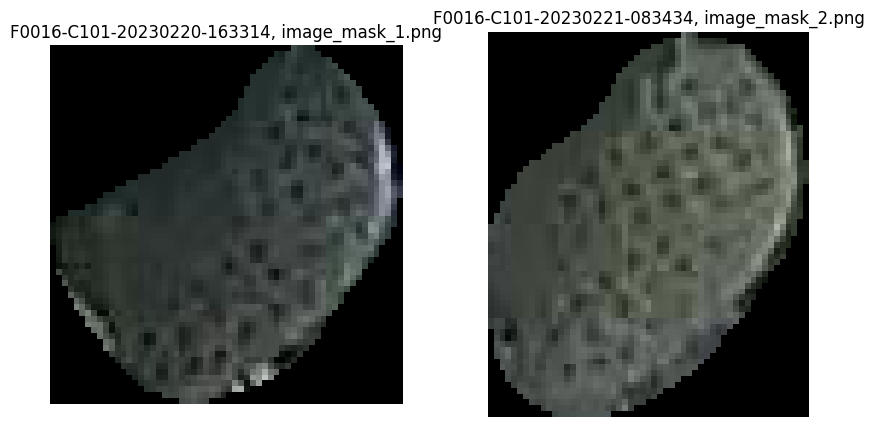

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_29
mask_id                                 abfaa62b7a67454f2a5130e9282fa3be
point_x_x                                                    2094.805176
point_y_x                                                     128.968628
output_image_path_x                                    image_mask_29.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

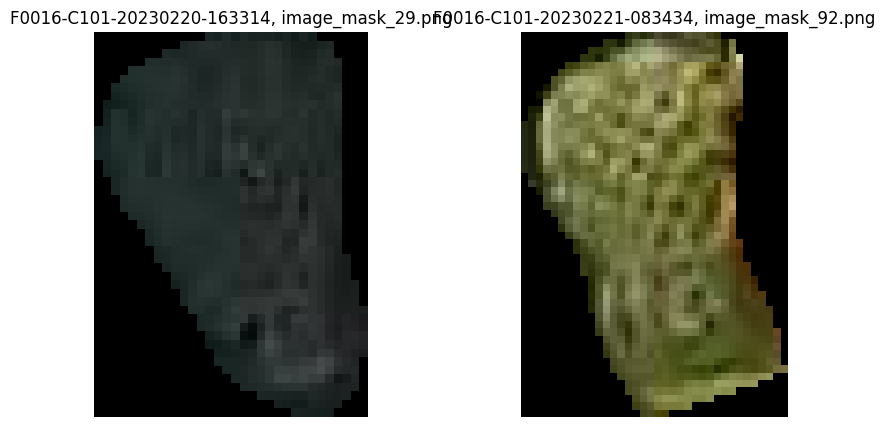

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_18
mask_id                                 bda65622b2cbed211462fdba430fb03e
point_x_x                                                    1682.647217
point_y_x                                                     232.738007
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

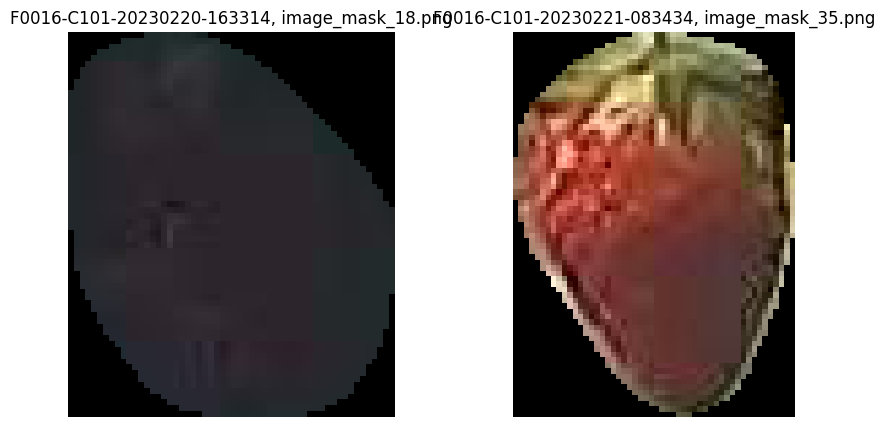

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_11
mask_id                                 de7933d083ad1116b8f61f193acb4b1e
point_x_x                                                    1138.386719
point_y_x                                                      562.00061
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

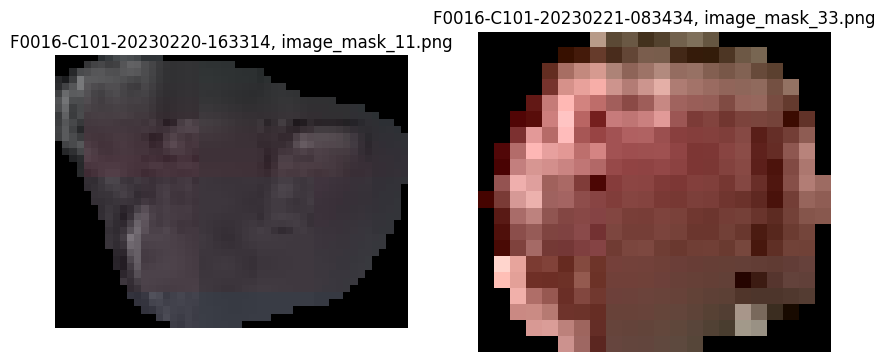

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_17
mask_id                                 efff7b5cfd582534ce4082ce0a605987
point_x_x                                                    1454.633301
point_y_x                                                     281.028015
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

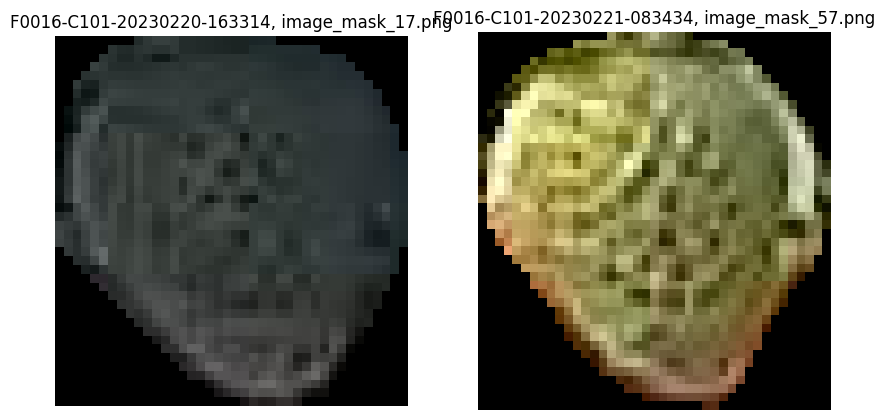

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_24
mask_id                                 f002607a17ddf8ee412e679eb463d83a
point_x_x                                                    1357.469238
point_y_x                                                     173.818146
output_image_path_x                                    image_mask_24.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

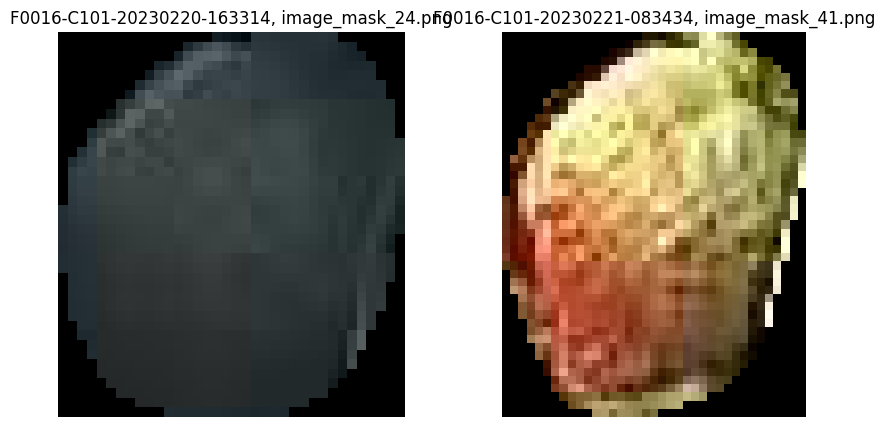

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_20
mask_id                                 f68ca6748c3afb0bad1196145d3d83c8
point_x_x                                                    1385.812744
point_y_x                                                     239.062042
output_image_path_x                                    image_mask_20.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

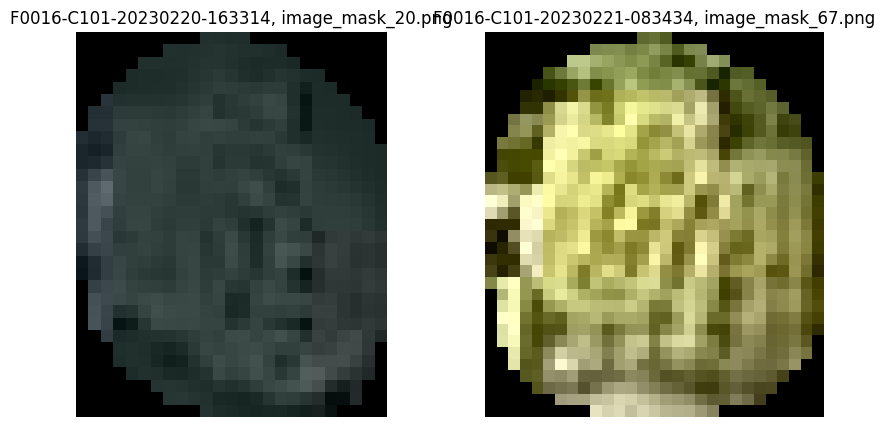

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230220-163314
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230220-123300
mask_num_x                                 F0016-C101-20230220-163314_12
mask_id                                 f903f20fef95fb3db5d6f87b803189e7
point_x_x                                                    1578.403809
point_y_x                                                     169.951843
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230221-083434
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

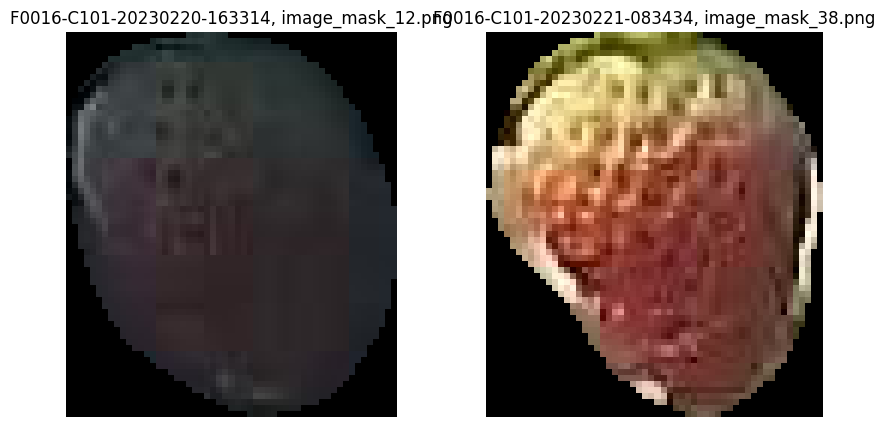

In [89]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = fab_2023[fab_2023["before_img_name"] == "F0016-C101-20230220-123300"]
aug2 = fab_2023[fab_2023["before_img_name"] == "F0016-C101-20230220-163314"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230227-163522
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230227-123332
mask_num_x                                 F0016-C101-20230227-163522_13
mask_id                                 1b97772156a151b10e0b0e54b37048e2
point_x_x                                                    1388.544434
point_y_x                                                      190.25943
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230228-083503
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

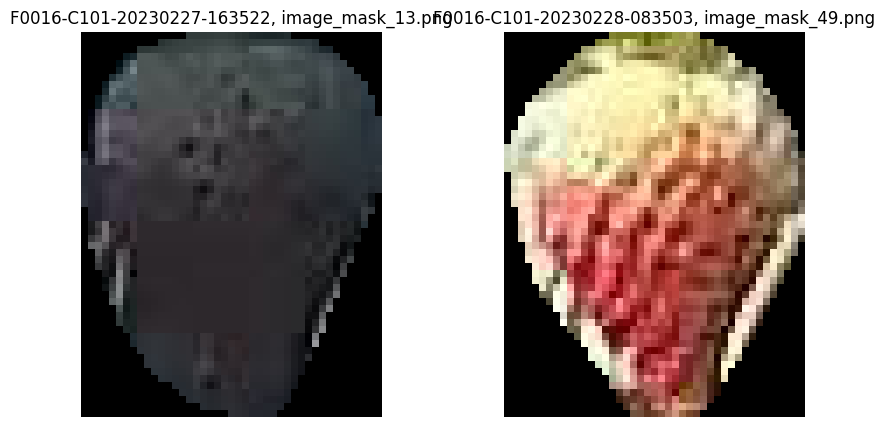

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230227-163522
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230227-123332
mask_num_x                                 F0016-C101-20230227-163522_14
mask_id                                 3f6f815e14655e80d521791aa2086401
point_x_x                                                    1430.611572
point_y_x                                                     319.819031
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230228-083503
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

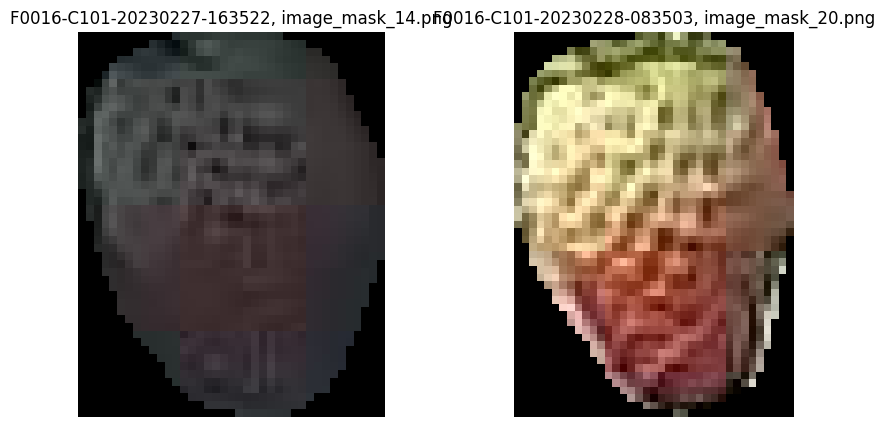

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230227-163522
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230227-123332
mask_num_x                                 F0016-C101-20230227-163522_18
mask_id                                 616a1babd69704c853c2af55c494f56f
point_x_x                                                    1627.815063
point_y_x                                                      302.42926
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230228-083503
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

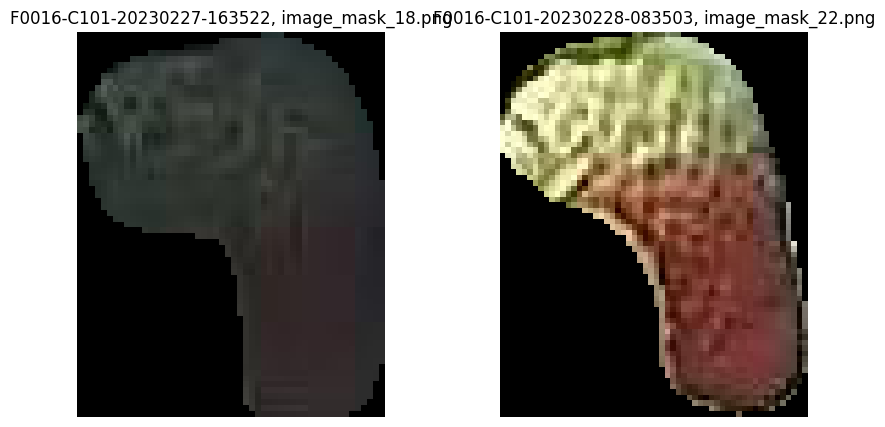

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230227-163522
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230227-123332
mask_num_x                                  F0016-C101-20230227-163522_3
mask_id                                 7fff8fea7d0bb1fcd20142726ec6742e
point_x_x                                                     339.936646
point_y_x                                                     426.383057
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230228-083503
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

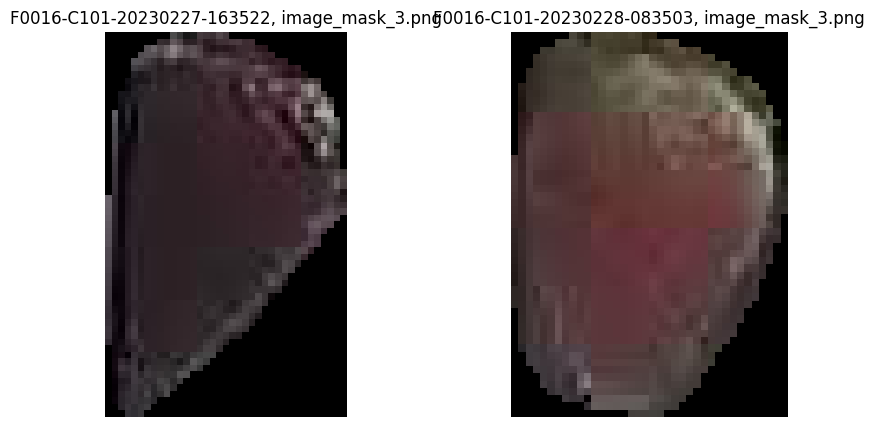

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230227-163522
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230227-123332
mask_num_x                                 F0016-C101-20230227-163522_12
mask_id                                 8827e8c0fff93325836536b35cc223d8
point_x_x                                                    1832.780029
point_y_x                                                     309.134827
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230228-083503
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

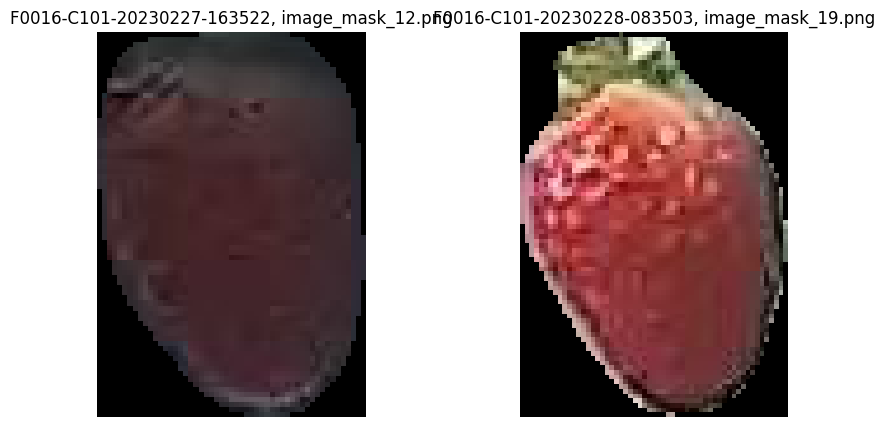

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230227-163522
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230227-123332
mask_num_x                                  F0016-C101-20230227-163522_6
mask_id                                 da63d51dfdb898a010c9461ebaf536f0
point_x_x                                                    1054.521851
point_y_x                                                     385.016388
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230228-083503
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

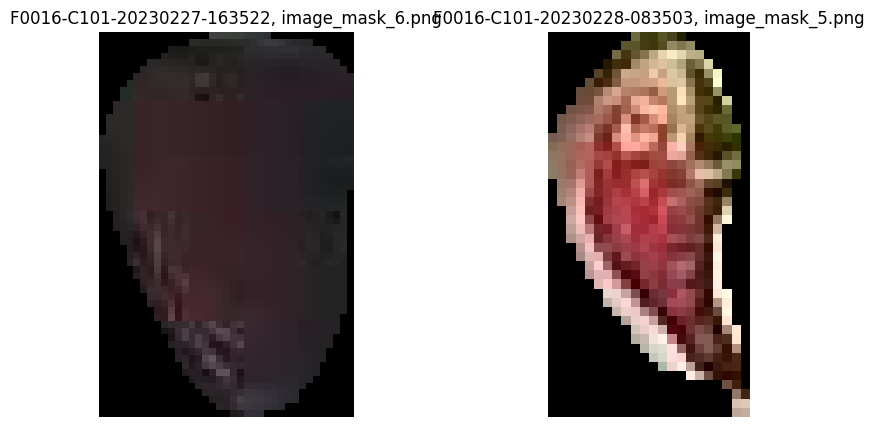

In [90]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = fab_2023[fab_2023["before_img_name"] == "F0016-C101-20230227-123332"]
aug2 = fab_2023[fab_2023["before_img_name"] == "F0016-C101-20230227-163522"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2023년 3월

In [91]:
### 2023년 3월에 해당하는 이미지 필터링
mar_2023 = f0016[(f0016["측정년도"] == 2023) & (f0016["측정월"] == 3)]

# 측정 일자를 datetime으로 변환
mar_2023["측정일자"] = pd.to_datetime(mar_2023["측정일자"])

# 날짜 필터링
mar_2023 = mar_2023[(mar_2023["측정일자"].dt.weekday == 0) | (mar_2023["측정일자"].dt.weekday == 1) | (mar_2023["측정일자"].dt.weekday == 2)]

mar_2023['before_img_name'].unique()

/tmp/ipykernel_266549/223775207.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mar_2023["측정일자"] = pd.to_datetime(mar_2023["측정일자"])


array(['F0016-C101-20230228-163304', 'F0016-C101-20230301-083255',
       'F0016-C101-20230301-123434', 'F0016-C101-20230305-163259',
       'F0016-C101-20230306-083300', 'F0016-C101-20230306-123303',
       'F0016-C101-20230306-163454', 'F0016-C101-20230307-083337',
       'F0016-C101-20230307-123256', 'F0016-C101-20230307-163318',
       'F0016-C101-20230308-083300', 'F0016-C101-20230308-123258',
       'F0016-C101-20230312-163300', 'F0016-C101-20230313-083254',
       'F0016-C101-20230313-123518', 'F0016-C101-20230313-163336',
       'F0016-C101-20230314-083437', 'F0016-C101-20230314-123558',
       'F0016-C101-20230314-163605', 'F0016-C101-20230315-083328',
       'F0016-C101-20230315-123512', 'F0016-C101-20230319-163345',
       'F0016-C101-20230320-083342', 'F0016-C101-20230320-123449',
       'F0016-C101-20230320-163448', 'F0016-C101-20230321-083521',
       'F0016-C101-20230321-123342', 'F0016-C101-20230321-163314',
       'F0016-C101-20230322-083317', 'F0016-C101-20230322-1234

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_16
mask_id                                 03b4ad2d641ebc2619e9b21eea73c53a
point_x_x                                                    1859.359253
point_y_x                                                      235.76738
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

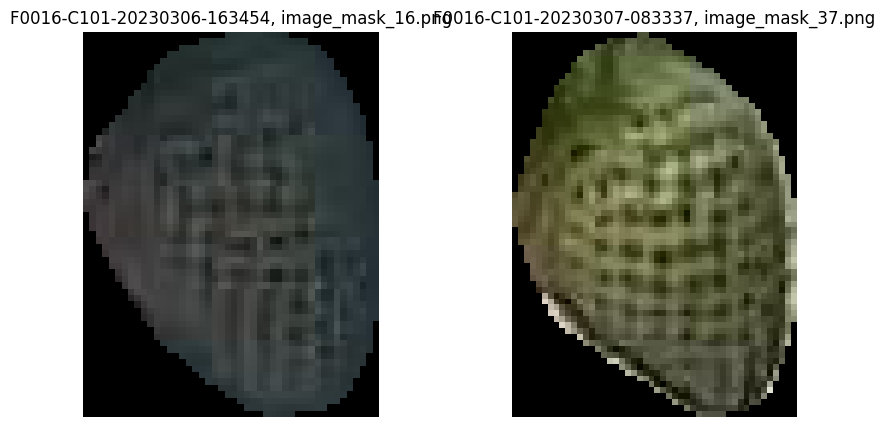

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                  F0016-C101-20230306-163454_2
mask_id                                 2454ec9b9869e6fff5b94d1a0ca0b6da
point_x_x                                                     474.321136
point_y_x                                                      55.607864
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

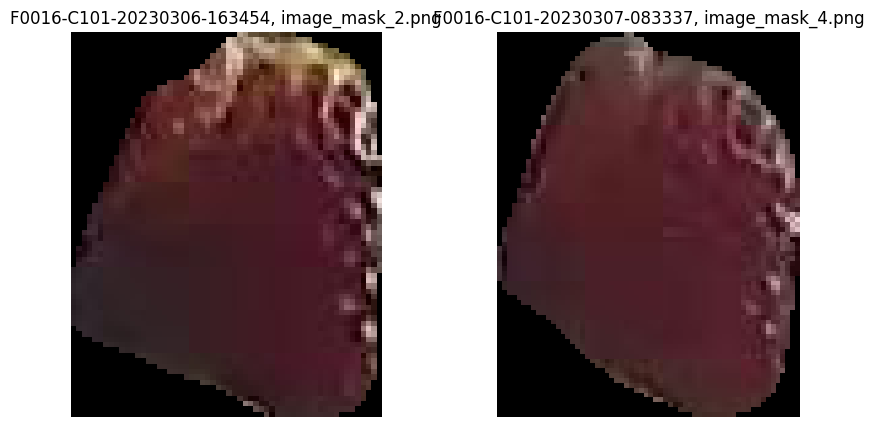

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_22
mask_id                                 3874b3ab772f45d51854f33aefdcfd6f
point_x_x                                                    1684.124512
point_y_x                                                     249.147827
output_image_path_x                                    image_mask_22.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

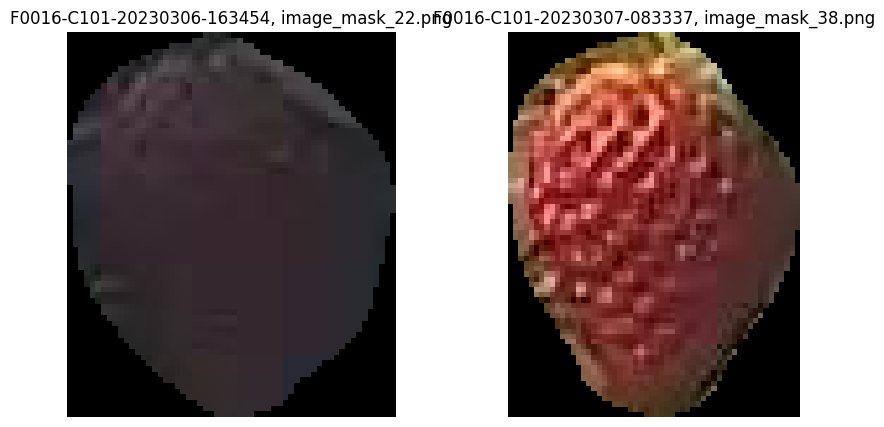

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_17
mask_id                                 39ccf1cda044a28a352c09197a552f3a
point_x_x                                                    1627.161743
point_y_x                                                      338.58139
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

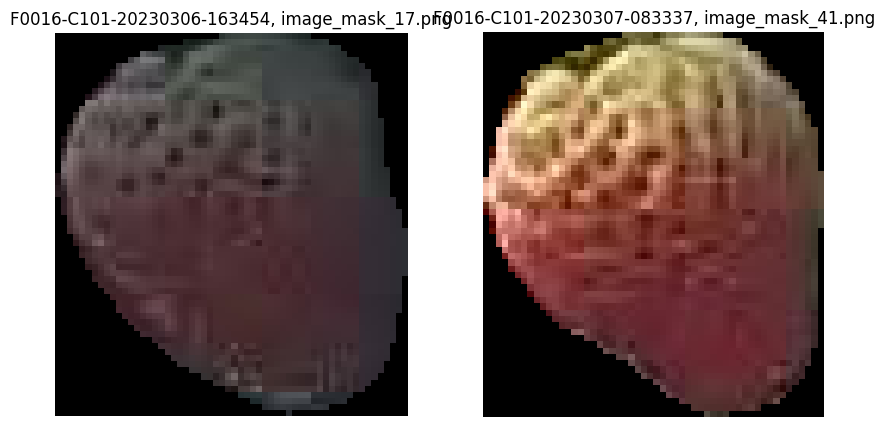

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                  F0016-C101-20230306-163454_5
mask_id                                 489b35d10d75cbf385e597c3dade4527
point_x_x                                                      492.27771
point_y_x                                                     219.165833
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

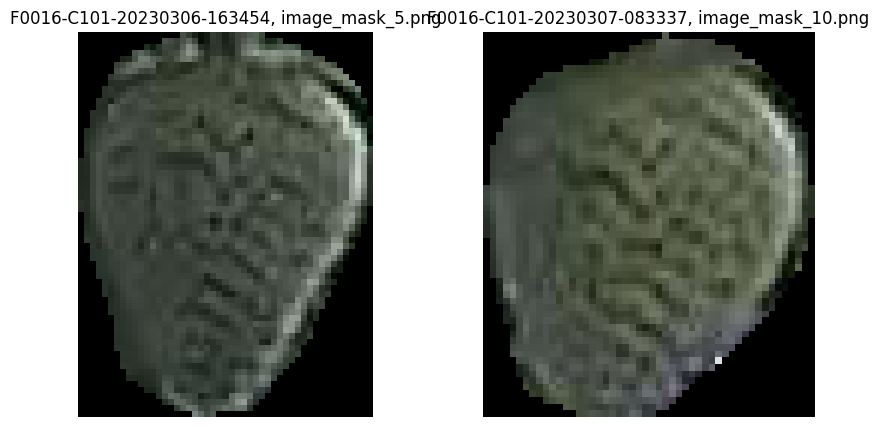

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_20
mask_id                                 4f0f799762ecbe4558f83d97b4ea4c42
point_x_x                                                    1813.892578
point_y_x                                                     259.265076
output_image_path_x                                    image_mask_20.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

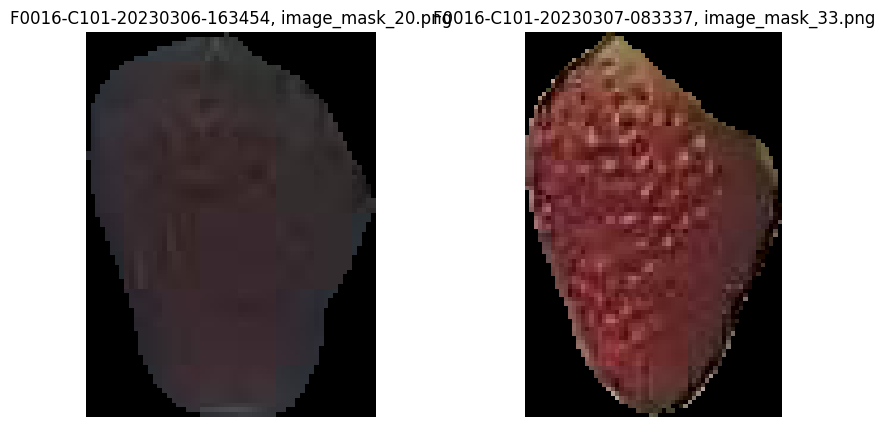

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_11
mask_id                                 5d4e2894474a8d1dc84f79d7f61d5c80
point_x_x                                                     491.181946
point_y_x                                                     116.238091
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

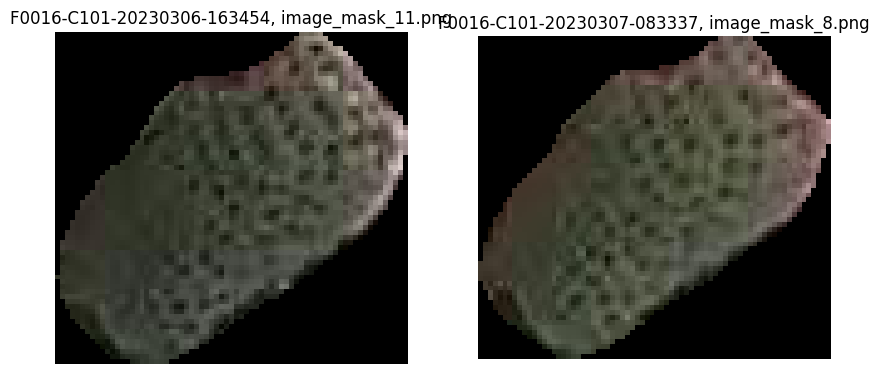

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_27
mask_id                                 5e97cf98a08e63a4b71e3faff74065e4
point_x_x                                                    1381.656616
point_y_x                                                     381.616211
output_image_path_x                                    image_mask_27.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

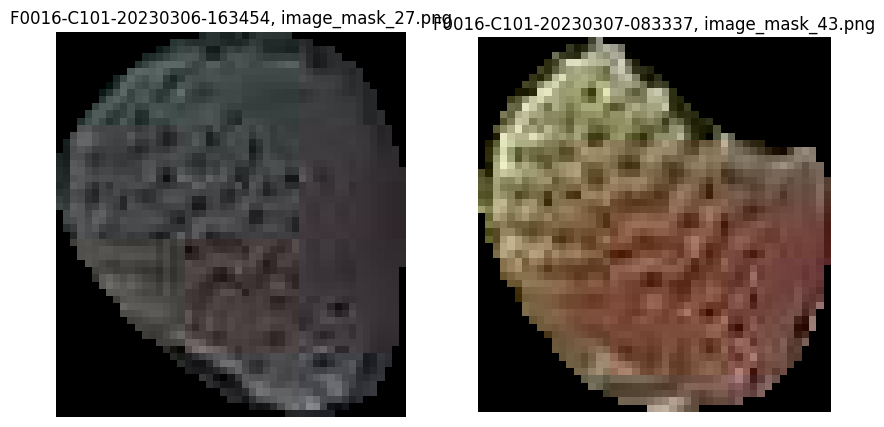

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                  F0016-C101-20230306-163454_4
mask_id                                 5fa29196cccec3f018318353ea811255
point_x_x                                                     533.724854
point_y_x                                                     125.277847
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

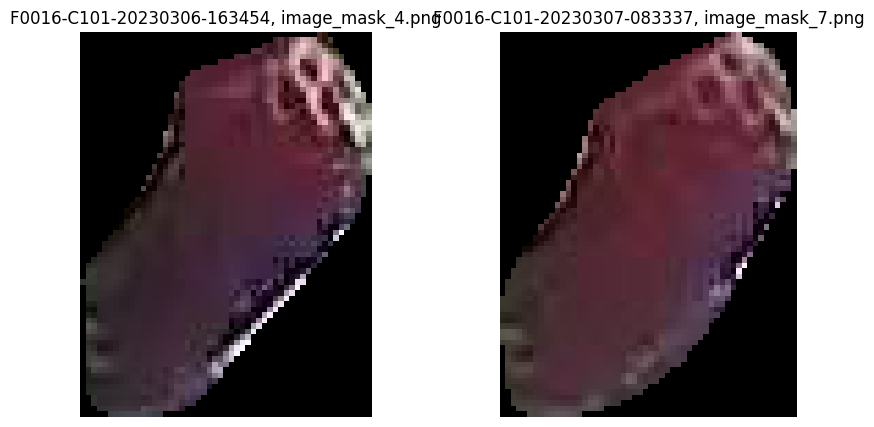

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_28
mask_id                                 6822a54c78c4cce7de096aeec6c9c4b2
point_x_x                                                    1647.321655
point_y_x                                                     278.897644
output_image_path_x                                    image_mask_28.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

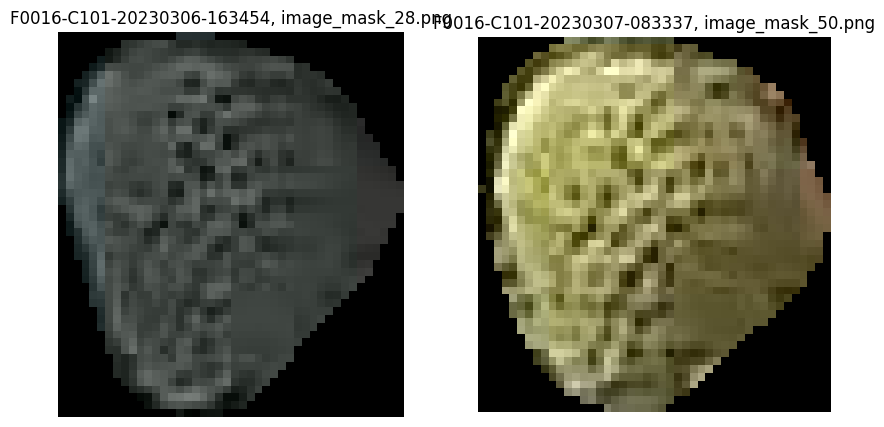

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                  F0016-C101-20230306-163454_6
mask_id                                 710f5d17cc5f14b0e0f14f897396c40e
point_x_x                                                     554.051819
point_y_x                                                      50.111187
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

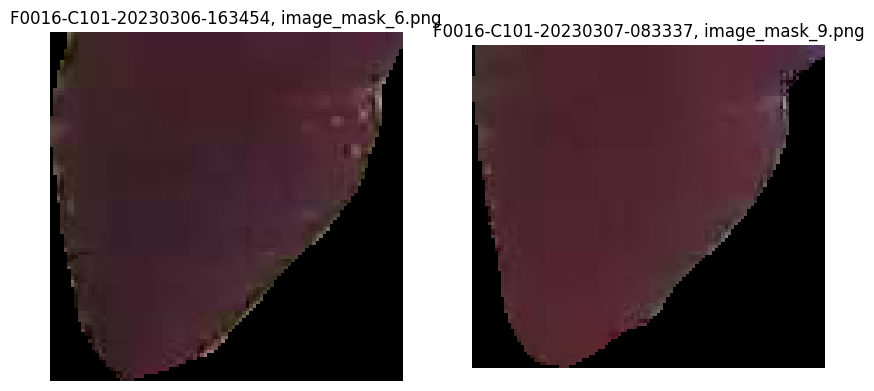

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_23
mask_id                                 84a9a70c3a6a862da2790a752246d786
point_x_x                                                    1825.550781
point_y_x                                                     202.363785
output_image_path_x                                    image_mask_23.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

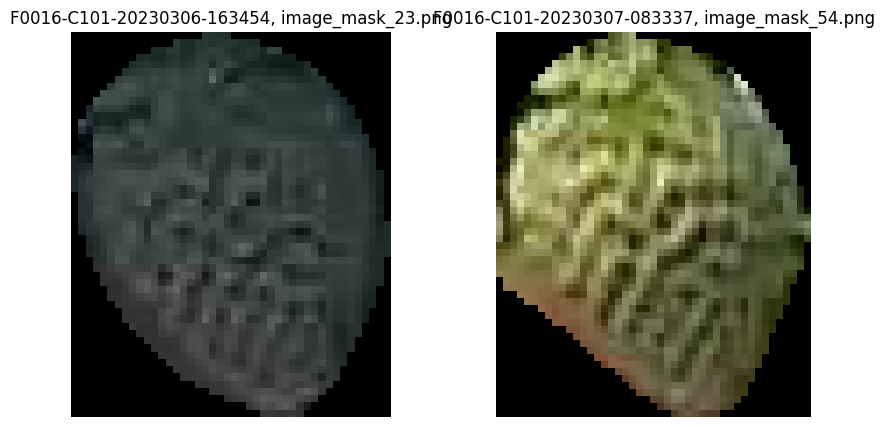

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                  F0016-C101-20230306-163454_3
mask_id                                 89c89dbbe8fcf59eb97886754dc4c41a
point_x_x                                                     427.739258
point_y_x                                                     159.267792
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

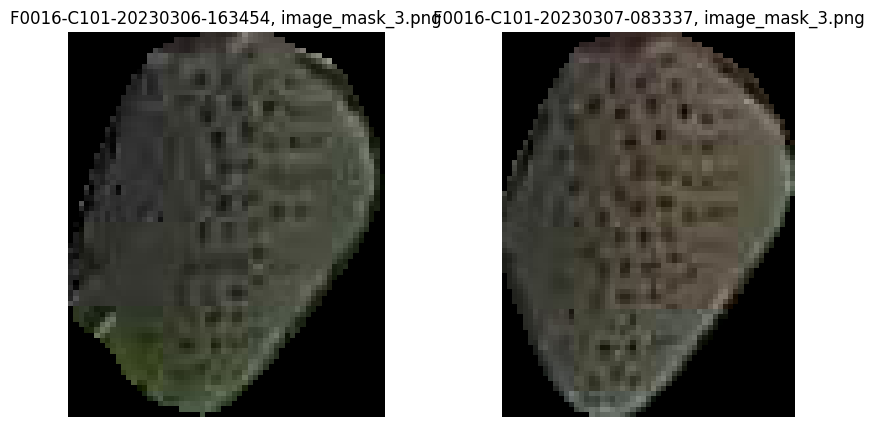

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_34
mask_id                                 971d06c85695c906eadb8f0fdac6d1ba
point_x_x                                                      1597.9104
point_y_x                                                     333.185883
output_image_path_x                                    image_mask_34.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

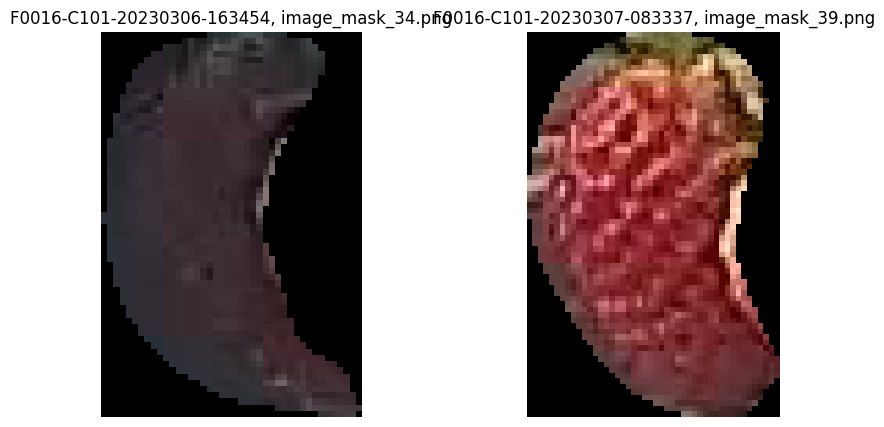

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_10
mask_id                                 989e8b486b0c13c16aaaa134cd6623f3
point_x_x                                                     449.344543
point_y_x                                                     103.140274
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

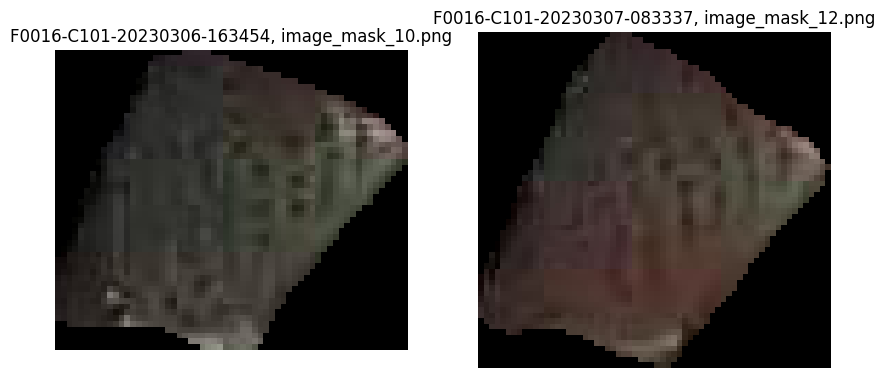

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_31
mask_id                                 b5298e6b69b09db6d3ba661e12d5da9e
point_x_x                                                    1629.231445
point_y_x                                                     165.672485
output_image_path_x                                    image_mask_31.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

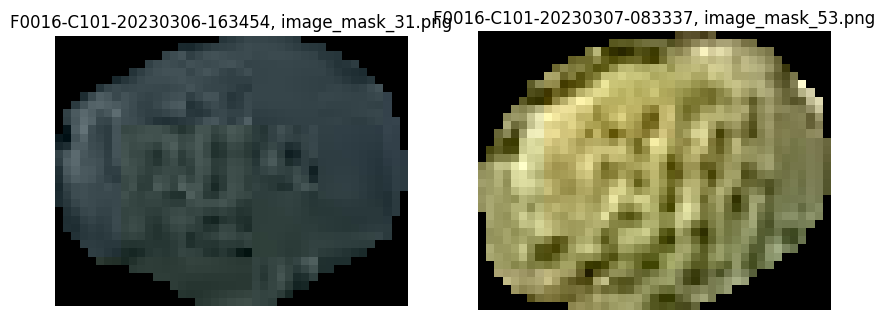

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_37
mask_id                                 d3f250e193f2bb92962be01141406054
point_x_x                                                    2246.994629
point_y_x                                                     423.415771
output_image_path_x                                    image_mask_37.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

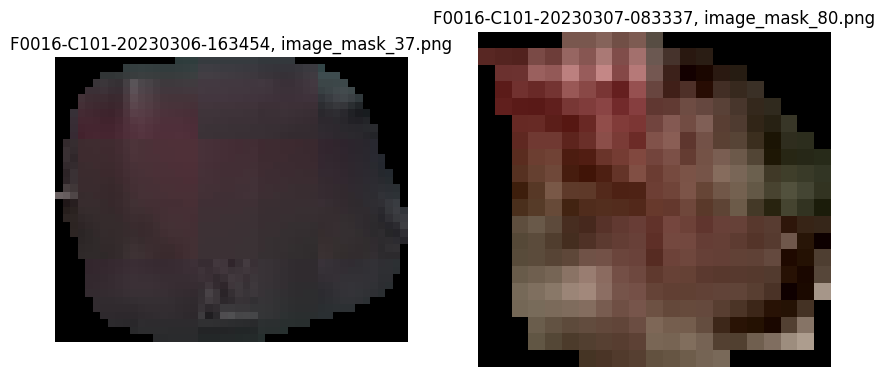

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_26
mask_id                                 e44687459b6255a7702fe63d972669fc
point_x_x                                                    1612.200439
point_y_x                                                     199.467789
output_image_path_x                                    image_mask_26.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

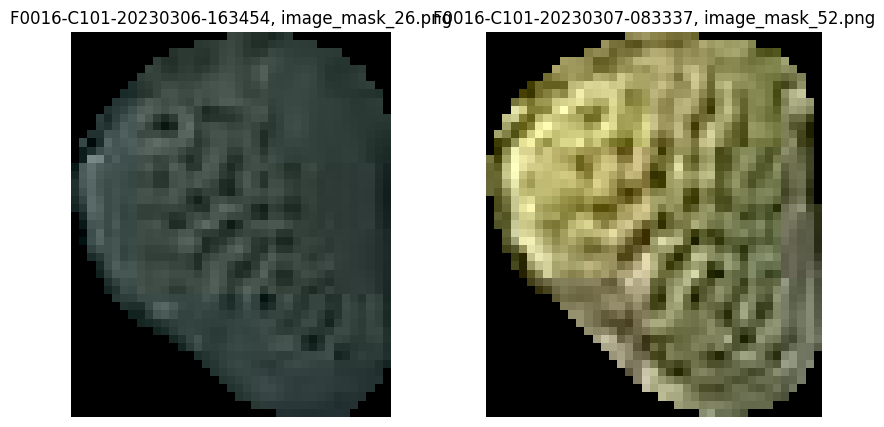

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_30
mask_id                                 eb00829c43a94b60020a73dbd50f965f
point_x_x                                                    1670.919678
point_y_x                                                       302.1828
output_image_path_x                                    image_mask_30.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

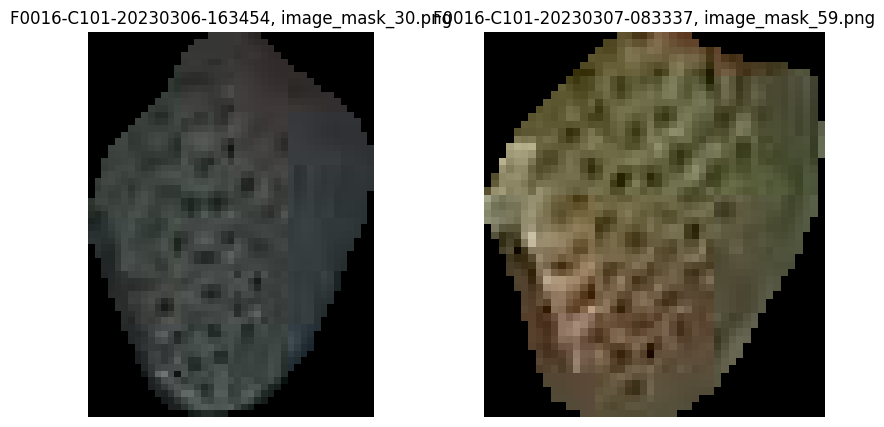

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                 F0016-C101-20230306-163454_12
mask_id                                 eef8d41a6add58e3b2f4fae77e2e81c6
point_x_x                                                     486.441406
point_y_x                                                     163.125824
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

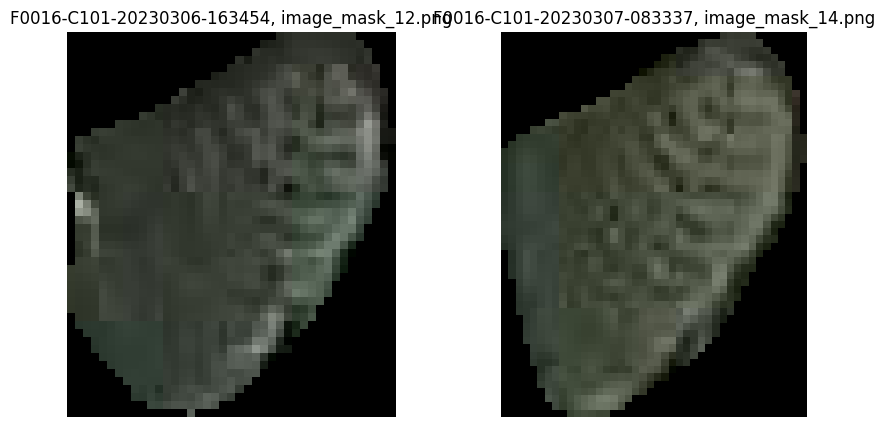

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230306-163454
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230306-123303
mask_num_x                                  F0016-C101-20230306-163454_8
mask_id                                 ef81e811e79974d14e8e659abd724696
point_x_x                                                     414.391541
point_y_x                                                      296.58905
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230307-083337
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

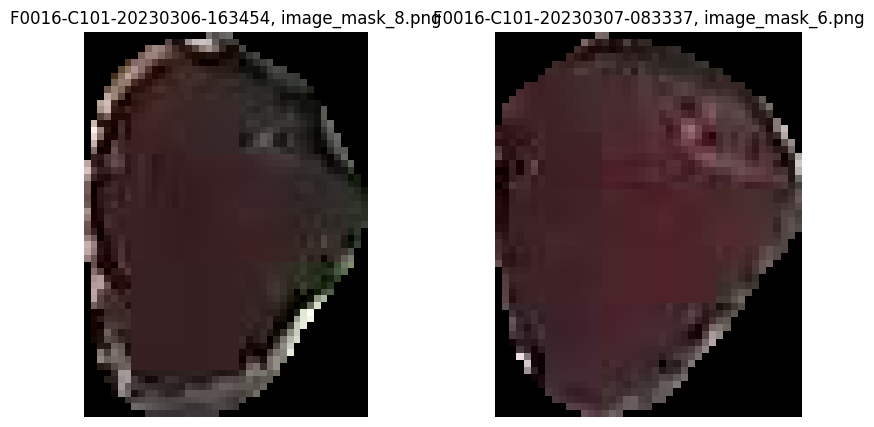

In [92]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = mar_2023[mar_2023["before_img_name"] == "F0016-C101-20230306-123303"]
aug2 = mar_2023[mar_2023["before_img_name"] == "F0016-C101-20230306-163454"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_16
mask_id                                 134c98f578d41ee48031e7a91d420fcd
point_x_x                                                    1260.458618
point_y_x                                                     381.231812
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

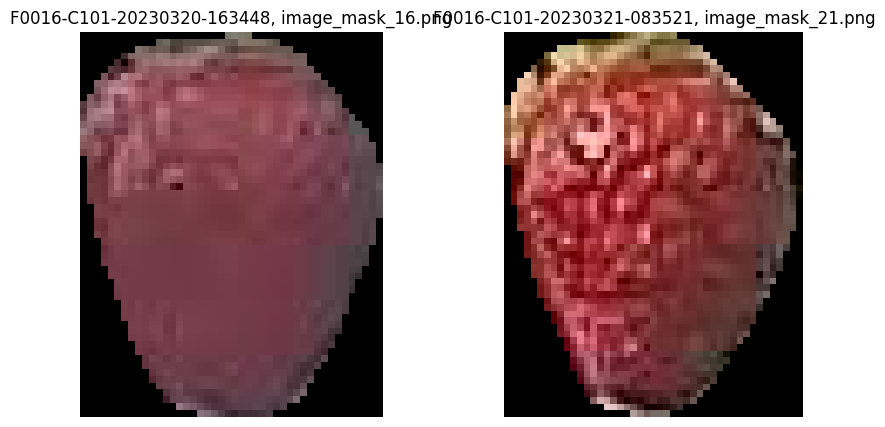

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_22
mask_id                                 2398af13745eead1e4e2dbcb7218a942
point_x_x                                                    1238.825317
point_y_x                                                      388.61264
output_image_path_x                                    image_mask_22.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

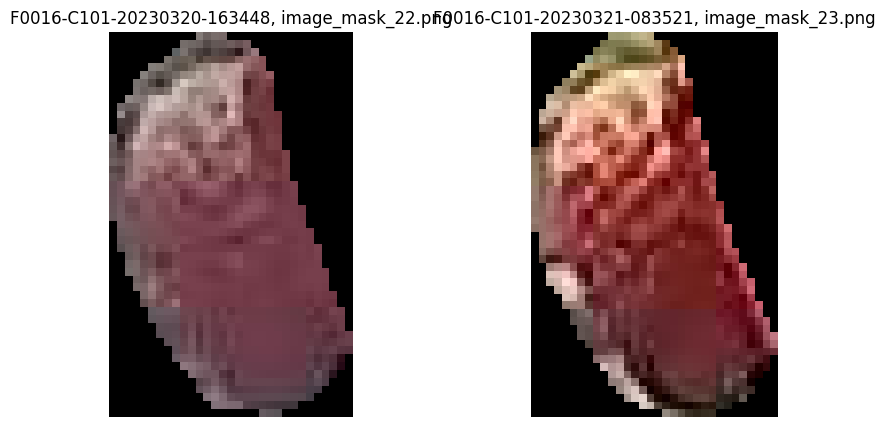

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_17
mask_id                                 42024bff55d53977cc75679ce13149bb
point_x_x                                                    1251.869385
point_y_x                                                      544.52594
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

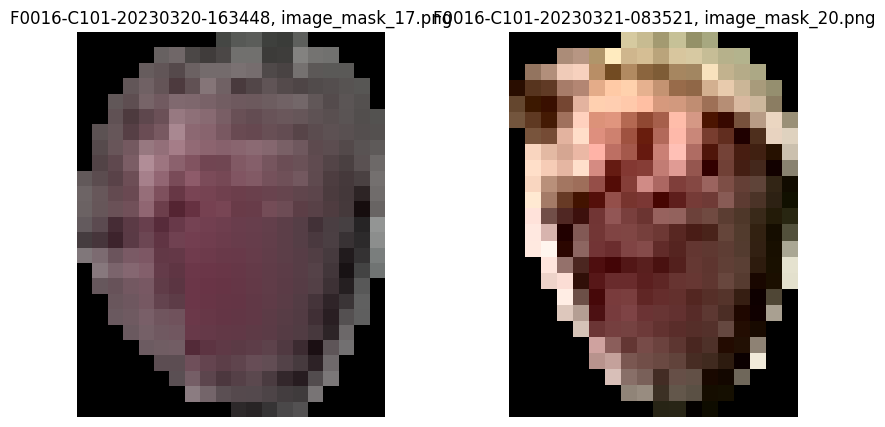

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_15
mask_id                                 481245ce9dfe8330f45aae1e3500c533
point_x_x                                                     865.019531
point_y_x                                                     447.330872
output_image_path_x                                    image_mask_15.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

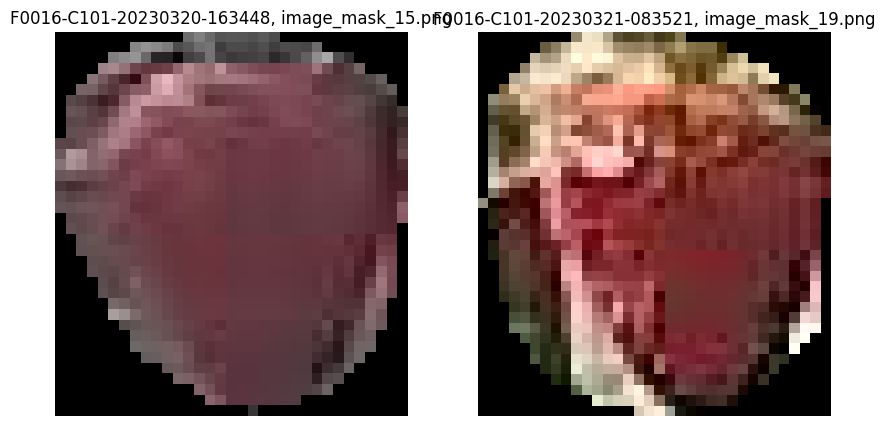

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_29
mask_id                                 485180e95abb39c990ec1a1aa83187ad
point_x_x                                                    1057.338379
point_y_x                                                     420.109802
output_image_path_x                                    image_mask_29.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

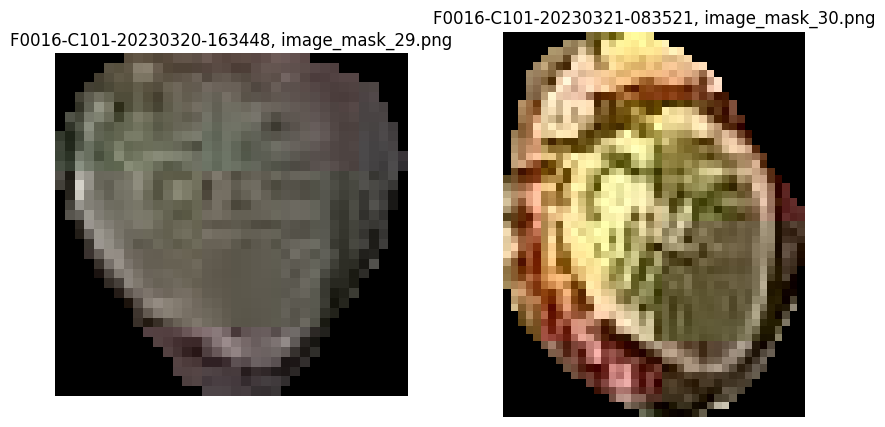

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_25
mask_id                                 4aea244d94e13e9c6ebb27261a30aea8
point_x_x                                                     922.346191
point_y_x                                                     502.327698
output_image_path_x                                    image_mask_25.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

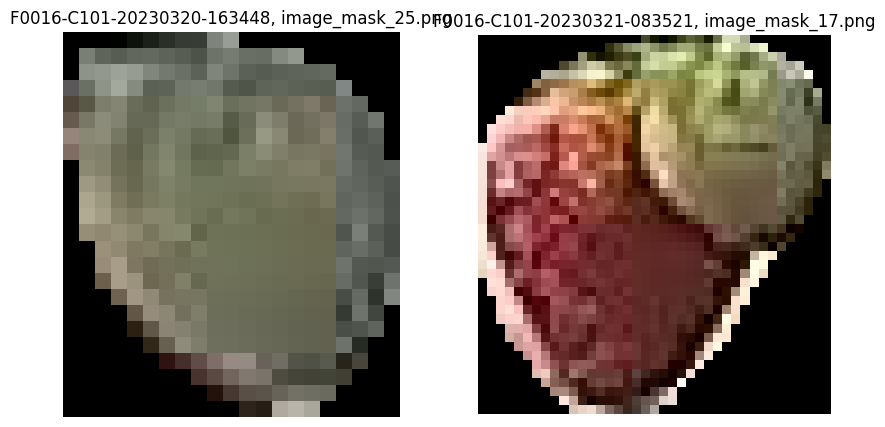

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_25
mask_id                                 4aea244d94e13e9c6ebb27261a30aea8
point_x_x                                                     922.346191
point_y_x                                                     502.327698
output_image_path_x                                    image_mask_25.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

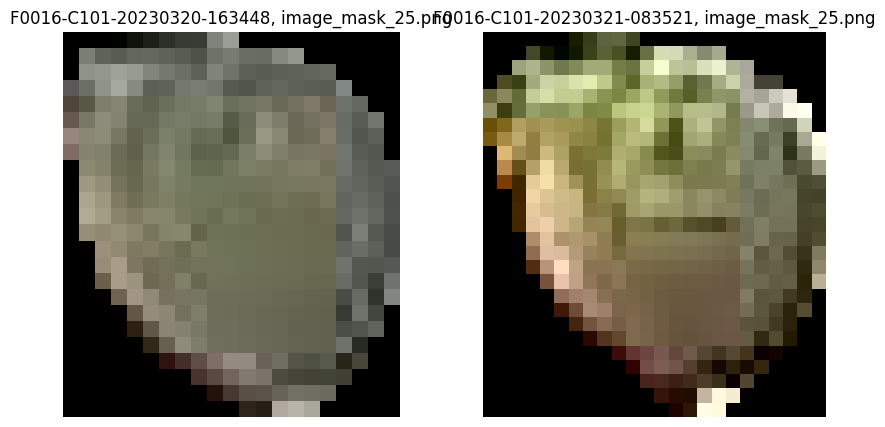

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_19
mask_id                                 5d0b6d9ad6ae063fee9708e2bbd927a5
point_x_x                                                     909.021667
point_y_x                                                     513.454956
output_image_path_x                                    image_mask_19.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

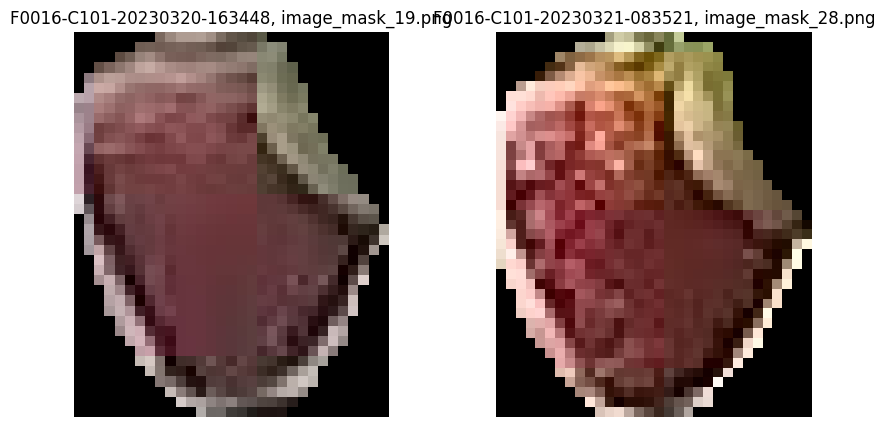

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_41
mask_id                                 65802ad16a9c7a8134cac956b4221b36
point_x_x                                                    2127.234863
point_y_x                                                     474.357483
output_image_path_x                                    image_mask_41.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

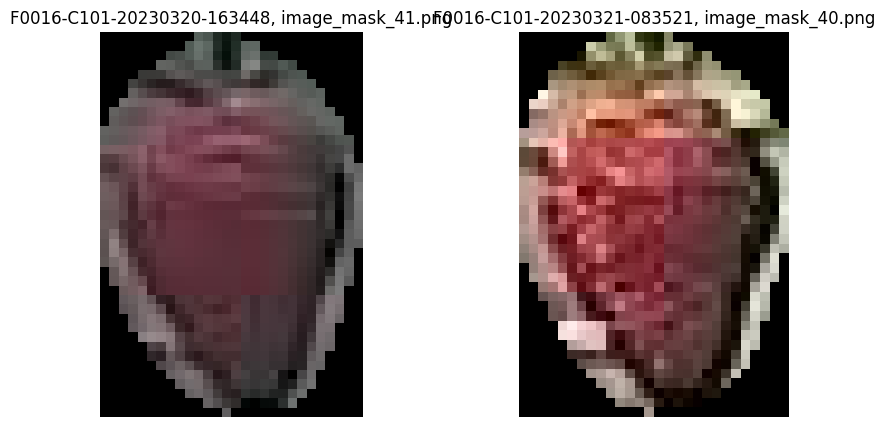

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_14
mask_id                                 6abb44349ccb4476a54b8efc76cc14fe
point_x_x                                                    1179.061768
point_y_x                                                     268.373169
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

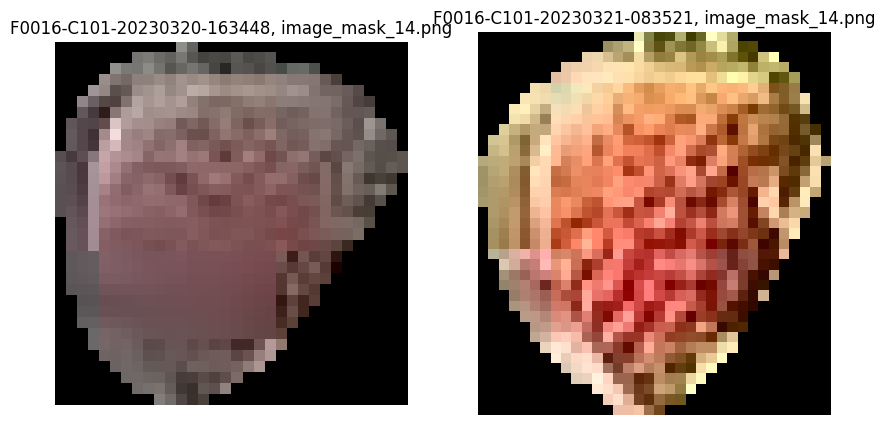

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_21
mask_id                                 6bf90ff443bfa793a0ee19d9c5ec6dad
point_x_x                                                     891.594971
point_y_x                                                     449.504822
output_image_path_x                                    image_mask_21.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

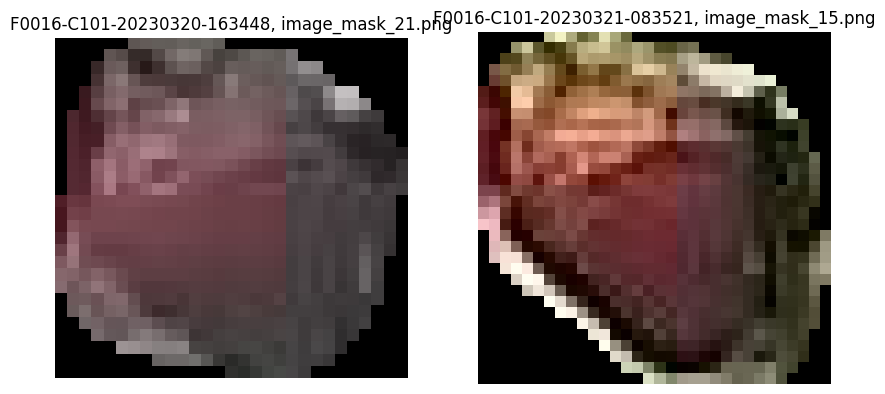

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_31
mask_id                                 753bd595c07fae11e0f938338eceff56
point_x_x                                                     644.020935
point_y_x                                                      543.94989
output_image_path_x                                    image_mask_31.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

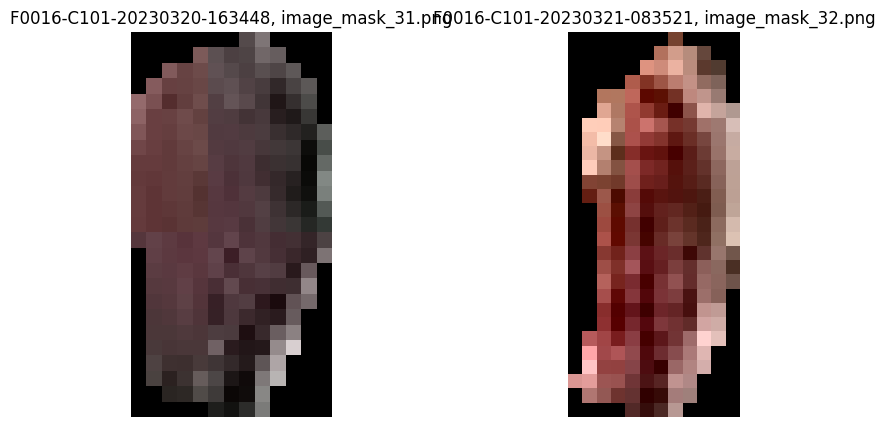

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_27
mask_id                                 7dcf74371f1bbfd71b0cfbebb273bdbd
point_x_x                                                    1069.669434
point_y_x                                                     383.736481
output_image_path_x                                    image_mask_27.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

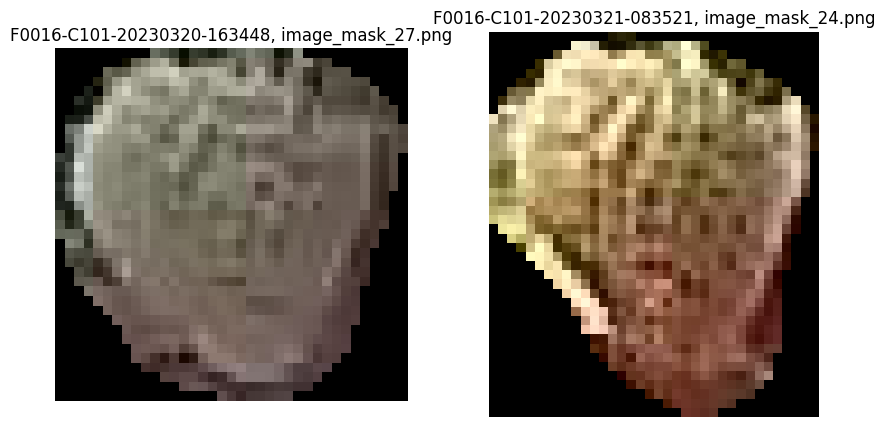

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_26
mask_id                                 88ba92cda0893b5118e520b84db17526
point_x_x                                                      700.96936
point_y_x                                                     487.357178
output_image_path_x                                    image_mask_26.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

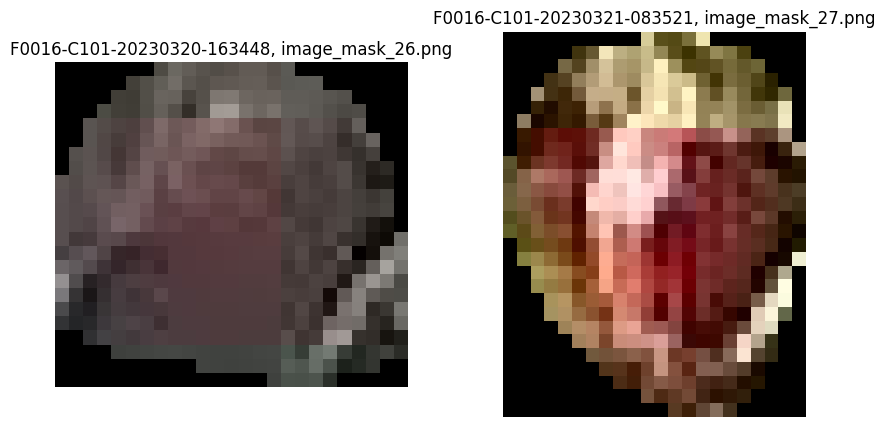

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                  F0016-C101-20230320-163448_9
mask_id                                 89c89dbbe8fcf59eb97886754dc4c41a
point_x_x                                                     420.707886
point_y_x                                                      174.69696
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

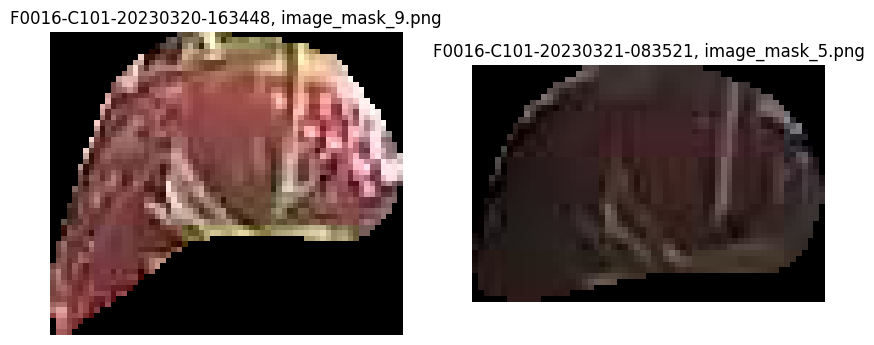

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_12
mask_id                                 8baa9f15875f7203bf4a9222bb1b7257
point_x_x                                                     825.008911
point_y_x                                                     442.867188
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

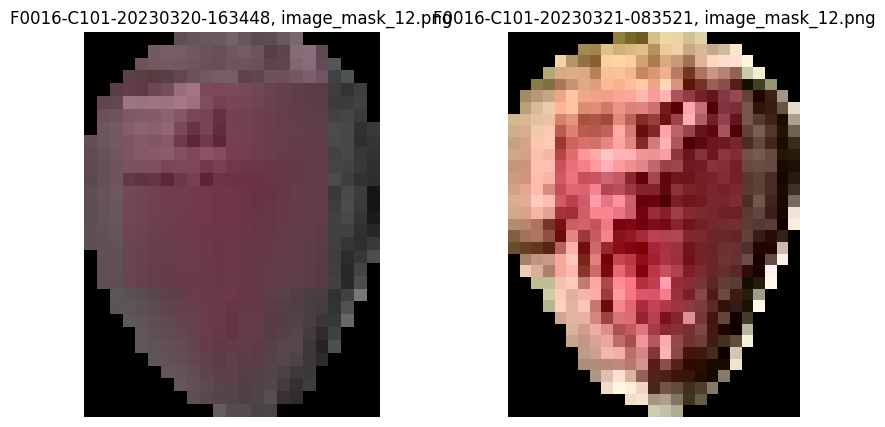

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_18
mask_id                                 8cd8e4d3fbab55354209c2a922c04843
point_x_x                                                     758.964478
point_y_x                                                     499.492096
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

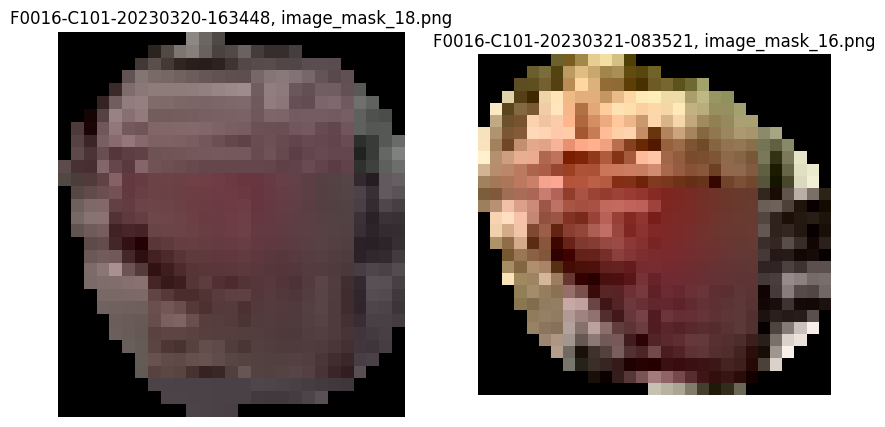

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_30
mask_id                                 976863556083107796866557c5ab58af
point_x_x                                                    1089.726074
point_y_x                                                      389.71991
output_image_path_x                                    image_mask_30.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

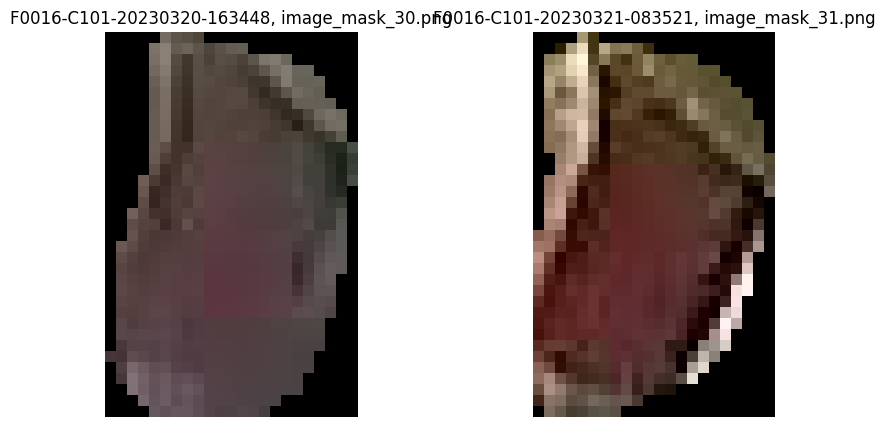

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                  F0016-C101-20230320-163448_3
mask_id                                 986a2ae4ea238a945548e0a7801c8aeb
point_x_x                                                     427.297424
point_y_x                                                     222.203598
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

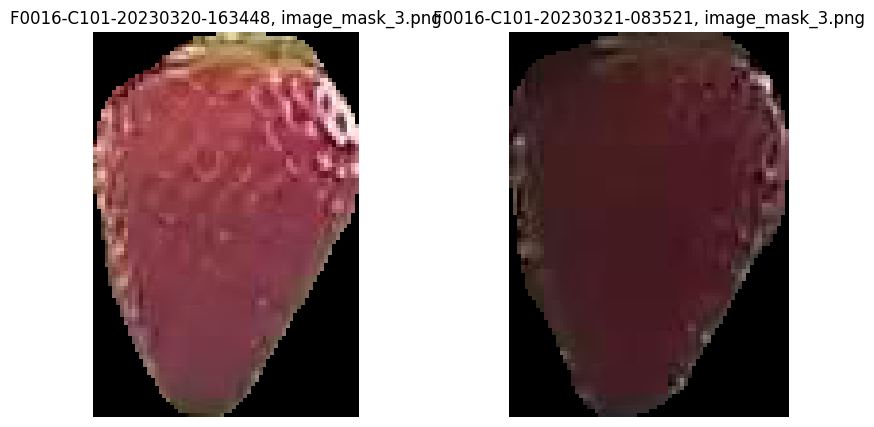

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_37
mask_id                                 99339d2124c634055a68f4313e4aa397
point_x_x                                                    1486.010742
point_y_x                                                      516.88385
output_image_path_x                                    image_mask_37.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

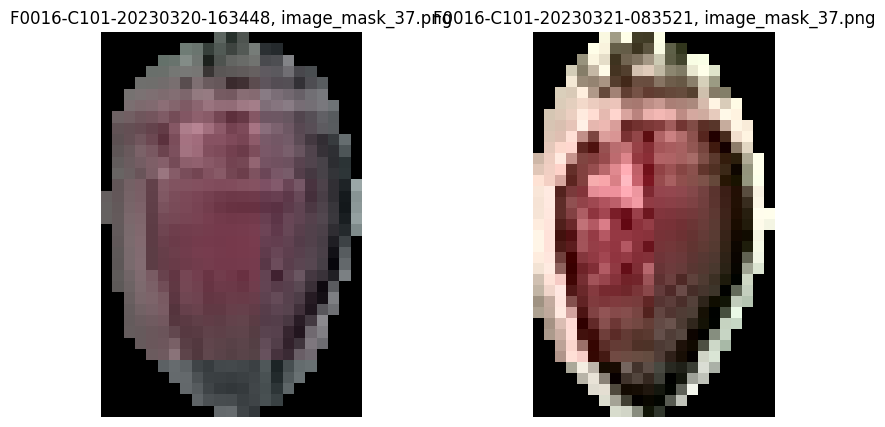

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_11
mask_id                                 9d580a25bb5c5fd7a854f7ad09d3c13e
point_x_x                                                     961.732056
point_y_x                                                     424.558533
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

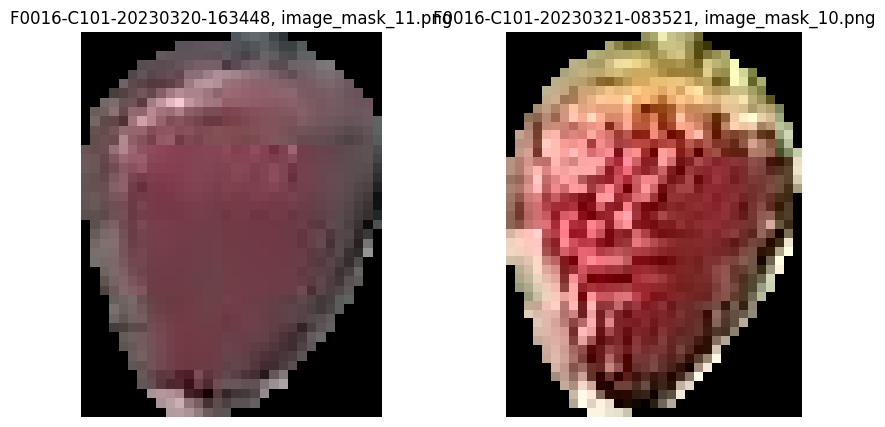

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_20
mask_id                                 9ded8875aa2ce1e31dac6600d0b16b60
point_x_x                                                     722.012695
point_y_x                                                     519.508728
output_image_path_x                                    image_mask_20.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

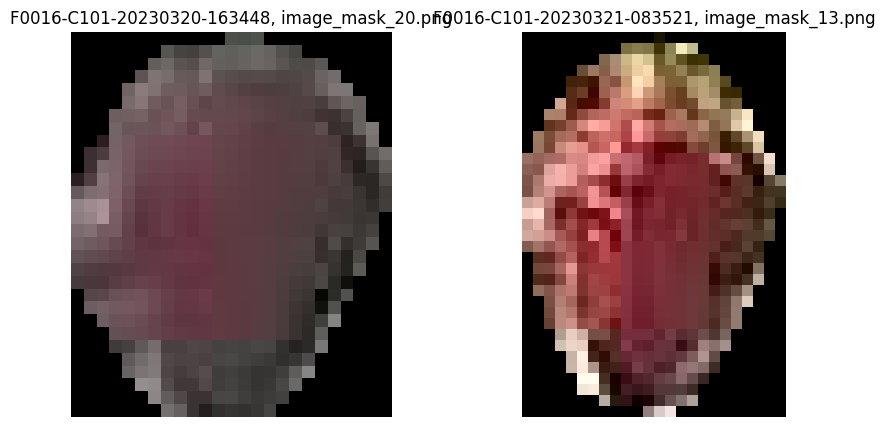

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_10
mask_id                                 9deda7aea5f8b03a7488466ff5766d0f
point_x_x                                                    1202.099365
point_y_x                                                     285.550568
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

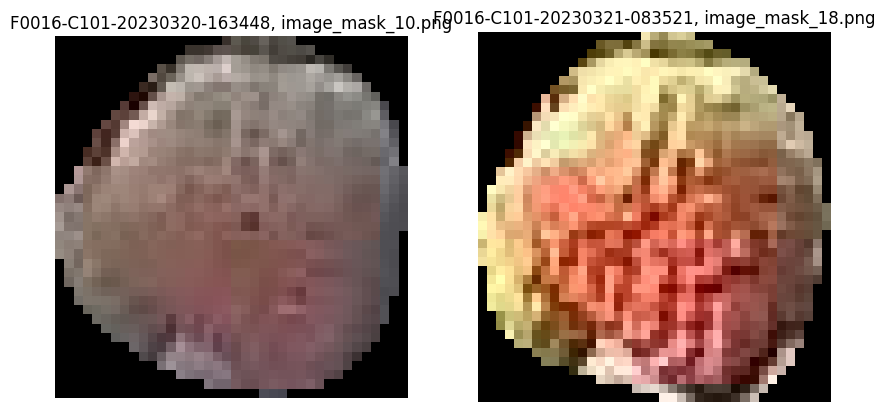

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_36
mask_id                                 a0a2ee683b41a6cdd2b61df45c2079a7
point_x_x                                                    1681.595947
point_y_x                                                      485.09729
output_image_path_x                                    image_mask_36.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

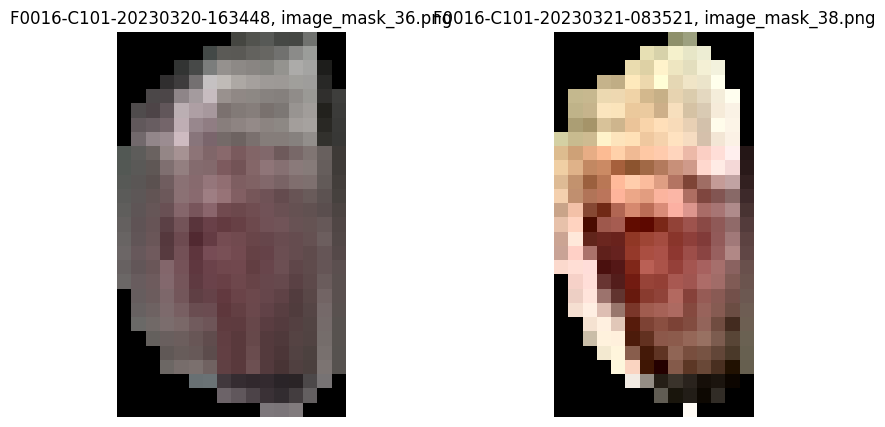

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_23
mask_id                                 ad1d600fb5db965faac8c0660db5604c
point_x_x                                                     791.290405
point_y_x                                                     437.060181
output_image_path_x                                    image_mask_23.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

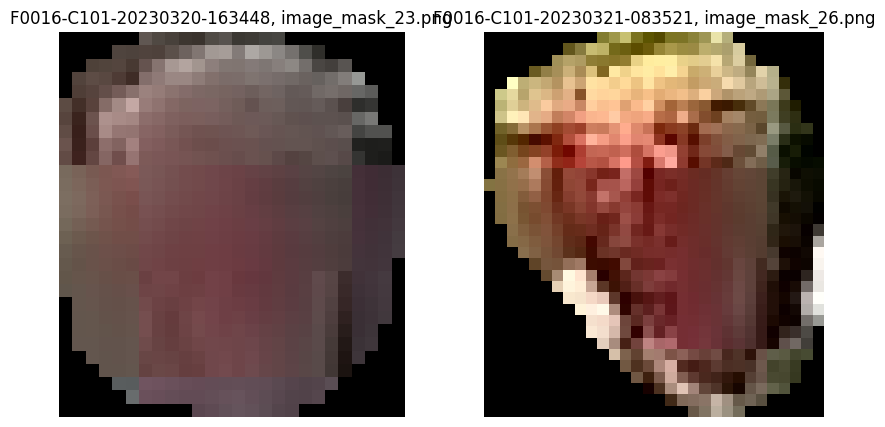

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_38
mask_id                                 b1dd9b68e30e73de6d209312596ffc63
point_x_x                                                    2523.077148
point_y_x                                                     441.718018
output_image_path_x                                    image_mask_38.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

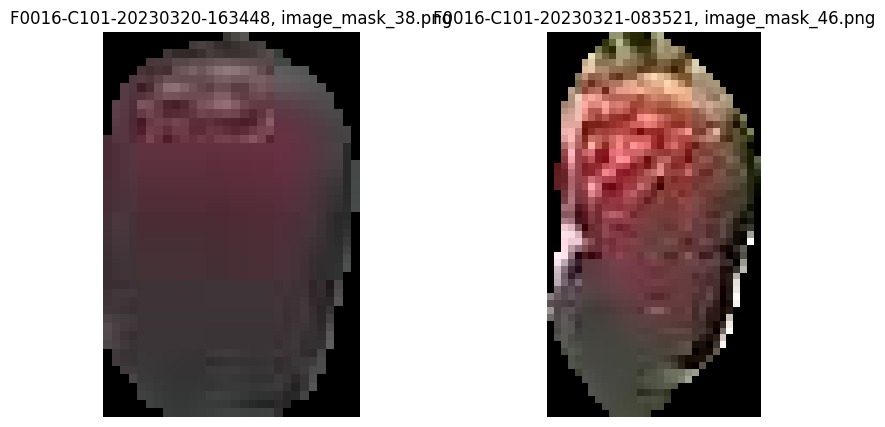

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_34
mask_id                                 b888f82df284a88b04384c16dae6c361
point_x_x                                                    1588.385864
point_y_x                                                     477.895386
output_image_path_x                                    image_mask_34.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

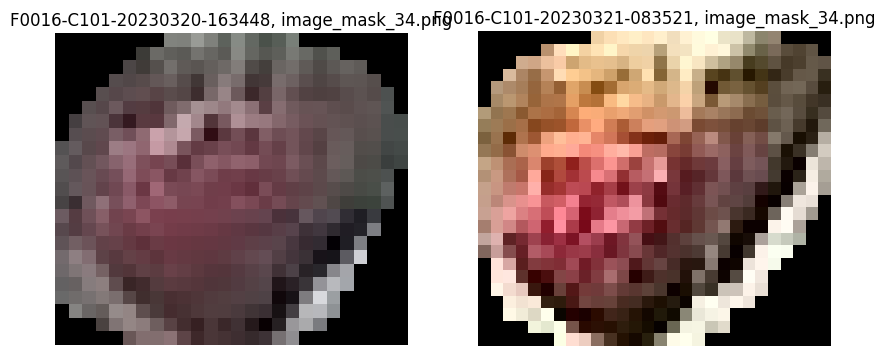

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                  F0016-C101-20230320-163448_5
mask_id                                 bd4e41aba6bc4ae64880ef616972c7f5
point_x_x                                                      378.96521
point_y_x                                                     240.892044
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

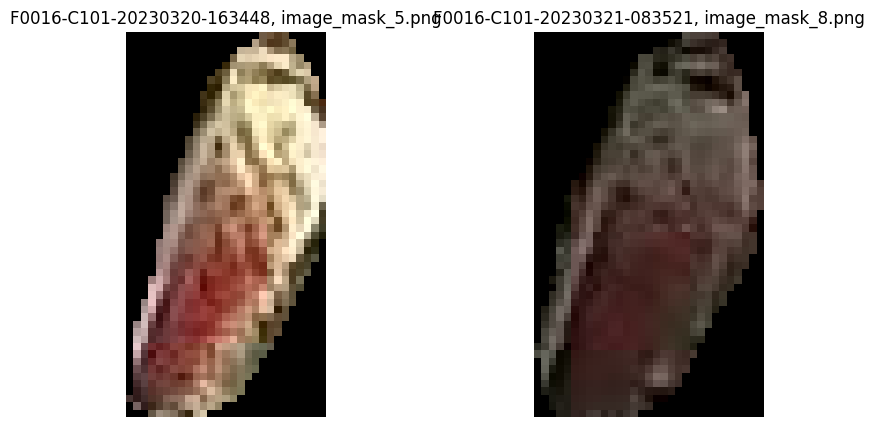

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_13
mask_id                                 c836b49a325c48b6ec4a83f6bbad0897
point_x_x                                                     859.342651
point_y_x                                                     503.850311
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

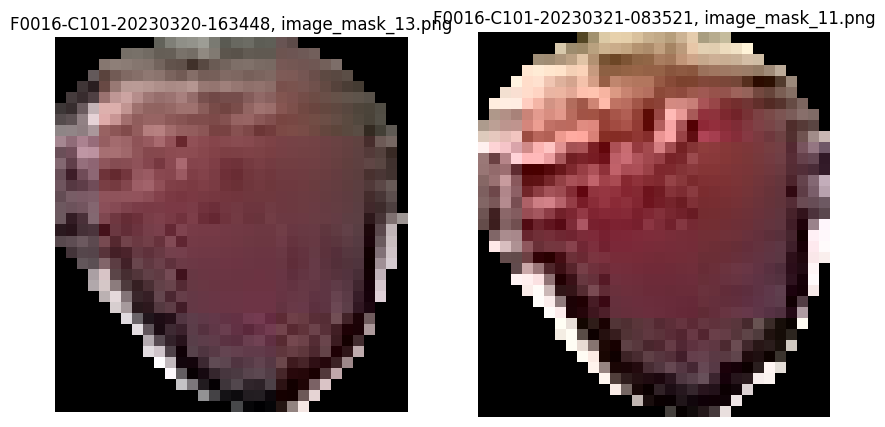

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                  F0016-C101-20230320-163448_2
mask_id                                 ce53434749b761f60572916ad02be567
point_x_x                                                     488.725281
point_y_x                                                     210.466431
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

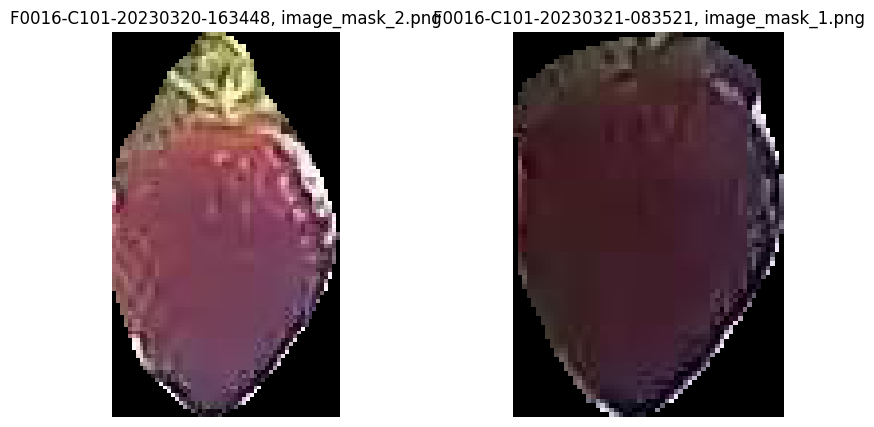

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                  F0016-C101-20230320-163448_4
mask_id                                 da461b9c05b428938a45159c629c77b4
point_x_x                                                     346.224426
point_y_x                                                     423.043884
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

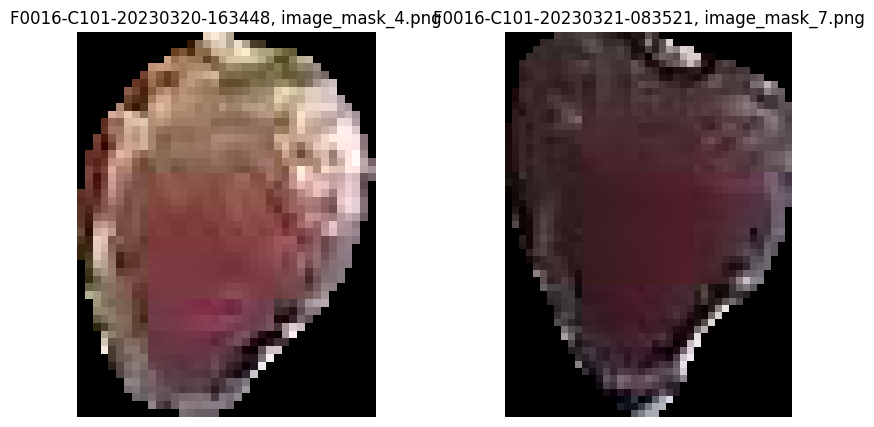

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                  F0016-C101-20230320-163448_4
mask_id                                 da461b9c05b428938a45159c629c77b4
point_x_x                                                     346.224426
point_y_x                                                     423.043884
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

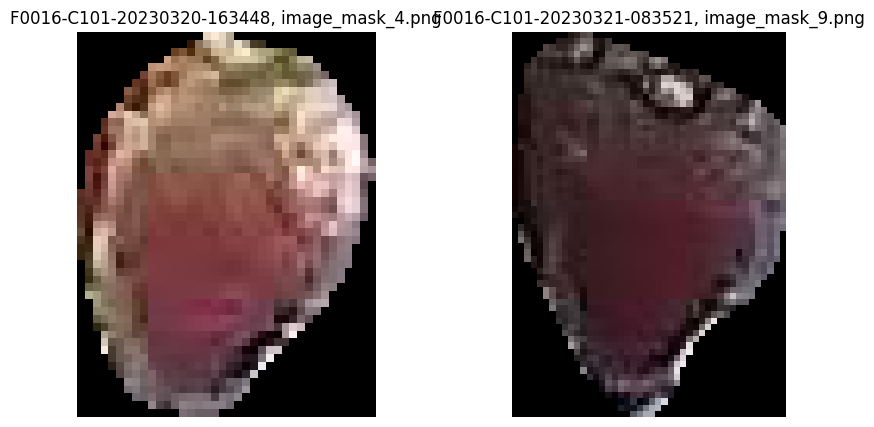

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_33
mask_id                                 e2f81dd5558eff0dc08a58d45fcba81a
point_x_x                                                     1583.85083
point_y_x                                                     274.127869
output_image_path_x                                    image_mask_33.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

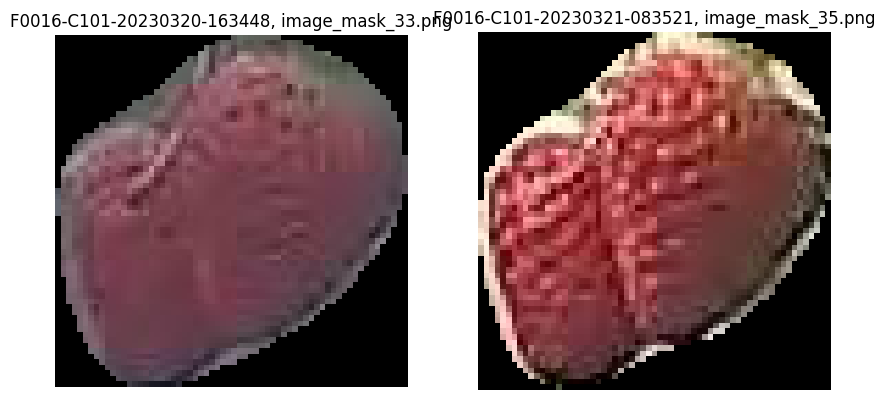

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_33
mask_id                                 e2f81dd5558eff0dc08a58d45fcba81a
point_x_x                                                     1583.85083
point_y_x                                                     274.127869
output_image_path_x                                    image_mask_33.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

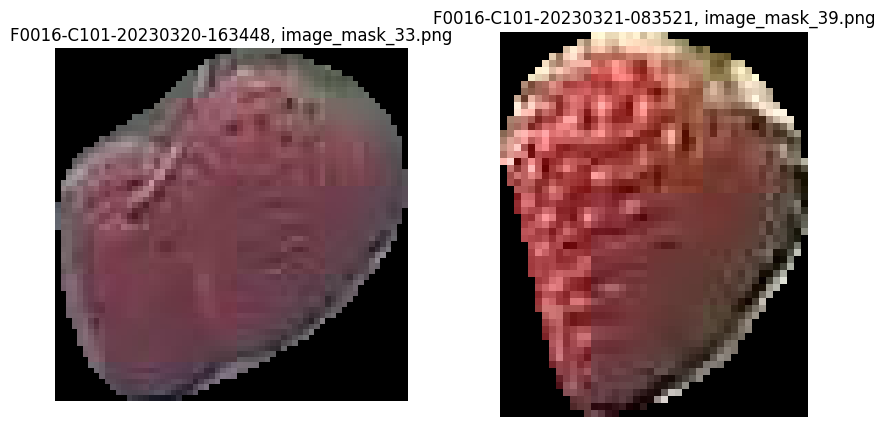

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_35
mask_id                                 e51b144813c6717d64537c76b30e8387
point_x_x                                                    1586.197266
point_y_x                                                     505.209167
output_image_path_x                                    image_mask_35.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

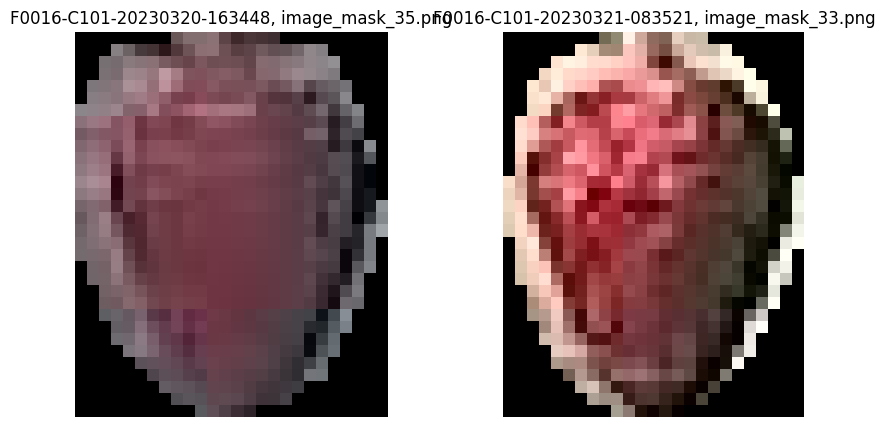

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_39
mask_id                                 ea841ce23d4ac7d7417d43d9151c3774
point_x_x                                                    2281.458252
point_y_x                                                      463.99823
output_image_path_x                                    image_mask_39.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

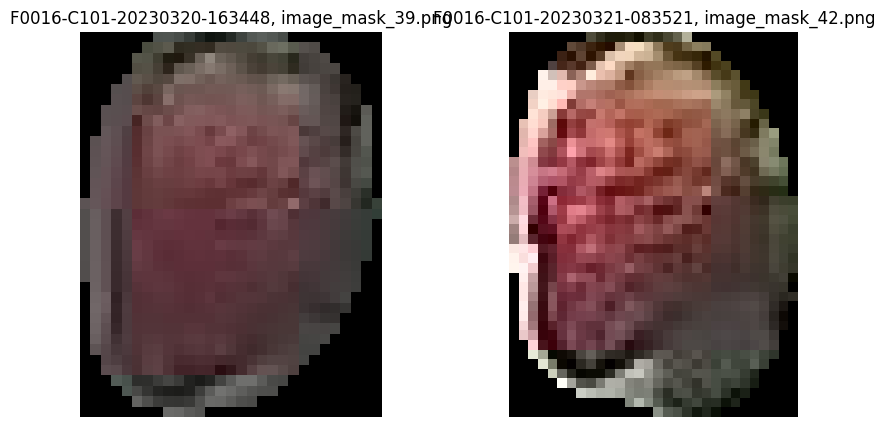

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                  F0016-C101-20230320-163448_1
mask_id                                 f27a4f399c2c8293e804fc738504cabf
point_x_x                                                     370.957458
point_y_x                                                     368.639832
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

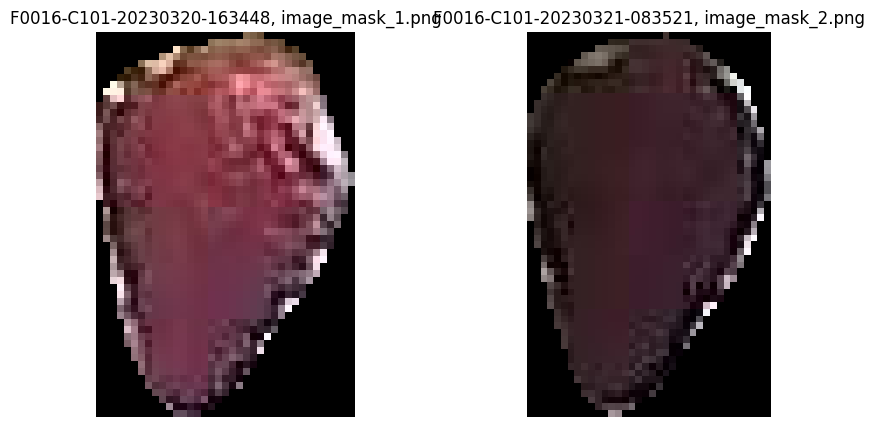

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230320-163448
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230320-123449
mask_num_x                                 F0016-C101-20230320-163448_40
mask_id                                 f477efcc4b1ad12196cbc60d46b48b47
point_x_x                                                    2495.424561
point_y_x                                                     439.306458
output_image_path_x                                    image_mask_40.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230321-083521
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

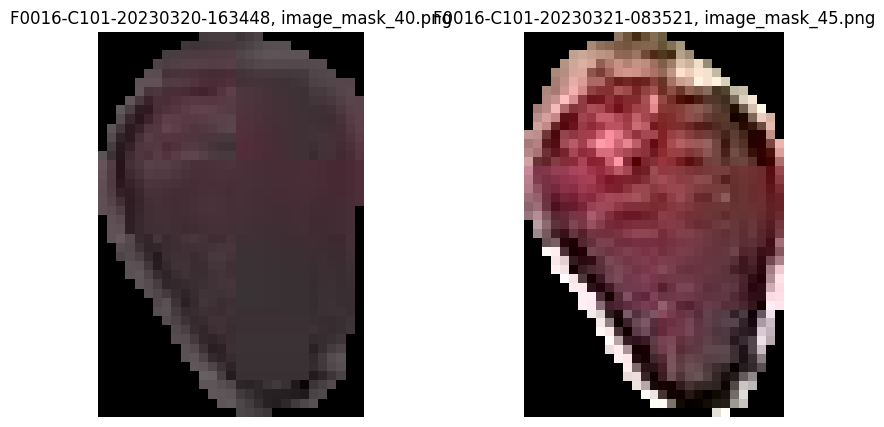

In [99]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = mar_2023[mar_2023["before_img_name"] == "F0016-C101-20230320-123449"]
aug2 = mar_2023[mar_2023["before_img_name"] == "F0016-C101-20230320-163448"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                  F0016-C101-20230328-163400_9
mask_id                                 39f444b303381a33ac653c7f5a356d39
point_x_x                                                      764.46228
point_y_x                                                     454.576324
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

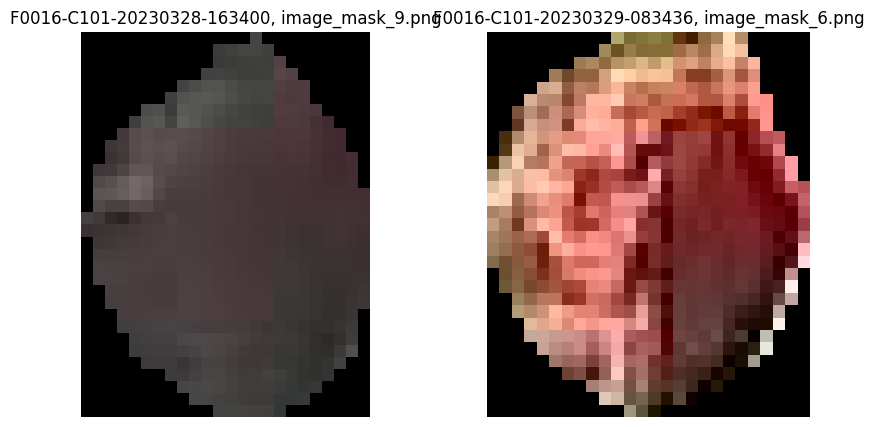

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                  F0016-C101-20230328-163400_5
mask_id                                 485180e95abb39c990ec1a1aa83187ad
point_x_x                                                    1048.461548
point_y_x                                                     431.809631
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

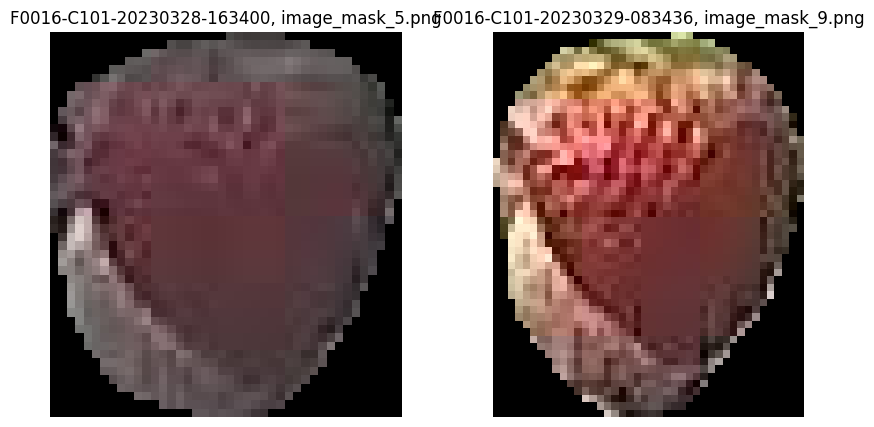

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                  F0016-C101-20230328-163400_4
mask_id                                 617e1c6f30442675448662c9a867a23d
point_x_x                                                    1102.825562
point_y_x                                                     392.629639
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

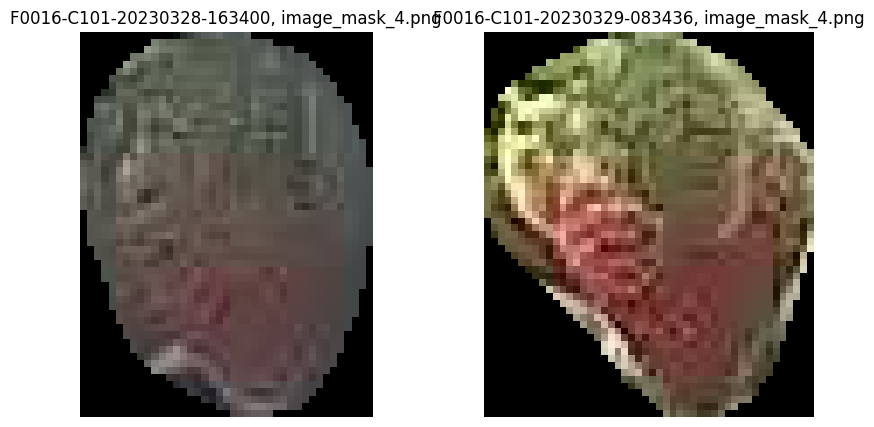

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                 F0016-C101-20230328-163400_14
mask_id                                 6c0f515ff4df1b54b6364512c542baff
point_x_x                                                      1915.7854
point_y_x                                                     109.746872
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

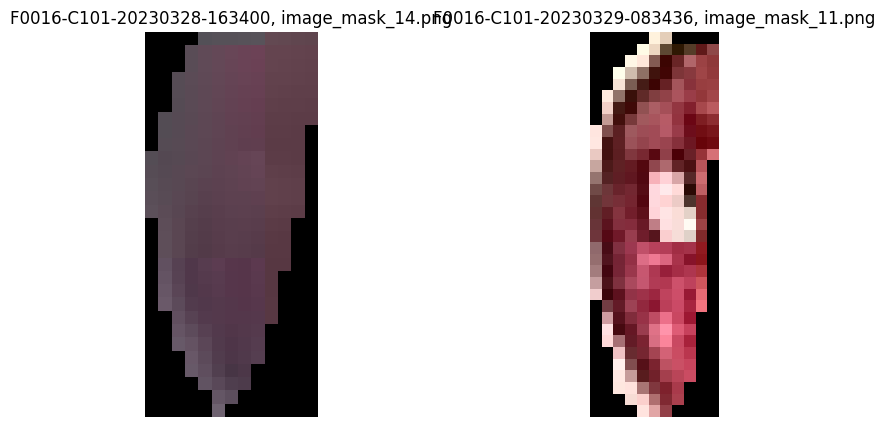

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                 F0016-C101-20230328-163400_13
mask_id                                 804fcdc8a09aff8aaa8c11bed35d81a0
point_x_x                                                    1861.246338
point_y_x                                                      52.181599
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

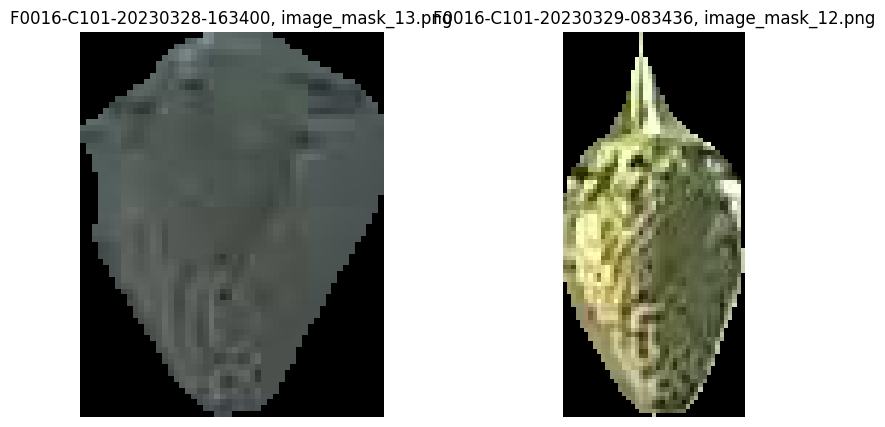

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                 F0016-C101-20230328-163400_12
mask_id                                 877f8aa737e10814bed627017208d0f1
point_x_x                                                    1790.464355
point_y_x                                                     104.856979
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

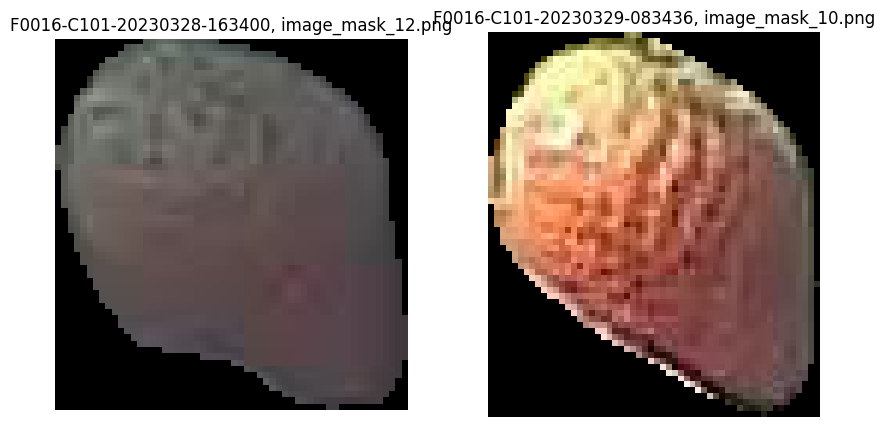

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                  F0016-C101-20230328-163400_1
mask_id                                 989e8b486b0c13c16aaaa134cd6623f3
point_x_x                                                     440.819763
point_y_x                                                      94.457153
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

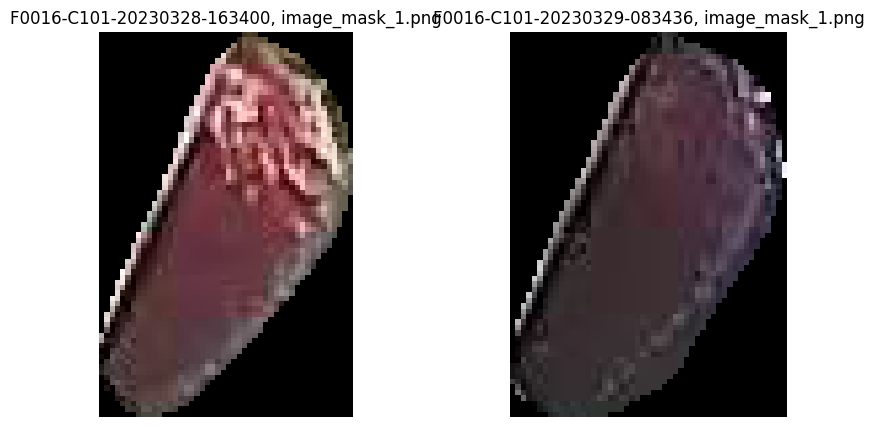

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                  F0016-C101-20230328-163400_7
mask_id                                 9deda7aea5f8b03a7488466ff5766d0f
point_x_x                                                    1198.178955
point_y_x                                                     300.786621
output_image_path_x                                     image_mask_7.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

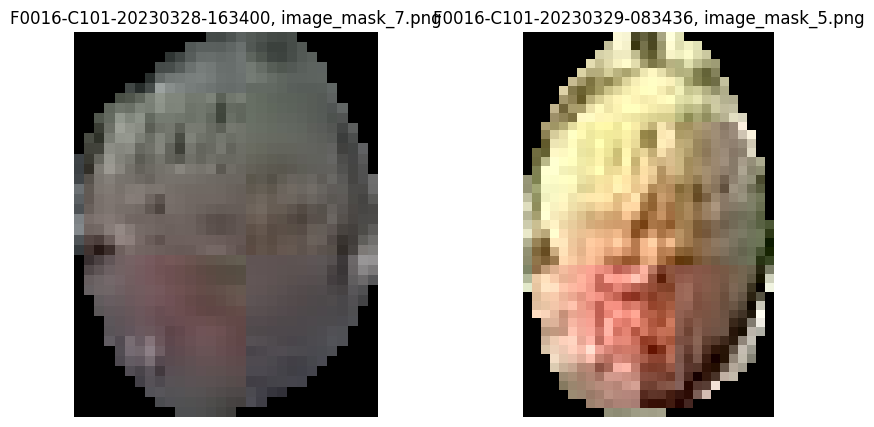

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                 F0016-C101-20230328-163400_10
mask_id                                 ad1d600fb5db965faac8c0660db5604c
point_x_x                                                     785.297729
point_y_x                                                     445.908112
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

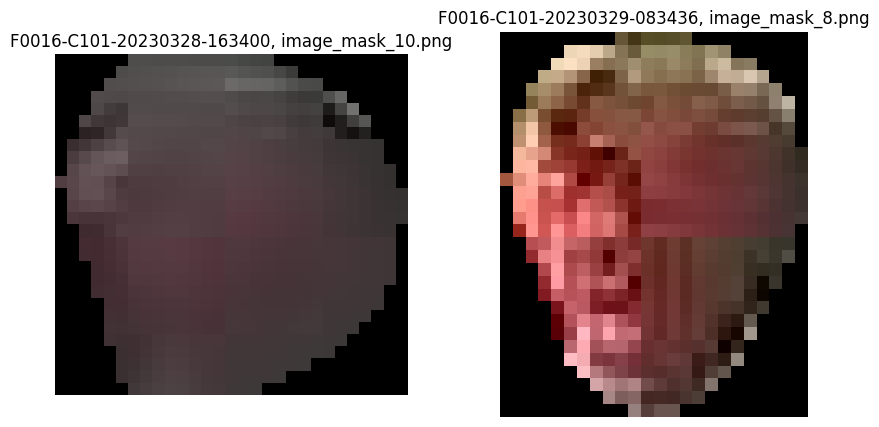

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                 F0016-C101-20230328-163400_11
mask_id                                 ad1d600fb5db965faac8c0660db5604c
point_x_x                                                     786.124939
point_y_x                                                     451.497986
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

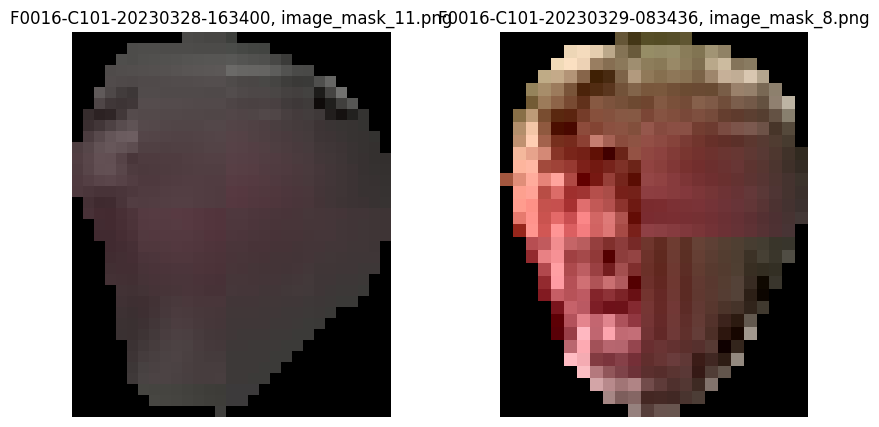

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                  F0016-C101-20230328-163400_8
mask_id                                 bec8273482159df8969aa1267d3d27f6
point_x_x                                                     720.958496
point_y_x                                                     481.570007
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

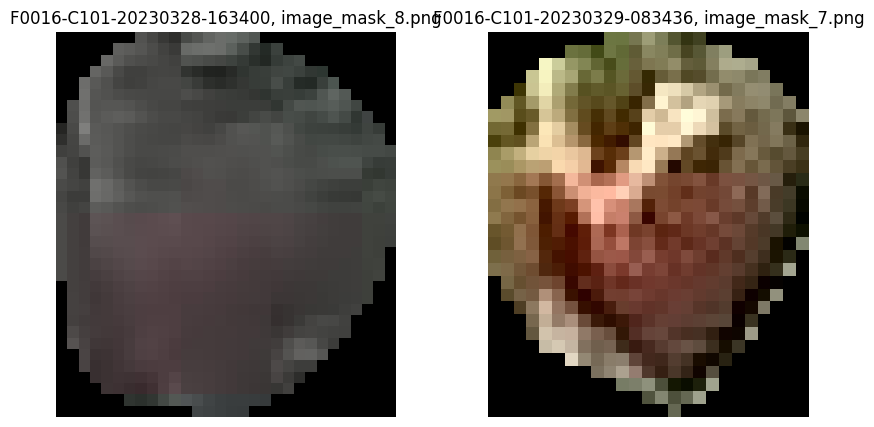

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                  F0016-C101-20230328-163400_6
mask_id                                 c42dc6d56ec808305a110a665d0fb8bd
point_x_x                                                      939.15741
point_y_x                                                      366.99115
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

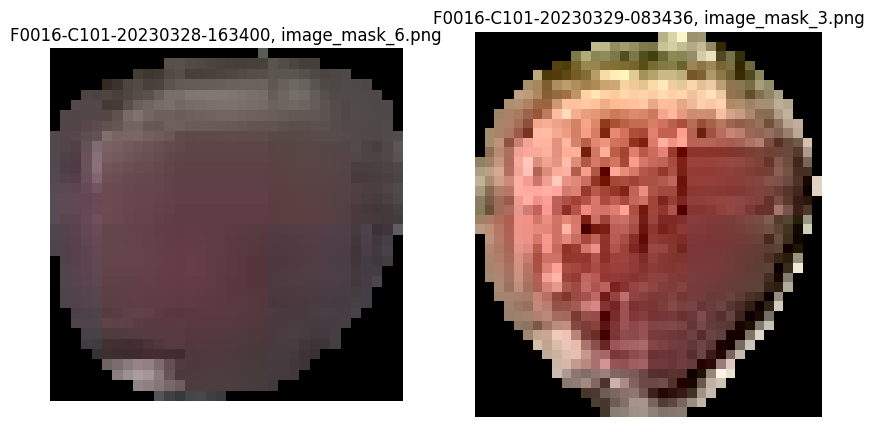

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230328-163400
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230328-123157
mask_num_x                                  F0016-C101-20230328-163400_2
mask_id                                 ee5dea72534ec7afe9e933ce5004a5b5
point_x_x                                                     415.062927
point_y_x                                                     218.274597
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230329-083436
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

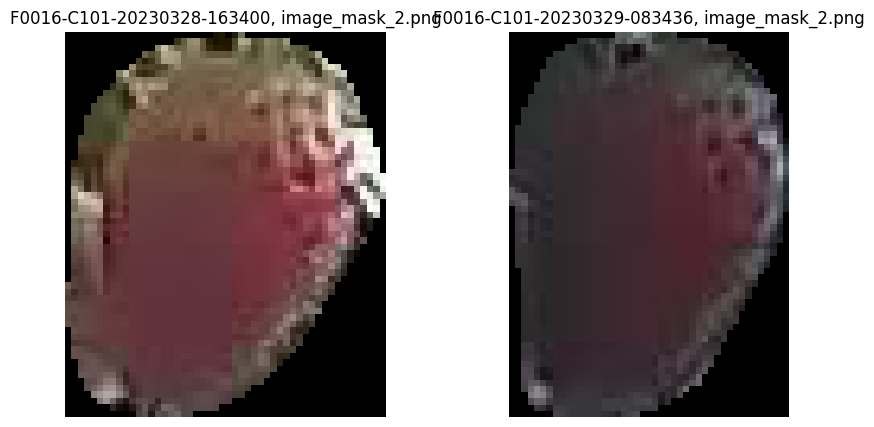

In [100]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = mar_2023[mar_2023["before_img_name"] == "F0016-C101-20230328-123157"]
aug2 = mar_2023[mar_2023["before_img_name"] == "F0016-C101-20230328-163400"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2023년 4월

In [102]:
### 2023년 4월에 해당하는 이미지 필터링
apr_2023 = f0016[(f0016["측정년도"] == 2023) & (f0016["측정월"] == 4)]

# 측정 일자를 datetime으로 변환
apr_2023["측정일자"] = pd.to_datetime(apr_2023["측정일자"])

# 날짜 필터링
apr_2023 = apr_2023[(apr_2023["측정일자"].dt.weekday == 0) | (apr_2023["측정일자"].dt.weekday == 1) | (apr_2023["측정일자"].dt.weekday == 2)]

apr_2023['before_img_name'].unique()

/tmp/ipykernel_266549/1062494497.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  apr_2023["측정일자"] = pd.to_datetime(apr_2023["측정일자"])


array(['F0016-C101-20230402-163151', 'F0016-C101-20230403-083225',
       'F0016-C101-20230403-123228', 'F0016-C101-20230403-163318',
       'F0016-C101-20230404-083504', 'F0016-C101-20230404-123649',
       'F0016-C101-20230404-163640', 'F0016-C101-20230405-083616',
       'F0016-C101-20230405-123640', 'F0016-C101-20230409-163233',
       'F0016-C101-20230410-083221', 'F0016-C101-20230410-123155',
       'F0016-C101-20230410-163312', 'F0016-C101-20230411-083500',
       'F0016-C101-20230411-123504', 'F0016-C101-20230411-163433',
       'F0016-C101-20230412-083607', 'F0016-C101-20230412-123745',
       'F0016-C101-20230416-163609', 'F0016-C101-20230417-083330',
       'F0016-C101-20230417-123422', 'F0016-C101-20230417-163332',
       'F0016-C101-20230418-083156', 'F0016-C101-20230418-123256',
       'F0016-C101-20230418-163235', 'F0016-C101-20230419-083300',
       'F0016-C101-20230419-123434', 'F0016-C101-20230423-163447',
       'F0016-C101-20230424-083442', 'F0016-C101-20230424-1232

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                  F0016-C101-20230403-163318_6
mask_id                                 07cb6314ab36183d8ff683a135d5790d
point_x_x                                                     617.247559
point_y_x                                                     558.512329
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

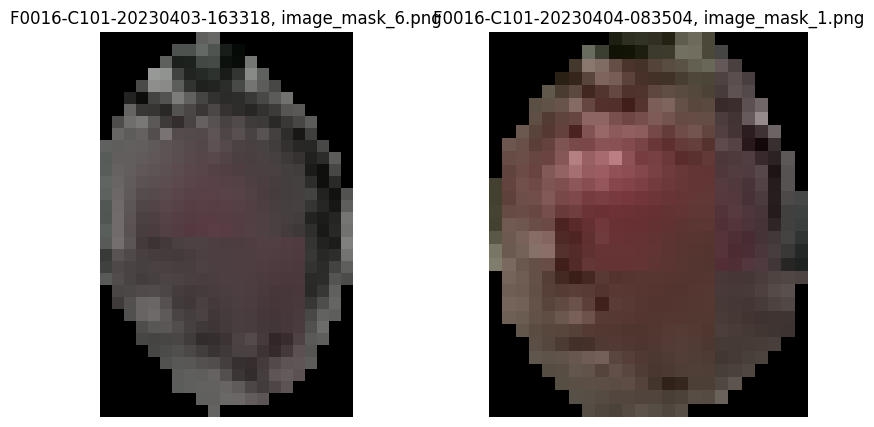

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_10
mask_id                                 194504b80d753c9411f42416ed633e96
point_x_x                                                    1195.480225
point_y_x                                                     544.865601
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

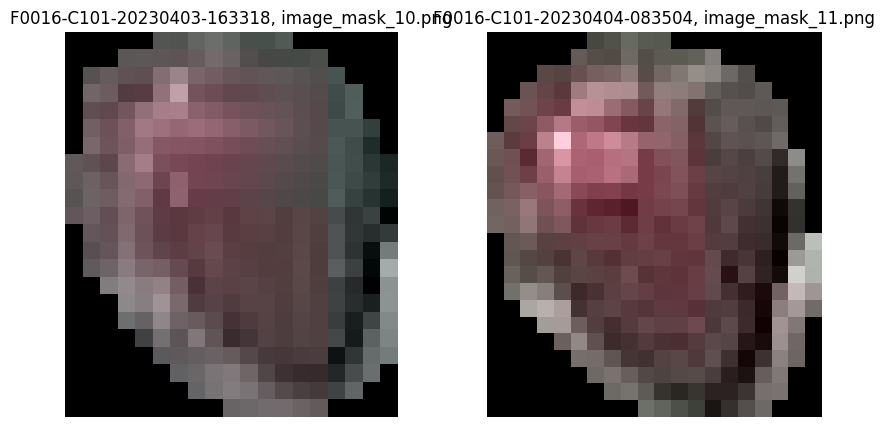

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_21
mask_id                                 25c02d905f451ba8b46ade59c2bbb316
point_x_x                                                    2391.399414
point_y_x                                                      84.702019
output_image_path_x                                    image_mask_21.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

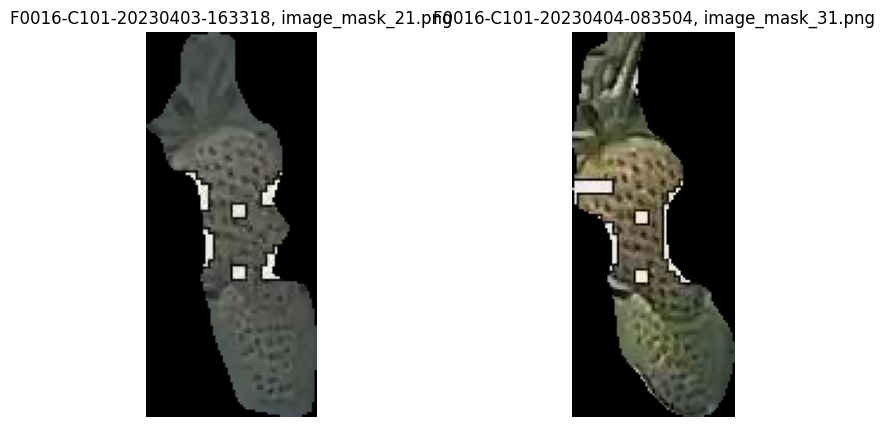

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_12
mask_id                                 277d15794214dd88cd6b15ad989fbe9e
point_x_x                                                     869.382568
point_y_x                                                     450.406555
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

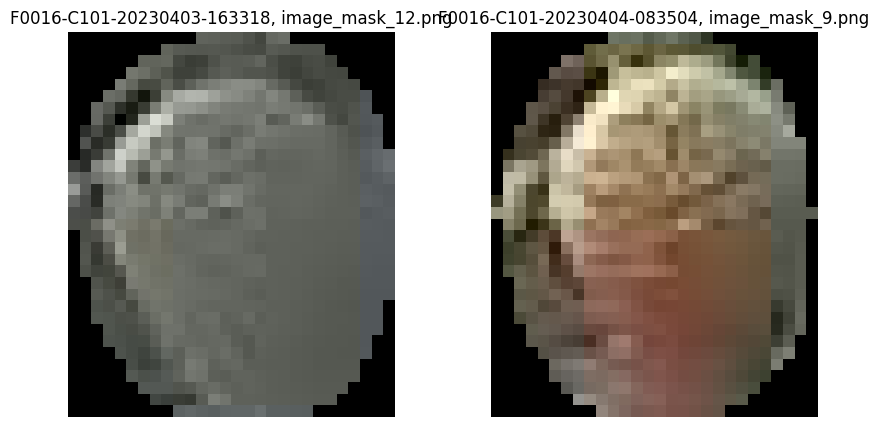

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_24
mask_id                                 443c856eaa1ff91ccb19526d7b6c105c
point_x_x                                                    2215.694092
point_y_x                                                     449.182129
output_image_path_x                                    image_mask_24.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

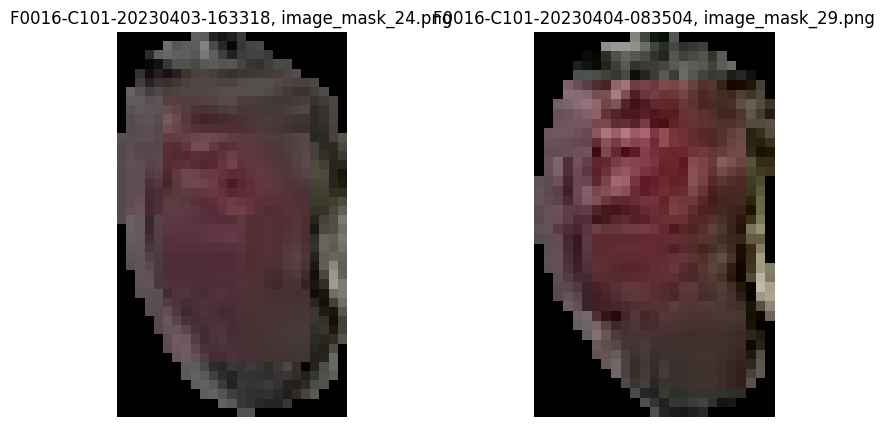

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_16
mask_id                                 4f10806263ea7e44befc38d8dcb596e0
point_x_x                                                    1861.051514
point_y_x                                                     139.127808
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

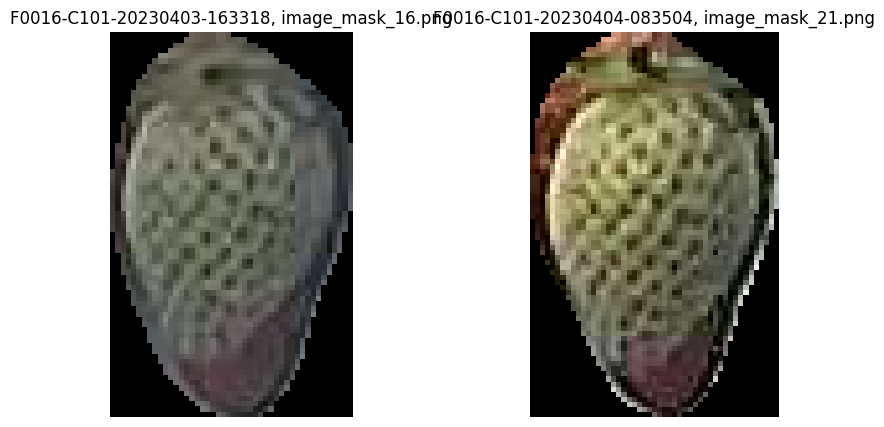

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_22
mask_id                                 4f7afe1e562e8f1705ac99c73cd89c3a
point_x_x                                                    2404.518066
point_y_x                                                     463.705383
output_image_path_x                                    image_mask_22.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

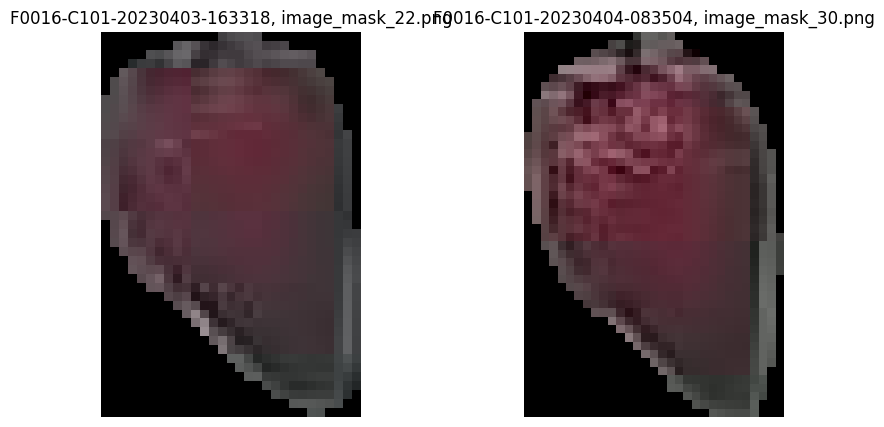

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_19
mask_id                                 5b17b33ef9cee1aa88fd0d88f0e6094c
point_x_x                                                     1493.27356
point_y_x                                                     485.247192
output_image_path_x                                    image_mask_19.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

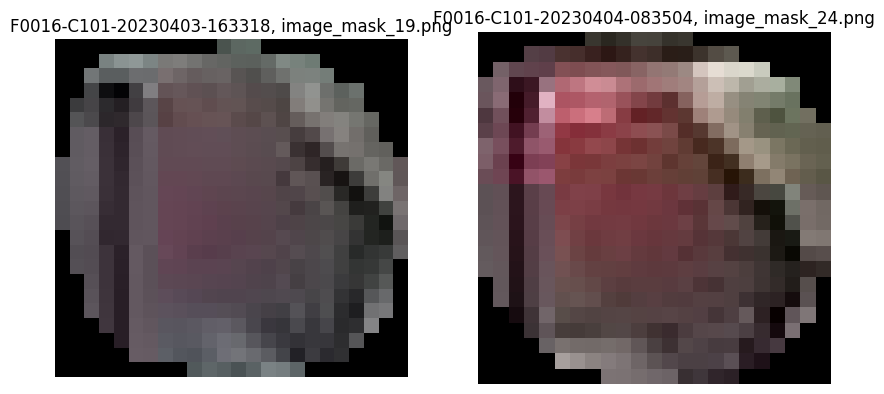

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                  F0016-C101-20230403-163318_7
mask_id                                 617e1c6f30442675448662c9a867a23d
point_x_x                                                    1098.415039
point_y_x                                                     398.900574
output_image_path_x                                     image_mask_7.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

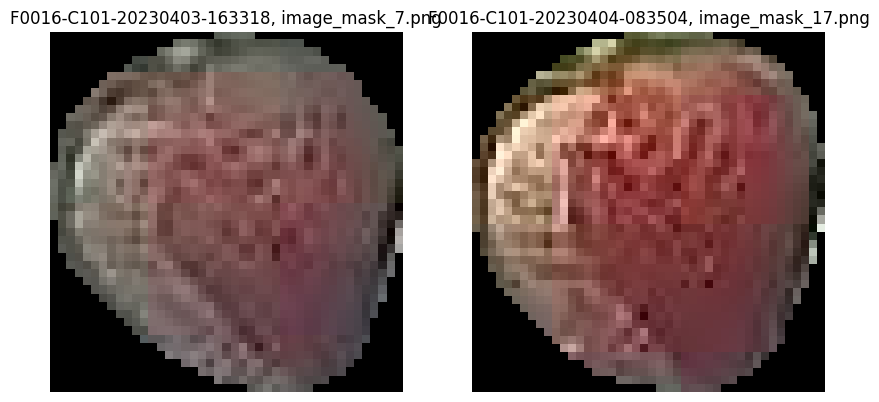

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                  F0016-C101-20230403-163318_3
mask_id                                 626d432a9ce347fae736971bc10669c7
point_x_x                                                     412.439026
point_y_x                                                     159.317017
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

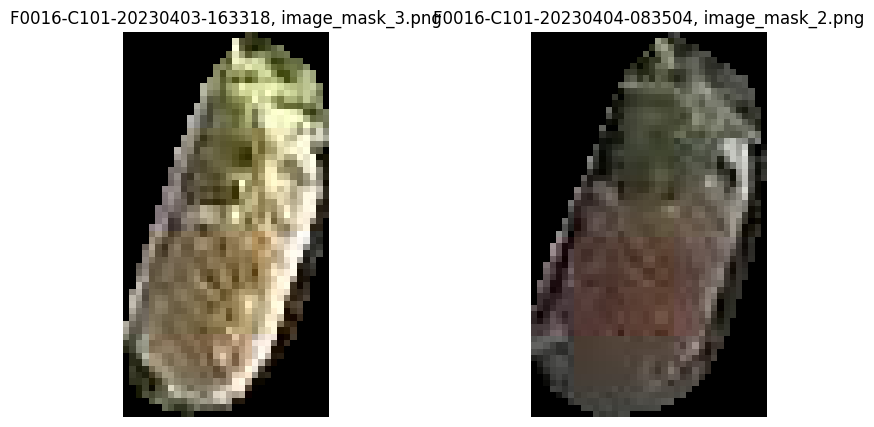

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_11
mask_id                                 668120929436a018fdb1b3f3e1f1dc06
point_x_x                                                    1166.835327
point_y_x                                                     518.707947
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

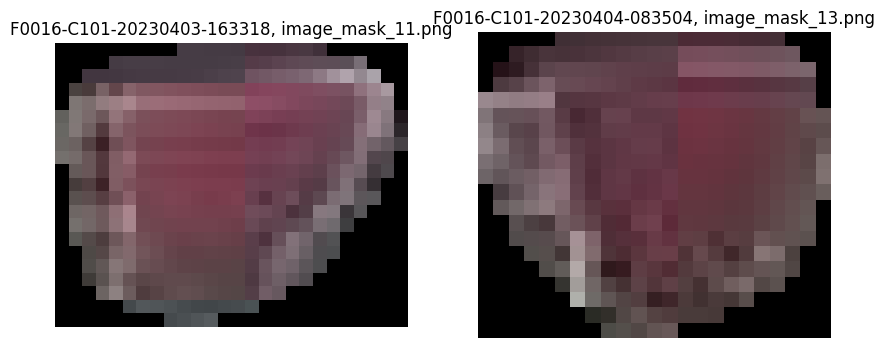

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                  F0016-C101-20230403-163318_5
mask_id                                 682854e695af6a15ddf19e818b949420
point_x_x                                                      335.54599
point_y_x                                                     418.004547
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

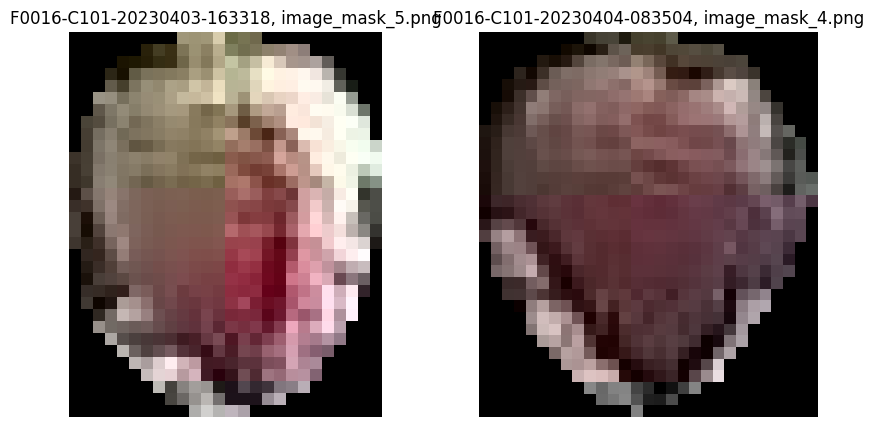

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_26
mask_id                                 7d78902ab2ef05dfe489937a97aa69c5
point_x_x                                                    2313.760986
point_y_x                                                     419.759155
output_image_path_x                                    image_mask_26.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

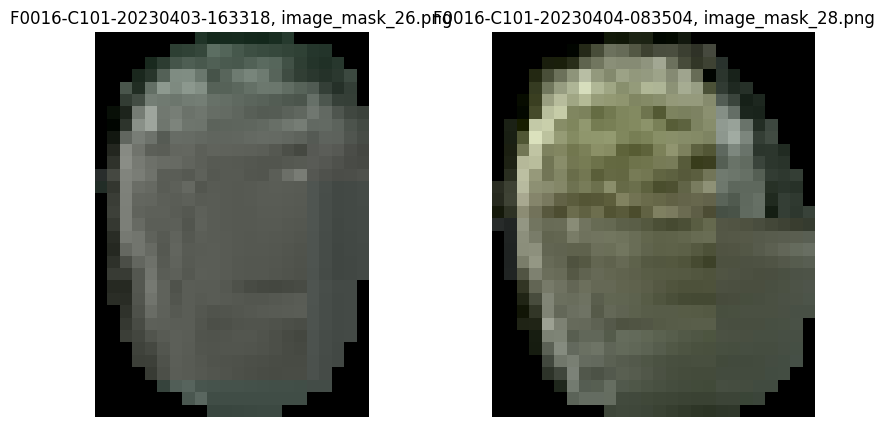

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                  F0016-C101-20230403-163318_8
mask_id                                 855281010e668aaaca9efbf764bdccbf
point_x_x                                                    1188.784302
point_y_x                                                     256.130676
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

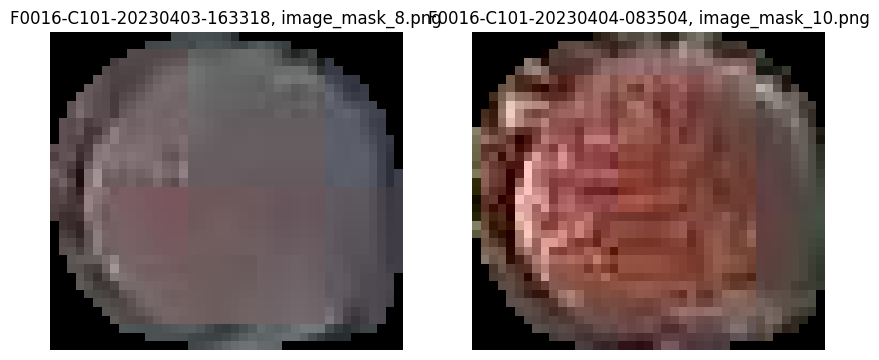

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                  F0016-C101-20230403-163318_9
mask_id                                 8baa9f15875f7203bf4a9222bb1b7257
point_x_x                                                     817.996094
point_y_x                                                     450.441528
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

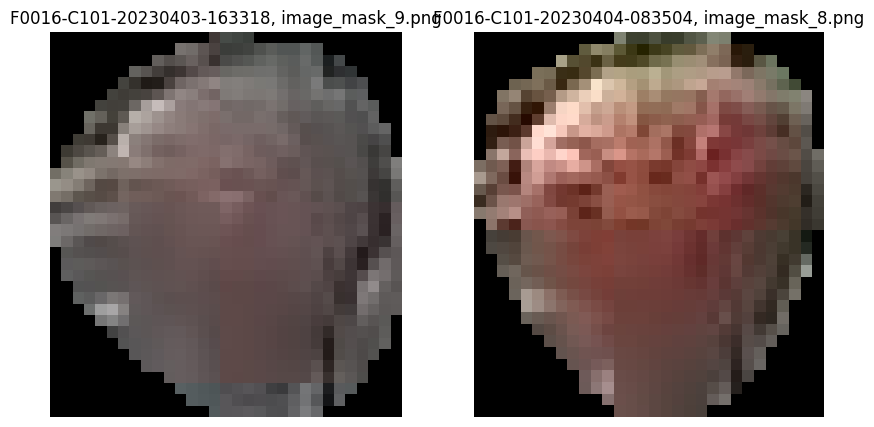

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_13
mask_id                                 b2055147f4b064517d043ed814cb8b50
point_x_x                                                      984.81366
point_y_x                                                     373.985077
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

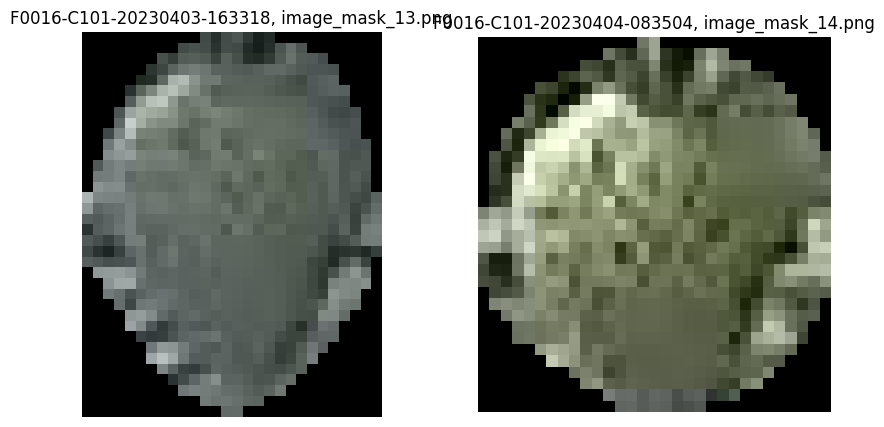

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_17
mask_id                                 b289844df49ec556dcb48d789f7aad33
point_x_x                                                    1820.141602
point_y_x                                                     126.827499
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

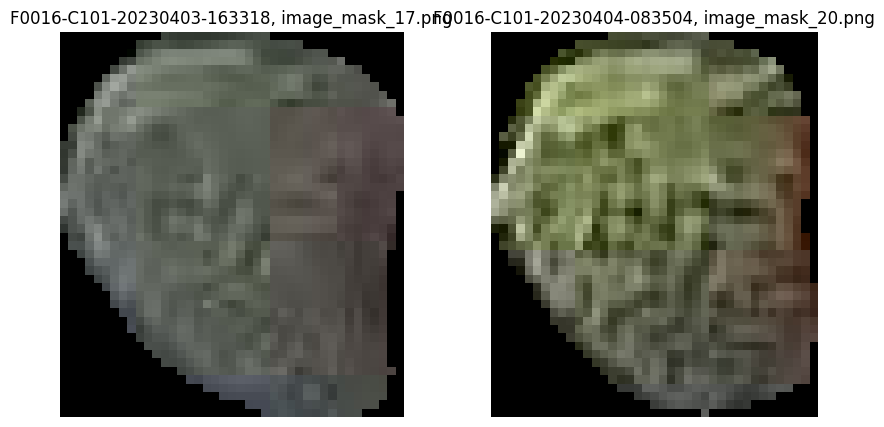

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_18
mask_id                                 b3b9094f7decf64512178ab30c061aa8
point_x_x                                                    1787.189209
point_y_x                                                      93.620529
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

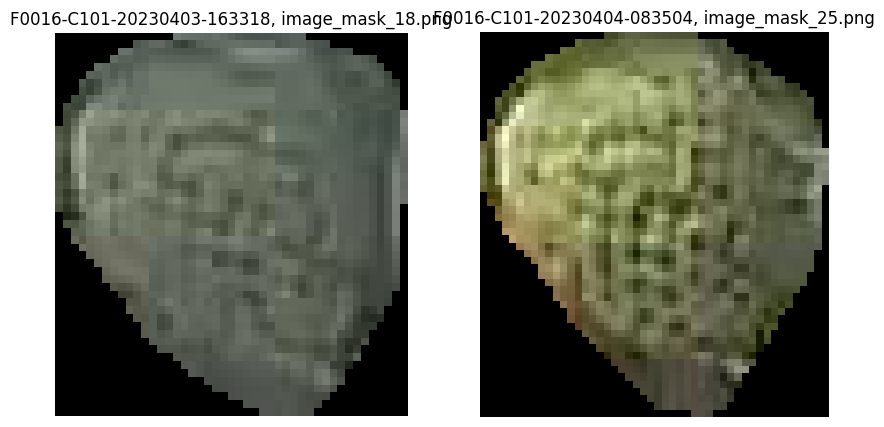

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_14
mask_id                                 c3c41592bcf3aac12a543ad24bdab639
point_x_x                                                    1763.775024
point_y_x                                                     119.553528
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

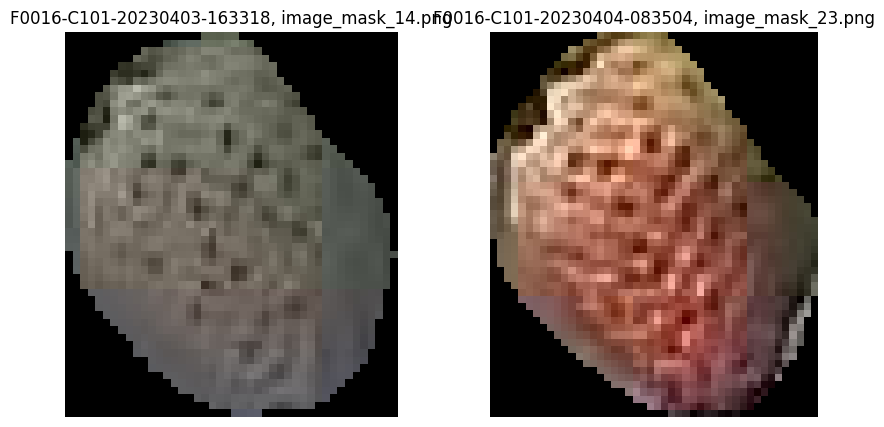

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_23
mask_id                                 d3f250e193f2bb92962be01141406054
point_x_x                                                    2256.916504
point_y_x                                                     418.414001
output_image_path_x                                    image_mask_23.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

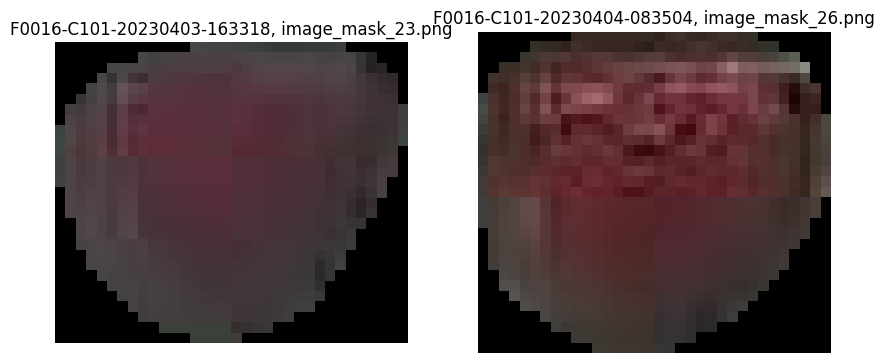

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                  F0016-C101-20230403-163318_2
mask_id                                 ee5dea72534ec7afe9e933ce5004a5b5
point_x_x                                                     415.562988
point_y_x                                                     228.811859
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

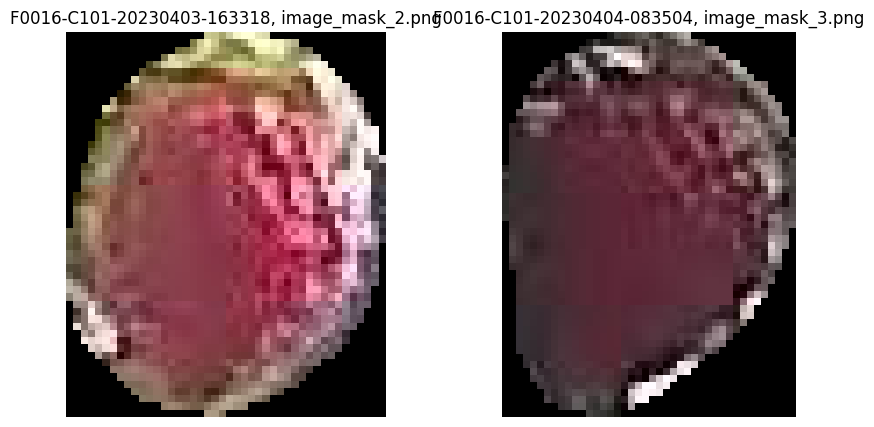

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230403-163318
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230403-123228
mask_num_x                                 F0016-C101-20230403-163318_15
mask_id                                 eee9ab0dd480089ad539340d0699c81d
point_x_x                                                    1526.806763
point_y_x                                                     482.311554
output_image_path_x                                    image_mask_15.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230404-083504
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

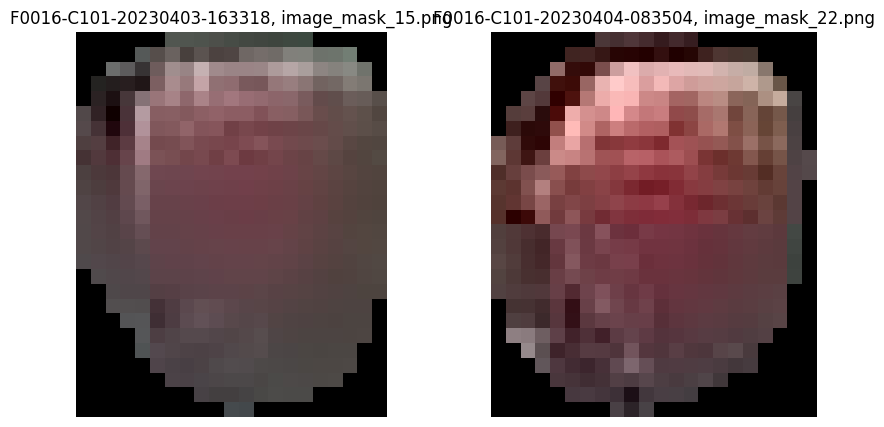

In [103]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = apr_2023[apr_2023["before_img_name"] == "F0016-C101-20230403-123228"]
aug2 = apr_2023[apr_2023["before_img_name"] == "F0016-C101-20230403-163318"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_6
mask_id                                 07cb6314ab36183d8ff683a135d5790d
point_x_x                                                     619.087341
point_y_x                                                     558.255615
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

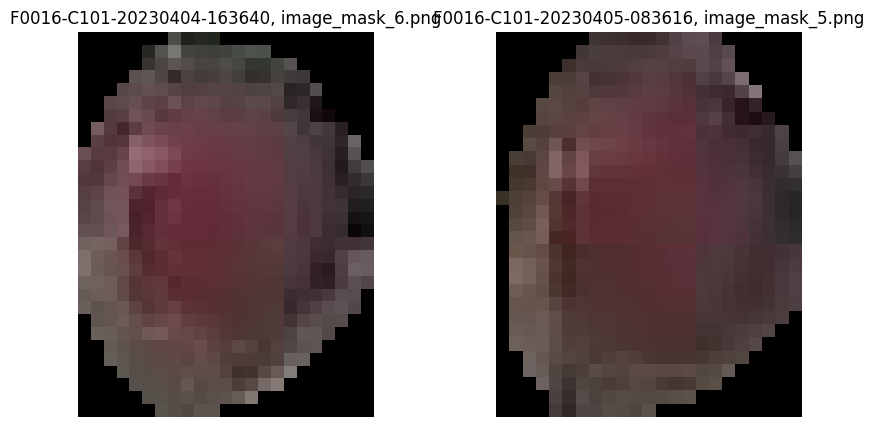

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_12
mask_id                                 194504b80d753c9411f42416ed633e96
point_x_x                                                    1197.174316
point_y_x                                                     541.923706
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

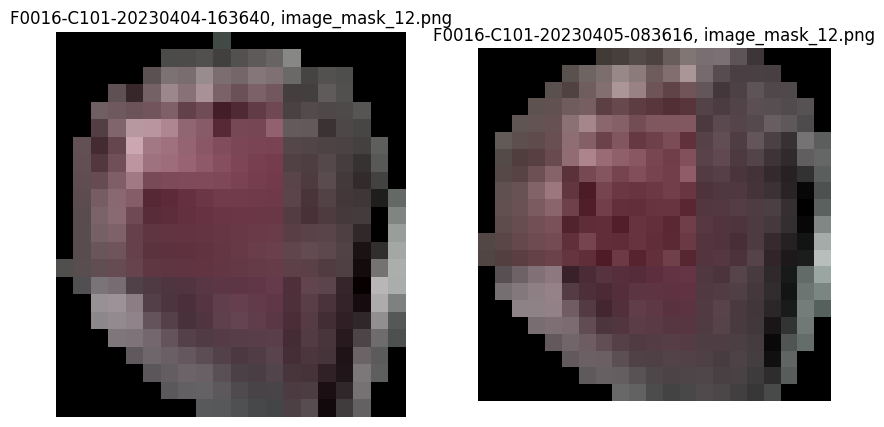

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_8
mask_id                                 277d15794214dd88cd6b15ad989fbe9e
point_x_x                                                     872.406433
point_y_x                                                     449.475769
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

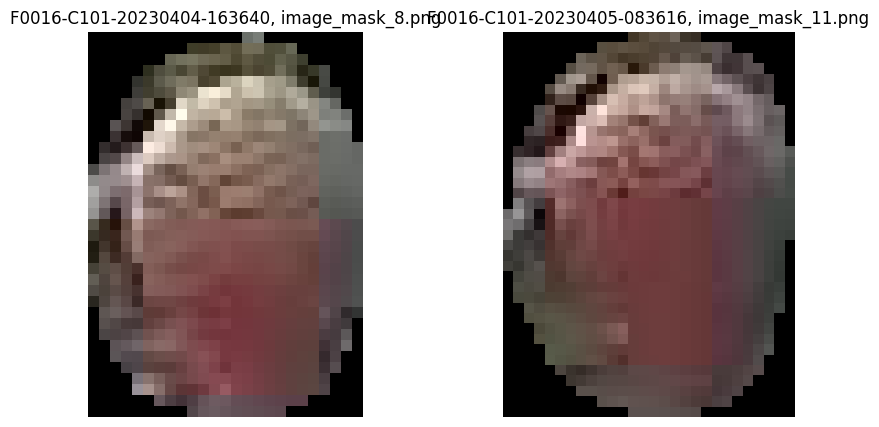

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_21
mask_id                                 4f10806263ea7e44befc38d8dcb596e0
point_x_x                                                    1864.176147
point_y_x                                                     142.147003
output_image_path_x                                    image_mask_21.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

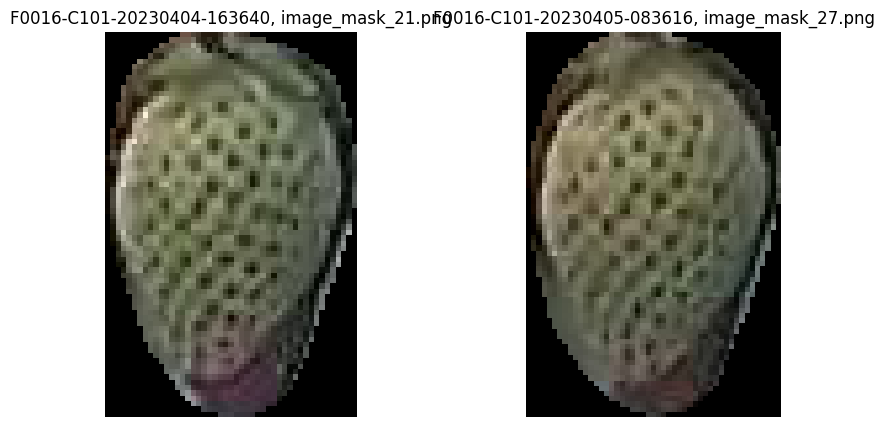

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_13
mask_id                                 617e1c6f30442675448662c9a867a23d
point_x_x                                                    1101.485107
point_y_x                                                     398.919495
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

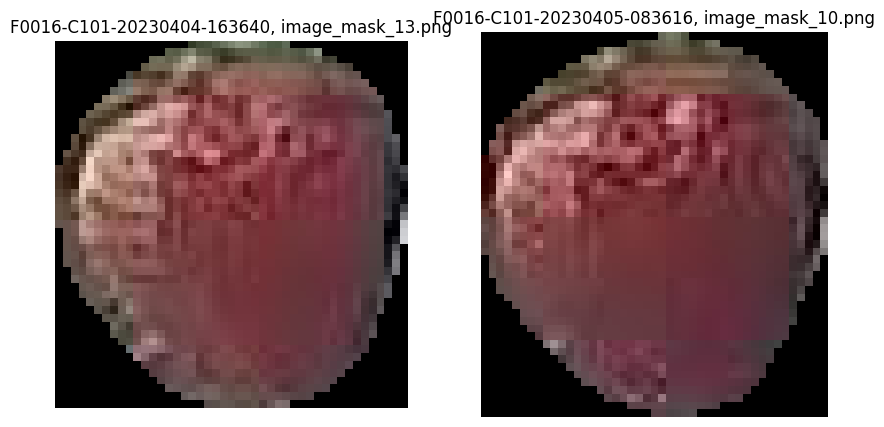

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_2
mask_id                                 626d432a9ce347fae736971bc10669c7
point_x_x                                                     408.689728
point_y_x                                                      164.65506
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

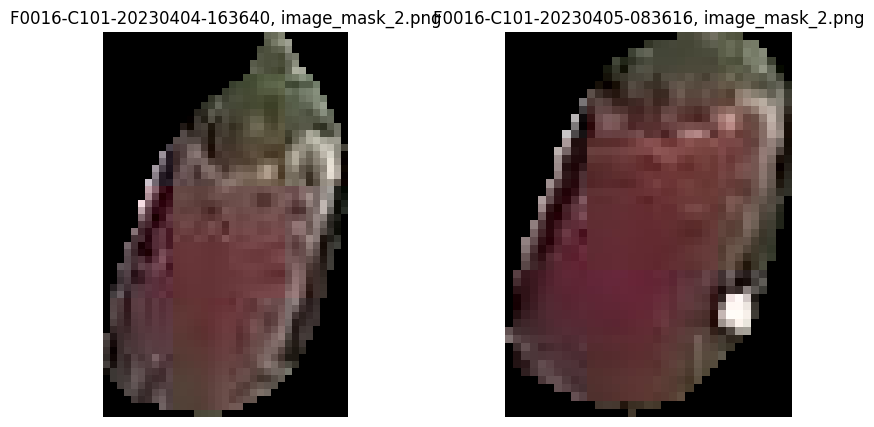

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_11
mask_id                                 668120929436a018fdb1b3f3e1f1dc06
point_x_x                                                    1167.280518
point_y_x                                                     516.672607
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

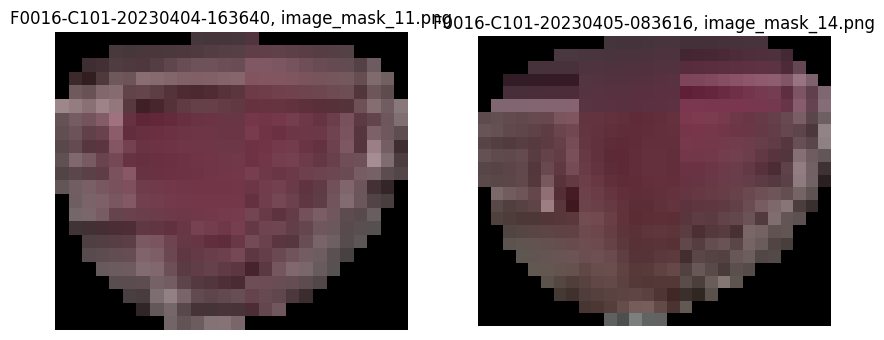

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_4
mask_id                                 682854e695af6a15ddf19e818b949420
point_x_x                                                     334.306824
point_y_x                                                     421.938141
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

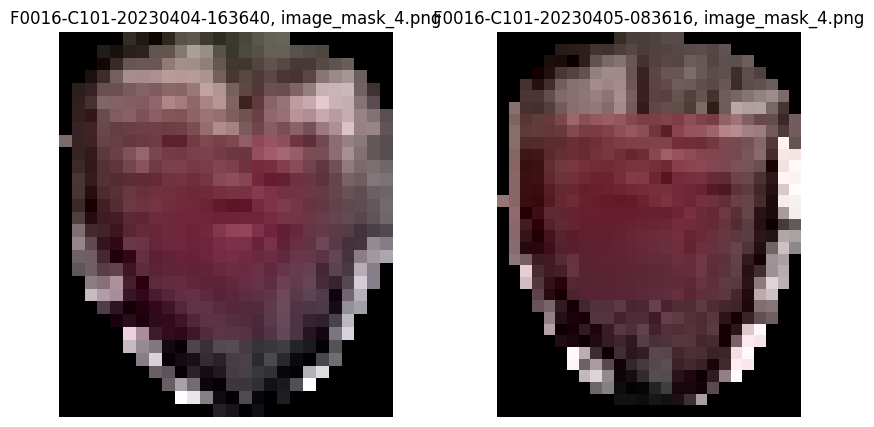

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_9
mask_id                                 7dcf74371f1bbfd71b0cfbebb273bdbd
point_x_x                                                    1061.133545
point_y_x                                                     382.111084
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

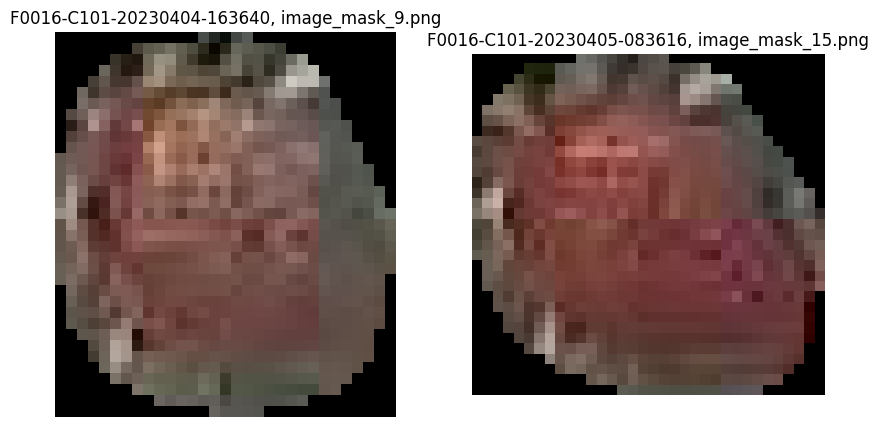

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_9
mask_id                                 7dcf74371f1bbfd71b0cfbebb273bdbd
point_x_x                                                    1061.133545
point_y_x                                                     382.111084
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

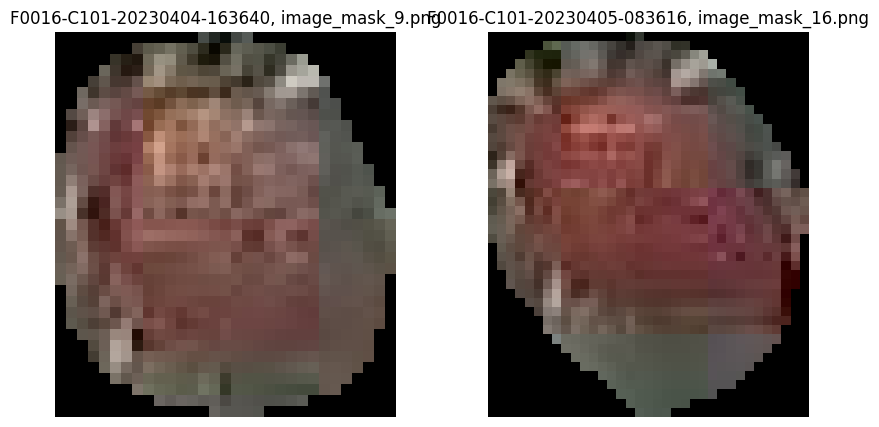

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_5
mask_id                                 809af75d356e5af0ed394bf5483982e9
point_x_x                                                     633.664673
point_y_x                                                     519.703308
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

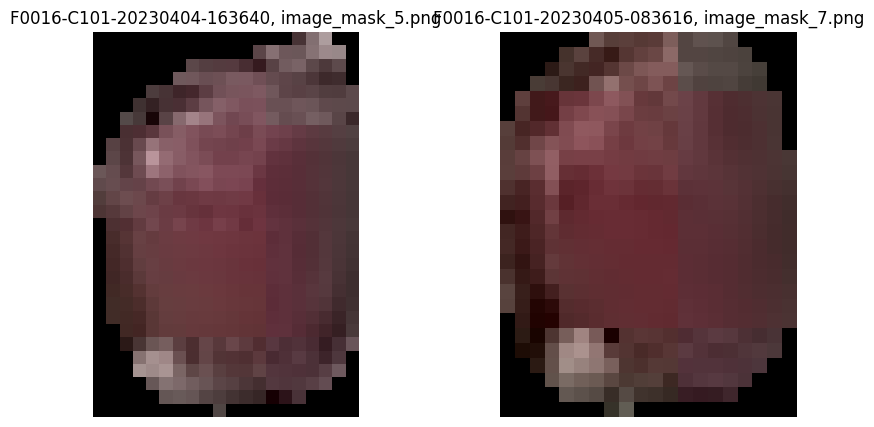

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_10
mask_id                                 855281010e668aaaca9efbf764bdccbf
point_x_x                                                    1187.910889
point_y_x                                                     258.006714
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

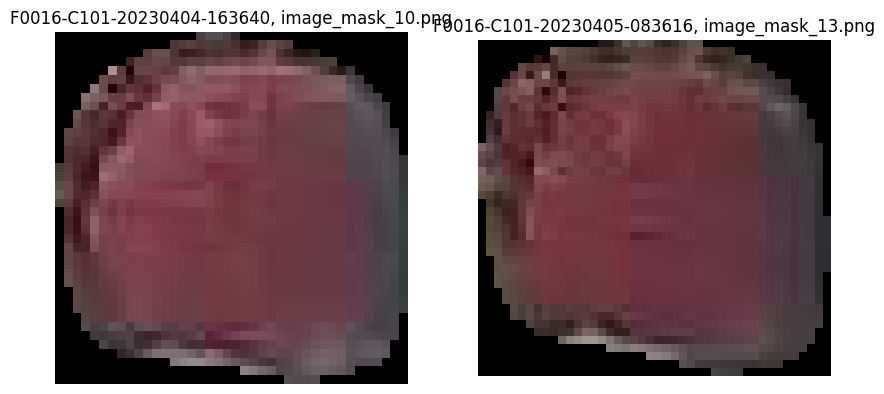

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_28
mask_id                                 873c8c8a9c551850ace0142a5d7d4390
point_x_x                                                    2128.740234
point_y_x                                                      31.209845
output_image_path_x                                    image_mask_28.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

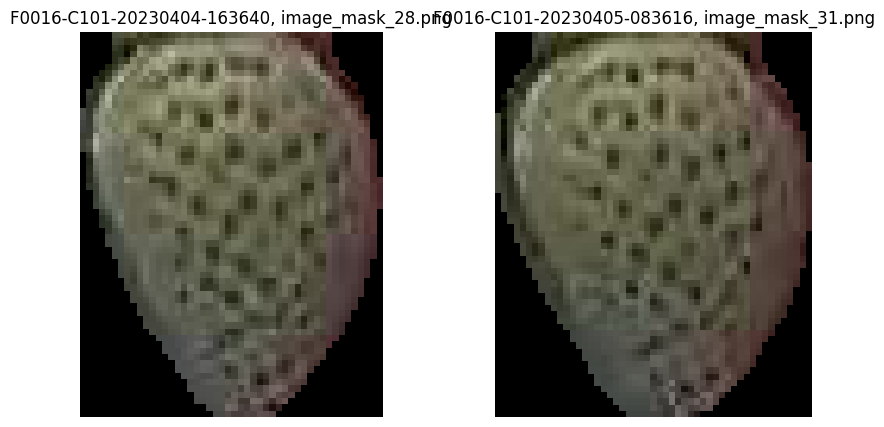

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_7
mask_id                                 8baa9f15875f7203bf4a9222bb1b7257
point_x_x                                                     820.313477
point_y_x                                                     450.665924
output_image_path_x                                     image_mask_7.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

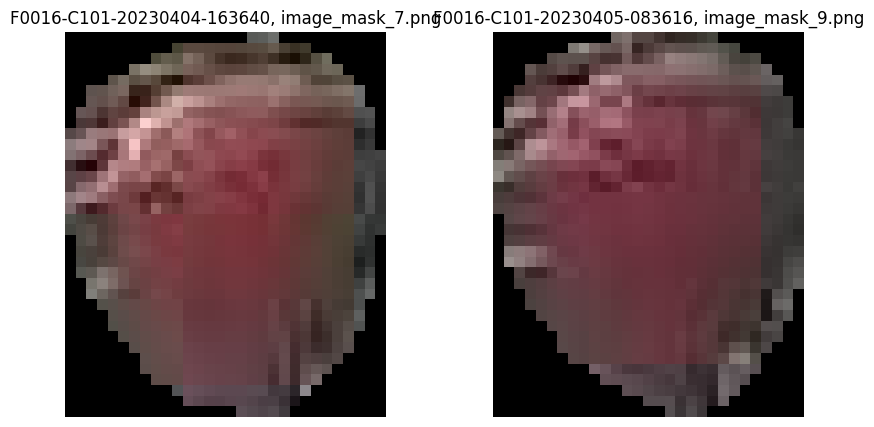

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_18
mask_id                                 b289844df49ec556dcb48d789f7aad33
point_x_x                                                    1820.956787
point_y_x                                                     130.169006
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

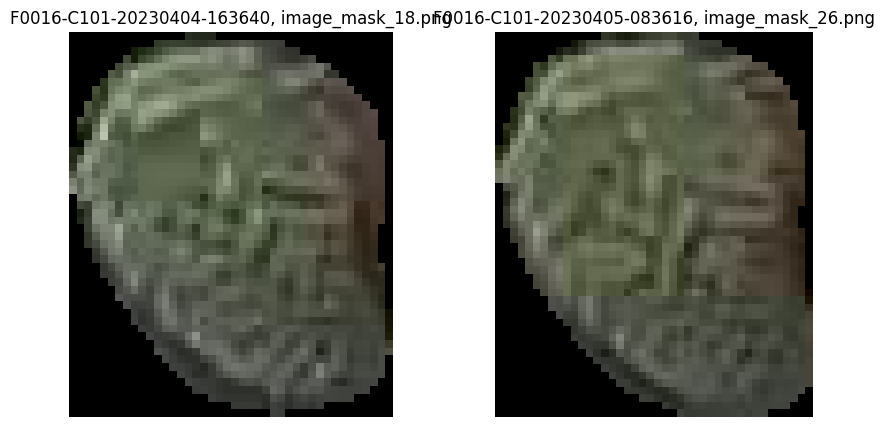

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_20
mask_id                                 b3b9094f7decf64512178ab30c061aa8
point_x_x                                                    1789.085938
point_y_x                                                      96.297882
output_image_path_x                                    image_mask_20.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

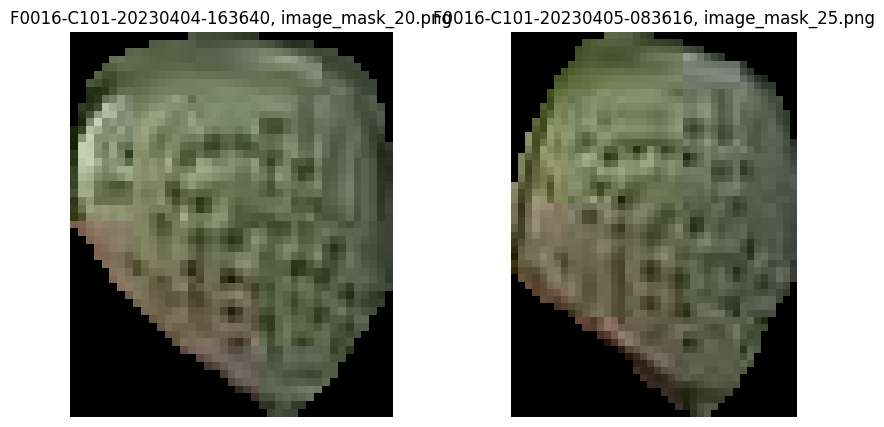

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_17
mask_id                                 be3c3348da10e73fb29fbfcc374b74d4
point_x_x                                                     908.725952
point_y_x                                                      262.92334
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

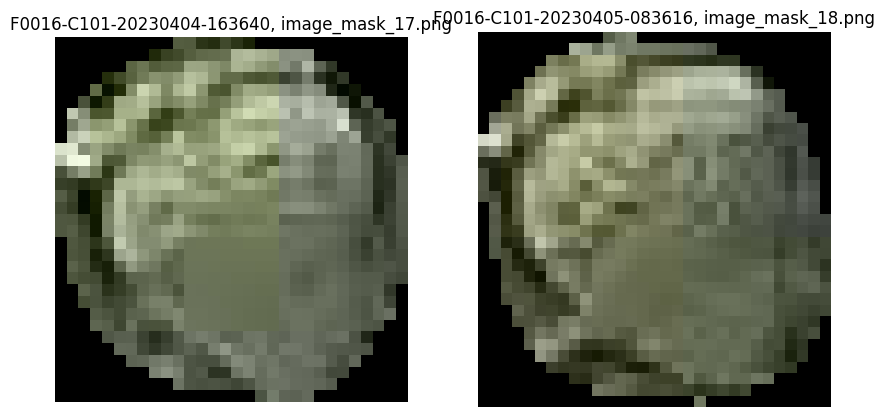

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_19
mask_id                                 c3c41592bcf3aac12a543ad24bdab639
point_x_x                                                    1769.288696
point_y_x                                                     125.281464
output_image_path_x                                    image_mask_19.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

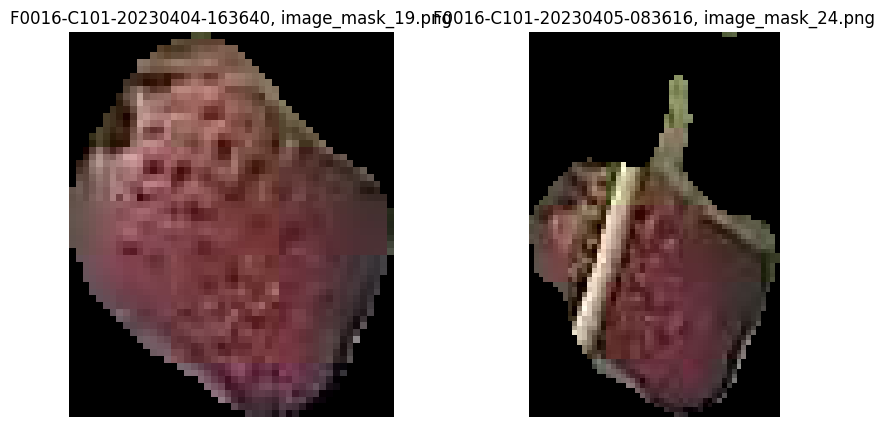

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_3
mask_id                                 d31a3a7509f74eef21ca039cc14b16f5
point_x_x                                                     378.231567
point_y_x                                                     260.226044
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

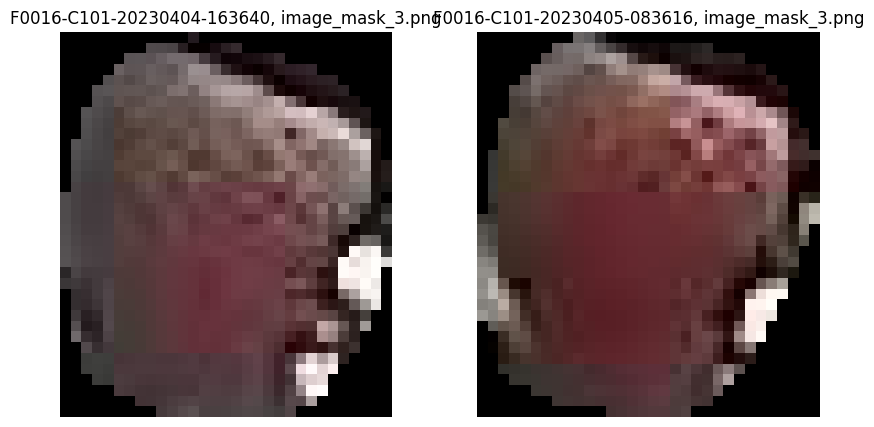

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                  F0016-C101-20230404-163640_1
mask_id                                 ee5dea72534ec7afe9e933ce5004a5b5
point_x_x                                                     416.832092
point_y_x                                                     226.898788
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

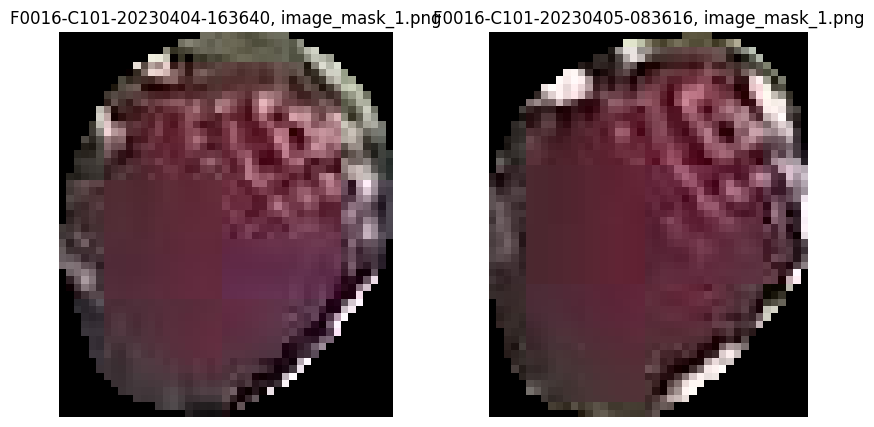

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230404-163640
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230404-123649
mask_num_x                                 F0016-C101-20230404-163640_32
mask_id                                 fe4cb197119830d9568892a6f251b38d
point_x_x                                                    2157.178955
point_y_x                                                      44.079285
output_image_path_x                                    image_mask_32.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230405-083616
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

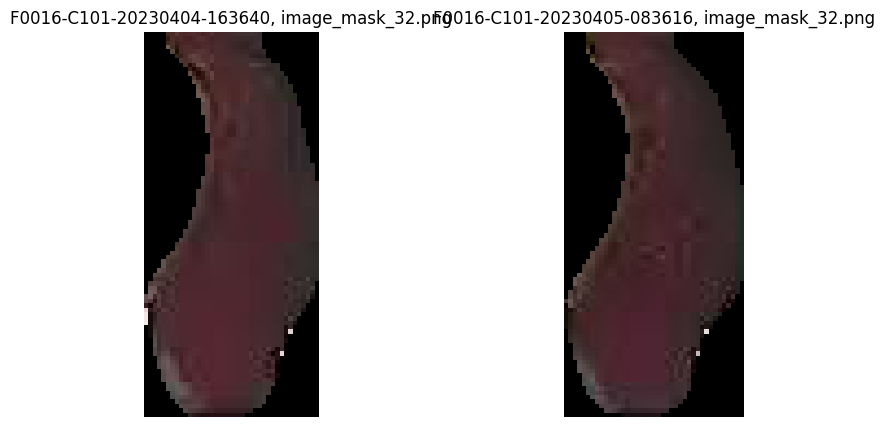

In [104]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = apr_2023[apr_2023["before_img_name"] == "F0016-C101-20230404-123649"]
aug2 = apr_2023[apr_2023["before_img_name"] == "F0016-C101-20230404-163640"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_5
mask_id                                 034077223285cfc7af419ae0733e116c
point_x_x                                                      738.27948
point_y_x                                                     448.587463
output_image_path_x                                     image_mask_5.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

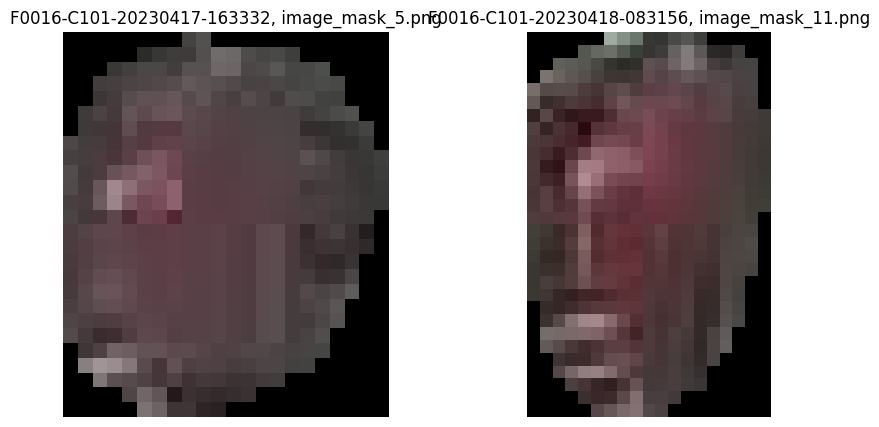

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_2
mask_id                                 069156b998bb5cddd9195cceeb0c6557
point_x_x                                                     388.615479
point_y_x                                                      200.84375
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

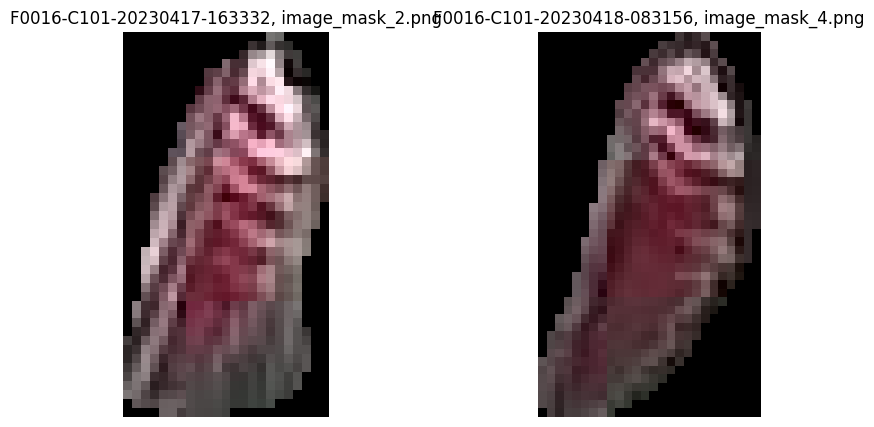

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_1
mask_id                                 082e467814e19165a2221e16b66691a1
point_x_x                                                     494.426575
point_y_x                                                     172.265823
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

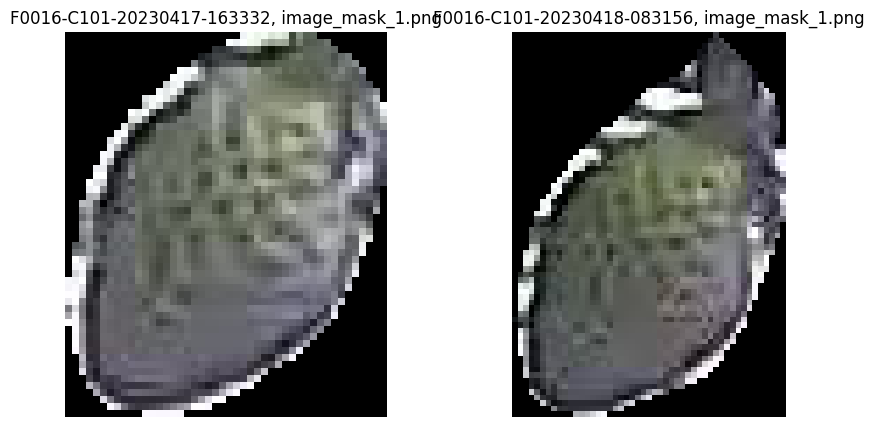

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_4
mask_id                                 37fb6c08d76eab562605d924f5e257f1
point_x_x                                                     869.853638
point_y_x                                                     483.826111
output_image_path_x                                     image_mask_4.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

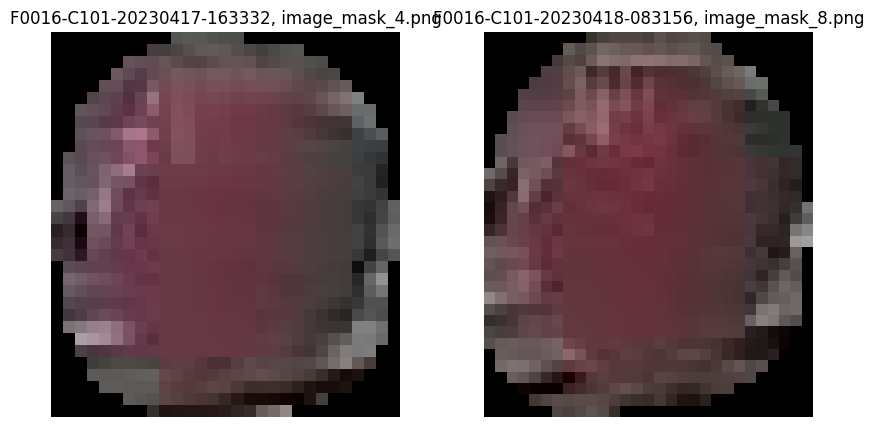

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_8
mask_id                                 3dd2f224c139139e57cde97feeeee0df
point_x_x                                                     905.547607
point_y_x                                                     567.764404
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

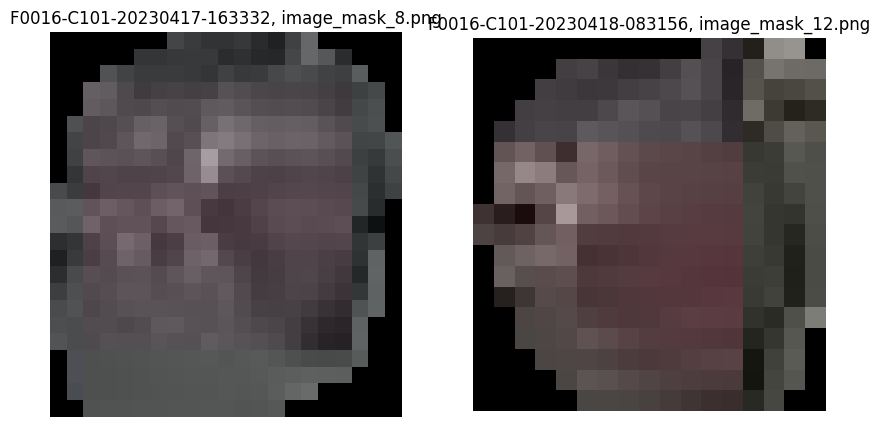

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_3
mask_id                                 6f3257faeaebc2b4226dc67a300cf516
point_x_x                                                     383.277039
point_y_x                                                     321.043365
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

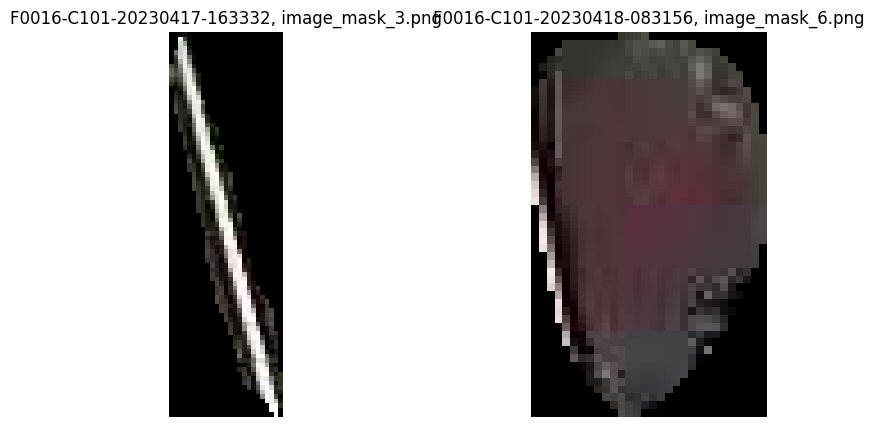

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_3
mask_id                                 6f3257faeaebc2b4226dc67a300cf516
point_x_x                                                     383.277039
point_y_x                                                     321.043365
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

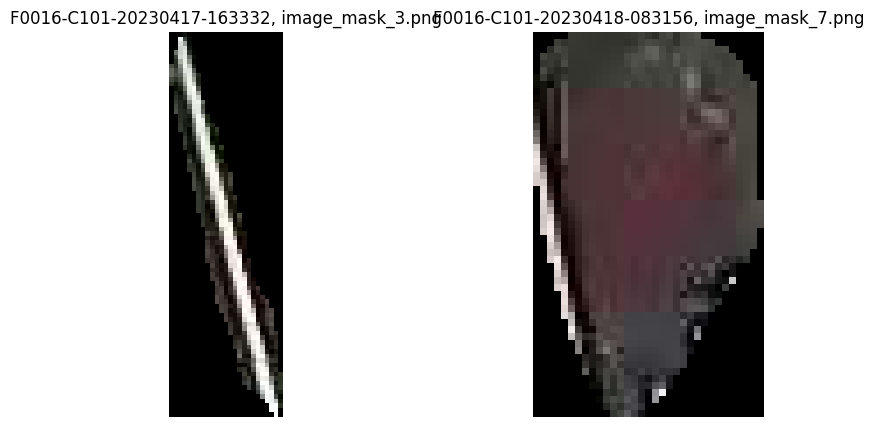

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                 F0016-C101-20230417-163332_12
mask_id                                 7203291068cda1f0824e10521b8a5b79
point_x_x                                                    1403.981689
point_y_x                                                     299.544464
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

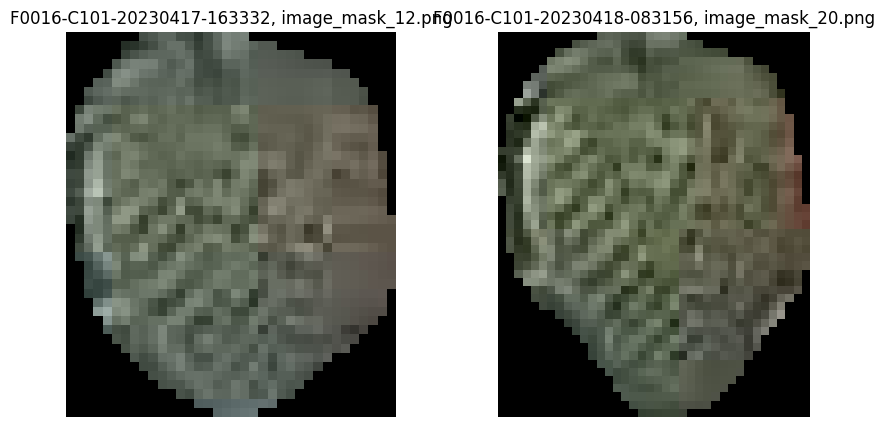

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_9
mask_id                                 7f558aa6e55675f21eb7ebb8c87a410e
point_x_x                                                    1196.299072
point_y_x                                                     221.413757
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

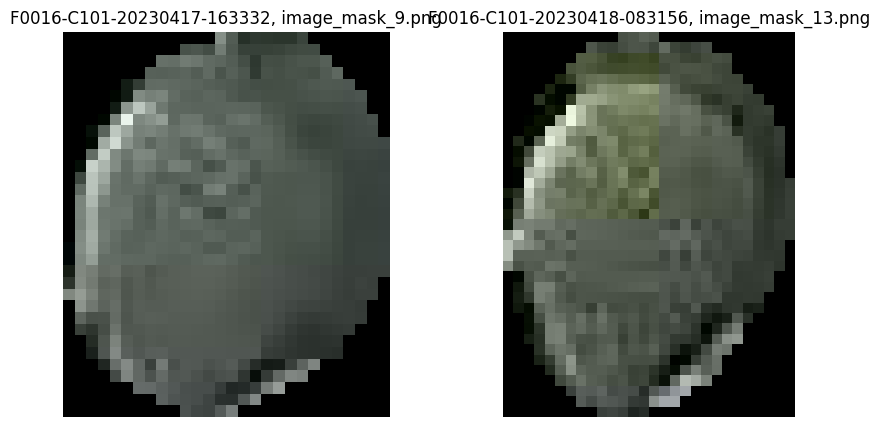

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                 F0016-C101-20230417-163332_15
mask_id                                 8948b7b7137253782df1785d7f8a7672
point_x_x                                                     1691.80188
point_y_x                                                      65.309525
output_image_path_x                                    image_mask_15.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

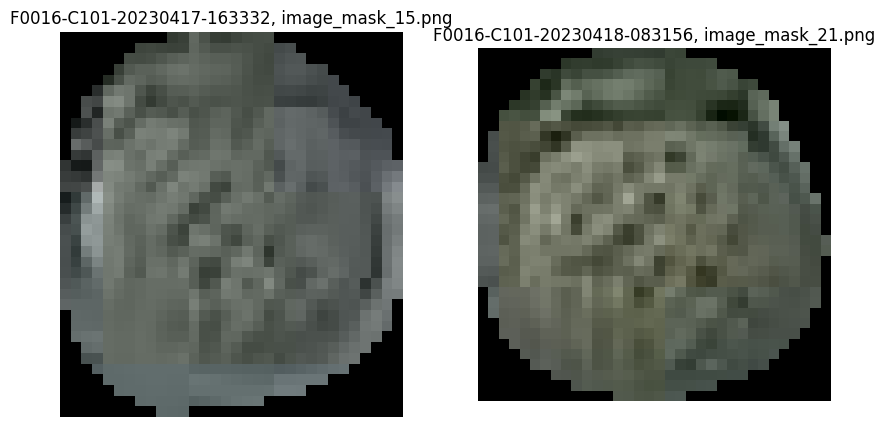

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                 F0016-C101-20230417-163332_13
mask_id                                 a0a0f007ac640d21c99cb6e556003851
point_x_x                                                    1293.829346
point_y_x                                                     250.507843
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

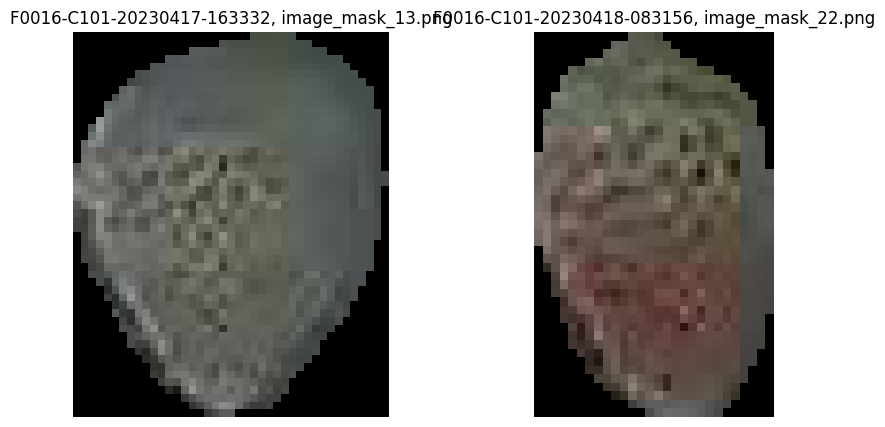

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_6
mask_id                                 bec8273482159df8969aa1267d3d27f6
point_x_x                                                     702.471741
point_y_x                                                     478.795807
output_image_path_x                                     image_mask_6.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

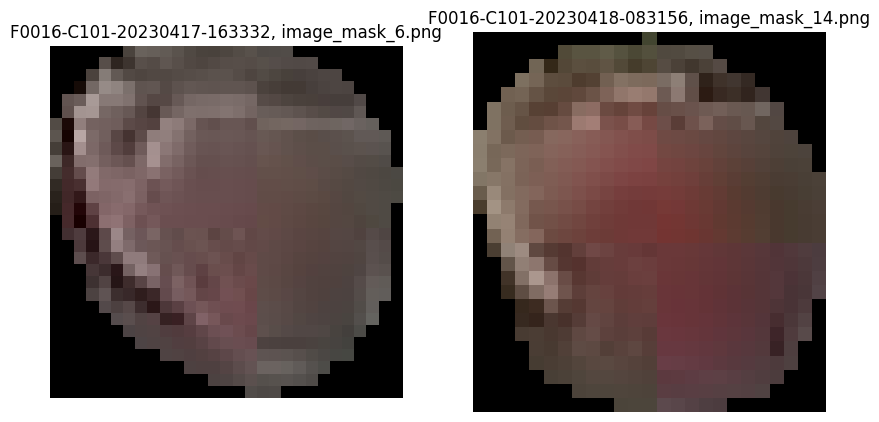

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                  F0016-C101-20230417-163332_7
mask_id                                 c18c721c3b33ef54a1ad6f77c60dcf36
point_x_x                                                    1215.642578
point_y_x                                                     261.928955
output_image_path_x                                     image_mask_7.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

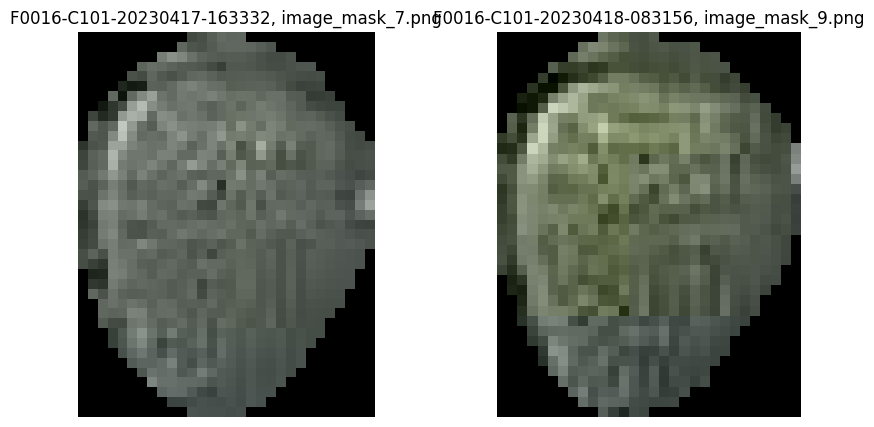

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230417-163332
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230417-123422
mask_num_x                                 F0016-C101-20230417-163332_10
mask_id                                 f3a01eafa3594ce63b20ca716acc3127
point_x_x                                                    1441.949219
point_y_x                                                     296.853729
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230418-083156
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

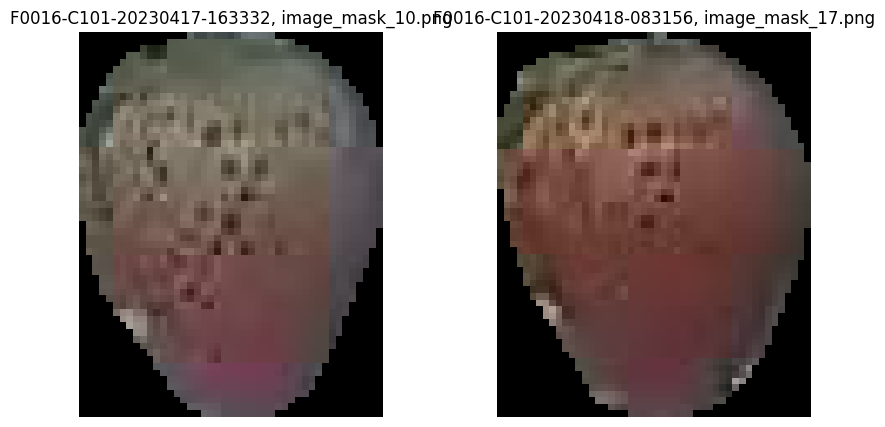

In [109]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = apr_2023[apr_2023["before_img_name"] == "F0016-C101-20230417-123422"]
aug2 = apr_2023[apr_2023["before_img_name"] == "F0016-C101-20230417-163332"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                  F0016-C101-20230424-163230_1
mask_id                                 23009ae8ad48e62140105297cf267171
point_x_x                                                      509.25946
point_y_x                                                     106.361816
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

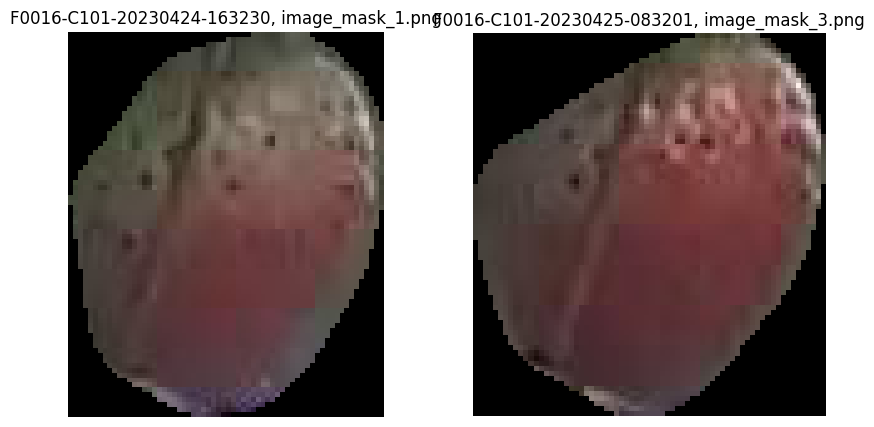

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_16
mask_id                                 41a8f91f1272668db471bb1b0954e314
point_x_x                                                    1327.504883
point_y_x                                                     278.576752
output_image_path_x                                    image_mask_16.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

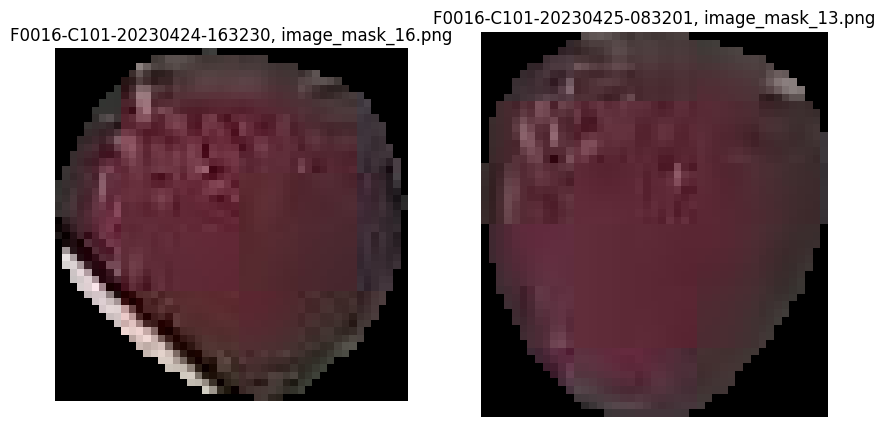

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_17
mask_id                                 4a483e5c3ce019b09af531759f4748fc
point_x_x                                                     1765.82605
point_y_x                                                      82.329262
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

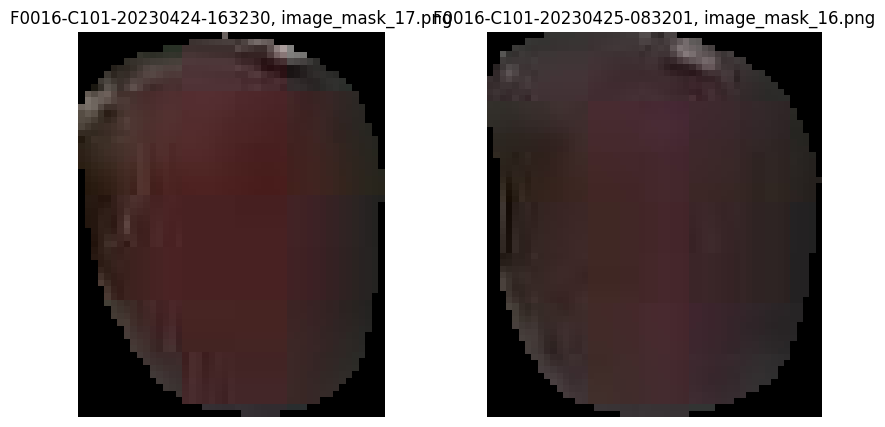

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_19
mask_id                                 5db5c644b8b840514917e0a9f1ce28a8
point_x_x                                                    1576.592163
point_y_x                                                     161.524933
output_image_path_x                                    image_mask_19.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

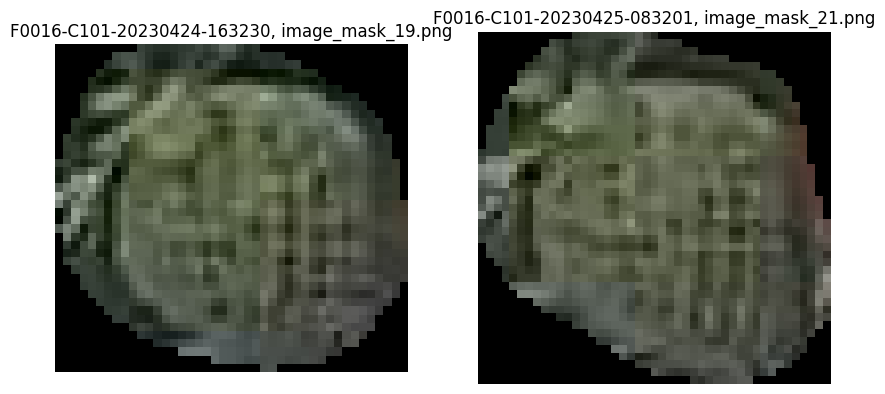

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_15
mask_id                                 63c09cbbb662f61afe675b72f96e905b
point_x_x                                                    1360.657715
point_y_x                                                     229.034317
output_image_path_x                                    image_mask_15.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

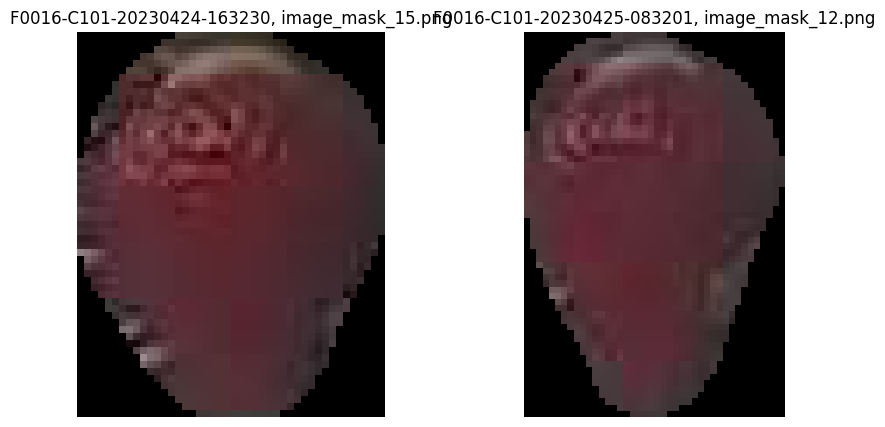

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_22
mask_id                                 68ee9999f7d27c3cbcb5ef5f0f9b1edf
point_x_x                                                    2033.548096
point_y_x                                                     136.727997
output_image_path_x                                    image_mask_22.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

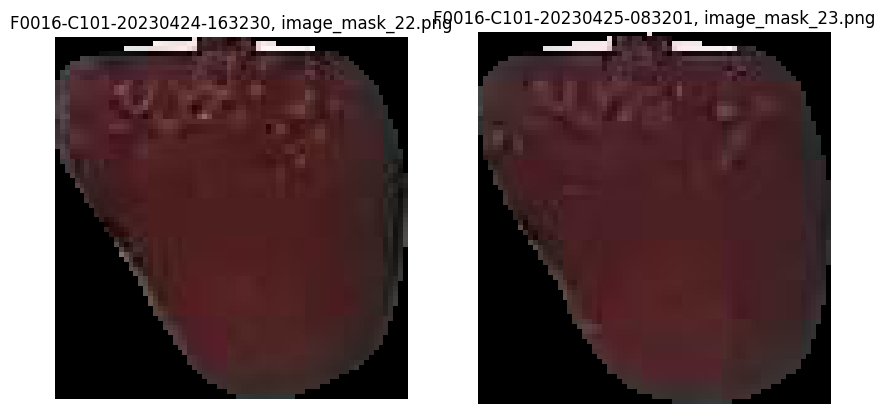

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_20
mask_id                                 7993c73f535bd410122a3082487c7310
point_x_x                                                    1422.371704
point_y_x                                                     310.279297
output_image_path_x                                    image_mask_20.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

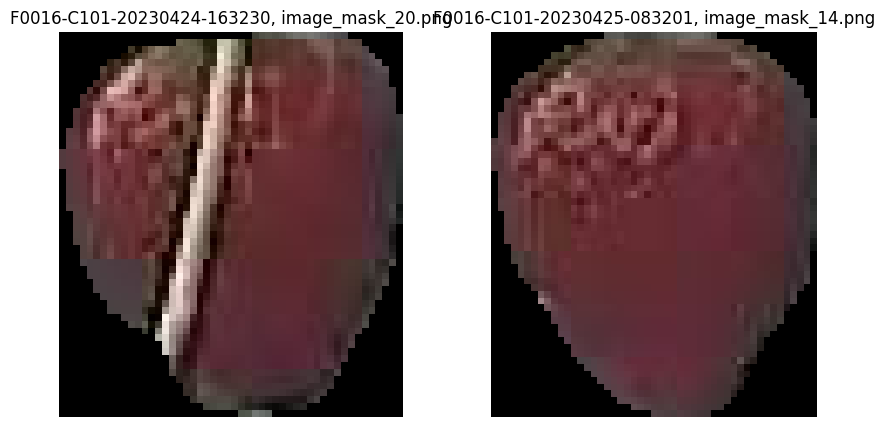

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_13
mask_id                                 88ba92cda0893b5118e520b84db17526
point_x_x                                                     685.074951
point_y_x                                                     483.203796
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

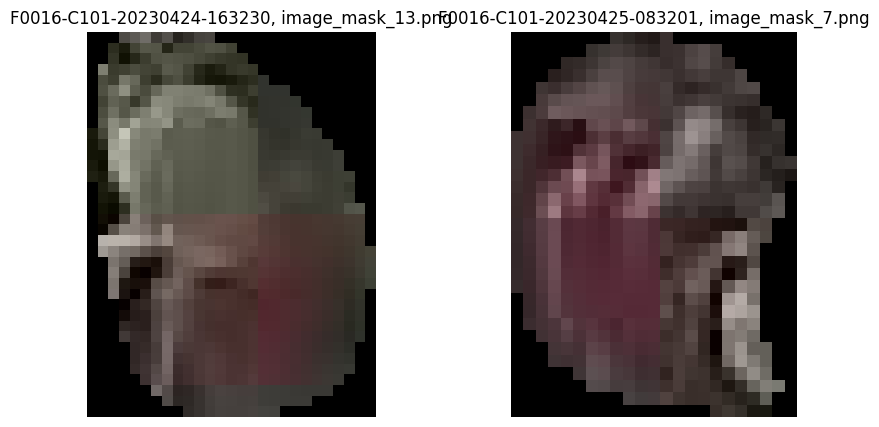

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_21
mask_id                                 8bde5804e6f478e6e89664e5447ab160
point_x_x                                                    1725.525635
point_y_x                                                      87.417564
output_image_path_x                                    image_mask_21.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

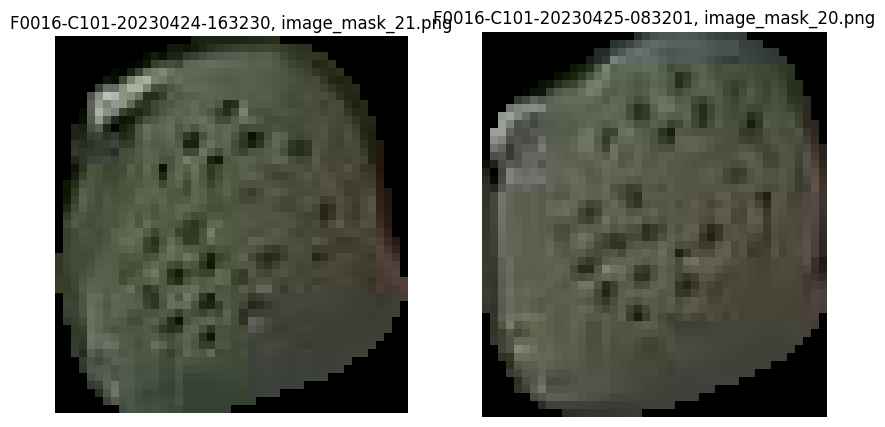

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_14
mask_id                                 b5298e6b69b09db6d3ba661e12d5da9e
point_x_x                                                    1626.721924
point_y_x                                                     174.808777
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

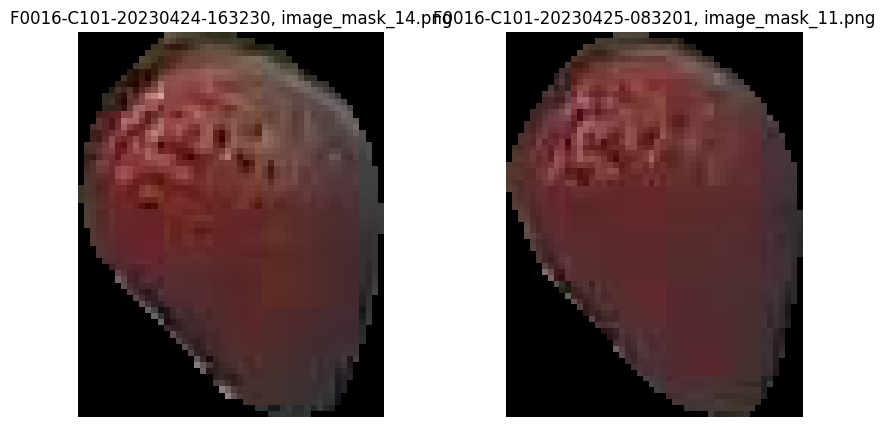

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_18
mask_id                                 b5773f2b276c901b0c666b46c8ab18fc
point_x_x                                                    1577.372559
point_y_x                                                     173.880951
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

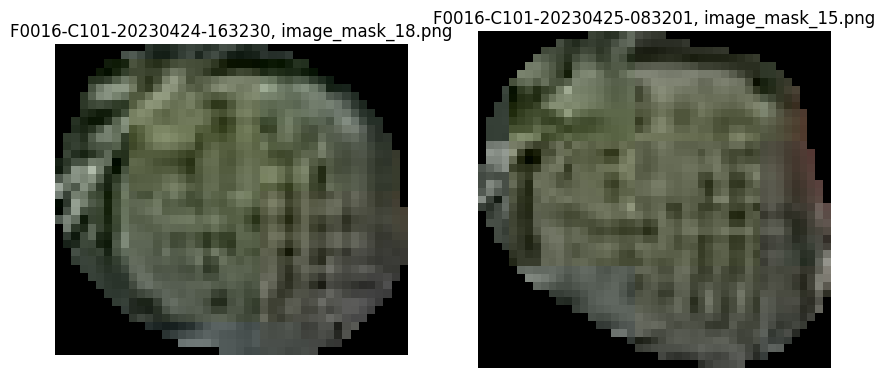

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                  F0016-C101-20230424-163230_2
mask_id                                 bad432cad0ff1b16f3e82ecae2708ad7
point_x_x                                                     931.284424
point_y_x                                                     400.883423
output_image_path_x                                     image_mask_2.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

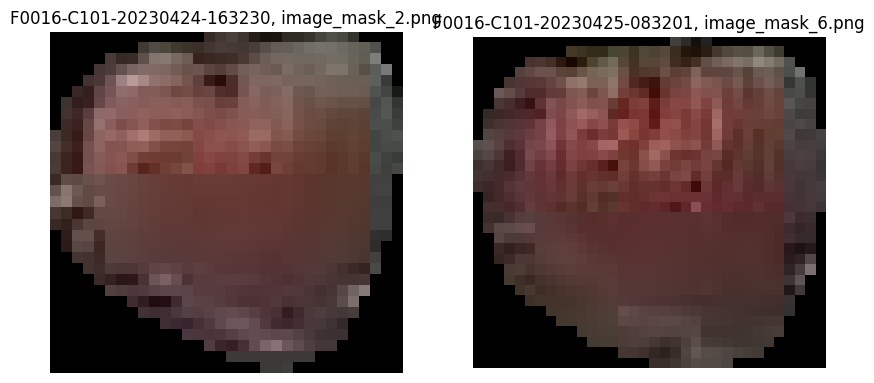

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                 F0016-C101-20230424-163230_23
mask_id                                 bca12b6be41a0155d74e9e3ca3a37263
point_x_x                                                    1973.075684
point_y_x                                                     153.271423
output_image_path_x                                    image_mask_23.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

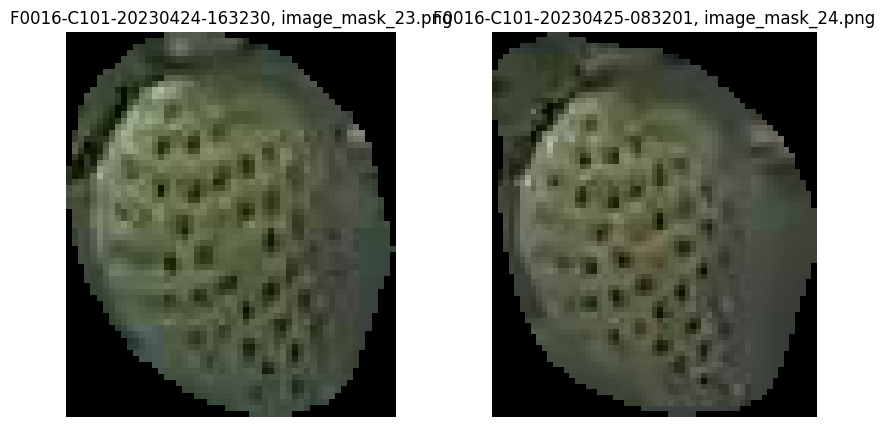

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230424-163230
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230424-123203
mask_num_x                                  F0016-C101-20230424-163230_3
mask_id                                 c8fd94ced7bc149af40dfbe83c257bfc
point_x_x                                                     820.280823
point_y_x                                                     465.326599
output_image_path_x                                     image_mask_3.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230425-083201
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

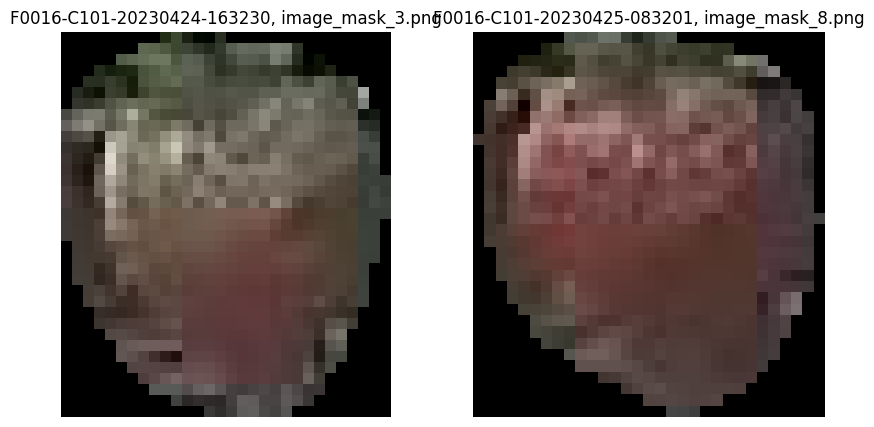

In [112]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = apr_2023[apr_2023["before_img_name"] == "F0016-C101-20230424-123203"]
aug2 = apr_2023[apr_2023["before_img_name"] == "F0016-C101-20230424-163230"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2023년 5월

In [113]:
### 2023년 5월에 해당하는 이미지 필터링
may_2023 = f0016[(f0016["측정년도"] == 2023) & (f0016["측정월"] == 5)]

# 측정 일자를 datetime으로 변환
may_2023["측정일자"] = pd.to_datetime(may_2023["측정일자"])

# 날짜 필터링
may_2023 = may_2023[(may_2023["측정일자"].dt.weekday == 0) | (may_2023["측정일자"].dt.weekday == 1) | (may_2023["측정일자"].dt.weekday == 2)]

may_2023['before_img_name'].unique()

/tmp/ipykernel_266549/220581031.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  may_2023["측정일자"] = pd.to_datetime(may_2023["측정일자"])


array(['F0016-C101-20230430-163253', 'F0016-C101-20230501-083324',
       'F0016-C101-20230501-123510', 'F0016-C101-20230501-163642',
       'F0016-C101-20230502-083652', 'F0016-C101-20230502-123709',
       'F0016-C101-20230502-163612', 'F0016-C101-20230503-083623',
       'F0016-C101-20230503-123509', 'F0016-C101-20230507-163715',
       'F0016-C101-20230508-083602', 'F0016-C101-20230508-123509',
       'F0016-C101-20230508-163500', 'F0016-C101-20230509-083501',
       'F0016-C101-20230509-123421', 'F0016-C101-20230509-163643',
       'F0016-C101-20230510-083548', 'F0016-C101-20230510-123559',
       'F0016-C101-20230514-163258', 'F0016-C101-20230515-163517'],
      dtype=object)

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_12
mask_id                                 02f913c6cf158d9ea2d66667bd434317
point_x_x                                                     669.244263
point_y_x                                                     447.934784
output_image_path_x                                    image_mask_12.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

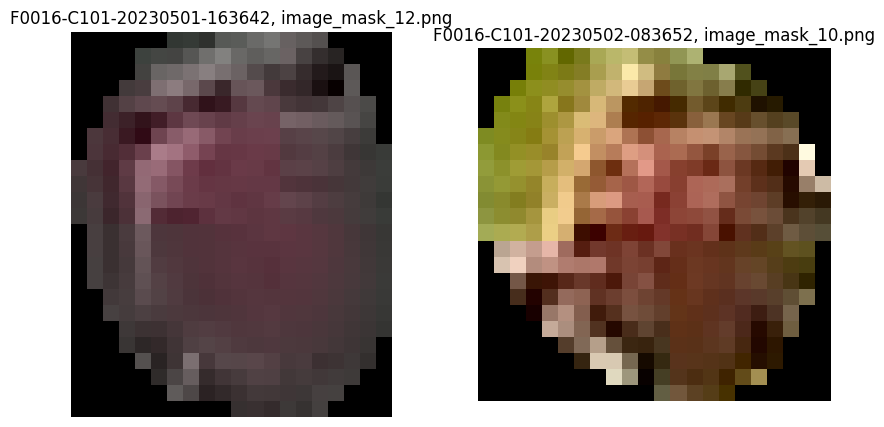

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_18
mask_id                                 03d71fdc5030cb0833f679847b5d228f
point_x_x                                                    1145.637939
point_y_x                                                     287.176056
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

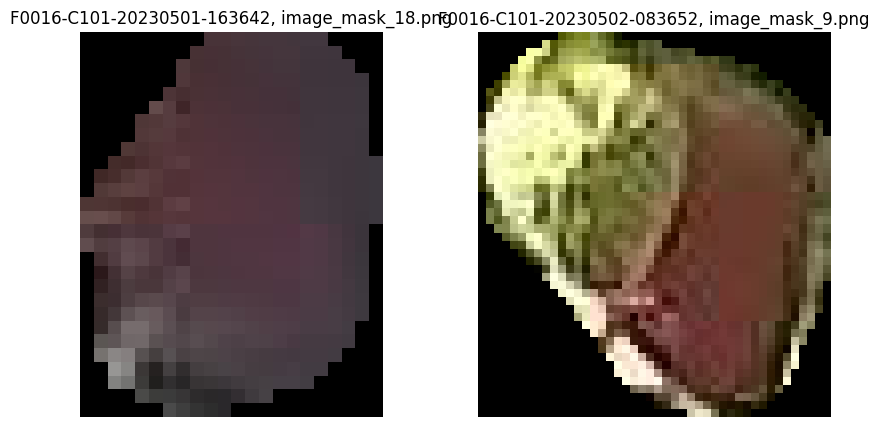

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_18
mask_id                                 03d71fdc5030cb0833f679847b5d228f
point_x_x                                                    1145.637939
point_y_x                                                     287.176056
output_image_path_x                                    image_mask_18.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

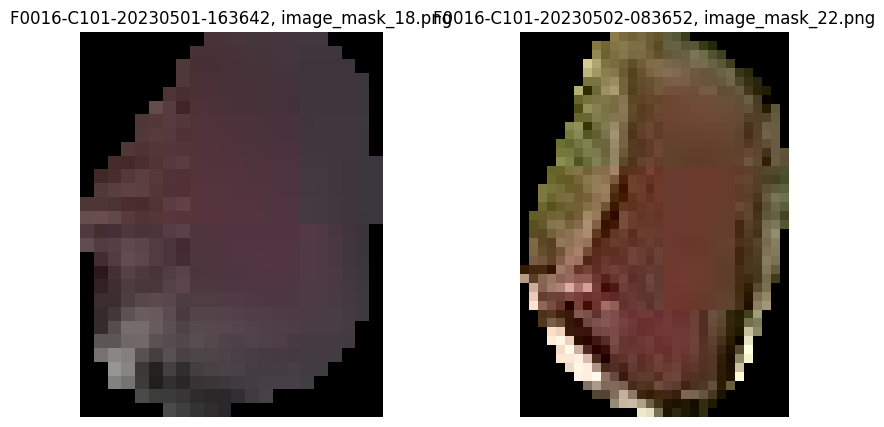

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_19
mask_id                                 03d71fdc5030cb0833f679847b5d228f
point_x_x                                                    1147.464111
point_y_x                                                     278.673859
output_image_path_x                                    image_mask_19.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

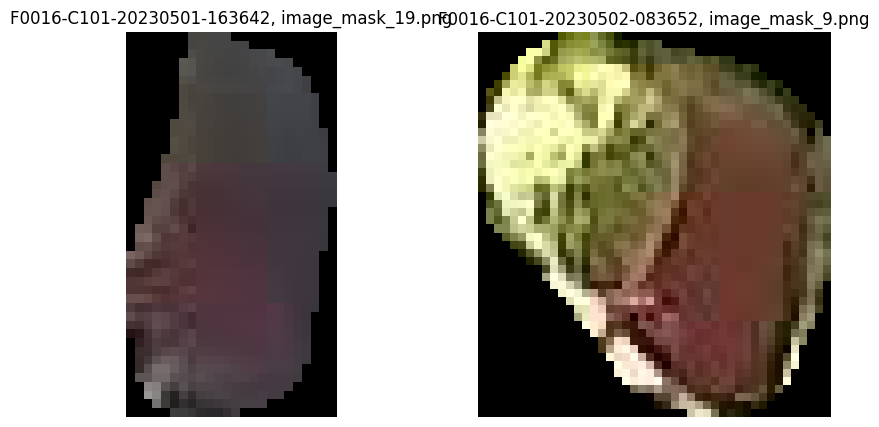

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_19
mask_id                                 03d71fdc5030cb0833f679847b5d228f
point_x_x                                                    1147.464111
point_y_x                                                     278.673859
output_image_path_x                                    image_mask_19.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

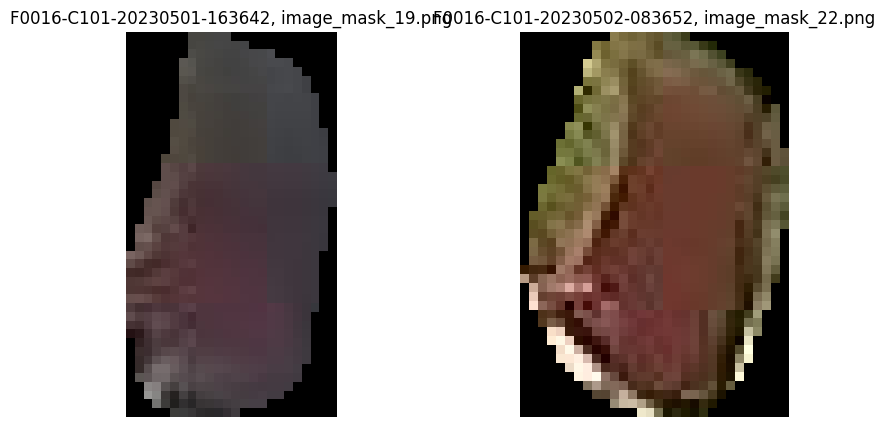

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_25
mask_id                                 066a1eef4d781f0b47e6f737f606c6ac
point_x_x                                                    1707.612305
point_y_x                                                       94.29274
output_image_path_x                                    image_mask_25.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

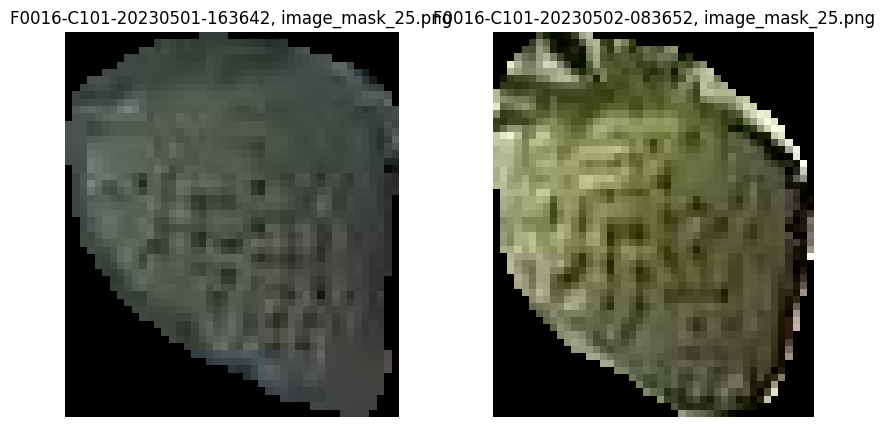

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                  F0016-C101-20230501-163642_9
mask_id                                 0b200ed0a5b30fe7244eebe7d7d8b4e0
point_x_x                                                    1095.856934
point_y_x                                                     344.784149
output_image_path_x                                     image_mask_9.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

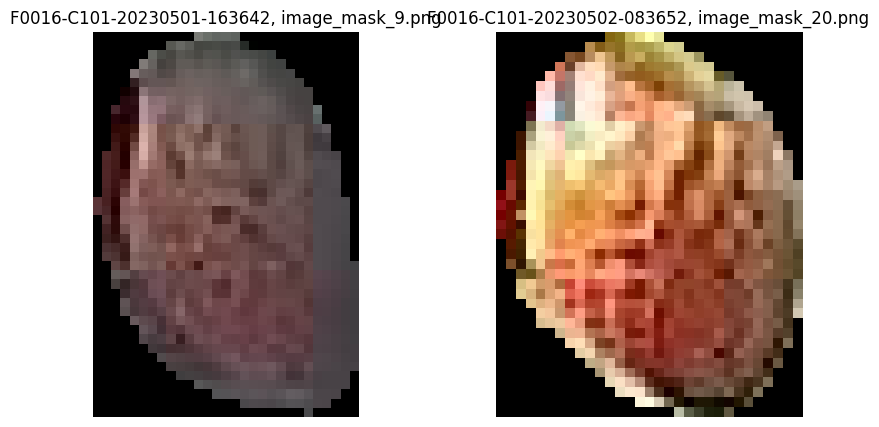

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                  F0016-C101-20230501-163642_8
mask_id                                 2300e09f2bc8f6e5768ebeb85b9486dc
point_x_x                                                     908.087402
point_y_x                                                     421.105042
output_image_path_x                                     image_mask_8.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

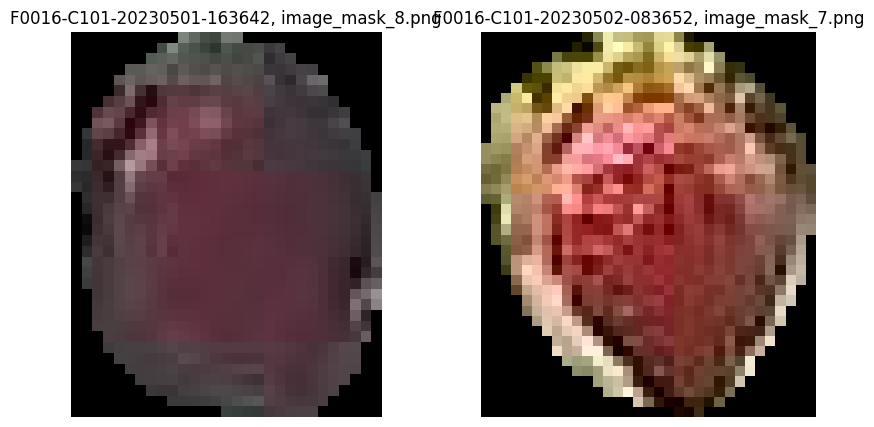

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_14
mask_id                                 365faac6c90d5b2c94bb437929e422a2
point_x_x                                                      856.18634
point_y_x                                                     428.936768
output_image_path_x                                    image_mask_14.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

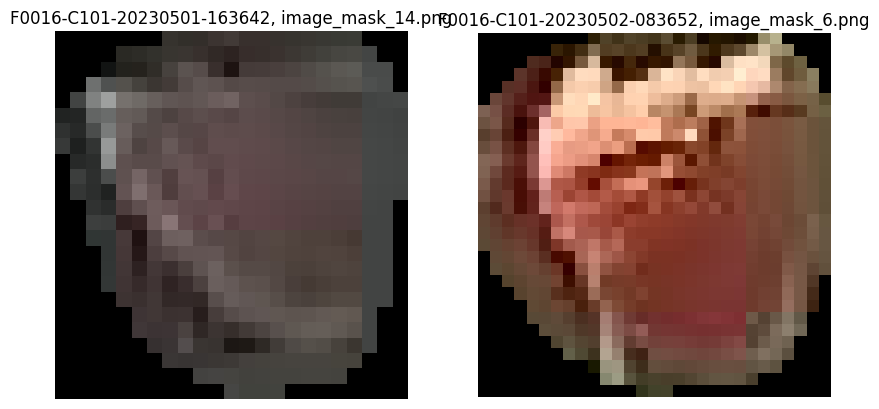

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_24
mask_id                                 440749fc5c8df4dc05f945188d01637c
point_x_x                                                    1860.467529
point_y_x                                                     496.380127
output_image_path_x                                    image_mask_24.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

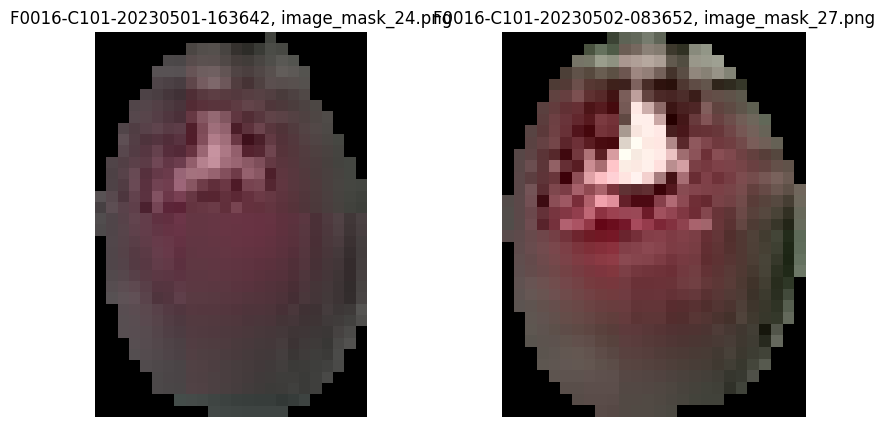

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_28
mask_id                                 72daa7c0e2b7c1b53b10056df886ec5f
point_x_x                                                    2269.103271
point_y_x                                                     151.724747
output_image_path_x                                    image_mask_28.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

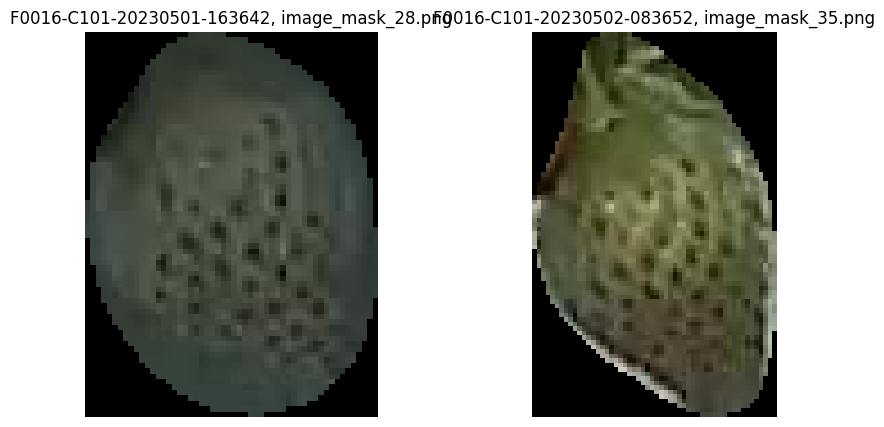

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_31
mask_id                                 72daa7c0e2b7c1b53b10056df886ec5f
point_x_x                                                    2269.246582
point_y_x                                                     160.850754
output_image_path_x                                    image_mask_31.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

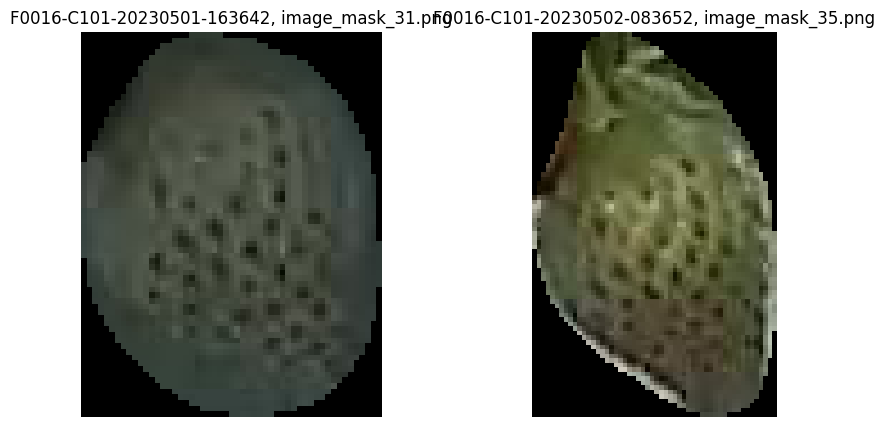

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_20
mask_id                                 7a29be654a41be88b33691e32feed145
point_x_x                                                    1567.810059
point_y_x                                                     163.290253
output_image_path_x                                    image_mask_20.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

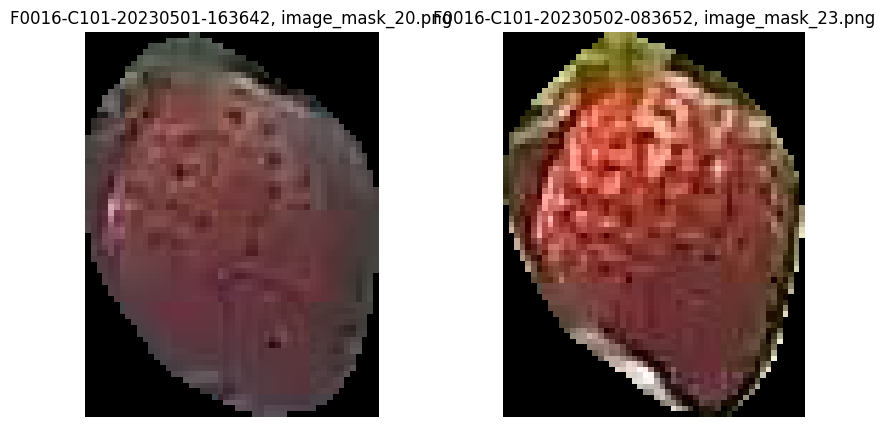

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_15
mask_id                                 88ba92cda0893b5118e520b84db17526
point_x_x                                                     696.104614
point_y_x                                                     504.276001
output_image_path_x                                    image_mask_15.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

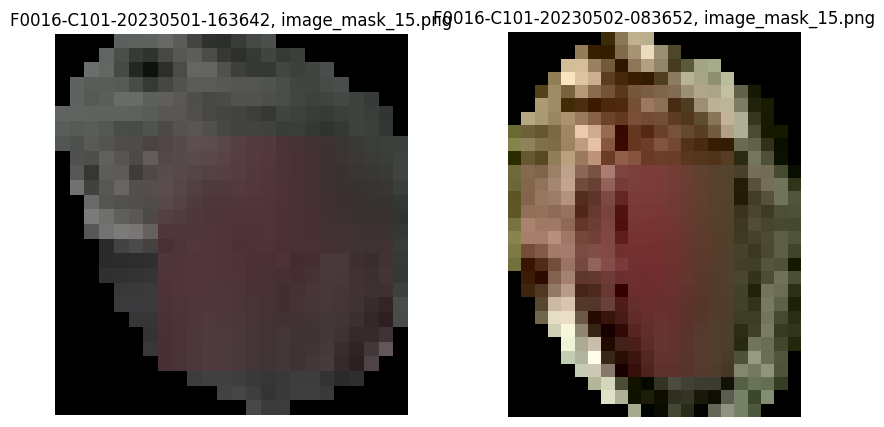

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                  F0016-C101-20230501-163642_1
mask_id                                 8a9bccf7c883f932ed50aa87e7983189
point_x_x                                                     500.958862
point_y_x                                                     177.437866
output_image_path_x                                     image_mask_1.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

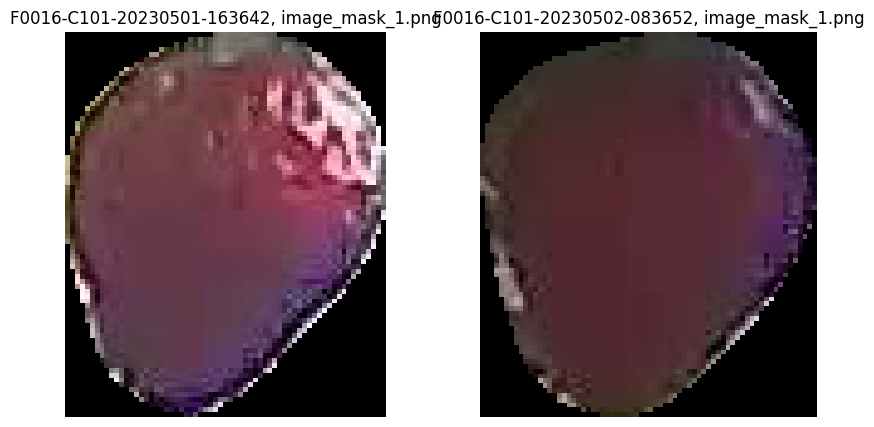

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_22
mask_id                                 8b84b42f2afadafbe0b8e78500085279
point_x_x                                                    1517.133545
point_y_x                                                     503.637146
output_image_path_x                                    image_mask_22.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

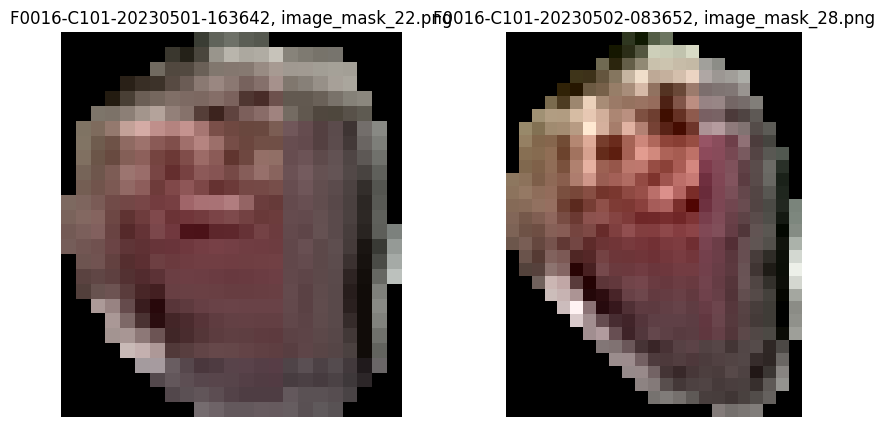

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_23
mask_id                                 8bde5804e6f478e6e89664e5447ab160
point_x_x                                                    1752.737183
point_y_x                                                     110.401817
output_image_path_x                                    image_mask_23.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

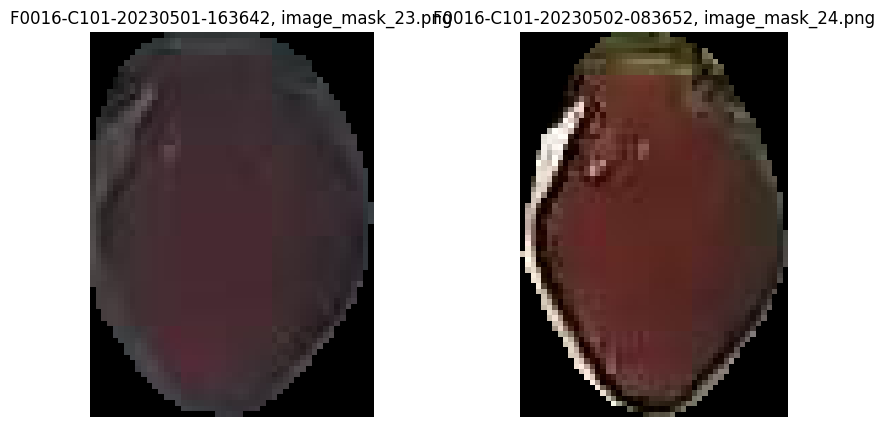

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_17
mask_id                                 90a3e45ac721038396b9eba0581c2b9d
point_x_x                                                    1132.936401
point_y_x                                                      266.68811
output_image_path_x                                    image_mask_17.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

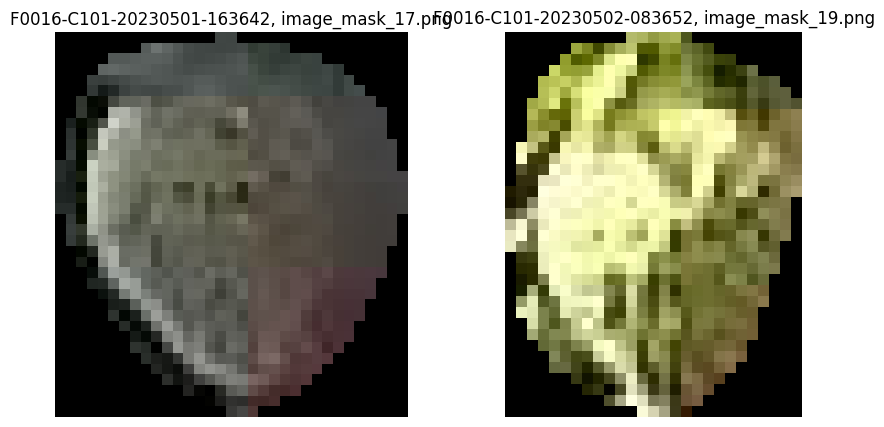

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_11
mask_id                                 a221d145e347888a2ba18178a6618763
point_x_x                                                    1217.296387
point_y_x                                                     293.191803
output_image_path_x                                    image_mask_11.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

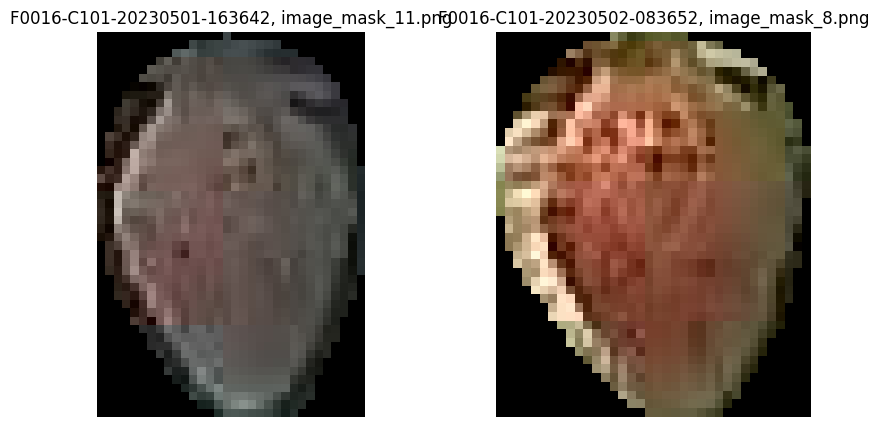

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_27
mask_id                                 aeeb00ba0490c7087179a57b92384218
point_x_x                                                    2223.404785
point_y_x                                                     114.349777
output_image_path_x                                    image_mask_27.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

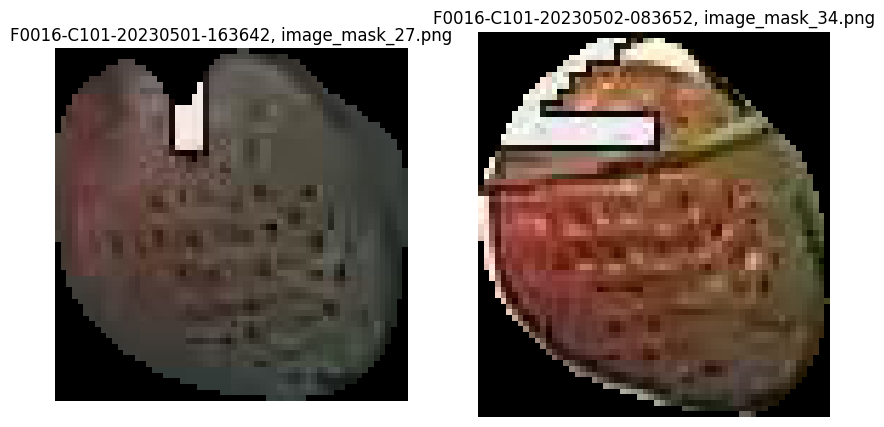

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_13
mask_id                                 ba68da91dea457857c64e5947b887b0e
point_x_x                                                      820.33728
point_y_x                                                      434.16272
output_image_path_x                                    image_mask_13.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

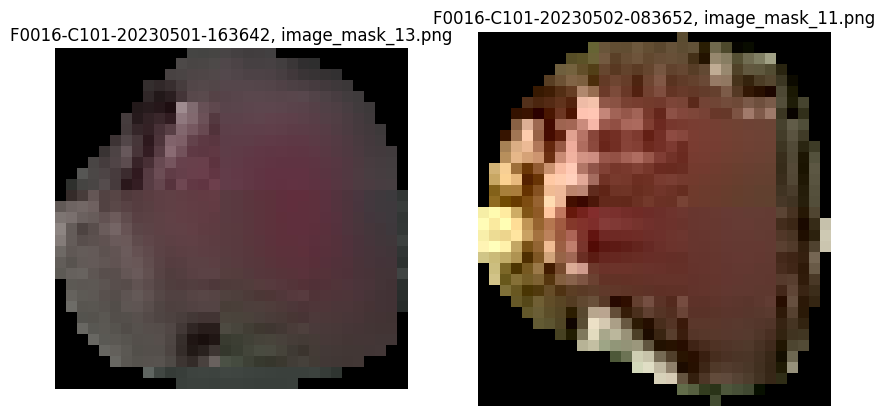

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_21
mask_id                                 c322f59f0725289efaa96669bfc263e9
point_x_x                                                    1451.450195
point_y_x                                                     491.970703
output_image_path_x                                    image_mask_21.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

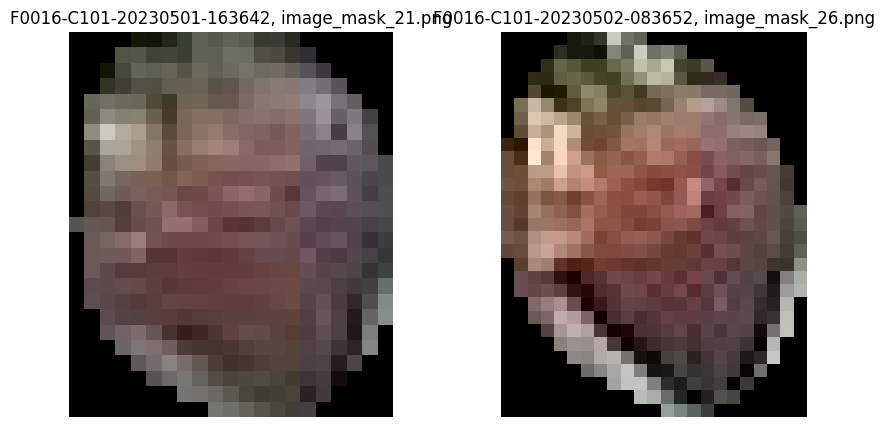

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_10
mask_id                                 c473cab1d41ffabd731fff45c182cb66
point_x_x                                                    1073.233765
point_y_x                                                     327.825592
output_image_path_x                                    image_mask_10.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

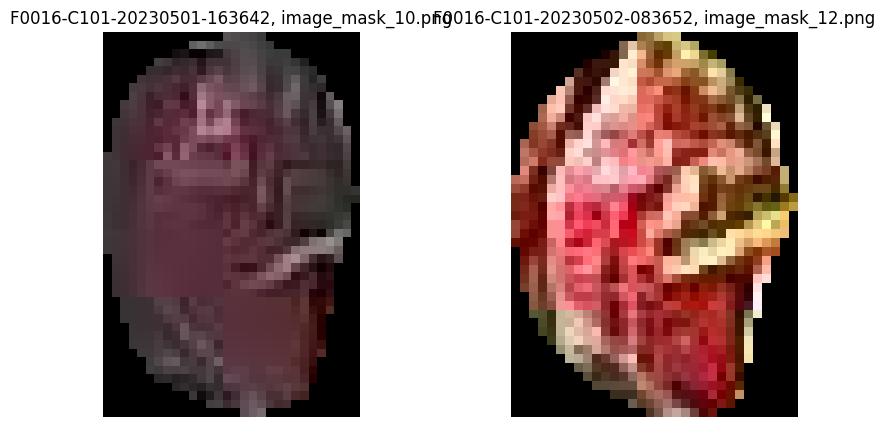

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_30
mask_id                                 e4e10e9bae3e82e5d40be9f890f1d221
point_x_x                                                    2276.975098
point_y_x                                                      22.491938
output_image_path_x                                    image_mask_30.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

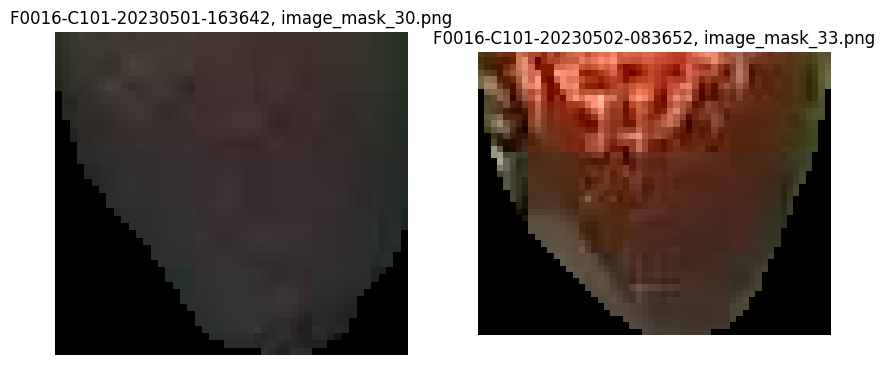

farm_code_x                                                        F0016
input_image_name_x                            F0016-C101-20230501-163642
input_image_path_x     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_x                                                         C101
before_img_name_x                             F0016-C101-20230501-123510
mask_num_x                                 F0016-C101-20230501-163642_29
mask_id                                 e9ac55dbc8d129dff2a8943da3f4533b
point_x_x                                                    1941.368164
point_y_x                                                     105.533882
output_image_path_x                                    image_mask_29.png
farm_code_y                                                        F0016
input_image_name_y                            F0016-C101-20230502-083652
input_image_path_y     /home/ubuntu/drive/dataset/plant/F0016/C101/F0...
area_code_y                                        

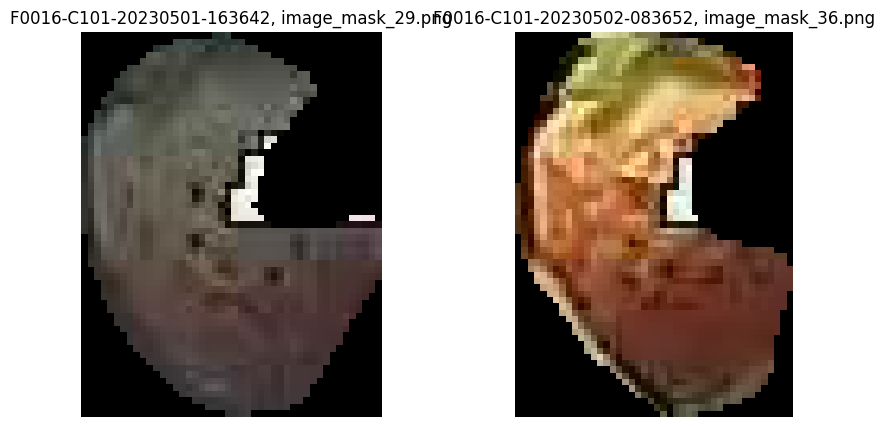

In [115]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = may_2023[may_2023["before_img_name"] == "F0016-C101-20230501-123510"]
aug2 = may_2023[may_2023["before_img_name"] == "F0016-C101-20230501-163642"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

In [120]:
### 전후 딸기 매핑이 잘 되었는지 확인하기 위한 데이터 추출
aug1 = fab_2023[fab_2023["before_img_name"] == "'F0016-C101-20230502-083652"]
aug2 = fab_2023[fab_2023["before_img_name"] == "F0016-C101-20230502-123709"]

nov0506 = pd.merge(aug1, aug2, on="mask_id", how="outer")
nov0506.drop(['check_datetime_x', '측정일자_x', '내부온도_x',
       '내부습도_x', '내부CO2_x', '근권온도_x', '내부순간일사량_x', '측정년도_x', '측정월_x',
       'img_id_x', "구역명_x", 
       'shot_datetime_x', 'count_masks_x', 'bbox_image_path_x',
       'before_img_id_x', 'size_x', 'color_x',
       'check_datetime_y', '측정일자_y', '내부온도_y',
       '내부습도_y', '내부CO2_y', '근권온도_y', '내부순간일사량_y', '측정년도_y', '측정월_y',
       'img_id_y', "구역명_y", 
       'shot_datetime_y', 'count_masks_y', 'bbox_image_path_y',
       'size_y', 'color_y',], axis=1, inplace=True)

def visualize_mask(df_row, base_folder):
    input_img_name_x = df_row['input_image_name_x']  # 이미지 파일명 가져오기
    input_img_name_y = df_row["input_image_name_y"]

    farm_code_x = df_row["farm_code_x"]
    farm_code_y = df_row["farm_code_y"]
    
    area_code_x = df_row["area_code_x"]
    area_code_y = df_row["area_code_y"]
    
    
    mask_id_x = df_row['output_image_path_x']  # Mask ID 가져오기
    mask_id_y = df_row["output_image_path_y"]
    
    base_folder_x = base_folder + farm_code_x + "/" + area_code_x + "/" + input_img_name_x + "/masks/"
    base_folder_y = base_folder + farm_code_y + "/" + area_code_y + "/" + input_img_name_y + "/masks/"

    # 이미지 파일 경로 생성
    mask_path_x = os.path.join(base_folder_x, mask_id_x)
    mask_path_y = os.path.join(base_folder_y, mask_id_y)

    # 이미지 및 마스크 불러오기
    mask_x = cv2.imread(mask_path_x)
    mask_y = cv2.imread(mask_path_y)

    # 이미지 및 마스크 시각화
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(mask_x, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_x}, {mask_id_x}')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(mask_y, cv2.COLOR_BGR2RGB))
    plt.title(f'{input_img_name_y}, {mask_id_y}')
    plt.axis('off')

    plt.show()

# 이미지가 저장된 폴더 경로 설정
base_folder = "/home/ubuntu/drive/dataset/SAM_result/"

# 각 행에 대해 visualize_mask 함수 호출
for index, row in nov0506.iterrows():
    if (row["input_image_name_x"] is not np.nan) & (row["input_image_name_y"] is not np.nan):
        print(row)
        print("-"*30)   
        visualize_mask(row, base_folder)

### 2023년 6월

In [114]:
### 2023년 6월에 해당하는 이미지 필터링
jun_2022 = f0016[(f0016["측정년도"] == 2023) & (f0016["측정월"] == 6)]

# 측정 일자를 datetime으로 변환
jun_2022["측정일자"] = pd.to_datetime(aug_2022["측정일자"])

# 날짜 필터링
jun_2022 = jun_2022[(jun_2022["측정일자"].dt.weekday == 0) | (jun_2022["측정일자"].dt.weekday == 1) | (jun_2022["측정일자"].dt.weekday == 2)]

jun_2022['before_img_name'].unique()

/tmp/ipykernel_266549/2243971520.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jun_2022["측정일자"] = pd.to_datetime(aug_2022["측정일자"])


array([nan], dtype=object)